In [1]:
import sys
sys.path.append('/home/xinyiz/pamrats')

In [2]:
##This is adapted from https://github.com/tkipf/gae/blob/master/gae/train.py and https://github.com/tkipf/pygcn/blob/master/pygcn/train.py##

import time
import os

# Train on CPU (hide GPU) due to memory constraints
# os.environ['CUDA_VISIBLE_DEVICES'] = ""

import scanpy
import numpy as np
import scipy.sparse as sp

import torch
from torch import optim
from torch.utils.data import DataLoader
# from sklearn.metrics import roc_auc_score
# from sklearn.metrics import average_precision_score

import image.loadImage as loadImage
import gae.gae.optimizer as optimizer
import image.modelsCNN as modelsCNN

import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.colors

In [3]:
# Settings
os.environ["CUDA_VISIBLE_DEVICES"] = "0" 
use_cuda=True
fastmode=False #Validate during training pass
seed=3
epochs=2000
saveFreq=10
lr=0.0001 #initial learning rate
lr_adv=0.001
weight_decay=0 #Weight for L2 loss on embedding matrix.

batchsize=16

dropout=0.01
testNodes=0.1 #fraction of total nodes for testing
valNodes=0.05 #fraction of total nodes for validation
# randFeatureSubset=None
model_str='alexnet_regrs'

kernel_size=4
stride=2
padding=1

hidden1=64 #Number of channels in hidden layer 1
hidden2=128 
hidden3=256
hidden4=512
hidden5=512
fc_dim1=512*25*25
fc_dim2=1024

pretrainedAE=None #{'name':'controlphy5XAbin_01_dca','epoch':9990}
# training_samples=['control13','disease13','disease8','control8']
training_samples=['disease13']
targetBatch=None
switchFreq=1
diamThresh_mul=800
minThresh_mul=12
overlap=int(diamThresh_mul*0.7)
areaThresh=diamThresh_mul*diamThresh_mul*0.7
plaqueMaskName='PlaqueMask'
plaqueMaskImg='Maskofplaque.tif'
minPt=0
minImgTrain=100
# valEarlyStop=100 not implemented
name='disease13regrsCluster_thresh25min12_overlap70area70_01'
logsavepath='/mnt/external_ssd/xinyi/log/train_cnnRegrsByCluster_starmap/'+name
modelsavepath='/mnt/external_ssd/xinyi/models/train_cnnRegrsByCluster_starmap/'+name
plotsavepath='/mnt/external_ssd/xinyi/plots/train_cnnRegrsByCluster_starmap/'+name

#Load data
sampleidx={'disease13':'AD_mouse9494','control13':'AD_mouse9498','disease8':'AD_mouse9723','control8':'AD_mouse9735'}
datadir='/home/xinyiz/2021-01-13-mAD-test-dataset'

# Set cuda and seed
np.random.seed(seed)
if use_cuda and (not torch.cuda.is_available()):
    print('cuda not available')
    use_cuda=False
torch.manual_seed(seed)
if use_cuda:
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.enabled = True

# Load data
# if randFeatureSubset != None:
#     idx=np.random.choice(features.shape[1],randFeatureSubset,replace=False)
#     features=features[:,idx]


In [4]:
plaqueCentroids={}
plaqueCentroids['disease13']=pd.read_csv('/home/xinyiz/2021-01-13-mAD-test-dataset/AD_mouse9494/trimmed_images/'+plaqueMaskName+'.csv', header=0)
plaqueCentroids['disease8']=pd.read_csv('/home/xinyiz/2021-01-13-mAD-test-dataset/AD_mouse9723/trimmed_images/'+plaqueMaskName+'.csv', header=0)
maxArea=max(np.max(plaqueCentroids['disease13']['Area']),np.max(plaqueCentroids['disease8']['Area']))
plaqueCutoffRadius=max(int(np.sqrt(maxArea)/2),int(diamThresh_mul/2))
# plaqueSizeFactor=maxArea/100
plaqueSizeFactor=1

In [5]:
maxArea

91098

In [6]:
np.mean(plaqueCentroids['disease13']['Area'])

11594.583148558759

In [7]:
if not os.path.exists(logsavepath):
    os.mkdir(logsavepath)
if not os.path.exists(modelsavepath):
    os.mkdir(modelsavepath)
if not os.path.exists(plotsavepath):
    os.mkdir(plotsavepath)

In [5]:
gaeClusterPath='/mnt/external_ssd/xinyi/plots/train_gae_starmap/allk20XA_02_dca_over/combinedlogminmax_beforeAct/cluster/leiden_nn10mdist025n_pcs40res0.1epoch9990'
with open(gaeClusterPath, 'rb') as input:
    gaeclusterlabels = pickle.load(input)

plot_samples={'disease13':'AD_mouse9494','control13':'AD_mouse9498','disease8':'AD_mouse9723','control8':'AD_mouse9735'}

gaeCoord=None
sampleNames=None
scaleddata=scanpy.read_h5ad(datadir+'/2020-12-27-starmap-mAD-raw.h5ad')
for s in plot_samples.keys():
    sampleidx_s=plot_samples[s] 
    if gaeCoord is None:
        gaeCoord=scaleddata.obs.loc[scaleddata.obs['sample']==sampleidx_s,['y','x']].to_numpy()
        sampleNames=np.repeat(s,np.sum(scaleddata.obs['sample']==sampleidx_s))
    else:
        gaeCoord=np.concatenate((gaeCoord,scaleddata.obs.loc[scaleddata.obs['sample']==sampleidx_s,['y','x']].to_numpy()),axis=0)
        sampleNames=np.concatenate((sampleNames,np.repeat(s,np.sum(scaleddata.obs['sample']==sampleidx_s))),axis=None)
gaeCoord=gaeCoord/0.3
scaleddata=None

In [9]:
s=training_samples[0]
trainInputAll, valInputAll, _,trainLabelsAll,valLabelsAll,_,_,_,_,trainClusterAll,valClusterAll,_=loadImage.loadandsplitPlaque_overlap_regrs_cellCluster(gaeclusterlabels[sampleNames==s],gaeCoord[sampleNames==s],minPt,plaqueMaskImg,plaqueSizeFactor,areaThresh,plaqueCentroids[s][['Y','X']].to_numpy().astype(int),plaqueCutoffRadius,sampleidx[s],datadir,diamThresh_mul,overlap,valNodes,testNodes,ifFlip=False,minCutoff=minThresh_mul,seed=seed,returnPos=True)
_=None

#all_thresh25min12_overlap70area70_04_shuffled only
trainInputAll=trainInputAll.astype('float32')
valInputAll=valInputAll.astype('float32')
for sidx in range(1,len(training_samples)):
    s=training_samples[sidx]
    if 'disease' in s:
        inputlist=loadImage.loadandsplitPlaque_overlap_regrs_cellCluster(gaeclusterlabels[sampleNames==s],gaeCoord[sampleNames==s],minPt,plaqueMaskImg,plaqueSizeFactor,areaThresh,plaqueCentroids[s][['Y','X']].to_numpy().astype(int),plaqueCutoffRadius,sampleidx[s],datadir,diamThresh_mul,overlap,valNodes,testNodes,ifFlip=False,minCutoff=minThresh_mul,seed=seed,returnPos=True)
    if 'control' in s:
        inputlist=loadImage.loadandsplit_cellCluster(gaeclusterlabels[sampleNames==s],gaeCoord[sampleNames==s],minPt,sampleidx[s],datadir,diamThresh_mul,overlap,valNodes,testNodes,ifFlip=False,minCutoff=minThresh_mul,seed=seed,clf=True,returnPos=True)
    trainInputAll=np.concatenate((trainInputAll,inputlist[0].astype('float32')),axis=0)
    valInputAll=np.concatenate((valInputAll,inputlist[1].astype('float32')),axis=0)
    trainLabelsAll=np.concatenate((trainLabelsAll,inputlist[3]),axis=0)
    valLabelsAll=np.concatenate((valLabelsAll,inputlist[4]),axis=0)
    trainClusterAll=np.concatenate((trainClusterAll,inputlist[9]),axis=0)
    valClusterAll=np.concatenate((valClusterAll,inputlist[10]),axis=0)
inputlist=None


(22210, 22344)
no cells
no cells
no cells
plaque1954
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no plaque2420


In [14]:
# model.load_state_dict(torch.load(os.path.join(modelsavepath,str(9360)+'.pt')))
# epochs=20000
if pretrainedAE:
    print('loading '+pretrainedAE['name']+' epoch '+str(pretrainedAE['epoch']))
    model.load_state_dict(torch.load(os.path.join('/mnt/xinyi/pamrats/models/train_gae_starmap/'+pretrainedAE['name'],str(pretrainedAE['epoch'])+'.pt')))
    
def train(epoch):
    t = time.time()
    model.train()
    
    loss_all=0
    for i in range(int(np.ceil(trainInputnp.shape[0]/batchsize))):
        trainIdx=sampleIdx[i*batchsize:min((i+1)*batchsize,trainInputnp.shape[0])]
        
        trainInput=trainInputnp[trainIdx]
        labels=trainLabelsnp[trainIdx]
        if use_cuda:
            trainInput=torch.tensor(trainInput).cuda().float()
            labels=torch.tensor(labels).cuda().float()
        optimizer.zero_grad()

        pred = model(trainInput)

        if 'regrs' in model_str:
            weight_curr=torch.where(labels==0,negweight,posweight)
            loss=torch.mean(lossCE(pred.flatten(),labels)*weight_curr)
            loss_all+=loss.item()
        else:
            loss=lossCE(pred,labels)
            loss_all+=loss.item()
        if i==0:
            print(pred.flatten())
            print(labels)
        loss.backward()
        optimizer.step()

#     print(pred.flatten())
#     print(labels)
    loss_all=loss_all/int(np.ceil(trainInputnp.shape[0]/batchsize))
    
    model.eval()
    loss_val_all=0
    for i in range(int(np.ceil(valInputnp.shape[0]/batchsize))):
        valInput=valInputnp[i*batchsize:min((i+1)*batchsize,valInputnp.shape[0])]
        labels=valLabelsnp[i*batchsize:min((i+1)*batchsize,valInputnp.shape[0])]
        if use_cuda:
            valInput=torch.tensor(valInput).cuda().float()
            labels=torch.tensor(labels).cuda().long()
        pred = model(valInput)

        if 'regrs' in model_str:
            weight_curr=torch.where(labels==0,negweight,posweight)
            loss_val_all+=torch.mean(lossCE(pred.flatten(),labels)*weight_curr).item()
        else:
            loss_val_all+=lossCE(pred,labels).item()
        if i==0:
            print(pred.flatten())
            print(labels)
        
#     print(pred.flatten())
#     print(labels)
    loss_val_all=loss_val_all/int(np.ceil(valInputnp.shape[0]/batchsize))
    
    print('Epoch: {:04d}'.format(epoch),
          'loss_train: {:.4f}'.format(loss_all),
          'loss_val: {:.4f}'.format(loss_val_all))
    return loss_all,loss_val_all

train_loss_all={}
val_loss_all={}
t_ep=time.time()

for c in np.unique(trainClusterAll):
    cidx=trainClusterAll==c
    if np.sum(cidx)<minImgTrain:
        print('not enough image for cluster '+str(c))
        continue
    print('cluster '+str(c))
    trainInputnp=trainInputAll[cidx]
    trainLabelsnp=trainLabelsAll[cidx]
    valInputnp=valInputAll[valClusterAll==c]
    valLabelsnp=valLabelsAll[valClusterAll==c]
    
    npos=0
    nneg=0
    npos=np.sum(trainLabelsnp!=0)
    nneg=trainLabelsnp.shape[0]-npos
    print(npos)
    print(nneg)
    if npos==0 or nneg==0:
        print('skipped')
    
    negweight=(nneg+npos)/nneg
    posweight=(nneg+npos)/npos
    
    # Create model
    if model_str=='alexnet':
        model = modelsCNN.AlexNet(2)
        lossCE=torch.nn.CrossEntropyLoss(torch.tensor([negweight,posweight]).cuda().float())
    if model_str=='alexnet_regrs':
        model = modelsCNN.AlexNet(1,regrs=True)
        lossCE=torch.nn.MSELoss(reduction='none')
    if use_cuda:
        model.cuda()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    train_loss_all[str(c)]=[None]*epochs
    val_loss_all[str(c)]=[None]*epochs
    
    modelsavepath_c=os.path.join(modelsavepath,str(c))
    if not os.path.exists(modelsavepath_c):
        os.mkdir(modelsavepath_c)
        
    
    sampleIdx=np.arange(trainInputnp.shape[0])
    np.random.shuffle(sampleIdx)
    for ep in range(epochs):
    # for ep in range(10000,20000):

        train_loss_all[str(c)][ep],val_loss_all[str(c)][ep]=train(ep)


        if ep%saveFreq == 0:
            torch.save(model.cpu().state_dict(), os.path.join(modelsavepath_c,str(ep)+'.pt'))
        if use_cuda:
            model.cuda()
            torch.cuda.empty_cache()
    print(' total time: {:.4f}s'.format(time.time() - t_ep))


cluster 0.0
206
215
tensor([0.0104, 0.0114, 0.0129, 0.0094, 0.0090, 0.0064, 0.0118, 0.0087, 0.0101,
        0.0130, 0.0050, 0.0137, 0.0094, 0.0120, 0.0162, 0.0136],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([158.8695, 178.1801, 110.9582, 117.2145, 139.4892, 156.4883, 146.3504,
        151.7621, 134.9828, 136.9414, 144.9537, 145.9794, 155.4243, 181.4073,
        159.3880, 145.5158], device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0000 loss_train: 789392337.1852 loss_val: 346449408.0000
tensor([161.8818, 129.0105, 144.3569, 165.6615, 201.8471, 180.8830, 140.1122,
        183.6358, 145.9620, 177.2715, 168.0858, 153.4194, 165.2298, 192.2444,
        154.0972, 144.9837

tensor([12921.6201, 13492.1602, 10038.7744, 10688.3691, 11743.2061, 12150.6826,
        12173.2334, 12663.3271, 11358.9482, 11576.9648, 11872.9590, 11483.1875,
        13233.9561, 13663.2910, 12102.8232, 12240.4102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0009 loss_train: 563988887.7037 loss_val: 269040624.0000
tensor([11568.1436, 11420.8223, 12224.0137, 12830.2725, 14316.7705, 13365.8174,
        11714.3936, 13654.5693, 11674.4326, 14772.4180, 12708.0195, 12047.3613,
        13314.3564, 14607.9707, 13830.8174, 12248.5547], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([13014.5068, 13494.6377, 10478.8330, 11064.7354, 11972.4404, 12313.0215,
        123

tensor([12022.2529, 12051.4229, 12367.6660, 12299.0996, 12087.5352, 12193.5605,
        12206.9219, 12281.8311, 12479.1885, 12275.3105, 12129.0713, 12101.8066,
        12327.0449, 12234.5869, 12285.0732, 11861.8447], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0019 loss_train: 545798196.7407 loss_val: 250579944.0000
tensor([11809.1289, 12225.8994, 12232.8916, 12446.1680, 11954.0586, 11839.9541,
        12596.5098, 12152.5547, 11942.0859, 12146.5889, 11208.9541, 10994.2266,
        12658.2363, 11660.8486, 11791.5586, 12757.6162], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([12193.8799, 12228.8457, 12621.0332, 12537.9873, 12302.8691, 12397.9473,
        124

tensor([11904.1309, 11932.5352, 12994.7881, 12794.4873, 12395.1416, 12379.2617,
        12335.7695, 12361.4717, 12903.6377, 12562.9736, 12351.4814, 12466.0088,
        12231.7070, 12099.4844, 12533.9951, 11941.3232], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0029 loss_train: 538586194.3704 loss_val: 250044144.0000
tensor([12755.2207, 11900.1338, 11241.5449, 12030.9883, 12059.7051, 13049.2217,
        12057.7822, 12995.8037, 12996.5371, 11137.7324, 11187.8438, 13002.9570,
        11909.9307, 12204.3369, 12377.7188, 11926.7607], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([11869.5117, 11874.6572, 13103.0498, 12878.0303, 12434.2510, 12402.4951,
        123

tensor([ 7989.4556,     0.0000, 16523.6309, 19666.1035, 12571.1914,  4637.4844,
        14550.8633, 12330.5254, 13121.3457, 19302.8379, 12855.8506,  2960.4006,
        14840.0498,     0.0000,  3549.9619,  8353.1328], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0039 loss_train: 430024582.8148 loss_val: 161334888.0000
tensor([16993.8496, 10592.1230,  8157.9585, 14556.7852,     0.0000,     0.0000,
         3107.5210,  3457.2493, 15711.9639,  6166.0933, 16509.0176,  7958.4873,
         4823.9360,   152.7569, 11860.1787,  9570.2324], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 8545.0010,     0.0000, 16687.5273, 20538.0156, 13055.7236,  4401.5483,
        152

tensor([ 8271.1768,     0.0000, 14091.1973, 23393.8398, 14288.7764,  1524.5010,
        17793.8926, 15353.2354, 10646.5078, 24789.0449, 14001.0039,     0.0000,
        22832.8340,     0.0000,  1720.0646,  3006.3140], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0049 loss_train: 362708629.9259 loss_val: 165892672.0000
tensor([21051.4434, 10115.1250,  4390.3613, 17132.7188,     0.0000,  1424.7341,
            0.0000,   438.0545, 18771.2539,  5812.3057, 26057.2734,     0.0000,
         1539.2579,  4363.0469, 14798.6660,  4404.3569], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 8336.4570,     0.0000, 14148.2900, 23906.8320, 14710.3213,  1504.6106,
        182

tensor([ 4755.7900,     0.0000, 11024.0352, 22970.4297, 13588.6143,   233.0464,
        16904.9297, 12802.0625,  5652.0801, 27748.6719, 11462.8701,     0.0000,
        24994.1621,     0.0000,   237.3189,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0059 loss_train: 304891796.4444 loss_val: 157969616.0000
tensor([16528.2461,  2992.6624,  4366.0054, 14753.9316,     0.0000,  2276.1338,
            0.0000,     0.0000, 12631.0322,  9802.7432, 32763.6328,     0.0000,
            0.0000,     0.0000, 21613.8730,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 4183.0688,     0.0000, 10425.8525, 22465.1992, 12926.4150,     0.0000,
        164

tensor([ 4553.3120,     0.0000, 10605.8604, 20987.6289, 13145.4697,  2395.2292,
        17398.5781, 11957.2695,  4027.2466, 30957.0547, 11399.0283,     0.0000,
        27566.0488,     0.0000,  2040.0148,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0069 loss_train: 273544520.2963 loss_val: 174423128.0000
tensor([17568.8789,   232.4184,  8068.1313, 18251.8379,     0.0000,     0.0000,
            0.0000,  8127.0122, 13076.5234, 12978.0527, 35238.4219,     0.0000,
            0.0000,  2702.4912, 18138.3496,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 5165.3081,     0.0000, 10758.1035, 20783.5039, 13303.8252,  2981.3699,
        175

tensor([  719.2336,     0.0000,  8179.7998, 15918.2520,  8483.9766,   603.7736,
        14551.2686,  6382.6636,   880.0322, 31161.0977,  5334.6855,     0.0000,
        25687.4746,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0079 loss_train: 233369715.7037 loss_val: 149332960.0000
tensor([15294.0059,     0.0000,  5028.8955, 18346.6836,     0.0000,     0.0000,
            0.0000,  4784.5732,  8955.7979,  3338.1648, 31899.0391,     0.0000,
            0.0000,     0.0000, 16152.9189,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 2792.5828,     0.0000,  9028.4824, 16922.7930, 10282.1719,  2341.9026,
        161

tensor([ 4275.7729,     0.0000,  9082.1689, 18482.9023, 10531.2637,  4426.6240,
        16960.8281,  8304.6484,  3371.9543, 37625.5625,  8339.5508,     0.0000,
        31601.9199,     0.0000,  2827.8533,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0089 loss_train: 196132000.5926 loss_val: 219412944.0000
tensor([14860.4414,  3474.1182,  6121.0786, 18817.6738,     0.0000,   521.5664,
            0.0000, 12798.4648,  7591.1177,  9035.7051, 31518.4668,     0.0000,
         1097.1545,     0.0000, 27627.1016,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 4317.8164,     0.0000,  9134.8203, 18753.5586, 10211.4629,  4487.2993,
        171

tensor([    0.0000,     0.0000,  7318.4302, 15353.9873,  3347.2603,  1833.4475,
        12501.5498,  3385.8411,  2980.5061, 31904.7324,  3321.0442,     0.0000,
        28457.6094,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0099 loss_train: 155836396.8333 loss_val: 187331624.0000
tensor([ 9560.6152,     0.0000,     0.0000, 13102.4883,     0.0000,     0.0000,
            0.0000,  9502.9873,  4800.4858,     0.0000, 24345.4609,     0.0000,
            0.0000,     0.0000, 15897.2646,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,     0.0000,  7696.7500, 15339.7070,  4250.6274,  3069.4802,
        140

tensor([    0.0000,     0.0000,  8533.4102, 14468.9082,  3851.8232,  5926.5322,
        17932.8730,  3706.6641,  4224.5591, 36709.2969,  4440.4600,     0.0000,
        30739.9062,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0109 loss_train: 109596316.5185 loss_val: 247409648.0000
tensor([11365.5879,  1466.8439,  5025.8296, 21630.9551,     0.0000,     0.0000,
            0.0000, 19463.6699,  3203.7725,     0.0000, 24078.7441,     0.0000,
            0.0000,     0.0000, 13424.1904,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,     0.0000,  8306.9219, 14522.4268,  3098.9160,  4952.4653,
        174

tensor([    0.0000,     0.0000,  9102.8633, 17679.1816,  3582.7051,  6238.8062,
        19212.8105,  3067.6519,  5312.4688, 36508.1055,  6104.9609,     0.0000,
        29573.9160,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0119 loss_train: 97205676.9537 loss_val: 245062848.0000
tensor([10364.6240,  1337.4919,     0.0000, 24082.7871,     0.0000,     0.0000,
            0.0000, 11568.9980,  8238.6797,     0.0000, 16442.0586,     0.0000,
         2291.0283,     0.0000,  1870.8898,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 1204.1421,     0.0000,  9538.9414, 18021.9395,  4536.5249,  8766.3447,
        2102

tensor([    0.0000,     0.0000,  9818.2949, 17297.9512,  1039.7480,  7526.4780,
        19156.7715,  1546.9901,  4244.2578, 31605.2520,  4802.1094,     0.0000,
        27475.1738,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0129 loss_train: 76891601.0741 loss_val: 180331160.0000
tensor([ 8372.6309,     0.0000,  5462.1562, 25141.2520,     0.0000,     0.0000,
            0.0000, 20260.4160,  6167.6201,  1936.4865, 13401.7627,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,     0.0000, 10823.5801, 18637.5352,  2701.8279,  9973.3428,
        2321

tensor([  684.3702,     0.0000, 11658.4297, 19918.9023,  3606.0583, 13844.5137,
        22942.0254,  4570.1606,  5499.0547, 33036.7695,  7224.0957,     0.0000,
        33427.6484,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0139 loss_train: 47790959.4815 loss_val: 244690080.0000
tensor([ 5878.4058,     0.0000,     0.0000, 28507.3477,     0.0000,     0.0000,
            0.0000, 24287.2734,  6462.5718,     0.0000, 12174.5234,     0.0000,
            0.0000,     0.0000,  7259.6665,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 7882.7515,  3539.9285, 11749.9902, 21937.5117,  7841.6792, 21232.8477,
        2389

tensor([ 1787.1140,     0.0000, 12512.2139, 21644.3047,  4427.9814, 15756.5098,
        20905.5234,  5906.3384,  4975.1069, 32561.4902,  9746.0918,     0.0000,
        33592.9766,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0149 loss_train: 44439291.8148 loss_val: 250645504.0000
tensor([ 9952.2100,   216.0874,  3819.8203, 34979.3164,     0.0000,     0.0000,
            0.0000, 18574.0137,  9331.4873,     0.0000, 10015.0029,     0.0000,
         4751.3247,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 4722.1479,  2566.9700, 12542.7998, 22958.5859,  6424.8267, 17665.1602,
        2358

tensor([ 8614.9795, 10998.5732, 13376.5830, 25022.2500,  7630.4067, 21670.6855,
        25326.2383, 10561.5693, 11271.3818, 35310.7266, 15934.2881,     0.0000,
        39818.6797,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0159 loss_train: 43669240.3519 loss_val: 361090560.0000
tensor([ 9357.4863,  1411.4999,  6214.0610, 34368.8242,     0.0000,     0.0000,
            0.0000, 21134.1465, 11827.0059,  6618.1455, 16186.1377,  2384.4270,
          622.1281,     0.0000,  2092.5840,  2147.8137], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 2633.1079,  2687.0227, 12472.7324, 24343.9590,  4923.7456, 16392.5078,
        2215

tensor([ 8019.8784, 12537.5898, 13152.3086, 25422.2969,  9278.8574, 20969.8477,
        25064.1895, 10207.4541,  5966.5225, 32120.9336, 13287.7412,     0.0000,
        37992.5625,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0169 loss_train: 35801011.0000 loss_val: 313765808.0000
tensor([ 6923.9482,     0.0000,     0.0000, 28291.6504,     0.0000,     0.0000,
            0.0000, 17160.2812,  3766.7041,  7191.4116, 12650.7061,     0.0000,
            0.0000,     0.0000,   931.7242,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([10937.5342, 16886.7402, 13904.6484, 25604.7773, 11021.1924, 23964.0254,
        2590

tensor([16186.9326, 22343.5156, 12916.4150, 25695.7832, 17245.0938, 28424.7070,
        25640.4219, 14569.2529, 11853.4443, 35903.7422, 24258.6152,     0.0000,
        42899.6094,     0.0000,  4482.3623,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0179 loss_train: 44950843.4074 loss_val: 510305792.0000
tensor([13079.0801,  2120.2520,  6178.3862, 37747.3711, 15724.6865,  3335.5603,
            0.0000, 18415.0098,  3970.7488,  2101.9436, 10199.2490,     0.0000,
         6939.2446,     0.0000,  5377.2134,    91.6551], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([11752.4131, 20664.8594, 13640.5137, 27190.5117, 14861.8164, 26614.6992,
        2720

tensor([12601.6465, 26520.4355, 12495.3320, 20949.5723, 16556.5898, 26577.0664,
        22744.6094, 12585.1641,  1324.4697, 27623.2227, 16711.4043,     0.0000,
        34635.0938,  1852.1965,   143.7353,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0189 loss_train: 118497273.2222 loss_val: 347656624.0000
tensor([ 6954.1416,     0.0000,  1833.2834, 29758.8398,  2924.4993,     0.0000,
            0.0000,  9823.9053,     0.0000,     0.0000,  9321.1211,     0.0000,
            0.0000,     0.0000,  5316.5938,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 9188.3789, 26547.1953, 11791.3115, 19534.8105, 15727.3311, 27321.4688,
        212

tensor([    0.0000,  1344.5088,  6364.4336, 21059.4316,  6456.8906,  8736.3516,
        13815.7607,  2673.6108,     0.0000, 22625.5703,  3627.7048,     0.0000,
        19687.5703,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0199 loss_train: 48945527.4074 loss_val: 129320344.0000
tensor([    0.0000,     0.0000,     0.0000, 15784.2148,     0.0000,     0.0000,
            0.0000, 15321.2891,     0.0000,     0.0000,  2767.0637,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  1502.0038,  6657.6025, 21401.7324,  5884.6157,  8123.6172,
        1390

tensor([    0.0000, 14166.2705, 11184.0957, 25152.4961, 10668.8564, 17020.0332,
        18755.5820,  7497.7046,     0.0000, 24892.1055, 10362.5703,     0.0000,
        30580.5898,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0209 loss_train: 22676613.0370 loss_val: 196002608.0000
tensor([ 1107.6886,     0.0000,     0.0000, 35278.1367,  1855.4763,     0.0000,
            0.0000, 18655.8223,     0.0000,     0.0000,  9118.4453,     0.0000,
            0.0000,     0.0000,   739.4371,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12152.1230, 11220.6572, 24991.4668,  9974.4941, 16601.9844,
        1794

tensor([    0.0000,  8749.0723, 10376.2783, 24913.6641,  9349.7969, 14705.0908,
        18123.8945,  5674.4517,     0.0000, 22684.7012,  9589.7627,     0.0000,
        26089.6230,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0219 loss_train: 22875533.3657 loss_val: 164870712.0000
tensor([ 2925.5662,     0.0000,  2189.4070, 31929.1426,     0.0000,     0.0000,
            0.0000, 17140.2305,     0.0000,     0.0000,  2707.6038,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10208.5801, 10234.1982, 24666.0020,  9528.1533, 15049.0312,
        1790

tensor([    0.0000, 11789.3809, 10797.4990, 24152.2910,  9863.1865, 15299.6924,
        19583.8496,  8109.9194,     0.0000, 24191.8672, 11390.9258,     0.0000,
        29393.7656,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0229 loss_train: 22683496.6574 loss_val: 187332024.0000
tensor([  887.5738,     0.0000,   347.5793, 20186.5957,     0.0000,     0.0000,
            0.0000, 20301.4941,     0.0000,     0.0000,  9901.9346,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10278.6875, 11144.3271, 24254.0352,  9541.7461, 15058.3652,
        1960

tensor([    0.0000,     0.0000,  9192.3154, 23814.3086,  9496.4727, 12052.8613,
        16499.7969,  1600.6898,     0.0000, 20862.9551,  5587.8169,     0.0000,
        23457.5645,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0239 loss_train: 21544759.6667 loss_val: 136970280.0000
tensor([    0.0000,     0.0000,     0.0000, 16248.7354,     0.0000,     0.0000,
            0.0000, 12010.6299,     0.0000,     0.0000,  4032.5312,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  6816.0093,  9797.8447, 24358.0391, 10162.8018, 14392.7148,
        1883

tensor([    0.0000,  6525.4331,  9361.9453, 24267.9629,  9012.3350, 12338.8027,
        15899.8779,  4717.1396,     0.0000, 20627.6562,  9729.3320,     0.0000,
        26574.8145,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0249 loss_train: 23304575.3333 loss_val: 158219552.0000
tensor([ 2660.2568,     0.0000,     0.0000, 29689.9648,     0.0000,     0.0000,
            0.0000,  9831.0488,     0.0000,     0.0000,  6760.1475,     0.0000,
            0.0000,     0.0000,  3742.4578,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  5718.0933, 10087.9639, 25470.2012,  9723.8115, 13945.3213,
        1724

tensor([ 2232.3018, 17394.6445, 13289.2705, 27951.2559, 14229.6836, 19358.5078,
        22702.6035, 10455.0117,     0.0000, 26255.6133, 16647.6641,     0.0000,
        35337.6562,   821.4496,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0259 loss_train: 21198754.9792 loss_val: 271787984.0000
tensor([ 1005.1884,     0.0000,     0.0000, 35832.5273,     0.0000,     0.0000,
            0.0000, 24700.4062,  2445.6284,     0.0000,  9762.8252,     0.0000,
            0.0000,     0.0000,     0.0000,  1428.8163], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 1729.2625, 18263.0195, 13168.6631, 27130.7988, 13984.2949, 18477.0957,
        2177

tensor([    0.0000, 13045.3906, 10466.1904, 23395.9609, 11318.2539, 13020.0312,
        19284.6973,  8453.1699,     0.0000, 22176.0703,  6912.6147,     0.0000,
        31118.9805,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0269 loss_train: 42236588.1574 loss_val: 150436992.0000
tensor([  412.6588,     0.0000,     0.0000, 32103.1309,     0.0000,     0.0000,
            0.0000, 17732.3867,     0.0000,     0.0000,  1605.7955,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  3494.6318,  9361.6797, 22464.2539,  9475.9619,  9072.4541,
        1447

tensor([    0.0000, 12797.1650, 11365.5391, 27555.9160, 13346.0068, 13774.5391,
        19673.8496,  6292.8691,     0.0000, 21410.7363, 13180.5508,     0.0000,
        34284.2617,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0279 loss_train: 29037266.9601 loss_val: 199857864.0000
tensor([  973.9843,     0.0000,  1229.7745, 35589.9922,     0.0000,     0.0000,
            0.0000, 23316.0293,  1919.5996,     0.0000,  4076.8245,     0.0000,
            0.0000,     0.0000,  8139.5869,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14342.9502, 10973.4346, 25779.7168, 12620.7910, 13261.7656,
        1788

tensor([    0.0000, 10307.9316, 12146.0352, 22999.9121, 11466.3447, 13547.2119,
        15040.0967,  1947.3107,     0.0000, 17652.7637,  9061.1836,     0.0000,
        25018.7754,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0289 loss_train: 15758296.3056 loss_val: 129069904.0000
tensor([  472.7816,     0.0000,     0.0000, 34991.4570,     0.0000,     0.0000,
            0.0000, 19022.8652,     0.0000,     0.0000,  4032.5491,     0.0000,
            0.0000,     0.0000,  7729.9390,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11294.5332, 11400.8818, 22949.9492, 11036.6533, 13256.8662,
        1524

tensor([    0.0000, 13677.3965, 12085.2803, 25122.6055, 12015.6738, 16252.4277,
        18037.0332,  6115.2690,     0.0000, 22406.2520, 12677.1348,     0.0000,
        28675.3398,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0299 loss_train: 18338440.6713 loss_val: 175237920.0000
tensor([ 3311.0720,     0.0000,     0.0000, 33538.4414,     0.0000,     0.0000,
            0.0000, 16037.1348,  2356.3372,  1095.4183, 15465.2441,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12029.4580, 10944.6182, 23550.3770, 11463.9795, 14930.1914,
        1627

tensor([    0.0000, 13354.7559, 10306.9121, 24512.2617, 13445.2256, 14518.8154,
        17483.7109,  5068.2646,     0.0000, 19259.3730, 13847.3555,     0.0000,
        30079.1836,   331.7940,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0309 loss_train: 19889696.5810 loss_val: 163486696.0000
tensor([    0.0000,     0.0000,  4085.7759, 29642.7500,     0.0000,     0.0000,
            0.0000, 15388.5908,     0.0000,     0.0000,  9414.6289,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15452.8877, 12036.0244, 26565.8691, 14292.7188, 17485.0137,
        1945

tensor([    0.0000, 19578.4512, 13615.4883, 23725.9023, 16052.5967, 22479.6211,
        20633.7754,  8200.6631,     0.0000, 22362.6836, 15215.8770,     0.0000,
        31563.0020,   966.6994,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0319 loss_train: 23179931.1944 loss_val: 198450336.0000
tensor([ 3086.3252,     0.0000,   373.5247, 42857.7305,     0.0000,     0.0000,
            0.0000, 17652.5449,   266.7931,  3453.4558, 12283.7549,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 16490.5996, 11732.2383, 22010.0703, 13516.3477, 17088.7930,
        1771

tensor([    0.0000, 10707.0420,  9770.3750, 22261.5430, 11168.2393, 12818.3496,
        14089.1377,  1348.9554,     0.0000, 18031.4434, 11649.4756,     0.0000,
        25571.2285,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0329 loss_train: 20450126.1944 loss_val: 126063320.0000
tensor([    0.0000,     0.0000,     0.0000, 22737.4434,     0.0000,     0.0000,
            0.0000, 21623.4785,     0.0000,     0.0000,  7875.1533,     0.0000,
            0.0000,     0.0000,  2134.0220,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15590.6465, 10711.8320, 24116.7578, 11945.9414, 15165.4746,
        1593

tensor([    0.0000, 20020.4648, 12926.4609, 23844.1875, 14632.0645, 18520.0195,
        18116.6660,  4742.6021,     0.0000, 19156.7461, 15930.2734,     0.0000,
        27294.0488,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0339 loss_train: 13590717.1620 loss_val: 153167568.0000
tensor([  960.2516,     0.0000,     0.0000, 31771.1641,     0.0000,     0.0000,
            0.0000, 16900.2988,     0.0000,     0.0000,  7889.0732,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 2475.3816, 21341.7266, 12999.3867, 23426.9590, 15617.9648, 19573.1992,
        1911

tensor([    0.0000, 11893.1113,  9205.7422, 21560.9492, 10662.6689, 11988.9658,
        12467.5225,   334.4445,     0.0000, 17543.1211, 10512.0459,     0.0000,
        22646.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0349 loss_train: 15594473.0370 loss_val: 115907352.0000
tensor([    0.0000,     0.0000,     0.0000, 31569.2402,     0.0000,     0.0000,
            0.0000, 12274.0293,  1510.7134,     0.0000,  6330.0918,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10141.0771,  9143.0039, 21897.5605, 10045.5625, 12329.7461,
        1320

tensor([    0.0000, 16932.0977, 13066.6113, 26706.6387, 13254.1426, 14647.3174,
        16018.3613,   309.4093,     0.0000, 19373.5332, 18162.4160,     0.0000,
        25525.0039,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0359 loss_train: 20207765.1944 loss_val: 157601448.0000
tensor([    0.0000,     0.0000,   165.4889, 40813.1914,     0.0000,     0.0000,
            0.0000, 15695.8828,  1676.5365,  1441.6952,  7567.6499,     0.0000,
            0.0000,     0.0000,  4890.0952,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 21104.5449, 13476.3916, 26105.9062, 14346.2725, 16359.3057,
        1767

tensor([   82.6042, 24188.7754, 14408.5840, 24038.5508, 17022.3457, 18090.1016,
        18573.9004,  9110.1133,     0.0000, 21554.2383, 19420.5742,     0.0000,
        30022.8281,  2754.9373,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0369 loss_train: 24167276.5556 loss_val: 189746024.0000
tensor([    0.0000,     0.0000,  3377.0012, 30907.8379,     0.0000,     0.0000,
            0.0000, 19341.5195,  4658.2227,     0.0000,  6824.5024,     0.0000,
            0.0000,     0.0000,   427.4518,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17748.4336, 12085.9229, 21606.6836, 13175.0508, 12360.5312,
        1408

tensor([    0.0000,  9373.3018,  9761.9521, 24265.8496, 12833.5947, 12949.1631,
        12339.7227,     0.0000,     0.0000, 16401.5156, 14386.9150,     0.0000,
        23232.4551,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0379 loss_train: 28602785.8229 loss_val: 133448880.0000
tensor([ 1348.4540,     0.0000,  3273.7952, 30799.5312,     0.0000,     0.0000,
            0.0000, 21096.3105,     0.0000,     0.0000,  8756.9189,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13350.3369, 10715.0381, 23355.5645, 12827.6914, 12783.7744,
        1382

tensor([    0.0000, 17872.2793, 11185.6240, 20549.2305, 12910.8105, 12643.3613,
        13793.2939,  3573.8596,     0.0000, 20139.6367, 15492.9658,     0.0000,
        23897.7695,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0389 loss_train: 17116184.2824 loss_val: 120525592.0000
tensor([ 1601.1285,     0.0000,     0.0000, 25859.9980,     0.0000,     0.0000,
            0.0000, 10040.5283,     0.0000,     0.0000,  3983.8391,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 16396.5449, 11673.6299, 21411.2969, 13715.0078, 13940.7744,
        1554

tensor([    0.0000, 20840.9863, 13846.2480, 24231.6445, 15471.2168, 16637.1680,
        14779.1719,  3128.4963,     0.0000, 18435.8555, 20525.2168,     0.0000,
        25274.2109,   789.9848,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0399 loss_train: 27967057.5556 loss_val: 176029360.0000
tensor([    0.0000,     0.0000,  1944.6840, 41751.0820,     0.0000,     0.0000,
            0.0000, 21929.6895,     0.0000,     0.0000, 16263.7900,     0.0000,
            0.0000,     0.0000,   922.2993,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 21361.6797, 14528.8535, 24844.0938, 16929.6270, 18803.5918,
        1650

tensor([    0.0000, 13657.0449, 10171.8252, 20190.5156, 12109.9072, 13622.4131,
        14608.3389,  1223.4214,     0.0000, 18776.4941, 13788.9932,     0.0000,
        22537.4922,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0409 loss_train: 16006036.6111 loss_val: 122908528.0000
tensor([ 1073.4225,     0.0000,  1405.3392, 33510.0859,     0.0000,     0.0000,
            0.0000, 16036.7119,     0.0000,     0.0000,  7357.7402,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13372.3477,  9921.5625, 19851.4336, 11782.8359, 13482.2510,
        1392

tensor([ 2421.2068, 25612.4609, 14957.9482, 24921.8066, 19345.3652, 21398.7578,
        19230.5176,  7716.3223,     0.0000, 22434.4277, 23177.9180,     0.0000,
        29082.3574,  5627.3652,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0419 loss_train: 18891731.4259 loss_val: 266339936.0000
tensor([ 6854.7168,     0.0000,  6665.4438, 33654.7812,     0.0000,   725.6308,
            0.0000, 22049.5215,  1444.2983,     0.0000,  9675.8613,     0.0000,
         3043.0186,     0.0000,  6847.5122,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([  905.0002, 25221.5566, 14591.6377, 22930.4590, 18727.9180, 19946.0195,
        1593

tensor([    0.0000,  9218.5771,  7353.6787, 20569.8223, 10622.0039, 11808.5430,
        11459.5430,     0.0000,     0.0000, 18860.9531, 13985.9219,     0.0000,
        20523.5449,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0429 loss_train: 28116779.4604 loss_val: 116654032.0000
tensor([ 1796.6031,     0.0000,  4870.7202, 29788.9434,     0.0000,     0.0000,
            0.0000, 18616.2070,     0.0000,     0.0000,  7317.1943,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11967.9229,  8828.2373, 21975.2559, 12477.2178, 14029.0488,
        1265

tensor([    0.0000, 17498.7695, 11244.7266, 19166.6094, 13154.6387, 14372.9092,
        12631.9219,     0.0000,     0.0000, 16468.8184, 12979.0117,     0.0000,
        22269.1797,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0439 loss_train: 14681678.0093 loss_val: 125116372.0000
tensor([  813.0732,     0.0000,     0.0000, 30904.2168,     0.0000,     0.0000,
            0.0000, 15347.3477,     0.0000,     0.0000,  4221.7129,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17687.3730, 11432.2148, 20096.3789, 13173.0469, 14124.1270,
        1254

tensor([    0.0000, 25946.0957, 14352.0361, 23668.0488, 16987.5508, 18490.5449,
        17325.1445,  6388.8525,     0.0000, 22590.9180, 21284.7578,     0.0000,
        25941.9785,  5078.6875,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0449 loss_train: 12220335.3558 loss_val: 218250128.0000
tensor([ 2887.9253,     0.0000,  3159.6599, 32637.1621,     0.0000,     0.0000,
            0.0000, 19613.8633,  7566.1006,     0.0000, 12427.2441,     0.0000,
            0.0000,     0.0000,  2841.3120,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 24342.6777, 14307.1455, 22854.7578, 17104.2559, 18363.1523,
        1653

tensor([    0.0000, 15260.0527,  9389.1592, 18317.7363, 11870.0576, 10361.4326,
        11187.9736,   828.6206,     0.0000, 19129.3535, 14403.8516,     0.0000,
        20928.7559,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0459 loss_train: 15151056.0417 loss_val: 107856724.0000
tensor([  647.7028,     0.0000,  2013.1458, 28579.2148,     0.0000,     0.0000,
            0.0000, 15915.6836,     0.0000,     0.0000,  6457.1250,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10238.6914,  8884.4268, 17684.4688, 11792.1582, 10511.5908,
         972

tensor([  814.8281, 24733.9355, 15137.4746, 23357.9473, 19190.9043, 19990.7285,
        16962.3984,  8467.3975,     0.0000, 23315.1172, 24404.9707,     0.0000,
        28371.9395,  6230.7402,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0469 loss_train: 14598770.1991 loss_val: 238019760.0000
tensor([ 6007.1592,  3171.1414, 11609.9951, 28909.7812,     0.0000,  2093.8208,
            0.0000, 22417.5645,  8825.7900,  3207.5742, 10102.3320,     0.0000,
            0.0000,     0.0000,  8365.7734,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 22872.2051, 14906.8291, 22533.3477, 18296.3652, 18859.4941,
        1531

tensor([    0.0000, 12036.3945,  8128.7388, 17696.2559, 10414.0225, 12063.2109,
         9935.8477,     0.0000,     0.0000, 18595.5977, 13433.1221,     0.0000,
        20095.3535,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0479 loss_train: 17358390.1485 loss_val: 112357996.0000
tensor([    0.0000,     0.0000,   898.4850, 30786.9043,     0.0000,     0.0000,
            0.0000, 16222.5117,  3127.0527,     0.0000,  4166.4390,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  8381.1006,  7631.3311, 18524.0547, 10480.0527, 11061.9082,
         948

tensor([    0.0000, 21663.9766, 13140.7256, 21748.9980, 15027.1943, 16176.9492,
        13221.9658,   729.9012,     0.0000, 18864.1523, 20334.1133,     0.0000,
        23900.2031,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0489 loss_train: 11331629.8009 loss_val: 145961088.0000
tensor([  878.8302,     0.0000,  2122.7661, 30453.8086,     0.0000,     0.0000,
            0.0000, 22215.6445,  2896.8528,     0.0000,  5012.7046,     0.0000,
            0.0000,     0.0000,  9475.3828,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 22545.6113, 13880.9199, 23896.9355, 15622.3457, 17588.7402,
        1528

tensor([    0.0000, 17736.9199,  8948.3525, 19501.0137, 12590.9297, 13676.9590,
        12107.3574,  2800.5742,     0.0000, 18989.1367, 17267.8477,     0.0000,
        21577.6191,    78.3319,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0499 loss_train: 15120335.0463 loss_val: 127912012.0000
tensor([    0.0000,     0.0000,  1316.0789, 37428.3867,  2813.1626,     0.0000,
            0.0000, 14162.8389,     0.0000,     0.0000,  9061.0967,     0.0000,
            0.0000,     0.0000,  1184.8658,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15729.5488,  8200.9443, 19387.0156, 12280.6484, 12521.2363,
        1048

tensor([    0.0000, 24124.8125, 14524.8125, 25742.6855, 18999.5039, 19972.2852,
        16802.8223,  4167.7622,     0.0000, 23274.0117, 26694.3789,     0.0000,
        30158.0215,  2726.8560,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0509 loss_train: 20944019.1204 loss_val: 245259984.0000
tensor([ 5609.7886,     0.0000,  2278.3250, 35633.0117,     0.0000,     0.0000,
            0.0000, 21294.7949,  8327.8037,     0.0000, 10080.6455,     0.0000,
            0.0000,     0.0000,  5075.4795,   606.7539], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 24539.1875, 16224.7461, 24209.8203, 20721.9219, 23271.5762,
        1801

tensor([    0.0000, 14945.7832,  8353.7627, 20159.6289, 12600.0586, 12715.3203,
        11527.4580,     0.0000,     0.0000, 18913.6719, 16265.1670,     0.0000,
        21782.3613,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0519 loss_train: 11335499.2963 loss_val: 130271668.0000
tensor([    0.0000,     0.0000,  3096.1072, 32258.6660,     0.0000,     0.0000,
            0.0000, 20038.9434,   278.6218,     0.0000, 10237.8955,     0.0000,
            0.0000,     0.0000,  4970.3823,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11244.7744,  6883.4043, 18113.6758, 11216.8926, 10908.9092,
         905

tensor([    0.0000, 18940.8828, 13807.4531, 23094.7070, 15487.0498, 19634.1973,
        13713.8203,  3264.7502,     0.0000, 22064.6953, 19168.7539,     0.0000,
        25679.6328,  1309.1909,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0529 loss_train: 17527047.4213 loss_val: 163876648.0000
tensor([ 3117.6880,     0.0000,    50.2917, 26599.7363,     0.0000,     0.0000,
            0.0000, 20523.7402,  3895.4790,     0.0000,  3215.2476,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18141.2090, 12499.5732, 21823.4551, 14962.2520, 19756.2520,
        1224

tensor([    0.0000, 18854.6074, 10440.2383, 22464.0918, 13962.9297, 15333.2832,
        13865.4375,  2597.8140,     0.0000, 19166.3691, 19383.5430,     0.0000,
        25054.3164,  3627.4998,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0539 loss_train: 12928041.3112 loss_val: 162200216.0000
tensor([ 3031.7407,     0.0000,  2944.2671, 30600.8438,     0.0000,     0.0000,
            0.0000, 21756.3281,  1509.3982,   309.2689,  7045.5654,     0.0000,
            0.0000,     0.0000,  7936.7725,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 19497.4062, 11140.2080, 23004.5723, 14419.9102, 16541.9258,
        1489

tensor([    0.0000, 20534.5977, 11160.6406, 20767.6875, 14431.0234, 14632.7891,
        12280.4326,  1977.4225,     0.0000, 20303.0625, 19320.5469,     0.0000,
        25690.7402,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0549 loss_train: 12139131.8056 loss_val: 141324952.0000
tensor([ 2730.0044,     0.0000,   889.3908, 30816.3047,     0.0000,     0.0000,
            0.0000, 18077.8613,  5129.0684,     0.0000,  4349.3652,     0.0000,
            0.0000,     0.0000,  2979.1238,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20737.3477, 10960.2559, 20568.2930, 14819.3496, 14824.3193,
        1390

tensor([    0.0000, 13631.5625,  7464.5913, 19779.7207, 12657.5566, 11703.8330,
        11002.6172,     0.0000,     0.0000, 17982.9688, 17391.9844,     0.0000,
        22209.0957,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0559 loss_train: 20031240.3056 loss_val: 130572760.0000
tensor([  773.6840,     0.0000,  5909.3726, 33209.4766,     0.0000,     0.0000,
            0.0000, 19505.0781,  3379.7246,     0.0000,  9754.3750,     0.0000,
            0.0000,     0.0000,  6896.3579,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 16874.6289,  8116.2793, 21302.2891, 13249.7344, 11076.7490,
        1131

tensor([    0.0000, 25027.6289, 13011.8945, 22130.1895, 15620.0293, 17599.9512,
        13799.7822,  1029.7555,     0.0000, 20779.3613, 21318.2363,     0.0000,
        26601.9023,  3855.2720,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0569 loss_train: 15303147.1181 loss_val: 150780048.0000
tensor([ 1822.4225,     0.0000,  1289.3900, 27358.7793,     0.0000,     0.0000,
            0.0000, 17345.2090,  1190.4507,     0.0000,  8340.2656,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20020.5469, 12021.5654, 20725.8008, 13743.3223, 15038.5566,
        1200

tensor([    0.0000, 18828.6191, 10173.8359, 21711.6426, 12282.1582, 12695.5137,
        11402.0586,  2665.3750,     0.0000, 19227.3867, 18777.2695,     0.0000,
        23837.1309,  4078.7844,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0579 loss_train: 11853736.5463 loss_val: 140726892.0000
tensor([    0.0000,     0.0000,  2149.7507, 27768.1133,     0.0000,     0.0000,
            0.0000, 16027.9766,  3551.3191,     0.0000,  5227.1680,     0.0000,
            0.0000,     0.0000,  4122.7588,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18340.1934, 10674.4336, 21915.1855, 12189.4316, 13292.4385,
        1206

tensor([    0.0000, 18761.0859, 11744.7578, 21827.1875, 13778.2959, 14599.9824,
        11597.0771,  2032.1234,     0.0000, 20878.9082, 19303.1289,     0.0000,
        25738.7148,   997.3953,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0589 loss_train: 13427627.7784 loss_val: 133977344.0000
tensor([ 2014.7460,     0.0000,  1356.5674, 38932.1484,     0.0000,     0.0000,
            0.0000, 20642.4160,     0.0000,     0.0000,  6170.6670,     0.0000,
            0.0000,     0.0000,  1318.9987,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15501.0742, 11319.5791, 20393.0957, 13441.6787, 12600.2627,
        1083

tensor([    0.0000, 18733.4160, 11494.2969, 23177.5840, 14439.8760, 14939.4746,
        13256.3789,  3543.5942,     0.0000, 20302.2520, 22022.2168,     0.0000,
        24360.2891,  5715.4312,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0599 loss_train: 14213579.8472 loss_val: 178378768.0000
tensor([ 5326.2148,     0.0000,  2051.0688, 33867.7812,     0.0000,     0.0000,
            0.0000, 21601.0078,  3485.2527,     0.0000, 11571.5410,     0.0000,
            0.0000,     0.0000,  5138.3789,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 23039.1895, 14239.9131, 24462.7754, 16482.9297, 17858.0137,
        1683

tensor([    0.0000, 11699.0605,  9296.2324, 18117.2305, 11997.1807, 13720.4463,
         9134.7637,     0.0000,     0.0000, 17746.4531, 13530.6494,     0.0000,
        21741.2480,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0609 loss_train: 17950977.8241 loss_val: 112593932.0000
tensor([ 1017.9468,     0.0000,     0.0000, 25983.3398,     0.0000,     0.0000,
            0.0000, 12813.5791,     0.0000,     0.0000,  5496.6655,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13450.3496,  8776.7451, 18653.3457, 11278.2510, 13022.2988,
         932

tensor([    0.0000, 20673.4980, 13524.6748, 21361.5332, 14775.5137, 16835.8262,
        14548.3379,  2947.9497,     0.0000, 19844.7598, 24026.5859,     0.0000,
        26208.5566,  2285.2324,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0619 loss_train: 10609575.2116 loss_val: 172596696.0000
tensor([  739.0452,     0.0000,  1876.4974, 35604.5156,     0.0000,     0.0000,
            0.0000, 19596.8672,  4871.1826,     0.0000, 11821.7842,     0.0000,
            0.0000,     0.0000,  4186.0684,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20986.1133, 12971.3740, 21464.5645, 14813.1719, 16392.4961,
        1461

tensor([    0.0000,  9711.6455,  9144.5303, 19642.4121, 12942.5430, 12993.3945,
         8723.7461,     0.0000,     0.0000, 17222.6133, 15397.6309,     0.0000,
        21825.7930,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0629 loss_train: 11627315.6366 loss_val: 112925524.0000
tensor([  571.5567,     0.0000,  1678.1195, 36077.4492,     0.0000,     0.0000,
            0.0000, 18169.3574,     0.0000,     0.0000,  6560.1743,     0.0000,
            0.0000,     0.0000,   511.1893,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14301.2773,  9253.5049, 21447.0742, 13075.7109, 13050.6240,
        1164

tensor([    0.0000, 18239.8770, 11638.6934, 21349.8887, 12919.1475, 13948.2803,
        11477.7871,  4884.6831,     0.0000, 20938.3262, 22547.2559,     0.0000,
        24056.1426,  1896.3838,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0639 loss_train: 8875605.5324 loss_val: 147663456.0000
tensor([ 3674.9741,     0.0000,     0.0000, 24969.1582,     0.0000,     0.0000,
            0.0000, 20145.1367,  5778.4780,     0.0000,  5217.2158,     0.0000,
            0.0000,     0.0000,  5542.5415,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18896.1211, 12777.3467, 22680.2324, 13770.2432, 15662.6387,
        11958

tensor([    0.0000, 19824.3613, 12730.2842, 22486.6152, 13395.4727, 15715.2666,
        12877.1543,  6105.8730,     0.0000, 21921.3535, 23718.4863,     0.0000,
        27148.0645,  3101.1189,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0649 loss_train: 10038051.3704 loss_val: 176104192.0000
tensor([ 2852.6072,     0.0000,  5418.5864, 36990.0156,     0.0000,  1599.3812,
            0.0000, 18610.3828,  1394.4622,     0.0000,  8902.9580,     0.0000,
            0.0000,     0.0000,  1384.5051,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20085.1035, 12534.0732, 22468.6875, 13552.1641, 14783.8379,
        1236

tensor([    0.0000, 21068.8965, 12840.8818, 21224.7207, 15038.6230, 16392.2090,
        11982.5215,  5004.6768,     0.0000, 22071.2500, 23948.5742,     0.0000,
        25227.9102,  3204.6089,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0659 loss_train: 11656386.8148 loss_val: 156325624.0000
tensor([ 2282.6860,     0.0000,   765.7042, 27956.6934,     0.0000,     0.0000,
            0.0000, 15957.7373,   186.7659,     0.0000,  6556.2607,     0.0000,
            0.0000,     0.0000,   725.6310,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20228.6836, 13340.7129, 21545.7734, 15228.6279, 17535.9355,
        1202

tensor([    0.0000,     0.0000,  6292.2505, 17971.7617, 12448.0977, 15670.2129,
         7203.8169,     0.0000,     0.0000, 10919.4941,  5947.8979,     0.0000,
        24575.4824,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0669 loss_train: 21556425.3981 loss_val: 119589868.0000
tensor([    0.0000,     0.0000,     0.0000, 29563.4785,     0.0000,     0.0000,
            0.0000, 19279.3809,     0.0000,     0.0000,  4943.2842,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  7411.3501,  8647.5000, 20708.2930, 11998.8926, 13707.1318,
        1054

tensor([  371.7758, 21218.5957, 13449.7637, 21361.1074, 17014.5938, 19142.6113,
        12556.2285,  6536.3027,     0.0000, 21877.9531, 23513.6543,     0.0000,
        28949.9180,  5605.7646,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0679 loss_train: 17945460.1991 loss_val: 171860252.0000
tensor([ 3289.3135,     0.0000,  3384.7405, 31069.9258,     0.0000,     0.0000,
            0.0000, 17190.1992,  6307.9780,     0.0000,  7635.0796,     0.0000,
            0.0000,     0.0000,  4449.8262,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14760.5303, 11691.8252, 19820.0898, 12895.2285, 13982.3252,
         915

tensor([    0.0000, 22971.2500, 14308.0391, 24011.6934, 16870.4258, 19138.4824,
        13998.6309,  5141.1646,     0.0000, 22079.9844, 24585.1367,     0.0000,
        27516.1133,  7228.6748,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0689 loss_train: 15626175.8666 loss_val: 210318520.0000
tensor([ 1034.3152,     0.0000,  3646.2939, 27943.7852,     0.0000,     0.0000,
            0.0000, 21963.5801,  3805.4167,     0.0000, 10733.3330,     0.0000,
            0.0000,     0.0000,  3938.9229,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 21917.1113, 14575.0781, 23341.3340, 16325.9922, 20068.5410,
        1475

tensor([    0.0000, 14973.5811,  9708.1514, 19796.2129, 12448.4463, 11754.3906,
         9407.5059,  2953.8352,     0.0000, 20132.9453, 20403.1992,     0.0000,
        23905.8457,  3216.1792,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0699 loss_train: 11232893.5637 loss_val: 125857360.0000
tensor([  962.2969,     0.0000,  4216.9224, 34394.7578,     0.0000,     0.0000,
            0.0000, 17763.9336,  6669.7139,     0.0000,  2169.9771,     0.0000,
            0.0000,     0.0000,  2002.4310,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 16009.8896, 10129.8096, 20755.8164, 13449.4531, 12434.0322,
        1037

tensor([    0.0000, 20461.2734, 12131.2910, 20567.1406, 15463.0410, 15207.3262,
        12738.7842,  3767.2708,     0.0000, 21313.3516, 22670.0586,     0.0000,
        25486.4141,  5437.4019,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0709 loss_train: 14795383.5625 loss_val: 153311496.0000
tensor([ 1538.5831,     0.0000,  2393.9070, 29283.8691,     0.0000,     0.0000,
            0.0000, 17187.1328,  3978.3525,     0.0000,  9753.9893,     0.0000,
            0.0000,     0.0000,  6002.1538,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18202.5391, 11326.4805, 19454.1797, 13484.7041, 13080.3691,
        1010

tensor([    0.0000, 20559.8379, 13870.9385, 22393.9883, 16038.5469, 16124.0771,
        12000.6543,     0.0000,     0.0000, 19493.6777, 19190.0410,     0.0000,
        25300.1602,  3544.3103,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0719 loss_train: 10219532.9074 loss_val: 170888136.0000
tensor([ 3089.7100,     0.0000,  2896.3354, 33794.1250,     0.0000,     0.0000,
            0.0000, 20224.1133,     0.0000,     0.0000, 11684.5098,     0.0000,
            0.0000,     0.0000,  2611.0508,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 22977.1660, 14048.9639, 23528.4883, 17437.4082, 18135.1641,
        1628

tensor([    0.0000, 12391.1709, 10587.8496, 18739.2734, 13186.2295, 12410.6211,
         8517.3369,     0.0000,     0.0000, 18473.0254, 17689.5781,     0.0000,
        23402.1035,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0729 loss_train: 8914175.5301 loss_val: 117250324.0000
tensor([ 2895.7844,     0.0000,  3169.1399, 31560.8320,     0.0000,     0.0000,
            0.0000, 17018.6113,     0.0000,     0.0000,  4625.1172,     0.0000,
            0.0000,     0.0000,  2848.1597,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17393.0879, 10747.3867, 19334.7930, 13229.2578, 12489.8779,
        10779

tensor([    0.0000, 20674.9004, 12776.2070, 20850.7402, 14971.9307, 16934.4902,
        13361.2227,  4308.9858,     0.0000, 22609.6172, 26595.8418,     0.0000,
        27767.2422,  5344.6260,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0739 loss_train: 8988259.0556 loss_val: 182680464.0000
tensor([ 1890.5376,     0.0000,  2897.8152, 30997.2969,     0.0000,     0.0000,
            0.0000, 16899.0723,  4563.9927,     0.0000, 11096.3711,     0.0000,
            0.0000,     0.0000,  1042.7048,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18335.6250, 10873.6621, 19261.5176, 13899.7939, 13851.9375,
        10389

tensor([    0.0000, 18033.2129, 12527.7744, 20715.5996, 14258.2041, 14476.6885,
        11429.9258,  2295.0103,     0.0000, 21060.9004, 23124.5898,     0.0000,
        26036.9746,  1269.8824,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0749 loss_train: 7406207.9016 loss_val: 163185184.0000
tensor([ 3082.8435,     0.0000,  4000.5728, 30217.7168,     0.0000,     0.0000,
            0.0000, 21731.8379,  1945.7850,     0.0000, 10141.5166,     0.0000,
            0.0000,     0.0000,   250.3767,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17560.6035, 11680.8066, 18762.8984, 14143.4375, 13692.7090,
        11221

tensor([    0.0000, 23016.4941, 13504.5938, 20076.0938, 17175.8730, 19017.6465,
        13442.7842,  6282.7129,     0.0000, 22217.5215, 27306.1211,     0.0000,
        27308.7031,  6951.6406,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0759 loss_train: 13820567.4444 loss_val: 185824656.0000
tensor([ 5350.9131,     0.0000,  3940.0837, 31979.1289,     0.0000,     0.0000,
            0.0000, 15087.3135,  6400.9136,     0.0000,  2853.0774,  1929.5590,
            0.0000,     0.0000,  7462.6050,  2486.7551], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 21793.5664, 13061.5625, 18447.8613, 16719.0488, 18143.6680,
        1292

tensor([    0.0000, 18360.4395, 10570.3750, 21195.9004, 13482.5537, 12720.8105,
        11528.8506,  2543.8005,     0.0000, 20907.6602, 23023.4434,     0.0000,
        25329.4727,  5219.0352,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0769 loss_train: 17438118.2685 loss_val: 154224472.0000
tensor([    0.0000,     0.0000,  3545.4812, 38737.8555,     0.0000,     0.0000,
            0.0000, 22549.8828,     0.0000,     0.0000,  5331.8232,     0.0000,
            0.0000,     0.0000,  3884.9099,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20918.9629, 11836.6934, 20545.4199, 14911.7734, 15157.4521,
        1256

tensor([    0.0000, 15677.2725,  9664.4766, 16654.1191, 11814.9258, 12641.9580,
        11419.1855,  5310.4404,     0.0000, 19507.5938, 22371.3145,     0.0000,
        23690.3496,  1656.1888,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0779 loss_train: 15332828.1296 loss_val: 126940440.0000
tensor([  669.0404,     0.0000,  2888.0886, 30079.9961,     0.0000,     0.0000,
            0.0000, 14664.9697,  2981.3799,     0.0000,  3096.3101,     0.0000,
            0.0000,     0.0000,  2410.9312,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15615.2979,  9646.8145, 17731.8652, 12899.3799, 11641.1943,
        1074

tensor([    0.0000, 18972.7637, 13441.7568, 20731.1445, 15302.0518, 16520.8242,
        12711.5391,  4367.7446,     0.0000, 22933.6875, 23905.1855,     0.0000,
        27548.3301,  4879.9150,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0789 loss_train: 9863659.1019 loss_val: 172280272.0000
tensor([ 1090.3229,     0.0000,   587.3165, 33096.1875,     0.0000,     0.0000,
            0.0000, 18863.1914,  4446.1924,     0.0000,  6535.8335,     0.0000,
            0.0000,     0.0000,  2192.0972,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 19416.4473, 12642.9502, 20060.3848, 14930.5479, 16093.8838,
        12314

tensor([    0.0000, 15459.8135, 10111.8164, 19824.0527, 12961.4912, 12206.2080,
        10661.9482,     0.0000,     0.0000, 19999.3086, 19631.3555,     0.0000,
        24099.7266,  2193.6477,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0799 loss_train: 11230853.7176 loss_val: 131932384.0000
tensor([  815.4424,     0.0000,  4836.6631, 33347.0039,     0.0000,     0.0000,
            0.0000, 21029.1699,  4211.7637,     0.0000,  3319.9365,     0.0000,
            0.0000,     0.0000,  4558.3081,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15229.4150, 10246.0029, 20294.0508, 12643.6826, 11695.1191,
        1109

tensor([    0.0000, 22731.3789, 14857.4590, 19676.1270, 15740.6436, 20046.8984,
        12886.1328,  1964.0853,     0.0000, 20711.6172, 20484.9805,     0.0000,
        26966.8574,  7410.4839,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0809 loss_train: 18273535.6343 loss_val: 154820436.0000
tensor([ 3293.2803,     0.0000,  2781.6758, 35308.2266,     0.0000,     0.0000,
            0.0000, 14098.8145,   726.4410,     0.0000,  6928.8667,     0.0000,
            0.0000,     0.0000,  2573.5513,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20653.7539, 13898.6035, 18686.0195, 14464.7080, 19442.1270,
        1335

tensor([    0.0000, 17291.0000, 10798.2500, 20819.5117, 14355.6094, 14085.6953,
        12389.3174,  1935.0211,     0.0000, 20682.1426, 23697.0254,     0.0000,
        27656.7480,  5002.7656,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0819 loss_train: 15840463.1644 loss_val: 155840064.0000
tensor([ 3015.0190,     0.0000,  3347.5413, 38032.2031,     0.0000,     0.0000,
            0.0000, 19772.5469,  2133.4607,     0.0000, 10871.4600,     0.0000,
            0.0000,     0.0000,  3467.9373,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18250.1016, 11827.8398, 21078.2461, 15397.6699, 15142.9736,
        1282

tensor([    0.0000, 15355.8984, 10400.3125, 18266.6387, 12968.5889, 15195.4922,
        12549.3037,  3902.0540,     0.0000, 20894.3301, 23775.7754,     0.0000,
        27881.5000,  3736.7878,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0829 loss_train: 14649613.0046 loss_val: 138523104.0000
tensor([    0.0000,     0.0000,  1971.0088, 34341.6406,     0.0000,     0.0000,
            0.0000, 16193.1602,  2693.9395,     0.0000,  5250.0674,     0.0000,
            0.0000,     0.0000,  6429.1338,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14393.9922, 10790.4189, 18489.5137, 13389.1855, 14225.0928,
        1114

tensor([    0.0000, 17095.3438, 13142.1797, 19885.5742, 13748.9346, 18592.2871,
        14833.2705,  5874.6802,     0.0000, 22461.1777, 24854.1055,     0.0000,
        29454.7344,  4874.4854,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0839 loss_train: 10549048.3839 loss_val: 173805424.0000
tensor([ 1790.9010,     0.0000,  2506.9946, 29900.4883,     0.0000,     0.0000,
            0.0000, 17103.7617,  5245.1846,     0.0000,  8527.0654,     0.0000,
            0.0000,     0.0000,  2204.9470,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17836.2012, 13450.1621, 20352.9004, 13967.4023, 18814.1562,
        1472

tensor([    0.0000, 11693.0547,  9716.4492, 19105.0820, 13059.9004, 11957.0752,
        10606.6484,     0.0000,     0.0000, 19121.4785, 17268.1777,     0.0000,
        24904.1504,  3083.0237,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0849 loss_train: 11414615.6111 loss_val: 129406176.0000
tensor([ 2269.3691,     0.0000,   596.6553, 30930.6758,     0.0000,     0.0000,
            0.0000, 16684.5723,  3934.9021,     0.0000,  9010.9160,     0.0000,
            0.0000,     0.0000,  3823.4053,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15640.5312, 12476.5068, 21812.7910, 15518.4033, 15210.1152,
        1361

tensor([    0.0000, 18561.1035, 13523.8193, 18045.1660, 15007.0928, 18954.8984,
        11935.5205,  1733.6118,     0.0000, 21519.2578, 19492.1094,     0.0000,
        24510.5762,  5128.1118,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0859 loss_train: 11136682.7836 loss_val: 162245112.0000
tensor([ 5121.5669,     0.0000,  1374.3744, 38248.9297,     0.0000,     0.0000,
            0.0000, 17604.3691,  3526.0144,     0.0000,  3774.0122,     0.0000,
            0.0000,     0.0000,  4691.0132,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17259.8105, 12860.6279, 17413.4961, 14137.9600, 18765.6445,
        1329

tensor([    0.0000, 18860.9785, 12699.6182, 19061.4492, 15391.6055, 14393.6709,
        11481.4033,   576.9571,     0.0000, 19239.6816, 21842.1777,     0.0000,
        26713.8379,  7616.3950,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0869 loss_train: 10805594.4630 loss_val: 173899672.0000
tensor([  918.8510,     0.0000,  5939.7251, 34894.4336,     0.0000,  3088.5520,
            0.0000, 23992.6602,  5124.0317,     0.0000,  8580.4180,     0.0000,
            0.0000,     0.0000,  6257.7837,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18646.4551, 12737.5586, 20817.0117, 14574.5332, 13699.6006,
        1131

tensor([    0.0000, 14569.6807, 10447.5791, 16974.5234, 14286.0586, 16418.2324,
        11560.0469,     0.0000,     0.0000, 18801.1406, 19149.3594,     0.0000,
        25948.8320,  1443.8756,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0879 loss_train: 12969976.1343 loss_val: 141568200.0000
tensor([ 5290.7964,     0.0000,  1918.0402, 27804.1719,     0.0000,     0.0000,
            0.0000, 15399.2070,  1070.3621,     0.0000,  8693.8516,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13843.9775, 10208.3975, 16859.4102, 13771.5361, 15157.9463,
        1158

tensor([    0.0000, 15678.7461, 11353.2168, 18786.4805, 14907.8096, 13967.2676,
        11278.5938,   206.5075,     0.0000, 19082.1465, 23534.7676,     0.0000,
        26748.4961,  3485.5632,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0889 loss_train: 8186402.5809 loss_val: 167177344.0000
tensor([    0.0000,     0.0000,  4268.1392, 31399.4336,     0.0000,     0.0000,
            0.0000, 21215.7656,  2079.1804,     0.0000,  9642.2549,     0.0000,
            0.0000,     0.0000,  3811.8337,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 20334.0918, 13711.2441, 19377.8340, 17146.7441, 17342.5215,
        12882

tensor([    0.0000, 13697.2100, 11237.7090, 17563.7051, 14552.6572, 16010.6016,
         9818.7119,     0.0000,     0.0000, 19820.5430, 20629.8652,     0.0000,
        25780.3965,   384.6793,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0899 loss_train: 11574477.7396 loss_val: 132728272.0000
tensor([    0.0000,     0.0000,  1624.4741, 38339.7383,     0.0000,     0.0000,
            0.0000, 15564.1846,  4006.8252,     0.0000,  5904.0903,     0.0000,
            0.0000,     0.0000,  3312.8303,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13063.6895, 10839.8623, 15716.1797, 14485.9951, 14702.5547,
         972

tensor([    0.0000, 20231.1426, 14184.7256, 20810.5352, 17142.7949, 20859.1836,
        14221.4131,  5597.3486,     0.0000, 21679.0215, 28639.0273,     0.0000,
        32393.5215,  7857.2520,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0909 loss_train: 17534610.8981 loss_val: 238148176.0000
tensor([ 3968.0859,     0.0000,  2888.1948, 38425.6602,     0.0000,     0.0000,
            0.0000, 22318.6797,  4050.1895,     0.0000, 14598.0557,     0.0000,
            0.0000,     0.0000,  4124.2485,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 21416.4668, 15018.1494, 20222.3262, 16639.3730, 20120.8555,
        1202

tensor([    0.0000, 16169.7197, 10597.1699, 17774.4434, 14153.4834, 14365.6475,
        10719.9492,     0.0000,     0.0000, 19094.4258, 19302.2363,     0.0000,
        25987.3652,  3955.0471,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0919 loss_train: 8667247.2639 loss_val: 138896872.0000
tensor([  690.1987,     0.0000,  3395.0771, 31314.3633,     0.0000,     0.0000,
            0.0000, 19186.2051,  5331.4385,     0.0000,  7722.2549,     0.0000,
            0.0000,     0.0000,  3521.1411,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15742.4512, 10577.5566, 17700.9375, 13410.4395, 13998.7285,
         9366

tensor([    0.0000, 21120.0684, 14778.6553, 19839.0254, 16635.0742, 19905.3203,
        14362.7236,  5212.7358,     0.0000, 22206.6660, 27482.2539,     0.0000,
        30593.9258,  6280.1973,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0929 loss_train: 13517791.5440 loss_val: 206099704.0000
tensor([ 3070.1675,     0.0000,  5584.9507, 35159.0391,     0.0000,     0.0000,
            0.0000, 21584.8262,  2186.9265,     0.0000, 10645.2188,     0.0000,
            0.0000,     0.0000,  3365.8301,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18763.5801, 13632.4746, 18602.7266, 14310.1641, 17592.1992,
        1181

tensor([    0.0000, 17414.5566, 11428.4941, 19006.9824, 14182.4199, 13175.4619,
        12072.8193,  2454.9402,     0.0000, 19319.7656, 24178.0215,     0.0000,
        26550.8105,  6583.2646,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0939 loss_train: 9954459.0352 loss_val: 166138272.0000
tensor([ 2002.9246,     0.0000,  1285.5537, 36433.5430,     0.0000,     0.0000,
            0.0000, 18158.5801,  1008.4722,     0.0000,  7344.3804,     0.0000,
            0.0000,     0.0000,  4861.4648,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 19327.9395, 12742.4209, 20101.0918, 15458.5312, 14885.6270,
        13717

tensor([    0.0000, 13615.5029, 11429.8594, 17500.9805, 12794.0771, 12716.1611,
         8499.8604,     0.0000,     0.0000, 18166.5273, 15584.1611,     0.0000,
        25741.2285,    67.1502,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0949 loss_train: 12169010.5602 loss_val: 107827304.0000
tensor([ 1882.8368,     0.0000,  2187.0674, 23677.5801,     0.0000,     0.0000,
            0.0000, 14174.4531,     0.0000,     0.0000,  6487.0488,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13430.1211, 10506.9785, 17482.2402, 11913.1680, 13381.2500,
        1021

tensor([    0.0000, 18015.3574, 14280.9736, 20860.7031, 15370.3457, 17285.9316,
        11504.9961,  2178.4492,     0.0000, 22851.0098, 25194.1074,     0.0000,
        30421.2773,  4818.5903,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0959 loss_train: 8774548.1204 loss_val: 191430824.0000
tensor([ 3287.9768,     0.0000,  5580.1543, 34419.1641,     0.0000,     0.0000,
            0.0000, 21444.1816,  3539.0908,     0.0000,  7215.8496,     0.0000,
            0.0000,     0.0000,  4977.2236,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 19178.0215, 13199.9912, 19199.4375, 14170.6738, 16273.0410,
        10692

tensor([    0.0000, 13160.9229,  9440.2979, 16730.4395, 11893.8809, 10674.3887,
         8108.7012,     0.0000,     0.0000, 19154.7383, 18534.9102,     0.0000,
        23553.8867,  1279.7024,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0969 loss_train: 14118817.3565 loss_val: 118624272.0000
tensor([    0.0000,     0.0000,   945.5475, 29831.0898,     0.0000,     0.0000,
            0.0000, 14305.9971,   767.4776,     0.0000,  4126.8525,     0.0000,
            0.0000,     0.0000,  4161.7485,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15869.3008, 10684.8008, 18430.9277, 13292.1191, 12988.3252,
         974

tensor([    0.0000, 16771.4941, 13247.7188, 17901.4805, 13632.7295, 18502.0312,
        10005.1377,  1773.7468,     0.0000, 20697.7500, 21423.1562,     0.0000,
        27316.6426,  3267.0457,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0979 loss_train: 7824416.9815 loss_val: 153484120.0000
tensor([    0.0000,     0.0000,  4538.0010, 28714.7188,     0.0000,     0.0000,
            0.0000, 16135.5029,  3176.3135,     0.0000,  4518.1870,     0.0000,
            0.0000,     0.0000,  4730.9976,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17510.4961, 13015.5957, 18364.8848, 14018.4922, 18355.9824,
        12557

tensor([    0.0000, 18952.6582, 11692.5996, 21074.0488, 14856.5537, 16461.9453,
        11629.5576,  5619.5889,     0.0000, 21022.8457, 28300.1875,     0.0000,
        31426.4844,  5897.5977,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0989 loss_train: 10583217.0417 loss_val: 217019616.0000
tensor([ 2789.5237,     0.0000,  6638.4385, 32933.4688,     0.0000,     0.0000,
            0.0000, 18516.4473,  5756.0352,     0.0000,  8317.6094,     0.0000,
            0.0000,     0.0000,  6363.2007,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 19728.6680, 12693.3896, 21243.2305, 14664.7627, 15111.5977,
         939

tensor([    0.0000,  8374.3428, 10288.4824, 16745.7969, 12740.5166, 12241.7998,
         8135.5132,     0.0000,     0.0000, 19231.4297, 18091.0273,     0.0000,
        23182.1211,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 0999 loss_train: 7503698.6238 loss_val: 104203036.0000
tensor([    0.0000,     0.0000,  4598.6582, 30622.3926,     0.0000,     0.0000,
            0.0000, 15393.5771,  1058.9841,     0.0000,  4878.9609,     0.0000,
            0.0000,     0.0000,  1628.0154,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11860.8184, 10485.4014, 17144.0508, 13183.4570, 14431.3047,
        10484

tensor([    0.0000, 15225.0449, 11937.5928, 20825.7109, 15304.8877, 17363.6973,
        11866.0225,  4528.0571,     0.0000, 22001.7441, 27911.1152,     0.0000,
        30957.8203,  4546.2593,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1009 loss_train: 8321620.5278 loss_val: 186834184.0000
tensor([ 1434.1185,     0.0000,  2531.1382, 34195.0195,     0.0000,     0.0000,
            0.0000, 18688.9609,  4878.1382,     0.0000,  9814.6211,     0.0000,
            0.0000,     0.0000,  6624.8765,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14840.7334, 12545.9629, 20418.9551, 16059.3516, 18985.2207,
        13248

tensor([    0.0000, 11845.6562, 10821.8740, 17509.4316, 13296.6182, 14979.9150,
         9098.9912,     0.0000,     0.0000, 21637.2539, 20084.7129,     0.0000,
        27765.8652,  1955.4358,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1019 loss_train: 9351619.3704 loss_val: 128715064.0000
tensor([ 1802.7976,     0.0000,  3170.2463, 33172.6445,     0.0000,     0.0000,
            0.0000, 17837.4102,  3028.5950,     0.0000,  8220.8691,     0.0000,
            0.0000,     0.0000,  3524.7952,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  8412.2764, 10741.5010, 16342.9697, 13371.8105, 15031.6738,
         7540

tensor([    0.0000, 13881.0059, 12422.7217, 19162.2441, 15290.1729, 18274.1406,
        10538.8301,  4920.6372,     0.0000, 21356.0234, 26192.6328,     0.0000,
        30831.9180,  6333.4316,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1029 loss_train: 7933172.5139 loss_val: 178916128.0000
tensor([ 2974.0234,     0.0000,  5043.6602, 35901.9922,     0.0000,  2678.0474,
            0.0000, 18678.0098,  3965.4146,     0.0000, 10678.6885,     0.0000,
            0.0000,     0.0000,  4205.0723,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12909.2705, 11740.9707, 19482.2930, 13737.0264, 16171.6406,
         8664

tensor([    0.0000, 13020.9395, 11769.2520, 17985.7617, 13474.8730, 14819.4521,
         8230.5967,    71.0881,     0.0000, 21043.6152, 21752.5488,     0.0000,
        25732.0293,  3352.4353,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1039 loss_train: 7482435.4028 loss_val: 135783312.0000
tensor([ 2280.3623,     0.0000,  1037.0031, 32787.0820,     0.0000,     0.0000,
            0.0000, 17381.9297,  2890.8633,     0.0000,  8303.7480,     0.0000,
            0.0000,     0.0000,  4684.8354,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14645.5049, 12044.0605, 18719.5371, 13290.0596, 16554.8477,
         9178

tensor([    0.0000, 14462.9912, 11137.5781, 19424.7070, 14335.6104, 17502.4043,
        10665.4648,  1692.5916,     0.0000, 20351.6621, 23511.2969,     0.0000,
        27893.0488,  6527.9038,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1049 loss_train: 7809908.5509 loss_val: 166895152.0000
tensor([ 1552.9790,     0.0000,  4951.3066, 34162.9688,     0.0000,     0.0000,
            0.0000, 18022.7617,  1415.8584,     0.0000,  8932.3115,     0.0000,
            0.0000,     0.0000,  6812.7788,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13968.2393, 11676.5078, 20178.8242, 14791.6309, 17864.7148,
        11224

tensor([    0.0000, 13812.4385, 12666.4990, 17552.6816, 14832.0059, 18936.4258,
        10400.2217,  1181.4723,     0.0000, 21952.3125, 25962.2520,     0.0000,
        27734.8203,  3262.1204,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1059 loss_train: 7951967.2407 loss_val: 155387916.0000
tensor([ 4080.9509,     0.0000,  6065.0361, 31432.4082,     0.0000,     0.0000,
            0.0000, 14448.4473,  5442.9839,     0.0000,  3830.6167,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14485.7510, 12152.0381, 16474.7500, 14621.1611, 17984.4082,
        10231

tensor([    0.0000, 15706.3428, 10740.4912, 19401.5918, 13869.9961, 14363.0576,
        10357.4463,   772.3669,     0.0000, 19304.1406, 25914.1348,     0.0000,
        27508.1406,  7272.9199,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1069 loss_train: 17962934.9444 loss_val: 160847304.0000
tensor([    0.0000,     0.0000,  3931.8796, 35208.7539,     0.0000,     0.0000,
            0.0000, 18680.7109,  4337.6865,     0.0000,  6620.2773,     0.0000,
            0.0000,     0.0000,  5502.0337,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18752.9902, 12034.8223, 21678.9238, 15369.1318, 16621.6699,
        1166

tensor([    0.0000, 15627.1328, 12633.0605, 18215.4082, 13694.5664, 17453.0371,
        10168.9785,  1299.3412,     0.0000, 20351.2168, 22023.0215,     0.0000,
        27412.5762,   939.0151,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1079 loss_train: 9884879.4416 loss_val: 135107964.0000
tensor([ 1554.9752,     0.0000,  2803.3201, 30129.1660,     0.0000,     0.0000,
            0.0000, 16794.2637,  2872.2031,     0.0000,  5806.5342,     0.0000,
            0.0000,     0.0000,  1328.5739,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11672.8564, 11588.1865, 16928.8301, 13102.4062, 14413.7021,
         8543

tensor([    0.0000, 17020.3828, 13599.5615, 20016.0449, 15558.6953, 16354.8994,
        10870.4453,     0.0000,     0.0000, 19636.4922, 25419.2812,     0.0000,
        27855.9219,  4671.9316,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1089 loss_train: 6188536.3324 loss_val: 168648600.0000
tensor([ 2432.7268,     0.0000,  4268.7192, 32408.5742,     0.0000,     0.0000,
            0.0000, 19801.3984,  3935.0203,     0.0000,  6695.8677,     0.0000,
            0.0000,     0.0000,  6539.4971,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18072.8535, 13755.4033, 19918.7773, 15075.9336, 18651.6445,
        11366

tensor([    0.0000, 13681.3398, 10406.0576, 17209.6348, 13370.0410, 15094.3496,
         9389.6191,     0.0000,     0.0000, 18614.5801, 17255.5273,     0.0000,
        24186.1484,  2888.7029,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1099 loss_train: 11014050.5139 loss_val: 124646100.0000
tensor([ 1375.4403,     0.0000,  5130.7446, 32066.9336,     0.0000,     0.0000,
            0.0000, 18348.6387,  2056.6602,     0.0000,  6525.6011,     0.0000,
            0.0000,     0.0000,  4804.4136,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14898.6182, 10811.8721, 17657.7598, 13737.5469, 15279.8574,
        1006

tensor([    0.0000, 15617.1211, 13180.5889, 19500.1973, 14202.1738, 19466.9590,
        10930.0479,   264.8101,     0.0000, 20533.6680, 25780.1562,     0.0000,
        29024.0996,  2542.4204,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1109 loss_train: 6025035.2222 loss_val: 166938624.0000
tensor([ 1531.4285,     0.0000,  3295.0940, 30191.5918,     0.0000,     0.0000,
            0.0000, 18775.7949,  5620.6846,     0.0000,  6616.2549,     0.0000,
            0.0000,     0.0000,  1216.4232,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 16088.1113, 13055.6162, 19028.3340, 14881.1895, 19206.8164,
        11548

tensor([    0.0000, 14614.7910, 11280.5498, 18865.4551, 14064.7207, 15863.1309,
        11379.0186,  4296.5420,     0.0000, 20005.7539, 25625.2520,     0.0000,
        30288.8105,  6044.3242,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1119 loss_train: 13896668.6458 loss_val: 164032912.0000
tensor([ 1100.3857,     0.0000,  4416.6636, 33864.8047,     0.0000,     0.0000,
            0.0000, 20363.7168,  3895.6821,     0.0000, 10091.2451,     0.0000,
            0.0000,     0.0000,  5806.7764,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15196.6152, 12292.2783, 19985.7637, 14883.3223, 14955.0059,
        1076

tensor([    0.0000, 14082.2627, 12909.0742, 17095.7910, 14764.5215, 17936.5391,
        10385.4834,     0.0000,     0.0000, 19555.5566, 21375.8945,     0.0000,
        26738.3867,  2979.8081,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1129 loss_train: 9193124.0116 loss_val: 135149816.0000
tensor([ 1555.0105,     0.0000,  2899.2534, 34628.3359,     0.0000,     0.0000,
            0.0000, 15796.1484,  3459.0005,     0.0000,  6316.0586,     0.0000,
            0.0000,     0.0000,  1254.0637,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14888.7656, 12660.6211, 17419.9922, 14484.3047, 17384.9199,
        10680

tensor([    0.0000, 14807.1582, 11837.9482, 19430.2637, 14853.3496, 15601.6982,
        10878.1162,  4137.3066,     0.0000, 21755.7852, 29474.7480,     0.0000,
        32634.5410,  6689.0322,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1139 loss_train: 8692603.5231 loss_val: 183100960.0000
tensor([ 1896.0432,     0.0000,  2085.1870, 34786.3516,     0.0000,     0.0000,
            0.0000, 17938.7734,  2190.7009,     0.0000,  9595.3535,     0.0000,
            0.0000,     0.0000,  3956.9333,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14519.1729, 12177.5889, 19005.0293, 15648.8789, 14999.3867,
        10169

tensor([    0.0000, 15146.7744, 12463.4512, 17604.3691, 13870.9756, 17723.4668,
         9944.4551,  2224.0854,     0.0000, 20925.0117, 21709.0234,     0.0000,
        25836.2539,  3906.8569,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1149 loss_train: 9812250.6007 loss_val: 140572392.0000
tensor([ 2540.3638,     0.0000,  3103.7888, 32820.9570,     0.0000,     0.0000,
            0.0000, 18847.5352,  3476.8037,     0.0000,  6492.4214,     0.0000,
            0.0000,     0.0000,  1103.4874,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12912.1963, 10981.1787, 15857.9580, 12346.7363, 14678.8975,
         8042

tensor([    0.0000, 19389.6777, 14503.2031, 20753.0000, 15004.5801, 19332.5781,
        10071.9766,  3511.5793,     0.0000, 22577.3555, 27986.6680,     0.0000,
        33185.3516,  8310.3652,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1159 loss_train: 10102021.9259 loss_val: 198729584.0000
tensor([ 3647.6106,   785.2748,  3487.1248, 37571.4531,     0.0000,     0.0000,
            0.0000, 23688.3301,  3640.4988,     0.0000, 10802.5781,     0.0000,
            0.0000,     0.0000,  2581.6101,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 19969.1777, 14607.1084, 19602.4473, 14761.6758, 19054.0742,
         965

tensor([    0.0000, 14676.4033, 11469.1826, 16912.6855, 12398.0459, 11632.3066,
         8440.9365,  1115.5846,     0.0000, 20292.0684, 20782.5625,     0.0000,
        27463.8418,  3848.0857,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1169 loss_train: 8392980.4352 loss_val: 121071072.0000
tensor([ 2413.4104,     0.0000,  1772.8568, 34547.8320,     0.0000,     0.0000,
            0.0000, 18025.9629,  3195.7004,     0.0000,  8822.2070,     0.0000,
            0.0000,     0.0000,  2432.1384,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14542.7002, 11412.2744, 17228.6641, 12416.8115, 11710.4414,
         8896

tensor([    0.0000, 14454.7061, 13081.0449, 17138.9531, 13172.8730, 16025.1943,
         9105.7080,  1653.7898,     0.0000, 20595.5801, 23083.3105,     0.0000,
        28910.7207,  4323.5200,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1179 loss_train: 6069033.2269 loss_val: 137086924.0000
tensor([ 2266.2073,     0.0000,  2500.3044, 26485.8867,     0.0000,     0.0000,
            0.0000, 15087.2715,  1875.9248,     0.0000,  6336.2627,     0.0000,
            0.0000,     0.0000,  4769.8789,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15900.5508, 13114.2227, 18011.8672, 13688.7900, 16667.9004,
        10139

tensor([    0.0000, 14023.8555, 11719.7188, 18813.3809, 13013.6465, 15439.4336,
        10431.8418,  4209.2905,     0.0000, 20971.9609, 25586.3242,     0.0000,
        30437.4648,  6904.0195,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1189 loss_train: 6748243.5301 loss_val: 159192608.0000
tensor([ 2327.5403,     0.0000,  3651.8040, 28139.0566,     0.0000,     0.0000,
            0.0000, 16341.6182,  3494.3953,     0.0000,  8211.8721,     0.0000,
            0.0000,     0.0000,  3306.6953,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14618.4033, 12867.0635, 19435.5293, 13585.4189, 17062.0918,
        11082

tensor([    0.0000, 11950.8115, 13087.3809, 17377.4980, 12624.8789, 16553.0234,
         8812.8955,  1307.8177,     0.0000, 21444.1797, 22673.6973,     0.0000,
        29427.8926,  4427.4253,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1199 loss_train: 5813962.0142 loss_val: 135325816.0000
tensor([ 2333.4670,     0.0000,  3950.0051, 33341.8906,     0.0000,     0.0000,
            0.0000, 17449.7324,  3544.5364,     0.0000,  6639.4702,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13235.4883, 13533.1514, 17608.0723, 13819.1602, 16661.6445,
         9449

tensor([    0.0000, 12334.3760, 13840.5312, 18762.1660, 14234.3438, 15651.8955,
         8876.0410,  1957.6575,     0.0000, 20276.3125, 22967.3574,     0.0000,
        30060.3281,  4184.5532,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1209 loss_train: 8303002.9792 loss_val: 143411792.0000
tensor([  881.8161,     0.0000,  1404.4354, 33552.6484,     0.0000,     0.0000,
            0.0000, 18303.0605,  3454.1768,     0.0000,  6399.7822,     0.0000,
            0.0000,     0.0000,  3544.2300,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15546.1191, 13755.2676, 20010.3965, 14284.4619, 18187.5645,
        10756

tensor([    0.0000, 12043.5117, 12640.2900, 16699.0234, 11431.1953, 14953.8330,
         8496.3301,  2375.7410,     0.0000, 19525.8145, 20995.9629,     0.0000,
        24606.6855,  3820.0774,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1219 loss_train: 12197152.1736 loss_val: 124007696.0000
tensor([ 3785.1323,     0.0000,  2549.1211, 31812.9336,     0.0000,     0.0000,
            0.0000, 14994.6104,  2089.8364,     0.0000,  5443.2847,     0.0000,
            0.0000,     0.0000,  4997.7480,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10771.0166, 13094.9600, 17649.4746, 12241.1797, 15783.5557,
         886

tensor([    0.0000, 12467.0625, 13079.0244, 18812.2422, 15189.3604, 14905.0322,
        10543.9492,   159.2538,     0.0000, 19920.8359, 25065.9727,     0.0000,
        26956.0742,  5842.9717,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1229 loss_train: 10799937.8611 loss_val: 162061664.0000
tensor([  537.8516,     0.0000,  4876.0610, 30477.6543,     0.0000,     0.0000,
            0.0000, 20198.8359,  3042.0872,     0.0000,  5229.5127,     0.0000,
            0.0000,     0.0000,  3064.5476,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15025.9199, 13677.4521, 19390.0605, 15003.2773, 15841.6875,
        1075

tensor([    0.0000, 11179.6562, 14064.9463, 16915.7168, 13284.0605, 18109.4453,
        10623.4189,  2403.1807,     0.0000, 20874.3438, 22221.8828,     0.0000,
        27706.2773,  5126.0718,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1239 loss_train: 10311994.3889 loss_val: 141193016.0000
tensor([ 2364.4829,     0.0000,  3603.9480, 29042.6094,     0.0000,     0.0000,
            0.0000, 15705.9434,  3777.4978,     0.0000,  3179.5430,     0.0000,
            0.0000,     0.0000,  3521.8186,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11280.0957, 13350.2354, 16298.7910, 13421.6143, 15722.7109,
        1018

tensor([    0.0000, 15428.0098, 14997.7871, 19535.3555, 14090.5000, 17067.5820,
        12428.1348,  5560.0425,     0.0000, 21707.9609, 29435.6289,     0.0000,
        33572.8164,  7756.5679,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1249 loss_train: 8140506.9826 loss_val: 212308560.0000
tensor([ 3797.2456,     0.0000,  2814.5557, 33822.6797,     0.0000,     0.0000,
            0.0000, 18055.8906,  3118.9595,     0.0000,  7868.7510,     0.0000,
            0.0000,     0.0000,  7853.0342,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17907.8555, 15196.8008, 19998.8066, 14131.1816, 19894.2695,
        12214

tensor([    0.0000, 10721.4648, 11839.7754, 16551.4062, 12569.6777, 12779.0449,
         9279.1963,     0.0000,     0.0000, 18962.7148, 20717.0801,     0.0000,
        27228.8711,  4017.0339,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1259 loss_train: 7144238.1458 loss_val: 120953980.0000
tensor([ 1829.6362,     0.0000,  3078.0300, 31642.7227,     0.0000,     0.0000,
            0.0000, 18799.9902,  3492.6062,     0.0000,  9536.7842,     0.0000,
            0.0000,     0.0000,  3949.1575,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11700.2959, 11979.5996, 17263.3867, 12914.2139, 12179.7969,
         9672

tensor([    0.0000, 11750.7217, 12964.9863, 18080.5156, 11634.5684, 14832.8936,
         8858.4414,  1186.9855,     0.0000, 20531.0762, 21693.8145,     0.0000,
        28014.1230,  3757.0117,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1269 loss_train: 4688265.8889 loss_val: 133960028.0000
tensor([ 1288.1814,     0.0000,  1625.7578, 32312.5293,     0.0000,     0.0000,
            0.0000, 17245.8320,  2327.2095,     0.0000,  3517.5361,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11899.0283, 13300.7695, 18287.4590, 11902.0947, 16620.8145,
        10460

tensor([    0.0000, 12661.9150, 12576.9082, 18071.6465, 13279.1719, 17008.5879,
         9210.7656,  2881.2290,     0.0000, 20607.4102, 22970.8867,     0.0000,
        29672.1953,  5458.6865,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1279 loss_train: 6292193.3819 loss_val: 149214720.0000
tensor([ 2014.0652,     0.0000,  3947.5422, 32690.7031,     0.0000,     0.0000,
            0.0000, 15080.4893,  3100.4260,     0.0000,  7307.0444,     0.0000,
            0.0000,     0.0000,  3763.5693,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11063.0186, 12633.6680, 16741.3555, 13106.5498, 14937.5869,
         7059

tensor([    0.0000, 10320.6006, 11740.9141, 17239.7949, 13405.8203, 14066.5654,
         7911.0137,     0.0000,     0.0000, 19847.3066, 19752.7637,     0.0000,
        27384.1074,  3606.4434,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1289 loss_train: 5205543.0463 loss_val: 126700728.0000
tensor([    0.0000,     0.0000,  3774.9839, 31905.1602,     0.0000,     0.0000,
            0.0000, 19771.7266,  1564.2928,     0.0000,  3605.6030,     0.0000,
            0.0000,     0.0000,  1278.6703,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11977.8877, 12012.6045, 18311.9160, 13520.4932, 16099.2393,
        10490

tensor([    0.0000, 13492.4268, 13059.7959, 19172.1348, 14003.5908, 17336.7012,
        11793.7578,  5670.8726,     0.0000, 21171.0664, 28514.8203,     0.0000,
        33346.6797,  7912.5645,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1299 loss_train: 5100115.0810 loss_val: 199704088.0000
tensor([ 2523.5352,     0.0000,  1758.2758, 38101.3711,     0.0000,     0.0000,
            0.0000, 19145.8359,  2334.6116,     0.0000, 10265.0977,     0.0000,
            0.0000,     0.0000,  2513.6301,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14170.3643, 14049.8115, 19850.9941, 14853.5713, 18227.3281,
        13135

tensor([    0.0000,  7849.9639, 10919.6377, 15306.9199, 11434.2520, 12020.9658,
         6008.4238,     0.0000,     0.0000, 17306.5586, 15551.0674,     0.0000,
        24083.4688,  2682.3020,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1309 loss_train: 7601670.5718 loss_val: 95981060.0000
tensor([ 2040.8973,     0.0000,   831.3072, 33739.6289,     0.0000,     0.0000,
            0.0000, 14083.5117,  1686.1088,     0.0000,  6134.4326,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  7202.6050, 11171.8633, 16313.8223, 11138.4932, 11737.0098,
         6735.

tensor([    0.0000, 12175.7832, 13703.5439, 18116.3535, 14067.9619, 15842.5430,
        10671.5820,  1981.9846,     0.0000, 19453.9492, 26368.4688,     0.0000,
        31390.0352,  4530.3843,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1319 loss_train: 5833326.0845 loss_val: 169319704.0000
tensor([ 2772.7102,     0.0000,  3392.7051, 32269.8340,     0.0000,     0.0000,
            0.0000, 17398.8340,  2604.9082,     0.0000, 11083.8340,     0.0000,
            0.0000,     0.0000,  5001.3345,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11514.9248, 14160.0010, 19228.2988, 14412.6562, 17222.3223,
        10870

tensor([    0.0000, 10429.6748, 11258.3486, 15390.8438, 11713.9424, 14658.5215,
         8633.5889,   112.3164,     0.0000, 19196.3945, 18161.5137,     0.0000,
        25177.7266,  4064.5493,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1329 loss_train: 9910500.1001 loss_val: 117793200.0000
tensor([ 2058.9797,     0.0000,  1300.2437, 25739.7578,     0.0000,     0.0000,
            0.0000, 17902.7402,  4233.9424,     0.0000,  7004.9839,     0.0000,
            0.0000,     0.0000,  3347.0303,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10183.5908, 11177.6396, 15366.5020, 11192.8994, 13427.6084,
         8636

tensor([    0.0000, 15098.2744, 13785.9912, 18822.2793, 14162.0469, 18293.3320,
        10909.9043,  2394.1931,     0.0000, 19272.5000, 23540.9102,     0.0000,
        32087.8965,  7136.4106,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1339 loss_train: 7092375.4045 loss_val: 178282656.0000
tensor([ 2250.0422,   198.6605,  7523.5103, 38923.1055,     0.0000,     0.0000,
            0.0000, 21217.0684,  3716.4231,     0.0000,  5950.3140,     0.0000,
            0.0000,     0.0000,  5417.4106,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15341.0000, 14856.8887, 20788.4609, 14465.2930, 20893.4707,
        12955

tensor([    0.0000, 11215.8291, 11456.4180, 16620.6074, 11812.1445, 16334.1035,
        11111.7236,  2831.3342,     0.0000, 20557.7070, 23073.9277,     0.0000,
        30192.3359,  6598.3545,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1349 loss_train: 5262824.8750 loss_val: 153252432.0000
tensor([    0.0000,     0.0000,  2513.4502, 29620.3359,     0.0000,     0.0000,
            0.0000, 16089.0439,  4283.4624,     0.0000,  8502.2861,     0.0000,
            0.0000,     0.0000,  1264.9363,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  9070.1660, 10860.9453, 15632.2598, 11771.8389, 11842.4512,
         7692

tensor([    0.0000, 11916.1875, 13790.1104, 18116.0508, 13056.1992, 17850.7090,
         9789.3506,   333.1537,     0.0000, 19064.1582, 23898.2969,     0.0000,
        29980.4297,  4963.9331,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1359 loss_train: 6439212.8414 loss_val: 156802384.0000
tensor([  970.7863,     0.0000,  3180.5376, 34029.7500,     0.0000,     0.0000,
            0.0000, 18974.1309,  3369.1938,     0.0000,  6666.1411,     0.0000,
            0.0000,     0.0000,  5311.8882,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13756.9414, 14444.7422, 19028.2949, 13963.1191, 19241.6758,
        11172

tensor([    0.0000, 12671.6729, 13009.5557, 18055.1602, 12311.9805, 16555.9609,
        10416.8545,  1368.6611,     0.0000, 20751.7363, 23227.6387,     0.0000,
        30279.5488,  6331.3286,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1369 loss_train: 5723479.1481 loss_val: 158040264.0000
tensor([    0.0000,     0.0000,  4400.3652, 32157.1406,     0.0000,     0.0000,
            0.0000, 18891.1211,  4199.0728,     0.0000,  7785.8491,     0.0000,
            0.0000,     0.0000,  2672.2363,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10478.9180, 12686.6416, 16940.3164, 12062.1445, 14469.8291,
         8587

tensor([    0.0000, 11997.9863, 13968.5078, 19273.3945, 13203.9707, 18647.0723,
        10704.0898,     0.0000,     0.0000, 20363.8867, 24048.1895,     0.0000,
        31692.8594,  6567.8965,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1379 loss_train: 5525686.2963 loss_val: 163709648.0000
tensor([ 1681.1498,     0.0000,  3466.4939, 33910.9023,     0.0000,     0.0000,
            0.0000, 19805.6582,  3738.3259,     0.0000,  8813.7109,     0.0000,
            0.0000,     0.0000,  3126.6814,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12679.9170, 14438.1416, 19747.5781, 13305.7148, 20057.3398,
        12999

tensor([    0.0000,  7540.5542, 10763.9854, 15747.8223, 11642.1592, 12005.8203,
         6845.2246,     0.0000,     0.0000, 19221.8711, 18071.3301,     0.0000,
        27139.9375,  4607.2988,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1389 loss_train: 7763950.7176 loss_val: 102943424.0000
tensor([ 1550.3143,     0.0000,  3288.0510, 33887.8164,     0.0000,     0.0000,
            0.0000, 16338.5322,  1524.5149,     0.0000,  8097.2100,     0.0000,
            0.0000,     0.0000,  4471.0298,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  7876.9146, 10627.0273, 15987.9863, 10920.7832, 13456.3984,
         6524

tensor([    0.0000, 14103.2715, 14695.3066, 18120.4863, 14857.5752, 18119.8086,
         9729.5596,  2521.6538,     0.0000, 20887.8613, 27271.2129,     0.0000,
        33950.2305,  6726.9214,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1399 loss_train: 10409811.5208 loss_val: 178997608.0000
tensor([ 3585.6555,     0.0000,  3590.2131, 37556.3711,     0.0000,     0.0000,
            0.0000, 18831.2324,  4221.4873,     0.0000,  6766.2256,     0.0000,
            0.0000,     0.0000,  6422.2622,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15955.7598, 14863.1152, 18992.9414, 15348.7148, 19696.6230,
        1115

tensor([    0.0000,  2643.1079, 10355.2676, 12968.0186, 11169.1689, 10890.8926,
         3809.8281,     0.0000,     0.0000, 17197.6113, 13489.7354,     0.0000,
        22083.9590,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1409 loss_train: 8983765.7778 loss_val: 89890800.0000
tensor([ 1112.3328,     0.0000,     0.0000, 34125.5078,     0.0000,     0.0000,
            0.0000, 13828.9268,   422.3963,     0.0000,  6388.1548,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  9111.6689, 11297.6270, 14767.1934, 11805.7334, 11166.7627,
         6354.

tensor([    0.0000, 16420.3652, 15352.8604, 18947.2559, 14154.7588, 20006.0059,
        11644.7637,  2033.9601,     0.0000, 20859.1602, 27834.0449,     0.0000,
        35252.3672,  6990.6548,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1419 loss_train: 8533393.4593 loss_val: 187160544.0000
tensor([    0.0000,     0.0000,  2968.4739, 32151.2227,     0.0000,     0.0000,
            0.0000, 21426.8418,  2794.8879,     0.0000,  7890.0386,     0.0000,
            0.0000,     0.0000,  4072.1853,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([0.0000e+00, 1.5448e+04, 1.4588e+04, 1.9140e+04, 1.5345e+04, 2.0496e+04,
        1.359

tensor([    0.0000, 13374.7764, 13277.5029, 16273.8838, 13061.7725, 14144.6475,
         7577.8022,     0.0000,     0.0000, 18302.7090, 18974.4844,     0.0000,
        27717.4863,  5373.5928,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1429 loss_train: 8138008.0093 loss_val: 119118352.0000
tensor([ 3432.7278,     0.0000,  4426.3169, 30650.8672,     0.0000,     0.0000,
            0.0000, 18614.6602,  1419.0057,     0.0000,  7186.2773,     0.0000,
            0.0000,     0.0000,  3689.5999,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14886.8633, 14155.3262, 17812.6016, 13641.8516, 16862.4766,
         9362

tensor([    0.0000, 11990.4092, 14391.7080, 17956.0234, 14053.3262, 18365.9590,
         9176.9199,   888.3456,     0.0000, 21393.0996, 24763.7266,     0.0000,
        31868.3359,  6011.4458,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1439 loss_train: 6078512.3588 loss_val: 159183928.0000
tensor([ 2644.3403,     0.0000,  4711.2134, 32957.2109,     0.0000,     0.0000,
            0.0000, 19590.4043,  4471.1968,     0.0000,  8407.1084,     0.0000,
            0.0000,     0.0000,  4086.0657,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11073.9678, 13098.0811, 16832.9668, 13192.4551, 16690.0820,
         8074

tensor([    0.0000, 12815.9365, 13314.0029, 18016.8574, 14375.8604, 18776.2363,
        10184.5107,  1983.6768,     0.0000, 20245.7441, 24993.8027,     0.0000,
        31579.3535,  8573.4326,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1449 loss_train: 5690670.3935 loss_val: 181071816.0000
tensor([ 4133.2197,     0.0000,  5166.9512, 30316.8262,     0.0000,     0.0000,
            0.0000, 17596.6406,  4387.0605,     0.0000,  7436.0142,     0.0000,
            0.0000,     0.0000,  3595.4900,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10252.7969, 12770.2764, 16951.9160, 14234.7041, 16561.6211,
         7891

tensor([    0.0000, 12429.5781, 13391.9678, 16310.8174, 13249.8857, 14831.1055,
         7890.9180,     0.0000,     0.0000, 18846.0449, 21248.2910,     0.0000,
        27598.5625,  6224.3330,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1459 loss_train: 5223300.2685 loss_val: 127103444.0000
tensor([ 1615.1235,     0.0000,  2415.6968, 30877.3223,     0.0000,     0.0000,
            0.0000, 17620.6504,  2852.1936,     0.0000,  8382.3350,     0.0000,
            0.0000,     0.0000,  3720.7336,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13225.3828, 13964.4629, 17462.8887, 13810.8516, 15989.8750,
         8477

tensor([    0.0000, 14949.9336, 14771.6660, 17934.2461, 14893.8682, 19187.3574,
        11375.9688,  5641.9976,     0.0000, 21826.7402, 26061.6934,     0.0000,
        31940.7695,  9191.5195,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1469 loss_train: 8108418.5576 loss_val: 190291024.0000
tensor([ 1122.8646,     0.0000,  4086.6172, 34044.1641,     0.0000,     0.0000,
            0.0000, 18753.5371,  2122.2295,     0.0000, 13006.1807,     0.0000,
            0.0000,     0.0000,  4355.2236,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13611.8066, 14391.8115, 16764.3105, 13805.8594, 16673.2695,
         7757

tensor([    0.0000, 14874.3496, 13409.6289, 15993.6387, 13733.8535, 12722.5449,
         7717.3979,     0.0000,     0.0000, 19439.1875, 20637.8496,     0.0000,
        27849.5312,  6805.4946,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1479 loss_train: 7779705.0243 loss_val: 129072656.0000
tensor([ 3220.6792,     0.0000,  4229.1206, 34183.8555,     0.0000,     0.0000,
            0.0000, 16877.1172,  2508.9524,     0.0000,  8418.9385,     0.0000,
            0.0000,     0.0000,  4614.5752,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13710.3730, 13732.6006, 16306.0732, 13760.6787, 13230.4023,
         7374

tensor([    0.0000, 15194.9365, 15237.9961, 16627.7090, 15522.5752, 18816.8418,
         9834.0605,  1688.6180,     0.0000, 20793.0918, 23992.4004,     0.0000,
        31605.8594,  5226.2900,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1489 loss_train: 11167949.3750 loss_val: 152987824.0000
tensor([ 2723.8066,     0.0000,  4928.3286, 35185.8828,     0.0000,     0.0000,
            0.0000, 16816.3340,  6425.7285,     0.0000,  6768.6792,     0.0000,
            0.0000,     0.0000,  4946.6069,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12056.2236, 14086.1855, 15934.9219, 14978.1797, 16089.3477,
         819

tensor([    0.0000, 14038.1348, 14144.9648, 19112.9434, 14757.4082, 15019.0791,
        10525.1445,  3085.7529,     0.0000, 22436.7383, 27535.0918,     0.0000,
        33565.8945,  7530.3857,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1499 loss_train: 8755620.9204 loss_val: 184078904.0000
tensor([ 2346.4348,     0.0000,  5071.6406, 34703.1523,     0.0000,     0.0000,
            0.0000, 17875.4570,  3853.8804,     0.0000,  8571.3516,     0.0000,
            0.0000,     0.0000,  3613.7429,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 16616.6035, 15574.0010, 20471.2637, 15288.9688, 18822.4551,
        12893

tensor([    0.0000, 17529.6895, 14762.6543, 17019.7852, 14391.9551, 15395.1729,
        11536.9609,  3900.6643,     0.0000, 21279.5195, 27305.3672,     0.0000,
        30937.1758,  5971.5479,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1509 loss_train: 5834341.9352 loss_val: 175311760.0000
tensor([ 3695.2964,     0.0000,  3978.9365, 34784.8789,     0.0000,     0.0000,
            0.0000, 19456.4062,  3294.4116,     0.0000,  9732.5508,     0.0000,
            0.0000,     0.0000,  4454.2764,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17854.2266, 15580.4648, 17167.3809, 14917.9375, 15630.0400,
        10783

tensor([    0.0000, 16742.4961, 14770.7930, 18199.9785, 14280.4219, 17134.3379,
        11915.1914,  6011.2344,     0.0000, 22524.4570, 27387.3066,     0.0000,
        32416.5684,  8994.7305,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1519 loss_train: 6275303.8588 loss_val: 191524304.0000
tensor([ 1578.9642,     0.0000,  4295.7622, 34279.5078,     0.0000,     0.0000,
            0.0000, 17539.4160,  4157.1094,     0.0000,  7680.8979,     0.0000,
            0.0000,     0.0000,  3027.1851,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 17011.6289, 15768.9219, 18617.4590, 14782.9961, 16947.9141,
        10920

tensor([    0.0000, 15127.1260, 15440.8535, 17715.8262, 13667.8818, 14931.4199,
         8787.3125,  2667.6621,     0.0000, 20949.4434, 22578.1484,     0.0000,
        29564.2539,  3660.5481,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1529 loss_train: 6418018.4132 loss_val: 143727624.0000
tensor([ 2747.1333,     0.0000,  3020.7583, 32973.8281,     0.0000,     0.0000,
            0.0000, 16139.7412,  2114.5439,     0.0000, 10030.0840,     0.0000,
            0.0000,     0.0000,  3279.8032,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15849.4521, 15482.2168, 17066.9004, 13988.5117, 15669.1240,
         8925

tensor([    0.0000, 11374.7158, 13381.3223, 15467.6826, 12965.8975, 12431.4873,
         7571.1636,     0.0000,     0.0000, 19432.3477, 18786.2852,     0.0000,
        26418.4785,  1610.0649,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1539 loss_train: 7687578.0764 loss_val: 100850652.0000
tensor([  699.8299,     0.0000,  2859.3672, 28543.0195,     0.0000,     0.0000,
            0.0000, 12819.7686,     0.0000,     0.0000,  9092.0352,     0.0000,
            0.0000,     0.0000,  3190.5220,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12213.3906, 13459.1689, 15313.5410, 13212.2480, 12792.2959,
         7565

tensor([    0.0000, 14779.3916, 14707.3379, 17829.8770, 13445.3086, 15789.8145,
        10387.6416,  3778.6614,     0.0000, 21655.1543, 24996.2090,     0.0000,
        30322.0137,  5890.5962,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1549 loss_train: 5884832.5845 loss_val: 157911872.0000
tensor([ 1041.7100,     0.0000,  4112.7305, 32810.8711,     0.0000,     0.0000,
            0.0000, 18379.2793,  3118.8618,     0.0000,  8559.9463,     0.0000,
            0.0000,     0.0000,  3280.9399,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14544.0752, 15123.8994, 17906.5566, 13625.1816, 15383.4062,
        10126

tensor([    0.0000, 10717.6592, 14193.4365, 16183.7334, 12911.4355, 13182.8398,
         8549.7266,   997.5666,     0.0000, 19234.9082, 19253.2754,     0.0000,
        25181.4590,  3414.8428,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1559 loss_train: 5897061.6319 loss_val: 117163480.0000
tensor([ 2156.0757,     0.0000,  4999.4897, 37571.7812,     0.0000,     0.0000,
            0.0000, 17859.1152,  5194.3770,     0.0000,  3552.5190,     0.0000,
            0.0000,     0.0000,  3746.7043,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12433.3096, 13942.4902, 17201.9746, 12956.9355, 14437.5527,
         9568

tensor([    0.0000, 15126.7568, 15997.6230, 17600.5859, 13780.0371, 17055.6113,
        10412.2129,  2177.8560,     0.0000, 21384.0469, 23775.4180,     0.0000,
        28679.5820,  2744.3862,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1569 loss_train: 6616114.0217 loss_val: 144699144.0000
tensor([ 2174.9519,     0.0000,  1413.5048, 28833.6992,     0.0000,     0.0000,
            0.0000, 16230.8789,  3382.7812,  1090.2843,  5673.5625,     0.0000,
            0.0000,     0.0000,  4285.2632,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13938.4404, 14852.1445, 17133.0195, 12542.4385, 15619.0078,
         9703

tensor([    0.0000, 13570.7500, 13551.3652, 17303.6152, 12635.0488, 15303.6562,
        10768.0156,  5052.5845,     0.0000, 20501.3066, 25652.1738,     0.0000,
        29945.4668,  6387.0747,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1579 loss_train: 6108438.0871 loss_val: 159936576.0000
tensor([ 5672.5088,     0.0000,  5064.3901, 30456.9590,     0.0000,     0.0000,
            0.0000, 18331.3730,  2739.5706,     0.0000,  9506.8350,     0.0000,
            0.0000,     0.0000,  2337.0020,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15097.0596, 15452.0215, 18206.6094, 14300.9600, 15539.7988,
        10250

tensor([    0.0000, 12514.6982, 14900.3711, 18068.3926, 13699.2441, 18312.6367,
        11864.7256,  6683.9248,     0.0000, 22540.1328, 28248.8555,     0.0000,
        32956.8516,  8750.9150,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1589 loss_train: 8890665.9815 loss_val: 174951304.0000
tensor([ 3558.2944,     0.0000,  3205.8516, 31123.5039,     0.0000,     0.0000,
            0.0000, 16773.6328,  4051.0601,     0.0000,  6468.5532,   545.1923,
            0.0000,     0.0000,  1659.8846,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13533.8477, 15308.5557, 18114.3633, 13404.5586, 17292.8867,
        11246

tensor([    0.0000, 16810.0488, 15133.6748, 19311.8652, 14765.8311, 17373.0254,
        11429.1279,  6544.4976,     0.0000, 23688.8887, 28430.0254,     0.0000,
        34784.3398,  5767.4751,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1599 loss_train: 7692358.6470 loss_val: 196416024.0000
tensor([ 3760.2981,     0.0000,  6749.1768, 36628.5391,     0.0000,     0.0000,
            0.0000, 19034.6055,  5077.0854,     0.0000, 10986.0273,     0.0000,
            0.0000,     0.0000,  6187.0869,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15814.3223, 15699.3486, 18040.4414, 14337.9404, 15974.9912,
         8561

tensor([    0.0000, 15013.8506, 14607.9424, 17179.9922, 11277.5684, 17410.8301,
        11029.8096,  5159.6260,     0.0000, 21318.9844, 25607.4980,     0.0000,
        31184.1211,  4196.9580,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1609 loss_train: 6455050.7292 loss_val: 157061440.0000
tensor([ 4480.8296,     0.0000,  4599.7949, 33104.2188,     0.0000,     0.0000,
            0.0000, 17472.1621,  1483.8560,     0.0000,  5920.1172,     0.0000,
            0.0000,     0.0000,   961.3696,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12373.8369, 14006.9131, 16032.1963, 10958.1562, 14636.0557,
         8499

tensor([    0.0000, 15942.4346, 14846.0918, 17445.6875, 13607.3350, 13869.1172,
        10198.4941,  4615.0527,     0.0000, 21143.0820, 25346.3926,     0.0000,
        32298.1777,  4111.2915,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1619 loss_train: 4353171.7836 loss_val: 153941224.0000
tensor([ 1814.0519,     0.0000,  3820.1648, 32024.1699,     0.0000,     0.0000,
            0.0000, 18043.4531,  2911.1873,     0.0000,  5259.5688,     0.0000,
            0.0000,     0.0000,  3897.6445,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14210.9727, 14967.0166, 17211.2871, 13473.2441, 13355.6660,
         8229

tensor([    0.0000, 11187.5342, 12881.7871, 15402.3057, 12194.9180, 14704.6318,
         8164.7168,  2090.4370,     0.0000, 19752.4004, 21577.5547,     0.0000,
        27743.0078,  2344.5574,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1629 loss_train: 5399736.5544 loss_val: 123963340.0000
tensor([ 1076.8057,     0.0000,  2531.6626, 32369.8340,     0.0000,     0.0000,
            0.0000, 16980.8750,  1712.4460,     0.0000,  6017.3218,     0.0000,
            0.0000,     0.0000,   977.6642,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  9742.7100, 12628.8965, 15083.4355, 12487.3057, 12581.1348,
         6806

tensor([    0.0000, 15419.9941, 15364.5527, 18365.6504, 13416.2324, 17841.5879,
        11677.4639,  3889.4307,     0.0000, 21210.5254, 25583.6914,     0.0000,
        31418.2383,  5919.3955,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1639 loss_train: 7724176.3420 loss_val: 178892720.0000
tensor([ 2416.9109,     0.0000,  3627.8284, 29782.1250,     0.0000,     0.0000,
            0.0000, 22233.3887,  5269.0366,     0.0000,  4737.2886,     0.0000,
            0.0000,     0.0000,  4425.5024,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14979.0312, 15862.7119, 19018.7188, 13716.9482, 18705.5488,
        12030

tensor([    0.0000, 11961.2998, 12269.6270, 15002.8369, 10211.9131, 11135.0576,
         6805.6284,   136.5458,     0.0000, 19700.0508, 20141.0527,     0.0000,
        24833.8379,  2453.7722,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1649 loss_train: 7072696.5127 loss_val: 110885480.0000
tensor([ 1548.6895,     0.0000,  3484.5571, 27113.7676,     0.0000,     0.0000,
            0.0000, 14290.0117,  3728.7544,     0.0000,  6217.2383,     0.0000,
            0.0000,     0.0000,  3127.8638,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13285.2695, 14248.7432, 16442.9199, 11894.4873, 11700.5156,
         7750

tensor([    0.0000, 15300.5176, 15753.7676, 19792.6387, 14061.2754, 19235.9766,
        12198.8682,  2959.1382,     0.0000, 22979.9512, 28657.7539,     0.0000,
        33577.7773,  8396.1182,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1659 loss_train: 6344829.0127 loss_val: 216324008.0000
tensor([  879.4208,     0.0000,  3980.1597, 34082.4453,     0.0000,     0.0000,
            0.0000, 19291.2812,  1826.2689,     0.0000,  8337.2031,     0.0000,
            0.0000,     0.0000,  3758.5518,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14640.1562, 15360.0342, 18743.2363, 13184.4092, 17868.6250,
         9962

tensor([    0.0000,  7255.6206, 12417.6670, 14900.0342, 12565.4355, 11270.0400,
         5862.1641,     0.0000,     0.0000, 18726.4434, 17297.0527,     0.0000,
        23441.2988,  4909.5532,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1669 loss_train: 8693126.1366 loss_val: 100108512.0000
tensor([ 4462.9146,     0.0000,  2411.1707, 32679.9824,     0.0000,     0.0000,
            0.0000, 17685.4590,  2859.1194,     0.0000,  7725.9409,     0.0000,
            0.0000,     0.0000,  3458.5469,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  9464.4551, 12714.2197, 15213.6729, 12840.0078, 12275.6201,
         6608

tensor([    0.0000, 13829.2861, 14960.4580, 18266.7070, 13844.5254, 18411.5469,
        11646.5459,  4548.8638,     0.0000, 22073.4297, 28026.8223,     0.0000,
        32317.3984,  8156.9375,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1679 loss_train: 5070149.9155 loss_val: 184698752.0000
tensor([ 3552.9919,     0.0000,  4391.9775, 34535.3359,     0.0000,     0.0000,
            0.0000, 18719.6641,  2132.4072,     0.0000,  8324.4180,     0.0000,
            0.0000,     0.0000,  3149.2202,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10497.9307, 14381.6689, 16210.9111, 12587.2822, 14375.8125,
         7284

tensor([    0.0000, 14370.7412, 14370.3633, 18008.5352, 13523.8965, 16755.4219,
        10368.2832,  3418.7139,     0.0000, 21448.9727, 24993.6914,     0.0000,
        30127.0977,  5828.4014,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1689 loss_train: 5655630.2337 loss_val: 163964440.0000
tensor([ 1565.6552,     0.0000,  5333.1445, 32574.2695,     0.0000,     0.0000,
            0.0000, 17555.0020,  3994.3784,     0.0000,  8910.4102,     0.0000,
            0.0000,     0.0000,  6506.8745,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13656.8477, 14588.1260, 19042.0957, 13440.6309, 17047.2383,
        10365

tensor([    0.0000, 14639.3125, 15270.2324, 18303.6465, 14158.6846, 18597.1465,
        12468.3262,  5196.4165,     0.0000, 22594.2520, 29931.6953,     0.0000,
        33277.0156,  8546.4678,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1699 loss_train: 5421976.4699 loss_val: 201725680.0000
tensor([ 3262.8733,     0.0000,  5225.9956, 33471.8359,     0.0000,     0.0000,
            0.0000, 19689.4082,  1174.1483,     0.0000,  7782.0532,     0.0000,
            0.0000,     0.0000,  5602.5825,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13004.3086, 15236.2051, 16129.1904, 13598.7812, 16135.2275,
         8637

tensor([    0.0000,  9082.4775, 13347.2275, 14852.8037, 12296.7998, 12181.9795,
         6012.3447,     0.0000,     0.0000, 19366.6016, 18337.5098,     0.0000,
        24993.6621,  3452.8845,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1709 loss_train: 7395179.1505 loss_val: 102540372.0000
tensor([ 1898.9373,     0.0000,  2656.1985, 28864.5703,     0.0000,     0.0000,
            0.0000, 16724.9238,  3401.9368,     0.0000,  6675.1509,     0.0000,
            0.0000,     0.0000,  1600.9476,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  4993.5825, 12233.7852, 13208.5654, 12233.9053, 11826.6934,
         4819

tensor([    0.0000, 20594.7695, 16438.8672, 19054.4766, 15842.6699, 20913.2773,
        14044.0654,  5157.9692,     0.0000, 22820.7812, 31951.9375,     0.0000,
        36133.4531, 12907.6035,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1719 loss_train: 10699718.2963 loss_val: 262034496.0000
tensor([ 1023.3379,     0.0000,  5348.8179, 38403.9062,     0.0000,     0.0000,
            0.0000, 19075.1133,  3237.1228,     0.0000,  9353.8936,     0.0000,
            0.0000,     0.0000,  3933.9417,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([ 2622.8542, 18495.7891, 16396.4980, 20119.0605, 17564.9414, 19654.2207,
        1566

tensor([    0.0000,  7457.0488, 12180.0410, 14230.8701, 12217.5371, 10848.5938,
         6720.0952,    71.9833,     0.0000, 19128.2168, 17577.3359,     0.0000,
        25605.0625,  1292.3043,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1729 loss_train: 8031838.9398 loss_val: 94733328.0000
tensor([ 3629.6836,     0.0000,   519.2805, 25618.6191,     0.0000,     0.0000,
            0.0000, 14282.1514,  4202.6230,     0.0000,  6561.6060,     0.0000,
            0.0000,     0.0000,  2675.6140,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  8017.3257, 12437.8623, 14865.3965, 12895.2041, 11744.8125,
         6881.

tensor([    0.0000, 13695.5156, 14055.3428, 17632.1855, 14302.8076, 15680.8613,
        12421.8105,  4636.9663,     0.0000, 20490.7344, 25432.9336,     0.0000,
        29040.8809,  6941.6577,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1739 loss_train: 4430635.5336 loss_val: 167940552.0000
tensor([ 1605.8728,     0.0000,  3875.6760, 29448.7617,     0.0000,     0.0000,
            0.0000, 17905.3887,  2905.8438,     0.0000,  9693.3320,     0.0000,
            0.0000,     0.0000,  1525.9567,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11736.1094, 13560.2607, 17130.9277, 13746.2354, 12578.4180,
         9619

tensor([    0.0000, 15203.1240, 16043.5703, 18535.3301, 15688.6953, 18370.8613,
        13153.0596,  4513.7490,     0.0000, 23462.8340, 28052.9902,     0.0000,
        34049.5625,  7373.7358,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1749 loss_train: 5728889.7639 loss_val: 214384880.0000
tensor([ 6434.1880,     0.0000,  5781.2275, 39836.4766,     0.0000,     0.0000,
            0.0000, 20278.1484,  2976.7566,     0.0000,  9749.4941,     0.0000,
            0.0000,     0.0000,  5701.7441,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14972.0273, 15392.5078, 18264.2695, 14701.6299, 17927.0938,
        11930

tensor([    0.0000, 10810.3271, 12599.8037, 15138.3916, 13030.0117, 12885.0205,
         8691.8789,   653.4941,     0.0000, 20704.4375, 19833.8027,     0.0000,
        27907.9355,  4162.9434,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1759 loss_train: 6161681.4988 loss_val: 118955432.0000
tensor([  601.7516,     0.0000,  3533.1343, 29487.1953,     0.0000,     0.0000,
            0.0000, 17147.7324,  1609.7441,     0.0000,  6764.7856,     0.0000,
            0.0000,     0.0000,  4768.2705,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  8632.3115, 12811.7754, 14326.3037, 13342.3916, 12666.7754,
         7223

tensor([    0.0000, 14168.8379, 15662.0537, 18721.3066, 14878.3555, 18677.8457,
        12639.1777,  4991.0742,     0.0000, 23536.6660, 28758.5977,     0.0000,
        34129.0391,  9467.2021,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1769 loss_train: 7085330.9375 loss_val: 204679048.0000
tensor([ 3121.5547,     0.0000,  4831.4868, 36332.2266,     0.0000,     0.0000,
            0.0000, 15124.2188,  2914.9197,     0.0000,  4867.8359,     0.0000,
            0.0000,     0.0000,  5846.3916,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12898.1514, 15554.2549, 17006.3340, 14845.7793, 17446.0078,
        10245

tensor([    0.0000, 13387.3789, 15387.4297, 16170.6045, 13633.4844, 14603.4189,
         8557.3115,  1501.0448,     0.0000, 20723.5957, 21058.3262,     0.0000,
        29728.4668,  5442.9082,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1779 loss_train: 6841876.8316 loss_val: 134410568.0000
tensor([ 3140.7805,     0.0000,  3412.8438, 34543.7539,     0.0000,     0.0000,
            0.0000, 21680.3750,  4996.1138,     0.0000, 11670.0410,     0.0000,
            0.0000,     0.0000,  6772.5977,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13190.6484, 15384.8623, 16345.0234, 14058.4268, 14911.3750,
         8131

tensor([    0.0000, 11711.2100, 14222.6055, 15772.7969, 13586.2363, 15909.7627,
         8254.0684,   333.4034,     0.0000, 20668.3438, 23751.8496,     0.0000,
        30203.0527,  4390.5874,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1789 loss_train: 5703371.8576 loss_val: 130655336.0000
tensor([ 1340.5604,     0.0000,  1950.6499, 33018.7070,     0.0000,     0.0000,
            0.0000, 17351.6797,  2976.4221,     0.0000,  7550.0244,     0.0000,
            0.0000,     0.0000,  3090.1572,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10163.4258, 14147.7764, 16661.7715, 13293.2744, 15454.9746,
         9321

tensor([    0.0000, 14053.8086, 15341.9316, 15542.5527, 13988.2178, 14247.0684,
         9546.5693,  2336.8765,     0.0000, 21589.9258, 25316.8008,     0.0000,
        32714.5078,  5718.6177,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1799 loss_train: 5238379.3568 loss_val: 158821888.0000
tensor([ 5420.9165,     0.0000,  4891.5952, 33969.8906,     0.0000,     0.0000,
            0.0000, 19864.1875,  2886.0781,     0.0000,  6386.6484,     0.0000,
            0.0000,     0.0000,  5091.5796,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15063.3857, 16204.5098, 17520.0312, 14986.9414, 16773.1562,
        11804

tensor([    0.0000, 11537.9199, 14347.8691, 15371.6123, 12864.2988, 14257.2070,
         8345.2246,  1186.5585,     0.0000, 21485.7617, 22980.6543,     0.0000,
        30557.0352,  3955.3647,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1809 loss_train: 5320213.7338 loss_val: 125303420.0000
tensor([  433.1868,     0.0000,  3244.8704, 34236.9062,     0.0000,     0.0000,
            0.0000, 18316.6738,  4783.4224,     0.0000,  5131.8882,     0.0000,
            0.0000,     0.0000,  3983.4109,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12136.8564, 14456.8223, 15579.1895, 12784.3447, 15240.0312,
         9135

tensor([    0.0000, 16380.9473, 16219.2080, 16944.1934, 14565.1514, 17698.4668,
         9660.3271,  1572.9252,     0.0000, 22554.4883, 25288.1992,     0.0000,
        33924.6914,  7416.7827,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1819 loss_train: 4764210.3779 loss_val: 179586616.0000
tensor([ 2528.0154,     0.0000,  3402.1560, 35413.5742,     0.0000,     0.0000,
            0.0000, 19982.1895,  2053.7986,     0.0000,  9394.1016,     0.0000,
            0.0000,     0.0000,  2601.2688,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 18601.7812, 16673.6992, 18964.6426, 15657.7764, 21729.1895,
        12763

tensor([    0.0000,  6967.4155, 11935.9561, 13921.8389, 12148.4678, 11888.3379,
         5796.4736,     0.0000,     0.0000, 19618.4883, 16792.3613,     0.0000,
        26467.7207,  2777.6099,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1829 loss_train: 6534669.2078 loss_val: 95788460.0000
tensor([ 1705.4425,     0.0000,  1592.0170, 26528.2656,     0.0000,     0.0000,
            0.0000, 18688.6641,  1979.0524,     0.0000,  5434.9404,     0.0000,
            0.0000,     0.0000,  4138.1675,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  8271.5957, 12174.9150, 13773.4541, 12810.2256, 12539.1680,
         6279.

tensor([ 4105.4194, 13287.6494, 15726.6885, 19655.7441, 16089.5752, 21311.9707,
        14302.9473,  5938.3979,     0.0000, 23674.7812, 30768.2676,     0.0000,
        36937.7578, 12111.4912,   330.0703,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1839 loss_train: 8709426.5694 loss_val: 245661112.0000
tensor([ 1896.3372,     0.0000,  2717.1135, 34292.7461,     0.0000,     0.0000,
            0.0000, 20876.1191,  5330.0239,     0.0000,  7076.1328,     0.0000,
            0.0000,     0.0000,  2838.4026,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13347.4150, 15851.0332, 18208.1719, 15027.0791, 21265.6152,
        13008

tensor([    0.0000, 15132.5156, 14485.6240, 17352.9199, 14202.6582, 15307.4541,
        10475.5156,  3730.3840,     0.0000, 20290.8418, 22833.8379,     0.0000,
        29651.1621,  7076.9980,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1849 loss_train: 6519069.3980 loss_val: 152115760.0000
tensor([ 3681.4414,     0.0000,  4520.8950, 32880.1133,     0.0000,     0.0000,
            0.0000, 18647.9062,  2328.3916,     0.0000,  8847.3613,     0.0000,
            0.0000,     0.0000,  3471.5364,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14251.1123, 15652.2227, 18563.3125, 14438.9902, 17734.9941,
        11366

tensor([    0.0000, 13895.9902, 15493.9473, 16753.8281, 13606.6611, 17532.4004,
         7981.4727,  3001.6804,     0.0000, 21826.1367, 24571.4434,     0.0000,
        32182.5469,  7331.3740,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1859 loss_train: 4375522.8414 loss_val: 159290152.0000
tensor([ 3629.8574,     0.0000,  3709.2378, 32060.3223,     0.0000,     0.0000,
         2035.4772, 17771.0742,  3971.3850,     0.0000, 10657.7148,     0.0000,
            0.0000,     0.0000,  5069.7822,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13537.5146, 14966.2236, 16282.6826, 12761.6133, 16708.0488,
         7027

tensor([    0.0000, 14176.2100, 15618.7764, 17328.5879, 14362.2344, 17251.4824,
         7956.1484,  2342.4001,     0.0000, 21139.2949, 25145.5762,     0.0000,
        30750.4727,  6791.8188,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1869 loss_train: 6029444.4815 loss_val: 152672160.0000
tensor([ 3633.6169,     0.0000,  5373.1650, 31569.9844,     0.0000,     0.0000,
            0.0000, 21845.1621,  3184.2646,     0.0000,  3728.0269,     0.0000,
            0.0000,     0.0000,  3303.6072,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15431.5674, 15730.4707, 17717.2441, 13985.8252, 18732.1191,
         9703

tensor([    0.0000, 14326.8730, 14531.5742, 16980.4648, 12834.7666, 15736.9062,
         8121.2095,  2884.6218,     0.0000, 21120.3945, 24827.7832,     0.0000,
        30972.6953,  6508.3887,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1879 loss_train: 3848755.3380 loss_val: 152814192.0000
tensor([ 2048.7419,     0.0000,  4686.1338, 35146.7422,     0.0000,     0.0000,
            0.0000, 19010.3184,  2223.9431,     0.0000,  5655.7026,     0.0000,
            0.0000,     0.0000,  3704.7175,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 14074.4561, 14767.1680, 16691.0176, 12987.8193, 15688.1553,
         7798

tensor([    0.0000, 14901.8076, 14766.5098, 16877.4238, 13118.0928, 14609.3525,
         6741.8521,  2508.1636,     0.0000, 21774.9336, 23096.7324,     0.0000,
        28548.1738,  6260.2656,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1889 loss_train: 6319134.1683 loss_val: 141289672.0000
tensor([ 2106.6016,     0.0000,  2845.3872, 29836.1172,     0.0000,     0.0000,
            0.0000, 18466.9727,  4582.4795,     0.0000,  5640.4946,     0.0000,
            0.0000,     0.0000,  1898.6185,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15158.6602, 14953.0215, 17465.5684, 13152.7246, 16074.3916,
         7101

tensor([    0.0000, 15400.8193, 14510.0986, 17678.1367, 13949.0781, 17607.1016,
         8892.2715,  2579.3386,     0.0000, 21456.5723, 26639.2676,     0.0000,
        31054.4922,  6587.9834,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1899 loss_train: 4645134.6395 loss_val: 164311512.0000
tensor([ 3817.2146,     0.0000,  3702.7585, 30719.0977,     0.0000,     0.0000,
            0.0000, 18028.0859,  5497.2559,     0.0000,  7720.2109,     0.0000,
            0.0000,     0.0000,  4199.2021,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15277.6172, 15250.2549, 19092.3203, 14527.0078, 19294.0801,
        12281

tensor([    0.0000, 12557.1943, 11867.2773, 15264.4980, 12153.5244, 11673.5547,
         5769.9434,  2036.6421,     0.0000, 20206.4883, 18694.2402,     0.0000,
        24772.7559,  4599.3760,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1909 loss_train: 4358243.9369 loss_val: 111717596.0000
tensor([ 2616.6951,     0.0000,  1890.2938, 33258.9023,     0.0000,     0.0000,
            0.0000, 15538.5605,  2685.5044,     0.0000,  6577.9478,     0.0000,
            0.0000,     0.0000,  4039.6260,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  8631.0264, 11578.3828, 14596.8291, 12547.0420, 12300.9619,
         4243

tensor([    0.0000, 12967.8359, 14541.6504, 18716.6660, 13451.9492, 19054.7441,
         9473.1055,  3955.5500,     0.0000, 22526.5898, 28297.4434,     0.0000,
        32941.6953,  9548.8389,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1919 loss_train: 10184043.2488 loss_val: 191125944.0000
tensor([  779.3360,     0.0000,  2776.0833, 34361.0898,     0.0000,     0.0000,
            0.0000, 20150.2754,  5941.1357,     0.0000,  7928.6396,   288.2235,
            0.0000,     0.0000,  4044.2566,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 15619.1113, 15105.8115, 20172.5488, 14448.0234, 21708.3457,
        1279

tensor([    0.0000,  7277.0054, 11706.0088, 13785.1299, 12603.7842, 12316.1104,
         4642.1768,   537.5119,     0.0000, 19651.5371, 18016.4043,     0.0000,
        25061.9844,  5504.4141,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1929 loss_train: 5929234.9190 loss_val: 101107976.0000
tensor([ 1670.3668,     0.0000,  1684.2959, 32293.4551,     0.0000,     0.0000,
            0.0000, 15199.0938,  3502.4016,     0.0000,  9391.4414,     0.0000,
            0.0000,     0.0000,  4249.5254,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000,  4488.6919, 10985.4404, 13617.0215, 12362.4092, 12287.3086,
         3945

tensor([    0.0000, 11528.0234, 13555.4746, 15318.5352, 14453.8340, 17339.2656,
        10053.5488,  2332.3958,     0.0000, 21555.1348, 25081.8594,     0.0000,
        34371.1133,  5727.3589,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1939 loss_train: 5429319.8079 loss_val: 159351520.0000
tensor([ 1976.7516,     0.0000,  3313.0515, 31465.5508,     0.0000,     0.0000,
            0.0000, 17891.6094,  2058.2405,     0.0000,  9453.9033,     0.0000,
            0.0000,     0.0000,  6095.7783,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 12400.1553, 13553.6533, 15941.0615, 14229.5684, 17111.7109,
        10444

tensor([    0.0000, 11090.8203, 13498.8994, 14823.8398, 12860.6699, 12638.9902,
         5654.0830,    67.0186,     0.0000, 19451.0020, 20239.3574,     0.0000,
        28788.3320,  5072.3350,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1949 loss_train: 4485461.3171 loss_val: 112704976.0000
tensor([  785.7465,     0.0000,  4211.2476, 31173.1895,     0.0000,     0.0000,
            0.0000, 17048.8633,  2122.6091,     0.0000,  4326.1592,     0.0000,
            0.0000,     0.0000,  4030.3374,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10947.9121, 13757.0986, 16363.8857, 12911.5361, 12644.4131,
         7030

tensor([    0.0000,  9834.0098, 14104.7715, 15205.3008, 13533.8955, 13302.5811,
         6874.0127,  2087.5435,     0.0000, 21203.3652, 22463.1914,     0.0000,
        30906.8574,  5332.0107,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1959 loss_train: 4344772.3953 loss_val: 127091472.0000
tensor([ 2911.0393,     0.0000,  3768.3877, 34292.7148,     0.0000,     0.0000,
            0.0000, 18681.6328,  4143.2412,     0.0000,  6266.6040,     0.0000,
            0.0000,     0.0000,  3815.1990,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10130.3779, 14033.0518, 15279.0244, 13620.1211, 13841.9775,
         7478

tensor([    0.0000, 10693.4463, 14013.3633, 14656.4727, 13058.6855, 12146.7451,
         5938.9253,   453.0613,     0.0000, 20837.0234, 22119.3242,     0.0000,
        27695.0352,  4550.8579,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1969 loss_train: 5326041.6811 loss_val: 109123212.0000
tensor([ 1818.3250,     0.0000,  1887.6031, 31018.8184,     0.0000,     0.0000,
            0.0000, 16910.7930,  2251.8865,     0.0000,  5256.8174,     0.0000,
            0.0000,     0.0000,  5597.8862,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 10758.1670, 13356.5811, 14718.9277, 12902.2930, 12097.7422,
         7000

tensor([    0.0000, 12815.5967, 13353.0176, 15543.5840, 13281.3467, 13894.8613,
         8580.6475,  1585.5978,     0.0000, 20397.2461, 22575.9453,     0.0000,
        28870.4785,  5142.0889,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1979 loss_train: 5306116.7017 loss_val: 139212520.0000
tensor([ 5434.4985,     0.0000,  3338.6345, 31122.8398,     0.0000,     0.0000,
            0.0000, 16356.5938,  5608.6396,     0.0000,  7720.3789,     0.0000,
            0.0000,     0.0000,  4280.4097,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 13649.9834, 13800.0371, 17994.5176, 13969.0381, 17481.2617,
        13155

tensor([    0.0000, 10941.9863, 12661.0879, 14108.6094, 13100.1816, 12617.3516,
         7364.8535,   931.3143,     0.0000, 20313.2520, 20564.8496,     0.0000,
        27152.5547,  4516.3145,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1989 loss_train: 6068443.2095 loss_val: 115491412.0000
tensor([ 1601.5167,     0.0000,  1939.8994, 32509.9727,     0.0000,     0.0000,
            0.0000, 16727.9570,  2966.0139,     0.0000,  9140.6240,     0.0000,
            0.0000,     0.0000,  3457.6064,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([ 2146.,     0.,  3602., 32967.,     0.,     0.,     0., 18156.,  2976.,
            0.,  7556.,     0.,     0.,     0.,  3602.,     0.],
       device='cuda:0')
tensor([    0.0000, 11040.2529, 13376.7168, 14341.0371, 13548.9590, 13184.0068,
         7237

tensor([    0.0000, 14574.5645, 14373.6582, 15789.9424, 14091.9990, 14706.2236,
         8220.3135,  1403.7527,     0.0000, 20914.8145, 22788.5859,     0.0000,
        29205.5605,  6202.9038,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0, 28470, 14563,  4233,     0,     0,     0,     0, 15363,
        13851,     0, 28361,     0,     0, 13999], device='cuda:0')
Epoch: 1999 loss_train: 5205227.2396 loss_val: 138466952.0000
 total time: 2507.8089s
cluster 1.0
402
39
tensor([0.0286, 0.0255, 0.0213, 0.0215, 0.0263, 0.0225, 0.0190, 0.0236, 0.0241,
        0.0239, 0.0241, 0.0242, 0.0224, 0.0231, 0.0202, 0.0240],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([381.3995, 496.8298, 310.1721, 365.8310, 434.4351, 420.9710, 449.1767,
        366.4169, 390.8984, 385.7445, 319.74

tensor([16574.7891, 26667.6992, 15036.1162, 20949.6797, 23577.8574, 21913.9355,
        23009.3535, 18452.9316, 22516.5449, 16239.3428, 17483.6387, 20049.5742,
        26227.0859, 18323.1250, 23281.0762, 23053.1445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0009 loss_train: 1438709473.1429 loss_val: 1449091072.0000
tensor([19854.5977, 14605.7354, 15965.0322, 20838.0918, 19454.9473, 20022.6855,
        19985.0469, 21750.4297, 29634.7598, 12432.1318, 10826.8232, 32236.4922,
        11274.1045, 15838.2949, 19136.6953, 24843.0645], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([16997.1152, 28118.7441, 15747.2852, 22311.5410, 24971.0000, 23127.1953,
        2

tensor([11343.4268, 33042.6562, 17352.9453, 32493.8711, 31327.7871, 27002.1504,
        26515.9082, 21263.7969, 34636.7656,  9496.5029, 25944.7148, 21277.6152,
        31312.7871, 13031.5293, 26247.7500, 30294.1641], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0018 loss_train: 1337709208.0000 loss_val: 1054280256.0000
tensor([18388.8223, 17075.0020, 12695.2441, 25345.2676, 19005.2598, 26526.4395,
        14326.0303, 28764.4453, 38895.4453,  5833.2197,  7999.6011, 40075.9844,
        13129.9229, 19688.2988, 19175.2754, 23775.5566], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([10337.8926, 34273.8906, 17740.7363, 34932.0703, 33017.0938, 27975.8105,
        2

tensor([ 6569.6357, 34464.0273, 18397.3418, 41393.6562, 35917.6484, 27603.5801,
        27279.9727, 20286.7012, 43431.0195,  3073.6829, 33605.0859, 21120.4375,
        31582.4551,  6845.5605, 29646.6836, 34893.3477], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0028 loss_train: 1262041264.0000 loss_val: 884167456.0000
tensor([1.2619e+04, 1.4960e+04, 1.3019e+04, 3.0288e+04, 1.0204e+04, 2.4946e+04,
        6.2052e+03, 3.0569e+04, 4.1730e+04, 1.0681e+01, 7.6247e+03, 4.6049e+04,
        1.6669e+04, 2.0171e+04, 1.8009e+04, 3.4656e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 6770.2515, 35829.8711, 19206.0723, 43123.7031, 37458.2109, 28595.4102,
        28

tensor([ 5434.0527, 36497.0391, 19570.4473, 45954.3242, 39531.8242, 28695.7227,
        29196.5430, 20053.4805, 48353.7773,  1111.0961, 37255.9766, 22806.3516,
        33565.5547,  6624.3677, 34562.1133, 37966.3945], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0038 loss_train: 1212673452.5714 loss_val: 877246560.0000
tensor([16087.0381, 16407.6172,  9786.4082, 35075.3555, 15930.1123, 30487.4473,
        11545.6533, 29600.9453, 40847.0898,    79.7033,  5029.1162, 55328.2070,
        17647.1074, 22297.0410, 22552.0332, 29509.6621], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 5264.2910, 35910.8984, 19101.6855, 44955.7227, 39057.9336, 28203.7402,
        28

tensor([ 4423.6655, 35372.6016, 19707.4688, 45370.8242, 39066.7148, 27127.0391,
        30252.1406, 18939.8555, 48495.5820,   414.0730, 37473.3945, 23096.6172,
        34042.1680,  9765.2617, 37368.0898, 37733.2773], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0048 loss_train: 1208298132.5714 loss_val: 929255104.0000
tensor([17364.7363, 16009.1426, 15185.0186, 32070.0586, 11425.1279, 24878.0488,
         2790.3828, 36261.4180, 37099.5469,     0.0000,  2768.7212, 56476.6914,
        17343.7637, 16360.5537, 24698.8242, 29580.8203], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 4184.0625, 35414.8555, 19834.9805, 45620.7344, 38966.1094, 27329.0742,
        30

tensor([ 3450.2983, 37819.7305, 20511.2832, 50730.1133, 41530.8984, 28754.3730,
        31832.1406, 20518.6680, 52759.8672,     0.0000, 40773.3242, 22448.8066,
        37922.3203, 12502.4883, 43759.9375, 40992.9922], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0058 loss_train: 1162826852.5714 loss_val: 959936448.0000
tensor([17300.2207, 14015.8408, 15427.7715, 44064.5586, 22285.0703, 35445.8672,
         6316.3882, 36842.6328, 44501.3516,    90.3594,   469.1789, 52491.1758,
        16424.4902, 25836.3672, 28832.1465, 36390.2539], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 3626.0884, 37516.7188, 20469.3516, 50506.8398, 41207.6719, 28083.4688,
        31

tensor([ 3189.9746, 39764.8516, 20029.8242, 52361.5195, 44440.6211, 25148.1211,
        31491.0020, 21773.1602, 54526.4883,     0.0000, 41722.2188, 23025.6543,
        42080.2031, 16087.8066, 48236.6250, 44630.5039], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0067 loss_train: 1081689315.4286 loss_val: 1043860800.0000
tensor([ 3238.7092, 13931.0146, 18312.4961, 44042.3750, 18302.8027, 43616.7461,
          220.0423, 29785.4941, 53286.3828,     0.0000,   693.3787, 60706.9609,
        14456.6455, 21334.0137, 20751.1797, 36249.9648], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 5296.7603, 40582.0469, 19884.5449, 52427.8047, 44771.4453, 27058.1250,
        3

tensor([ 3131.1062, 42405.5195, 18380.1895, 56651.0117, 43410.7344, 24448.4609,
        32981.9727, 26889.0039, 54378.3359,     0.0000, 41216.3242, 16701.9277,
        45364.9805, 21345.8945, 50801.3477, 44361.6523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0076 loss_train: 988887878.8571 loss_val: 1174930624.0000
tensor([17985.2520, 13230.8203, 22715.9473, 48622.7422, 15842.1709, 38860.2656,
         2031.3060, 28752.2676, 70583.3516,     0.0000,     0.0000, 51397.6445,
        26355.8770, 23205.6914, 18315.3145, 46872.4023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2351.9692, 42214.8984, 17294.4082, 54816.9062, 42911.6836, 22059.0723,
        32

tensor([    0.0000, 45486.7461, 10682.0312, 53628.4883, 40684.6992, 18537.9355,
        27510.7676, 32132.4570, 39557.5664,     0.0000, 33285.4336,  2462.0991,
        43718.4062, 20453.0371, 41925.2031, 44345.9805], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0086 loss_train: 867736253.7143 loss_val: 1224133632.0000
tensor([ 8815.9746, 18223.6172, 33503.3086, 36105.4570, 17916.3926, 29107.4297,
            0.0000, 31450.5898, 57508.9844,     0.0000,     0.0000, 49422.0781,
        15986.4160, 21709.8906,   261.1321, 42648.9922], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52880.1836, 14974.6924, 58751.8086, 47599.5312, 19176.5156,
        32

tensor([    0.0000, 57217.8320, 20150.1641, 47576.5938, 37510.2656,  4849.6284,
        26657.4688, 50309.2969, 25690.6211,     0.0000, 36148.3047,     0.0000,
        29793.7148, 29257.4004, 25623.2461, 36456.8125], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0096 loss_train: 672213233.1429 loss_val: 1431943808.0000
tensor([11705.4346, 35964.5352, 48243.5078, 41687.2109, 21973.8184, 41873.0352,
            0.0000, 23035.9570, 61949.4297,     0.0000,     0.0000, 34578.9258,
        30355.2188, 39517.3008,     0.0000, 42581.9023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57172.8945, 16357.3213, 44892.1133, 43355.8359,  2358.0259,
        32

tensor([    0.0000, 63501.5117, 14858.2129, 40779.7344, 41319.8320,  3150.1106,
        23262.9961, 63375.8281, 18475.8848,     0.0000, 37134.2031,     0.0000,
        33952.2734, 31665.5332, 19328.5605, 33576.0078], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0106 loss_train: 398322421.1429 loss_val: 1524675776.0000
tensor([34302.3789, 52846.5898, 65764.1172, 49306.1523, 39956.0625, 50113.2188,
            0.0000, 42682.7617, 83080.1172,     0.0000,  1899.1631,     0.0000,
        55944.6875, 54785.9102,     0.0000, 49212.5508], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 65001.3984, 17293.2246, 34287.6406, 33685.8281,     0.0000,
        13

tensor([    0.0000, 67811.3359, 17935.8242, 35232.9570, 33045.2422,  1302.9631,
        20045.4492, 65590.3281, 21252.2520,     0.0000, 30029.3770,     0.0000,
        32659.0020, 39591.6172, 19315.4551, 35749.6484], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0116 loss_train: 303949560.8571 loss_val: 1687254592.0000
tensor([36908.8594, 48762.1094, 75028.9062, 37638.3242, 17347.6582, 38169.8477,
            0.0000, 37713.0547, 67768.5859,     0.0000,     0.0000,  1365.7616,
        54590.1055, 56190.2031,     0.0000, 86968.1797], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 61727.9023, 18372.2168, 37268.5547, 33144.9805,     0.0000,
        15

tensor([    0.0000, 47663.0312, 16609.7676, 38746.0664, 17180.8496,     0.0000,
         8009.7729, 66797.5469, 15485.8301,     0.0000, 30023.6641,     0.0000,
        16272.8408, 31679.6191, 10791.0791, 35201.5469], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0126 loss_train: 229758943.5714 loss_val: 1519827904.0000
tensor([25064.3535, 57923.9883, 56114.2266, 21244.7363, 33210.7734,  8565.9551,
            0.0000, 30563.8164, 48860.7266,     0.0000,     0.0000,  1975.8724,
        18895.4023, 44046.7422,     0.0000, 40646.5195], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 74991.5312, 15139.4453, 42448.2695, 24739.9590,  2297.7500,
        22

tensor([    0.0000, 77097.7266, 24049.4082, 52502.8359, 33480.2227,   106.1252,
        22035.9434, 81469.3203, 32265.9785,     0.0000, 39043.4492,  2244.1533,
        31772.3125, 61673.4648, 23670.2500, 47525.1445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0136 loss_train: 192896793.1429 loss_val: 2679195776.0000
tensor([38733.7578, 61307.9531, 80140.8047, 19889.6562, 28845.1484, 24710.1973,
         2342.2192, 49894.1719, 77236.8594,     0.0000,  6647.6118,  8527.0762,
        27087.6660, 59050.1211,     0.0000, 81128.5938], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 72271.0938, 23597.9883, 43695.9219, 26471.8184,     0.0000,
        18

tensor([ 3346.7869, 88888.9609, 27797.0508, 62851.8750, 36643.6133, 11581.1299,
        27049.9336, 88515.2734, 46234.8125,     0.0000, 55687.6406,  4308.7388,
        44728.8203, 70529.5938, 30612.4414, 56143.1250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0146 loss_train: 244770836.8571 loss_val: 3532710784.0000
tensor([42581.8164, 59561.1992, 86530.2891, 36006.6836, 48795.0430, 49176.4531,
        22052.8535, 33793.7773, 82936.3047,     0.0000,   794.0417, 29221.1816,
        25709.1562, 77521.0859,     0.0000, 82146.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 7880.9854, 95336.3984, 33582.1992, 70156.7734, 34794.5273,  8402.0293,
        24

tensor([    0.0000, 67653.5703, 27479.0098, 41028.4648,  5883.9307,  2023.9515,
         8713.8525, 80243.3594, 26261.5234,     0.0000, 48367.2070,     0.0000,
        26530.7324, 50175.5156, 13090.5703, 42160.2852], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0156 loss_train: 200603774.0000 loss_val: 2356819968.0000
tensor([46569.0078, 54919.0781, 74434.5156, 18786.0703, 17513.2090, 34052.1719,
         3958.3835, 35131.3320, 43410.3398,     0.0000,     0.0000,  3229.2083,
        29465.2520, 61241.5352,     0.0000, 57110.9336], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 64438.7969, 28706.8301, 45962.1602,  3559.9175,  5040.2861,
        10

tensor([    0.0000, 55846.0312, 21970.2109, 35602.2461,   894.0257,  7008.1118,
        13004.6025, 75493.2578, 16307.2812,     0.0000, 29561.2793,     0.0000,
        23155.0977, 42707.4102, 11572.5342, 35638.3242], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0166 loss_train: 127244467.3571 loss_val: 2185997056.0000
tensor([32735.0938, 49863.4258, 68542.8125, 15145.1602, 26376.6582, 18900.7324,
            0.0000, 29112.0859, 40390.5430,     0.0000,     0.0000,  6699.5776,
        16337.9199, 49833.7773,     0.0000, 55165.3711], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57857.3320, 23780.8867, 35354.5977,   350.1992,  5990.0342,
        10

tensor([    0.0000, 51203.5352, 26064.5898, 31137.0996,     0.0000,     0.0000,
         6817.4565, 65622.6250, 12775.5059,     0.0000, 22738.8047,     0.0000,
        20523.5195, 34981.1875,  6222.6895, 33509.7070], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0176 loss_train: 115366782.1429 loss_val: 1605818176.0000
tensor([50903.8555, 66262.4453, 76468.4219, 25843.6602, 37787.5547, 19444.0879,
            0.0000, 27515.7734, 50981.7422,     0.0000,     0.0000,     0.0000,
        16732.0137, 55782.9023,     0.0000, 46792.2617], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57770.9961, 31094.9297, 29053.9414,     0.0000,     0.0000,
        11

tensor([    0.0000, 61974.5938, 29756.8359, 36884.5039,   190.9261,     0.0000,
        12558.6699, 72970.7812, 24511.5039,     0.0000, 28222.9395,     0.0000,
        31843.2168, 57841.9961, 13719.4473, 45145.8438], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0185 loss_train: 97150932.0000 loss_val: 2494916544.0000
tensor([ 62501.5586,  55946.9727, 105745.9531,  23784.2812,  35383.1055,
         36466.8125,      0.0000,  47875.1016,  64747.2734,      0.0000,
             0.0000,  17172.3164,  21123.5840,  50217.3516,      0.0000,
         57035.9062], device='cuda:0', grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 61349.9414, 24959.4199, 37052.4219,  1737.2512,     0.

tensor([    0.0000, 63274.3242, 30332.1152, 38786.3516,  2917.1902,  1601.1876,
         8891.6211, 73561.1250, 26167.9492,     0.0000, 35520.6367,     0.0000,
        33739.9102, 42217.5664, 11313.9980, 43013.1250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0194 loss_train: 90674127.1429 loss_val: 1856624960.0000
tensor([55250.1055, 78414.7266, 83094.8125, 27207.2012, 28835.9785, 24275.4121,
        14584.8271, 24310.6445, 79831.2422,     0.0000,     0.0000, 16547.9551,
         8751.5635, 64694.5938,     0.0000, 67891.3984], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57563.2891, 30687.0996, 32747.9297,  1857.4684,     0.0000,
        114

tensor([    0.0000, 63410.1680, 27126.8086, 31751.7656,  1381.3066,   315.1350,
        12414.4980, 73069.6250, 21227.3262,     0.0000, 28072.6133,     0.0000,
        39066.4609, 45953.7266, 13871.1211, 43009.8125], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0204 loss_train: 84231341.0000 loss_val: 2107816832.0000
tensor([33369.2461, 66268.2734, 81066.4062, 21813.7969, 34579.1289, 21861.4844,
            0.0000, 20320.7109, 63234.8633,     0.0000,     0.0000, 16009.0381,
        33479.6836, 67453.7344,     0.0000, 61453.1133], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 65440.0156, 26562.5391, 32838.4844,     0.0000,     0.0000,
        107

tensor([    0.0000, 55481.4297, 24672.1426, 31444.7168,     0.0000,  7276.0591,
        11849.0156, 72720.7734, 19430.8457,     0.0000, 28969.7109,     0.0000,
        29125.7148, 46274.1562,  9786.1982, 40444.2695], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0214 loss_train: 76576304.7143 loss_val: 2125184576.0000
tensor([44826.0039, 78540.1875, 93626.4141, 14979.5391, 34385.1875, 34351.9727,
            0.0000, 35930.5430, 62620.9023,     0.0000,     0.0000,  6451.5630,
        37288.9180, 66051.6094,     0.0000, 52879.9102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 63247.4844, 24744.4707, 26348.8027,     0.0000,  4608.9561,
         91

tensor([    0.0000, 65168.0508, 25672.7734, 37379.8320,     0.0000,  4584.2231,
        16491.7969, 72540.3281, 24758.7871,     0.0000, 28858.6016,  3695.1328,
        44342.8867, 47827.3398, 10755.3320, 42009.1523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0224 loss_train: 75720376.7143 loss_val: 2171942400.0000
tensor([42995.7070, 61399.0938, 92257.4609, 29341.0664, 26368.6992, 33312.7617,
            0.0000, 24609.8613, 62994.9688,     0.0000,     0.0000,  9882.3926,
        12186.1260, 66494.3359,     0.0000, 69418.2578], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60134.5859, 22539.2168, 37415.5898,     0.0000,  1634.1753,
        130

tensor([    0.0000, 62026.9336, 23931.5820, 40300.8984,  1170.7861,  9153.8691,
        15369.6387, 66472.3047, 26060.2422,     0.0000, 27829.0156,  3412.7090,
        43298.2539, 54300.5117, 12832.4395, 45579.1523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0234 loss_train: 77203185.5714 loss_val: 2343889472.0000
tensor([45654.2148, 62341.0938, 78468.5391, 16182.0586, 35497.3242, 35044.0234,
          899.2460, 22277.5293, 61250.5664,     0.0000,  5112.3945, 24822.3750,
        34444.7734, 50955.3086,  2445.5469, 53424.4727], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 65812.9219, 24730.6309, 41221.8750,  1662.6550,  9503.9531,
        150

tensor([    0.0000, 69687.2812, 28538.6914, 35179.6445,     0.0000, 11185.2988,
        15274.4209, 70938.2969, 30884.7949,     0.0000, 35778.1055,  2913.7793,
        48399.9336, 55375.5625, 19424.0742, 49634.1211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0244 loss_train: 87544652.7143 loss_val: 2885338496.0000
tensor([32316.3789, 60770.8125, 83574.0625, 26590.7754, 41855.8867, 34440.0430,
            0.0000, 38180.3594, 71653.2734,     0.0000,     0.0000, 13366.6182,
        22199.6602, 55862.3906,     0.0000, 57771.7109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 69787.8516, 25856.5215, 37769.4844,     0.0000,  8542.9932,
        130

tensor([    0.0000, 68253.5156, 36187.3711, 41799.2891,     0.0000,  9962.9619,
        10536.5566, 77396.4141, 31505.1953,     0.0000, 47681.7305,     0.0000,
        40184.4219, 47247.3945, 15356.1836, 46287.4102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0254 loss_train: 75347240.3571 loss_val: 2223669120.0000
tensor([39921.1758, 75085.3281, 76100.6484, 38478.7930, 36848.8633, 21162.8320,
            0.0000, 23961.7344, 70689.8203,     0.0000,     0.0000, 14183.3701,
        22854.8086, 59579.3633,     0.0000, 63462.1211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 69130.1875, 35820.6797, 34813.6641,     0.0000,  4876.2505,
        116

tensor([    0.0000, 58636.9336, 31623.6934, 42326.8164,     0.0000,  5916.9463,
        12030.2959, 64211.1836, 26306.0664,     0.0000, 35307.8320,     0.0000,
        36982.0156, 39619.8828, 11238.6514, 39658.9727], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0264 loss_train: 89445246.4286 loss_val: 2006698688.0000
tensor([44455.4219, 51313.1484, 68669.3125, 28731.3574, 29299.2168, 19459.7090,
          132.1290, 20293.3477, 55211.1406,     0.0000,     0.0000, 13092.0586,
        29097.8145, 53676.3281,     0.0000, 76371.2969], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 59136.3945, 36969.0703, 36520.6406,     0.0000,  7064.1636,
         83

tensor([    0.0000, 52049.6914, 31597.0977, 24786.9355,     0.0000,  6480.8936,
         9340.9746, 56884.2578, 18840.6113,     0.0000, 23104.1172,     0.0000,
        34281.4883, 42386.7109,  7272.5747, 30708.1191], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0274 loss_train: 65569946.2857 loss_val: 1939584576.0000
tensor([33724.7578, 61009.5781, 73449.1094,  6908.2407, 21203.9121, 26041.1836,
            0.0000, 27987.2988, 55477.7266,     0.0000,     0.0000,  2328.6030,
        22627.6895, 53349.9688,     0.0000, 61066.9258], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50001.3906, 30875.4297, 28973.2598,     0.0000,     0.0000,
        118

tensor([    0.0000, 45332.3125, 28291.2461, 27715.7832,     0.0000,  2299.6003,
        11937.2012, 57349.8750, 12889.7412,     0.0000, 27751.1094,     0.0000,
        28731.5176, 47462.6484,  8571.1680, 37113.8398], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0284 loss_train: 103367733.6429 loss_val: 2012779712.0000
tensor([53150.3438, 78322.8125, 86381.7734, 23332.1406, 21337.5645, 27881.3086,
            0.0000, 17495.1074, 74800.4375,     0.0000,     0.0000,     0.0000,
        22538.4473, 64680.2734,     0.0000, 51588.7617], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51818.0938, 25361.7051, 32788.0469,     0.0000,     0.0000,
        12

tensor([    0.0000, 85006.1719, 33394.0273, 54585.6680,  6911.5459, 10814.4844,
         8516.0020, 84436.6250, 38237.6406,     0.0000, 56125.3086,     0.0000,
        53001.6992, 55386.6992, 14961.0049, 55207.7305], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0293 loss_train: 88218741.7857 loss_val: 2903054208.0000
tensor([36183.2383, 92645.5156, 77962.7656, 41039.0664, 33984.7734, 36873.2070,
            0.0000, 25415.6855, 88439.7891,     0.0000,  9626.3867, 30696.0879,
        15884.2041, 74984.6641,  1704.3969, 69837.8047], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 82556.3828, 37225.0625, 51270.8398,     0.0000,  6875.9907,
         97

tensor([    0.0000, 57711.5859, 30436.2969, 26630.4941,     0.0000,  7506.5732,
         7906.0269, 63455.4102, 23186.6582,     0.0000, 30643.4512,  1642.0957,
        42569.6992, 42951.7344,  8079.8247, 40400.4180], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0303 loss_train: 65783846.0000 loss_val: 2057901760.0000
tensor([46150.7852, 60884.2422, 78236.1094, 20021.8320, 31625.7656, 28904.5488,
            0.0000, 21398.6934, 66786.7812,     0.0000,     0.0000, 10892.2695,
        18482.9531, 61829.5625,     0.0000, 57338.3828], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55270.9727, 26053.6309, 26525.4590,     0.0000,  5281.0566,
         59

tensor([    0.0000, 64282.8047, 30068.2578, 34728.9648,     0.0000,  4658.8950,
        10323.6689, 70894.0938, 26327.6289,     0.0000, 35263.5820,     0.0000,
        39474.7461, 44636.6172, 11208.9746, 43360.7109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0313 loss_train: 60249695.5714 loss_val: 1868787712.0000
tensor([4.5253e+04, 4.7297e+04, 8.1053e+04, 2.9428e+04, 2.3497e+04, 3.2641e+04,
        7.6361e+01, 2.4399e+04, 7.4084e+04, 0.0000e+00, 0.0000e+00, 1.7330e+04,
        3.7762e+04, 6.9745e+04, 0.0000e+00, 5.6705e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 63270.7031, 33158.5742, 35681.0039,   666.3030, 10618.4170,
        117

tensor([    0.0000, 64770.2266, 35542.3672, 36802.3789,     0.0000, 11115.5977,
        10090.4287, 75664.6953, 25198.0312,     0.0000, 40638.6797,  1519.2588,
        43161.3906, 45378.7031, 14425.5283, 48060.4141], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0323 loss_train: 51798324.0714 loss_val: 2003361216.0000
tensor([45187.0078, 47002.0039, 87841.4375, 20810.7207, 24698.7734, 29036.8789,
            0.0000, 26165.9336, 74710.1016,     0.0000,     0.0000, 15302.3047,
        19480.3203, 62043.9570,     0.0000, 55232.5391], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 66956.7578, 39407.0547, 38181.0234,     0.0000, 12125.1836,
         87

tensor([    0.0000, 52887.2812, 33422.8086, 24991.3047,     0.0000, 10886.4463,
         5847.6226, 59969.4141, 22495.3105,     0.0000, 26368.3750,     0.0000,
        36664.5352, 39117.9844,  8221.7852, 37263.4297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0333 loss_train: 58751874.6786 loss_val: 1874050624.0000
tensor([31270.3281, 49448.5938, 75070.1016, 24523.4219, 20427.1152, 25878.3926,
            0.0000, 13118.1211, 67204.5625,     0.0000,     0.0000,  9726.4697,
        18962.9844, 61283.5078,  4429.0122, 49098.8281], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 58166.1992, 34069.8047, 23883.8789,     0.0000,  9917.2754,
         74

tensor([    0.0000, 58296.2109, 29779.3887, 38873.0312,     0.0000, 12740.1123,
        11925.6631, 64302.5000, 27388.6738,     0.0000, 30749.6719,     0.0000,
        39403.7109, 40796.9922,  9164.9326, 39830.9258], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0343 loss_train: 60081321.6071 loss_val: 1708415104.0000
tensor([45586.3203, 62964.8320, 78890.1406, 30210.8340, 28840.4258, 32758.5898,
            0.0000, 27239.9590, 67641.6250,     0.0000,     0.0000,     0.0000,
        31248.8574, 61146.5352,  3936.3052, 54205.6719], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60143.4688, 25157.8105, 33156.1836,     0.0000,  5781.7251,
        133

tensor([    0.0000, 69715.1641, 42329.4023, 42861.1953,     0.0000, 14504.8574,
        13487.9385, 75224.5938, 34015.4297,     0.0000, 35082.1250,  1990.8098,
        49505.4922, 50262.0195, 13652.8145, 50983.4883], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0352 loss_train: 54690281.5714 loss_val: 2321568000.0000
tensor([42471.8828, 67850.0625, 89986.6641, 19219.4688, 25268.8867, 38140.9414,
        15099.6689, 31319.0137, 79884.6875,     0.0000,     0.0000, 21600.8496,
        17793.2656, 78190.6094,  4644.3398, 60774.1562], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 70529.6641, 42321.7188, 46272.5234,     0.0000, 10341.3965,
        126

tensor([    0.0000, 59494.0703, 33283.7031, 23982.1250,     0.0000, 14381.5254,
         9019.0146, 62037.4062, 22714.2305,     0.0000, 30343.2871,  2447.7195,
        45656.3750, 43747.7109,  8597.0791, 41129.8320], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0362 loss_train: 49459418.7143 loss_val: 1901101696.0000
tensor([44931.8438, 49393.6094, 82462.7891, 26602.9531, 29849.6777, 28610.1465,
            0.0000, 22937.3340, 61494.8164,     0.0000,     0.0000,  9235.9453,
        19774.8887, 56349.1094,     0.0000, 52964.8789], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 61768.1055, 33554.4180, 27272.9277,     0.0000, 20052.0684,
        102

tensor([    0.0000, 53004.2188, 31556.4785, 31160.5918,     0.0000, 14225.8418,
         7593.0254, 55328.0039, 29870.2930,     0.0000, 25237.5078,  3425.8179,
        42874.7031, 39838.2070,  7453.9795, 37784.5547], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0372 loss_train: 47050569.6786 loss_val: 1738222656.0000
tensor([48673.8906, 56977.3203, 75167.3438, 21636.7363, 28025.9961, 28975.4141,
            0.0000, 25241.4023, 60014.3086,     0.0000,     0.0000, 19080.5215,
        21829.4824, 62038.4219,     0.0000, 67729.9766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 48705.4492, 32792.9180, 26829.1875,     0.0000, 13996.8184,
         95

tensor([    0.0000, 58775.2734, 33178.3594, 33456.7383,     0.0000, 14550.3281,
        13542.3086, 65855.2656, 30273.7910,     0.0000, 32853.2656,   126.8809,
        52121.4805, 46269.3242, 11363.6836, 49677.1836], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0382 loss_train: 60979405.6429 loss_val: 1976211072.0000
tensor([57955.4922, 63548.5195, 68656.0234, 32551.6074, 35491.9570, 32891.5742,
            0.0000, 31779.7246, 71264.1875,     0.0000,     0.0000, 17976.6016,
        26907.3125, 59545.0859, 11567.0391, 66469.0312], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 69044.1094, 41040.3984, 34554.7969,     0.0000,  2727.5227,
        100

tensor([    0.0000, 66278.7422, 43604.5156, 37668.0742,     0.0000, 23737.1504,
         8871.1650, 74142.5156, 34100.6562,     0.0000, 40802.9336,     0.0000,
        43059.6641, 53662.9414,  9958.9795, 49242.5898], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0391 loss_train: 87997460.8571 loss_val: 2536749184.0000
tensor([45055.3555, 53095.0469, 84163.5391, 19839.5781, 27795.2305, 25100.7891,
            0.0000, 26843.6641, 67832.5625,     0.0000,     0.0000,  8574.2031,
        23060.4844, 66670.6562,  5908.7217, 45718.7656], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 58049.9570, 33759.5039, 31853.4707,     0.0000, 20682.0996,
         72

tensor([45534.8555, 68388.3047, 77773.8438, 18245.4473, 35474.9727, 30210.7930,
            0.0000, 34080.5117, 70173.6016,     0.0000,     0.0000, 10718.2900,
          427.3036, 51528.0117,  8739.3018, 64527.6836], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52048.6836, 33033.7617, 26456.2266,     0.0000, 26392.2148,
         9561.5215, 59787.9961, 24179.3027,     0.0000, 27974.3750,     0.0000,
        44902.4531, 51231.4375, 10457.2734, 41044.1562], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0401 loss_train: 59866262.9286 loss_val: 2320110336.0000
tensor([47816.4531, 58358.7422, 72120.0859, 24010.9355, 21576.6719, 30418.7949,
           

tensor([    0.0000, 59217.4805, 42935.0859, 36157.8555,     0.0000, 25299.2148,
        16451.2949, 68338.5625, 31078.0020,     0.0000, 34046.5703,  3491.2888,
        44944.8945, 52003.6797, 11481.1963, 48316.9219], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0410 loss_train: 42919315.2679 loss_val: 2347591552.0000
tensor([53850.2422, 62830.0586, 73358.3672, 18216.4336, 26794.5527, 26683.1855,
            0.0000, 22203.3750, 62411.4922,     0.0000, 10917.7617, 19109.9941,
        14483.0098, 61139.3047,  7748.3584, 65933.8672], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 58906.5977, 43418.3242, 32132.4355,     0.0000, 13907.5430,
        172

tensor([    0.0000, 56070.1406, 38597.0898, 30644.3027,     0.0000, 17839.9707,
        12817.1250, 63558.6875, 23693.9023,     0.0000, 34209.3633,     0.0000,
        41078.8516, 46899.6602,  9485.4199, 41744.0117], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0420 loss_train: 41503600.1429 loss_val: 1931508992.0000
tensor([54752.6133, 58237.0664, 70422.2734, 33505.8984, 28540.3398, 25793.4121,
            0.0000, 42619.3984, 64373.8086,     0.0000,     0.0000,  9044.4014,
        22409.7383, 69145.8203,  7569.2505, 54331.2891], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54077.0234, 34395.3594, 28980.1387,     0.0000, 13107.5098,
        128

tensor([    0.0000, 57117.1055, 38560.9883, 34502.8477,     0.0000, 17638.0801,
        15251.0459, 70443.9375, 29921.5801,     0.0000, 30446.9707,  5372.8267,
        51580.0234, 45275.4492, 10571.1543, 41541.0703], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0430 loss_train: 40960509.9643 loss_val: 1756241536.0000
tensor([40767.8320, 79679.3828, 99607.1016, 30203.3574, 30109.1836, 25826.4531,
            0.0000, 35611.8945, 70710.4219,     0.0000, 10080.6221, 16060.0576,
        27537.5195, 70832.3281, 10587.8662, 67189.6406], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 62915.0352, 38623.6953, 37637.8984,     0.0000, 18033.9453,
        161

tensor([    0.0000, 55841.4648, 37415.4766, 26150.8613,     0.0000, 17008.0586,
        14200.1650, 66176.3750, 26138.2891,     0.0000, 33773.3789,  3413.3765,
        42681.2773, 45208.6289,  9438.1582, 40103.1875], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0440 loss_train: 42849289.2143 loss_val: 1899580864.0000
tensor([50214.0781, 58257.0781, 89454.2734, 29873.2969, 33816.0039, 29577.7109,
            0.0000, 20391.3008, 54772.8828,     0.0000,     0.0000,  4727.2354,
        23878.0430, 62770.0391,     0.0000, 66698.9688], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53952.2461, 36664.8164, 25394.2129,     0.0000, 19153.5664,
        150

tensor([    0.0000, 53252.6680, 36599.4023, 27144.8672,     0.0000,  3100.0762,
        13408.0391, 55215.7266, 30321.7051,     0.0000, 27252.6855,  1443.2957,
        45569.2695, 47661.8633,  7455.0815, 40373.8633], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0450 loss_train: 46400596.6964 loss_val: 1846056576.0000
tensor([52681.6289, 60104.9883, 71447.6328, 16523.3125, 30266.5527, 28924.3691,
            0.0000, 23319.4688, 70190.8672,     0.0000,     0.0000, 12016.8008,
        21067.5879, 66044.7656,  6746.7964, 61591.6250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50305.8711, 32696.5586, 25214.5742,     0.0000,  6367.5215,
        132

tensor([    0.0000, 60110.9688, 33398.8242, 37730.1602,     0.0000, 12338.3945,
        17641.8418, 61034.9648, 34027.4570,     0.0000, 34103.4219,  4556.5864,
        54388.9727, 48424.2031, 15207.2080, 49205.3242], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0459 loss_train: 44808798.8929 loss_val: 2029211264.0000
tensor([48158.1016, 66157.6797, 83444.2969, 14637.8809, 34210.9531, 35555.7734,
            0.0000, 22364.7402, 75831.1953,     0.0000,     0.0000, 20337.5684,
        29147.8145, 61968.3164, 17696.2500, 63345.2461], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 64349.6797, 35578.0195, 37804.9023,     0.0000, 17658.9277,
        224

tensor([    0.0000, 55325.3281, 37783.4453, 28328.4121,     0.0000, 19988.5996,
        13894.4092, 59589.6641, 28921.7832,     0.0000, 32101.2051,   630.4153,
        48026.1641, 46478.4062,  9765.1826, 43684.7812], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0469 loss_train: 39865226.5714 loss_val: 2006809856.0000
tensor([46984.7656, 61106.7070, 82065.9844, 14143.3506, 39763.8828, 29420.9707,
            0.0000, 25824.9609, 67682.3125,     0.0000,     0.0000,  3371.7759,
        17924.0547, 55135.2188,  8955.0078, 45459.6953], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56163.8711, 34779.4805, 26629.6035,     0.0000, 18861.9648,
        110

tensor([    0.0000, 50798.2031, 32510.9941, 23103.6582,     0.0000, 18342.9180,
        16045.9990, 59215.5391, 22728.2676,     0.0000, 26055.6074,     0.0000,
        40769.3633, 42608.1523,  8245.9404, 43429.8711], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0479 loss_train: 46977310.5714 loss_val: 1873113664.0000
tensor([50312.0547, 73579.0781, 67631.2734, 25425.2871, 21042.9141, 23678.9902,
            0.0000, 27505.7227, 67196.3906,     0.0000,     0.0000, 13391.8506,
        35052.1172, 70456.3672, 11543.9219, 47904.7891], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53469.5742, 30957.7246, 25647.9629,     0.0000, 13941.0195,
        182

tensor([    0.0000, 51998.7695, 43851.3125, 32189.7207,     0.0000, 11643.2324,
        16770.3496, 72125.0781, 29561.1426,     0.0000, 40727.5117,     0.0000,
        36425.0703, 44578.2773, 10929.0000, 45766.9453], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0489 loss_train: 48389750.6429 loss_val: 2095438720.0000
tensor([52345.4102, 69309.0469, 72898.1797, 28974.6797, 24978.3320, 31927.5234,
         3892.4775, 14367.4688, 57086.8125,     0.0000,     0.0000,  8771.1914,
        32205.1465, 59185.6602,  8001.8477, 58591.0039], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56453.2812, 43554.5312, 34403.8008,     0.0000,  6589.4624,
        133

tensor([    0.0000, 50510.7031, 33231.9180, 26876.7422,     0.0000, 19260.0391,
        16597.1211, 56262.7266, 28660.7031,     0.0000, 26578.3926,     0.0000,
        41103.9102, 46610.3711, 12672.1826, 42827.4883], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0499 loss_train: 43867378.7679 loss_val: 2170131968.0000
tensor([40211.7656, 62785.8555, 90458.7969, 32149.2734, 31880.0801, 35669.4531,
            0.0000, 23104.0645, 65509.2656,     0.0000,     0.0000,  7314.7036,
        20527.5430, 57889.1094, 21612.4180, 59263.0156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 41232.8750, 35518.2383, 27535.8613,     0.0000, 18131.6816,
        178

tensor([    0.0000, 57477.7812, 36548.2695, 33159.7188,     0.0000, 16798.1367,
        11942.1064, 65570.1328, 28884.0820,     0.0000, 28670.4004,   827.7225,
        51139.9102, 54683.0156, 16259.6465, 47786.8555], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0508 loss_train: 38267588.6071 loss_val: 2221015104.0000
tensor([39792.3281, 60859.7227, 64280.5195, 29416.2539, 29292.9336, 37768.0586,
            0.0000, 28500.6094, 64224.8828,     0.0000,     0.0000,  8932.8184,
        29432.8340, 49844.2227, 13914.2764, 64337.3906], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 59526.7148, 35391.0742, 29228.6602,     0.0000, 19843.1953,
        114

tensor([ 2904.9561, 55980.0039, 38438.1406, 29743.6934,     0.0000, 22645.1758,
        12284.8164, 61241.3867, 26530.8301,     0.0000, 27094.1230,  4732.0474,
        46856.2148, 48970.1602, 17480.3340, 45081.5469], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0518 loss_train: 25860254.8929 loss_val: 2210440320.0000
tensor([47617.4453, 68189.6875, 71217.3594, 28322.1113, 28879.1387, 35834.7617,
            0.0000, 24909.8516, 64856.9805,     0.0000,     0.0000,  7984.7441,
        23711.4551, 59414.9727, 10828.8428, 52821.6602], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  575.1398, 55381.6367, 36482.0156, 26443.8125,   775.8112, 20539.3418,
        127

tensor([  381.1446, 59543.9023, 35569.5039, 30918.1484,  3459.8040, 24497.3320,
        14699.9395, 65302.7930, 31313.4785,     0.0000, 26734.8301,  2758.2854,
        52190.6445, 47644.8320, 20767.1699, 49518.5508], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0528 loss_train: 27993555.7500 loss_val: 1949096768.0000
tensor([48701.3242, 58587.6836, 87984.0156, 34836.1094, 32653.3301, 25511.3164,
            0.0000, 19329.4199, 67430.5234,     0.0000,     0.0000, 13433.0420,
        35242.3398, 62891.9648, 13363.5020, 43860.7188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2811.6431, 54549.0430, 34763.6523, 28407.3672,  3523.3772, 21373.6367,
        153

tensor([    0.0000, 53792.8984, 36291.8125, 23386.8965,     0.0000,  8431.6650,
         9670.5371, 55889.5977, 22976.9043,     0.0000, 19252.3633,  3032.5779,
        47185.2891, 49281.0000, 16861.8965, 43566.2344], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0538 loss_train: 32389843.2857 loss_val: 1960218432.0000
tensor([41237.4688, 54133.2070, 76930.2578, 17600.5703, 37581.1758, 29244.9648,
            0.0000, 24149.4707, 68984.7031,     0.0000,     0.0000,  7905.9980,
        24977.1445, 57012.7578, 16467.7930, 52394.2500], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51399.9297, 33815.1602, 21932.2480,  1036.0444, 12516.3037,
         92

tensor([    0.0000, 58926.6914, 38156.2578, 31135.5488,  1025.0217, 22991.5547,
        19768.6504, 67059.4297, 32052.5547,     0.0000, 24121.1973,  3892.9448,
        54404.3438, 55758.4336, 15676.0352, 52356.6797], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0548 loss_train: 29378587.9464 loss_val: 2259677376.0000
tensor([51203.2656, 55877.3164, 91623.3750, 31687.5156, 28043.6074, 29206.2910,
            0.0000, 29101.4941, 72312.6953,     0.0000,     0.0000, 16557.3438,
        23384.9629, 70994.4922, 16835.2207, 53900.8672], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  642.6483, 53317.2461, 35373.1016, 32734.9473,  2271.1050, 24343.2871,
        185

tensor([    0.0000, 50477.1445, 35561.4688, 24638.6973,     0.0000, 16231.9756,
        10507.3252, 62839.5781, 25712.1328,     0.0000, 28104.5977,   760.4117,
        44650.0977, 40739.8750, 11718.3457, 39680.6523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0558 loss_train: 43301618.6786 loss_val: 1631204352.0000
tensor([38278.9727, 66937.9141, 76740.1797, 20681.6504, 31663.3223, 26593.2051,
            0.0000, 18062.1816, 55327.6367,     0.0000, 11160.4531,  3607.2554,
        18450.4199, 55188.5898,  8944.9902, 56281.9297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51016.6562, 36240.3945, 24935.7910,     0.0000, 16004.5098,
        129

tensor([    0.0000, 50970.3320, 33194.9570, 26679.8086,  2320.7690, 20261.3633,
        18745.3672, 58706.1758, 20547.5234,     0.0000, 22335.6387,  1733.0480,
        49176.4414, 45653.1484, 14974.3770, 47731.0352], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0568 loss_train: 44884016.3571 loss_val: 1953672064.0000
tensor([50058.6016, 71889.7031, 83582.8125, 27159.9609, 34524.9648, 29639.0156,
            0.0000, 22498.6699, 75022.1250,     0.0000,     0.0000, 15645.7539,
        26467.1230, 70987.4531, 12760.5527, 59349.4336], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55631.2031, 35520.9219, 32142.3379,  4128.4165, 24423.6270,
        190

tensor([9.6323e+02, 5.6367e+04, 3.5909e+04, 3.4910e+04, 0.0000e+00, 2.8139e+04,
        1.3974e+04, 6.7658e+04, 2.8485e+04, 0.0000e+00, 3.4488e+04, 5.9669e+01,
        5.2259e+04, 4.4735e+04, 1.3121e+04, 4.2118e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0577 loss_train: 41508779.2500 loss_val: 1699185984.0000
tensor([39196.8047, 47825.4531, 68289.4609, 26835.8457, 35601.4570, 30527.0469,
            0.0000, 24519.8906, 57187.3203,     0.0000,     0.0000,  9914.9932,
        27749.5762, 55860.9805,  7950.4932, 55621.2109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 48331.9922, 31149.9082, 25884.9453,     0.0000, 18433.4473,
        120

tensor([    0.0000, 57288.3281, 38430.9062, 33053.2148,  3219.8826, 29058.8164,
        18915.4160, 70979.9297, 29284.4023,     0.0000, 28791.0098,  4009.8362,
        55912.2578, 52496.2539, 19877.7031, 46511.0742], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0587 loss_train: 32557988.3929 loss_val: 2031155520.0000
tensor([54262.5625, 55059.5508, 83527.0859, 31339.7344, 31945.1777, 39816.9727,
            0.0000, 19745.0098, 65404.7148,     0.0000,     0.0000, 11006.9707,
        28749.1680, 63392.5234, 12262.1748, 55477.7461], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 59241.5195, 39002.2109, 31083.6367,  2783.0139, 24522.8379,
        188

tensor([    0.0000, 53121.9258, 38601.7930, 27806.9941,     0.0000, 18440.7676,
        16573.5547, 60386.4844, 28044.3984,     0.0000, 28298.4336,  3796.1936,
        48782.3750, 49998.0703, 17106.9180, 41537.9883], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0597 loss_train: 21104129.5893 loss_val: 2069150272.0000
tensor([43908.1875, 67046.6875, 93457.3203, 14022.2002, 27879.3613, 28696.1484,
         2711.2656, 21056.4648, 61876.2148,     0.0000,     0.0000, 14402.4219,
        27266.8848, 60374.3008, 11250.7920, 59557.8555], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53187.1367, 35891.5234, 24460.0566,     0.0000, 21603.9531,
        149

tensor([    0.0000, 58856.5859, 36654.0742, 26018.5820,  1509.4863, 16870.1309,
        18909.7520, 66213.1328, 26171.0898,     0.0000, 31211.2285,  4015.8750,
        52785.5664, 45580.2227, 17252.8965, 45978.0312], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0607 loss_train: 22993949.6429 loss_val: 1743986752.0000
tensor([53115.1836, 73128.6875, 88258.3672, 26760.9316, 28039.1055, 27474.7012,
            0.0000, 21490.9551, 63743.9258,     0.0000,     0.0000, 11279.9756,
        23309.2441, 67146.0312, 10866.0791, 60656.4844], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  795.8298, 59148.3047, 40034.7305, 27030.7734,  1742.8232, 19204.5293,
        205

tensor([    0.0000, 53930.0469, 39637.9102, 26226.9785,     0.0000, 22920.8730,
        16760.4531, 64299.6016, 27044.1328,     0.0000, 26679.5801,  4911.6489,
        48607.3477, 47228.8789, 13873.4355, 43796.9062], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0617 loss_train: 25385103.9107 loss_val: 1620579456.0000
tensor([49392.9414, 54531.4531, 82897.4844, 24863.6504, 33245.0234, 30695.0645,
            0.0000, 18347.1953, 63422.5234,     0.0000,     0.0000,  9676.0361,
        21767.5625, 65903.7266, 14679.9053, 62319.1211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52981.5000, 38798.2812, 25822.1113,     0.0000, 22630.5410,
        159

tensor([    0.0000, 51889.0156, 37176.1719, 26549.1387,   610.2283, 25903.4199,
        18643.7969, 57725.7852, 21592.6582,     0.0000, 24308.1035,  7080.2495,
        49977.2109, 42095.5586, 17249.7793, 44971.0156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0627 loss_train: 37246218.5000 loss_val: 1535245760.0000
tensor([42101.1016, 61532.1953, 70863.3906, 16066.5303, 35115.3750, 34982.0430,
            0.0000, 26381.2988, 75733.5859,     0.0000,     0.0000, 13036.0156,
        26493.9258, 64029.3672, 10639.9795, 60258.4414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 62412.8320, 38784.6016, 29935.3223,     0.0000, 23880.0918,
        193

tensor([    0.0000, 51577.3867, 32602.1758, 26244.3203,     0.0000, 27868.7559,
        10606.9844, 56407.8633, 29153.7305,     0.0000, 30327.5469,  1129.4138,
        46863.2578, 41720.7852, 14954.1514, 43598.8867], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0637 loss_train: 60196201.5000 loss_val: 1528199552.0000
tensor([42131.1523, 59480.1758, 76144.2969, 20320.3027, 35430.3438, 23037.5156,
            0.0000, 19709.0410, 59981.4023,     0.0000,     0.0000,  1538.5890,
        21053.3613, 52860.8672,  6519.0005, 58171.5156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2119.4712, 46719.8281, 31881.5684, 23701.9375,     0.0000, 28785.7012,
        136

tensor([    0.0000, 57779.9414, 39789.6211, 31774.9453,     0.0000, 19346.5332,
        22298.5371, 68739.7109, 29376.5078,     0.0000, 40064.5508,  8159.5132,
        58530.9570, 45126.7461, 17854.6230, 46725.0039], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0647 loss_train: 30864044.9286 loss_val: 1592088256.0000
tensor([53847.0977, 56652.6055, 85536.0703, 22641.7754, 32033.4980, 32148.0059,
            0.0000, 22348.8574, 66848.9531,     0.0000,     0.0000, 13412.9150,
        30594.9824, 68162.9141, 11880.3633, 60889.0742], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 62342.2383, 40592.5430, 34816.5938,     0.0000, 22291.8105,
        198

tensor([    0.0000, 51912.2930, 34359.7461, 24338.8242,     0.0000, 25044.7305,
        16475.0996, 58670.6328, 23464.1133,     0.0000, 29364.7637,  4561.7026,
        47961.5000, 41159.4648, 14001.0859, 41993.0273], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0657 loss_train: 20759190.1071 loss_val: 1506088960.0000
tensor([42935.8906, 57716.6797, 91106.4609, 22657.6992, 28235.0488, 26537.5664,
            0.0000, 21326.2715, 71088.1094,     0.0000,     0.0000,  6297.9692,
        19088.5000, 54601.8477, 11045.6924, 46015.1172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50284.5469, 34852.8398, 24947.5977,     0.0000, 26233.2402,
        188

tensor([    0.0000, 52134.6133, 32694.3887, 28293.4551,   133.2157, 25631.3809,
        21503.6367, 58515.5352, 28238.8340,     0.0000, 29218.7754,  7887.7998,
        50508.0859, 41745.1797, 18493.2285, 44141.8984], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0667 loss_train: 24804487.9107 loss_val: 1708327552.0000
tensor([46851.0586, 64994.3633, 78487.7812, 20884.5391, 27990.0195, 34889.4570,
            0.0000, 24482.6836, 61588.3008,     0.0000,     0.0000, 12653.1836,
        24400.4180, 61660.4961,  8601.2832, 57387.6406], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51759.4844, 33792.9141, 27112.7676,     0.0000, 28946.0645,
        197

tensor([0.0000e+00, 5.8037e+04, 3.6553e+04, 2.8342e+04, 2.8414e+01, 1.8473e+04,
        2.2139e+04, 5.9351e+04, 2.9204e+04, 0.0000e+00, 3.0315e+04, 8.2648e+03,
        5.4063e+04, 4.2522e+04, 2.0808e+04, 4.7686e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0677 loss_train: 21428823.4911 loss_val: 1704470912.0000
tensor([47135.8711, 61841.7891, 73253.3281, 15996.9355, 31829.4805, 29527.1484,
            0.0000, 16043.2812, 62463.1797,     0.0000,     0.0000, 11065.1035,
        26651.0918, 59911.0938, 11046.3047, 60474.3984], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57709.2500, 37546.7305, 29175.8223,   777.4360, 23591.2480,
        205

tensor([ 4064.2937, 60102.2422, 35691.2773, 30319.6074,  1063.9087, 18636.2090,
        21582.3828, 69076.3047, 28308.2070,     0.0000, 30279.9492, 10337.4561,
        51323.5938, 34384.5352, 17986.8398, 47681.0117], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0687 loss_train: 26190277.4821 loss_val: 1399931136.0000
tensor([49577.1133, 62012.1875, 84184.8203, 23870.5039, 26011.2422, 33544.7539,
            0.0000, 23985.3418, 75738.8125,     0.0000,     0.0000,  5379.9922,
        25449.6719, 68824.4766, 11419.9805, 50153.8047], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2008.6110, 59722.9375, 36829.6367, 30463.5703,     0.0000, 19905.2793,
        198

tensor([ 3557.1948, 48052.8359, 35414.7422, 25138.4551,  2690.1758, 27061.6934,
        19602.0566, 59539.5859, 21880.0176,     0.0000, 28270.7422,  7685.1948,
        46483.6836, 39170.6602, 15682.2705, 44988.7109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0697 loss_train: 22298106.8929 loss_val: 1649578944.0000
tensor([52675.2695, 55410.9102, 78809.9922, 18230.9551, 29210.2559, 25832.1094,
            0.0000, 21562.2461, 69277.4375,     0.0000,     0.0000,  9421.2686,
        26393.7207, 62156.5742,  7769.0459, 48382.9375], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1120.0917, 55419.9688, 36880.0078, 24810.2676,  1026.2538, 26309.1562,
        175

tensor([  867.0369, 63138.7266, 38227.0898, 33581.6094,     0.0000, 32119.7012,
        18694.5586, 70573.2266, 33328.5664,     0.0000, 30326.2285,  7231.8579,
        54769.3828, 45008.3047, 19597.8750, 53022.3672], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0707 loss_train: 27902999.8929 loss_val: 1822223104.0000
tensor([49639.1211, 54192.8086, 82525.3984, 28671.0469, 31857.7695, 28565.0332,
            0.0000, 25771.6602, 58802.3086,     0.0000,     0.0000, 17415.0938,
        20740.5586, 68211.5781,  8192.0967, 74199.2109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 3983.9131, 61246.5625, 36084.1836, 30590.9844,     0.0000, 29502.7207,
        208

tensor([ 1939.1946, 49311.5664, 31679.7949, 22182.5273,   213.6158, 30522.4609,
        15950.3145, 56165.1523, 21626.4180,     0.0000, 22312.6602,  6144.2310,
        46445.0273, 34994.0625, 19305.0312, 40553.6484], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0717 loss_train: 27122287.3036 loss_val: 1540210368.0000
tensor([34465.0898, 61891.1523, 81427.5938, 22474.1816, 27048.5020, 26572.0039,
            0.0000, 20921.2305, 72851.1797,     0.0000,     0.0000, 10772.5371,
        20513.5996, 52397.1875,  7954.0054, 59279.0156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57175.5469, 34536.6836, 22699.5664,     0.0000, 27846.0098,
        133

tensor([  347.9447, 62561.4961, 41980.4023, 36620.8906,     0.0000, 26497.3965,
        27071.3184, 71833.1328, 34056.9492,     0.0000, 36773.4453,  6403.7744,
        62703.4766, 42520.6953, 19781.5137, 54604.3555], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0727 loss_train: 38061786.8571 loss_val: 1731206272.0000
tensor([57942.9961, 55002.0039, 84609.5859, 28545.2207, 36024.0352, 30777.2188,
            0.0000, 23904.2305, 65372.5469,     0.0000,     0.0000, 11425.2100,
        33241.3633, 77797.6875, 13037.2529, 57832.3477], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 64752.7773, 44268.7930, 37424.8477,     0.0000, 23974.0801,
        271

tensor([    0.0000, 47244.3750, 34220.9844, 21523.3164,     0.0000, 24921.8594,
        16074.9912, 56619.7656, 23723.4727,     0.0000, 26849.7773,  3591.5552,
        46361.2344, 44938.6367, 14004.3398, 42249.3516], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0737 loss_train: 35360561.4643 loss_val: 1609618752.0000
tensor([43886.9219, 47810.2578, 66121.9844, 18362.2520, 29153.1328, 25104.0508,
            0.0000, 17668.6211, 61708.2148,     0.0000,     0.0000,  6700.9868,
        15666.8926, 60026.4766, 10099.3984, 59691.7656], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52165.6250, 32276.7539, 21163.9941,     0.0000, 26634.1055,
        160

tensor([    0.0000, 65033.5664, 39895.5430, 31668.5449,     0.0000,  1761.4459,
        21453.5273, 63893.7812, 37136.0664,     0.0000, 35969.1016,  6735.4761,
        62073.5156, 51442.4336, 20913.3184, 56111.2383], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0747 loss_train: 47559220.0000 loss_val: 1996325248.0000
tensor([53187.0000, 59562.4180, 93395.6484, 34607.2891, 34471.8320, 35511.4297,
            0.0000, 31878.7891, 70515.3516,     0.0000,     0.0000, 14192.3350,
        31409.8516, 65716.0000, 14576.3809, 75054.3672], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54468.4961, 38023.4219, 31477.2793,     0.0000, 14383.6680,
        222

tensor([    0.0000, 41823.0664, 33053.4492, 20161.4082,     0.0000, 16021.3789,
        18232.0684, 56133.4648, 19371.2285,     0.0000, 24312.0938,  7406.3169,
        46614.1836, 36279.1562, 15314.3779, 40566.5859], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0757 loss_train: 35094019.4286 loss_val: 1614468864.0000
tensor([50455.2109, 62494.2070, 85007.8438, 19558.2090, 20333.4746, 29182.4238,
          972.1195, 21601.7383, 62620.1250,     0.0000,     0.0000,  8918.4912,
        23513.4512, 61108.1758,  8177.5298, 64818.0703], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53269.8477, 33444.0156, 23319.0703,     0.0000, 10687.5850,
        193

tensor([    0.0000, 54251.7852, 35839.0469, 24319.9805,     0.0000, 15944.4473,
        20107.5215, 62156.2969, 26144.2285,     0.0000, 28707.4355,  7133.1426,
        53189.9297, 42851.5938, 13577.1680, 48022.9609], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0767 loss_train: 21890824.5714 loss_val: 1789451456.0000
tensor([50350.3438, 58179.5938, 97952.7344, 19009.1055, 24921.7324, 31153.7852,
            0.0000, 23292.7617, 65380.6641,     0.0000,     0.0000,  7914.0400,
        25519.8613, 59684.6641,  9420.7256, 56821.1055], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54458.5625, 36144.8984, 25281.5977,  1249.2604, 20481.6934,
        200

tensor([    0.0000, 54336.8008, 35861.9766, 25127.5625,  3149.4922, 24107.0625,
        20968.8652, 60749.0156, 24572.6465,     0.0000, 25639.2852,  8450.7217,
        54323.8047, 41500.5820, 14893.3770, 47081.2578], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0777 loss_train: 16624770.5714 loss_val: 1617232192.0000
tensor([54227.1211, 66472.5000, 91448.9297, 16959.2070, 34074.7852, 34318.3906,
            0.0000, 21504.4043, 65248.0781,     0.0000,     0.0000, 13351.3047,
        24343.0312, 58549.6836,  9921.9785, 49965.0312], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60870.3438, 37654.6836, 30276.0957,  1420.2327, 23633.5859,
        215

tensor([    0.0000, 61660.2461, 38590.9961, 26387.6387,     0.0000, 23876.2109,
        19116.6543, 62712.3672, 30621.1309,     0.0000, 31893.1641,  6164.7778,
        51363.8594, 39309.8438, 16376.6016, 49490.1992], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0787 loss_train: 21234940.1071 loss_val: 1871165952.0000
tensor([42427.1328, 53729.8359, 89184.6875, 27554.0859, 30504.5410, 33225.5742,
            0.0000, 22663.1309, 55653.1523,     0.0000,     0.0000, 10787.4092,
        27220.8555, 51322.5000,  7994.7437, 64365.8711], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57655.9492, 36087.6797, 23585.8203,   177.1083, 28074.7422,
        187

tensor([    0.0000, 61315.2969, 36785.4453, 29920.1367,  1787.1169, 26489.5254,
        18695.7598, 60070.9688, 31126.0801,     0.0000, 31489.5020,  6801.7861,
        55385.9883, 49919.9805, 21924.2363, 49715.1133], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0797 loss_train: 22982831.8571 loss_val: 2321283200.0000
tensor([53321.7305, 50196.8633, 95196.7031, 26906.3984, 31516.8809, 31700.7246,
            0.0000, 23787.0215, 72323.3203,     0.0000,     0.0000, 12662.2559,
        17103.7871, 71227.2109, 12101.6035, 67565.4297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2375.9233, 56722.4102, 40266.7188, 30500.7285,  3300.6523, 32759.1992,
        213

tensor([    0.0000, 52786.9062, 36235.3828, 24424.6133,  1341.7269, 24642.4316,
        16193.7939, 57510.2266, 28678.7852,     0.0000, 27685.8984,  6455.9229,
        49496.1914, 40613.7422, 16613.8809, 43733.0625], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0807 loss_train: 28627437.4643 loss_val: 1657203328.0000
tensor([42373.4531, 68745.8047, 82762.0469, 25650.4863, 29960.0332, 32065.5684,
            0.0000, 22021.1016, 62634.1250,     0.0000,     0.0000, 12698.3379,
        22464.8105, 59511.2383,  9663.7148, 55509.7734], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 47627.6094, 36285.2266, 23240.6680,     0.0000, 20946.5371,
        165

tensor([    0.0000, 57219.8633, 38475.9688, 31198.8008,  1067.4708, 21771.4922,
        23887.8125, 64526.9609, 31954.0293,     0.0000, 28796.4316,  8874.1104,
        57502.7422, 43628.6719, 17130.2129, 47344.0508], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0817 loss_train: 18621887.0000 loss_val: 1651654144.0000
tensor([55730.3008, 62608.5117, 95644.0859, 22051.1035, 31572.4629, 32621.5684,
            0.0000, 23002.0430, 67030.1797,     0.0000,     0.0000, 12746.2441,
        20927.5762, 69077.8516, 12216.9756, 57255.6797], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2655.4597, 58529.8594, 41847.8711, 33321.7500,  3653.6958, 25196.9805,
        263

tensor([    0.0000, 49726.8750, 34076.2656, 22468.9043,     0.0000, 12446.5498,
        12595.6641, 55876.0156, 25074.8027,     0.0000, 19116.5508,  5510.1475,
        43698.8633, 37766.7188, 13042.6592, 41561.7578], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0827 loss_train: 27224251.1071 loss_val: 1710343616.0000
tensor([39274.0859, 50937.1367, 74529.0625, 16394.0938, 32662.2305, 28242.1270,
            0.0000, 16604.5781, 54967.4219,     0.0000,     0.0000,  9927.3047,
        19053.2227, 60232.6367,  8582.8711, 56863.4922], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 48418.5742, 34601.1680, 21321.1211,   171.3039, 23613.1035,
        152

tensor([ 3865.3379, 63140.8789, 42713.3516, 32871.3008,   407.8092, 32786.7461,
        20512.5059, 68229.1406, 39245.2812,     0.0000, 34637.2812, 10111.2295,
        56718.8008, 45345.1797, 19710.5137, 52535.2188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0837 loss_train: 25832854.0893 loss_val: 1825651264.0000
tensor([56659.3477, 59828.0078, 70376.1719, 23748.9531, 33051.3672, 31558.0996,
            0.0000, 27608.8418, 80863.0859,     0.0000,     0.0000, 13378.6650,
        20469.8027, 69281.1094, 12236.0176, 60403.1250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 4604.5845, 61844.7734, 43617.5000, 30054.0898,  1323.9741, 29343.9043,
        205

tensor([ 4396.7104, 45662.0078, 37890.5664, 19427.4492,  3054.0305, 30252.6973,
        20917.6406, 56382.1641, 22640.8848,     0.0000, 25095.1992,  8312.8721,
        45486.5469, 41385.7734, 14151.3438, 41200.2539], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0847 loss_train: 25578873.3571 loss_val: 1668067712.0000
tensor([48791.9023, 55903.1211, 85685.6719, 20731.8105, 29944.0039, 24797.5332,
            0.0000, 22678.6465, 50887.3867,     0.0000,     0.0000, 13216.5430,
        16182.5967, 54706.6719,  9666.9854, 52237.5078], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 4143.4600, 51816.6055, 39595.7969, 21214.6758,  1433.7484, 31114.3164,
        226

tensor([ 4134.6792, 56972.0000, 38560.2109, 27195.9570,  1710.3663, 31959.5137,
        18554.2051, 63282.0000, 31068.7051,     0.0000, 33208.4531,  7536.9731,
        52189.8125, 46122.7305, 17979.8984, 49802.6445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0857 loss_train: 20996725.2500 loss_val: 2046533952.0000
tensor([43977.5352, 55236.4961, 78078.6641, 18910.7793, 29282.2246, 24972.3027,
            0.0000, 22008.7266, 65811.5234,     0.0000,     0.0000, 12325.2422,
        21772.4355, 53994.2617, 10592.8955, 66938.2891], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  514.4969, 55117.0000, 35367.6211, 24983.9688,     0.0000, 28086.4023,
        155

tensor([ 3459.2031, 52572.2500, 37527.0078, 25226.2285,  6097.1636, 33696.3711,
        20874.7617, 59295.0938, 28676.3496,     0.0000, 28507.0742,  8686.2871,
        53563.2969, 46133.6953, 17530.1660, 47164.5664], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0867 loss_train: 24446966.5357 loss_val: 1855260224.0000
tensor([50342.3711, 69885.7109, 80710.2734, 20086.1543, 31672.9473, 35499.3594,
          422.6607, 21806.6738, 64606.2695,     0.0000,     0.0000, 12509.7285,
        31396.7578, 60930.3242, 10887.2314, 63875.9219], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  550.9442, 57985.6758, 38311.9102, 26632.8418,  1401.4060, 38775.0391,
        210

tensor([    0.0000, 51271.6562, 34523.2422, 23674.0137,     0.0000, 25609.2480,
        15600.2061, 59397.6953, 28570.6250,     0.0000, 26262.8359,  2626.6902,
        50362.3047, 45326.3164, 13546.4189, 43333.7227], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0877 loss_train: 34774009.6786 loss_val: 1752494656.0000
tensor([41758.5859, 60704.7734, 80734.4688, 17605.4336, 28353.0645, 27604.0430,
            0.0000, 20219.9883, 65985.7109,     0.0000,     0.0000,  8078.2720,
        23125.8789, 61388.9570, 10571.9199, 68285.7188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51192.8789, 33998.6484, 23460.8223,     0.0000, 30203.5449,
        158

tensor([ 1362.4156, 51242.7109, 41035.6875, 32512.5820,  2468.3757, 35742.0391,
        22735.0742, 68842.8047, 34665.8828,   597.0116, 32930.6758,  7761.1289,
        58690.1094, 39717.4609, 14044.0645, 51074.2578], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0887 loss_train: 27540504.0357 loss_val: 1758443968.0000
tensor([40792.6367, 56521.0742, 95461.3516, 23731.3906, 35623.5703, 26292.2734,
          488.7380, 25358.2988, 73354.4219,     0.0000,     0.0000, 12758.5752,
        24678.7188, 65220.4062, 12369.3555, 59390.2109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 63390.3594, 41686.9102, 33565.4961,     0.0000, 36814.3789,
        216

tensor([    0.0000, 48494.2852, 36365.8594, 21076.5645,  1293.3505, 29017.8848,
        15496.7812, 58493.3945, 24682.8594,     0.0000, 25997.6914,  7113.8682,
        48199.0039, 36170.5469, 13966.6826, 46168.1172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0897 loss_train: 19198088.0179 loss_val: 1672629184.0000
tensor([43943.6875, 55947.1445, 83317.4922, 18590.4453, 30540.8301, 27585.3691,
            0.0000, 21318.7617, 67133.5312,     0.0000,     0.0000, 10145.6182,
        24216.4297, 59992.3320,  8896.5303, 61748.2969], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51827.0508, 37646.7695, 23148.2480,  2171.8174, 32007.0918,
        164

tensor([    0.0000, 53418.8516, 39318.4922, 28564.4785,  2123.0544, 23141.2559,
        17895.3301, 66326.8672, 30834.7578,     0.0000, 36904.7109,  7721.5029,
        53889.3555, 34350.4609, 13014.7070, 49008.9766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0907 loss_train: 20269617.1964 loss_val: 1508200896.0000
tensor([46933.1445, 60009.4492, 84515.2422, 23152.5469, 24085.4141, 33015.3594,
            0.0000, 19389.8730, 70655.9375,     0.0000,     0.0000, 12227.2236,
        26827.3633, 59926.4492, 11905.1367, 62123.1211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  998.2016, 53002.0078, 39364.0117, 25738.8496,     0.0000, 27118.6133,
        184

tensor([    0.0000, 51181.6055, 36328.7695, 21164.2324,     0.0000, 12787.9775,
        18381.8066, 56549.0859, 27237.5996,     0.0000, 30545.4629,  5769.2852,
        38989.3516, 43273.7852, 12587.7812, 45569.1445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0917 loss_train: 23720182.6429 loss_val: 1923876160.0000
tensor([50013.2930, 64617.5273, 86185.0391, 24957.7773, 33682.3438, 25673.1191,
            0.0000, 19627.3496, 64766.1250,     0.0000,     0.0000,  9938.8877,
        20477.5293, 56624.2422,  9444.9121, 56992.0195], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53278.7031, 37884.8672, 21447.7871,   238.3055, 18109.4258,
        194

tensor([    0.0000, 62292.2969, 43155.2305, 28736.4199,  2560.1426, 24159.3008,
        15277.7559, 70478.3516, 37089.2539,     0.0000, 38054.4180,  8717.7109,
        56760.2422, 41256.1211, 14911.0801, 55204.2148], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0927 loss_train: 28035539.6071 loss_val: 1868870784.0000
tensor([46772.2734, 64925.0898, 74169.8672, 23090.0996, 25984.8008, 30580.3828,
            0.0000, 22782.0137, 74544.3672,     0.0000,     0.0000, 12669.6777,
        31202.8770, 71462.3516, 10869.4326, 60854.4492], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60383.3438, 43174.5117, 27039.9844,  1148.1779, 26229.1348,
        144

tensor([    0.0000, 56929.3320, 36472.6367, 22060.3320,    73.4929, 27907.4316,
        12686.9336, 60753.4883, 29173.9902,     0.0000, 25391.1602,  2715.8596,
        53617.8398, 43939.2344, 19692.4570, 49986.1836], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0937 loss_train: 37613195.3214 loss_val: 1956417344.0000
tensor([57694.3828, 69591.2969, 87760.9922, 25090.6719, 31242.4258, 31992.8887,
            0.0000, 22159.7852, 67197.0000,     0.0000,     0.0000, 10306.0479,
        28448.6855, 70319.5625, 13027.1699, 55876.9727], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2467.9941, 51308.8789, 39589.6680, 23869.6973,  5924.2363, 33428.0508,
        198

tensor([    0.0000, 54394.6133, 36875.6016, 23506.4199,     0.0000, 27659.5234,
        14745.3203, 60971.1367, 27129.9941,     0.0000, 31454.4375,  1630.2562,
        53790.9219, 42720.0547, 14585.3262, 49945.8359], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0947 loss_train: 32338578.1964 loss_val: 2018274880.0000
tensor([50262.7539, 54399.8477, 91619.0391, 19159.5195, 27571.2461, 30984.3477,
            0.0000, 28981.2480, 63830.0117,     0.0000,     0.0000,  5728.7266,
        29294.4023, 59945.3672,  8883.6201, 45525.9766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 42762.6094, 34189.5898, 21601.9121,  2097.2844, 30504.4863,
        171

tensor([    0.0000, 56758.9531, 41178.0859, 27291.6992,  3706.5010, 36433.1719,
        21512.1348, 67163.1406, 28707.9941,     0.0000, 39798.7578,  9241.4502,
        58108.2109, 47479.9648, 18667.4551, 47961.7109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0957 loss_train: 22168051.9107 loss_val: 1990649088.0000
tensor([47610.1211, 63076.2305, 74384.0312, 20839.0117, 30310.0918, 29011.5938,
            0.0000, 29531.9043, 78426.1719,     0.0000,     0.0000, 12330.9678,
        31357.3066, 61670.7031, 13100.6914, 59907.4492], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  800.3895, 56316.4336, 41697.8047, 27362.4980,  2736.7395, 37032.6289,
        210

tensor([    0.0000, 57170.9805, 35925.3516, 23031.1367,   929.2202, 32285.7559,
        19404.8145, 55942.2344, 28354.6406,     0.0000, 30826.3262,  2944.8125,
        52463.8906, 41706.2070, 18346.9746, 49424.5781], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0967 loss_train: 22064691.3214 loss_val: 1725915328.0000
tensor([50783.9023, 57077.0391, 86436.0703, 18256.1641, 29557.3066, 31175.8828,
            0.0000, 21015.6992, 67192.2266,     0.0000,     0.0000, 11205.6094,
        17464.5625, 61592.5430, 10283.8340, 58702.9609], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  105.6386, 51430.8828, 36392.2930, 20841.8125,  4022.0432, 29837.2012,
        198

tensor([  664.5734, 54161.4609, 37831.6484, 24038.4180,     0.0000, 31407.8887,
        15733.0361, 61367.9961, 29485.2383,     0.0000, 33355.8555,  5221.2783,
        51964.5586, 39191.7109, 17225.9492, 48566.1953], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0977 loss_train: 16255361.0625 loss_val: 1583181312.0000
tensor([46118.9922, 64280.0664, 80115.0469, 22913.4043, 28753.0762, 29791.1738,
            0.0000, 19753.4746, 58224.6055,     0.0000,     0.0000,  9108.3369,
        25238.5020, 56233.7461, 11142.6572, 59298.6172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56217.3594, 37391.4844, 23409.9883,     0.0000, 24583.3945,
        112

tensor([    0.0000, 54003.2773, 37272.9844, 23659.7715,  3972.7676, 32111.0430,
        20436.4004, 59156.2578, 30386.0078,     0.0000, 30289.2891,  7102.2598,
        51813.8164, 42195.1250, 19230.6016, 49606.2500], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0987 loss_train: 17028001.3036 loss_val: 1608987776.0000
tensor([46748.5234, 61488.4961, 83274.4219, 18333.1914, 28665.1895, 26283.5918,
            0.0000, 22834.4648, 72378.1719,     0.0000,     0.0000, 10831.7236,
        21027.1387, 62785.6914, 10433.7510, 54880.4922], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55540.2383, 39690.0625, 25705.8066,  4715.8237, 35088.9688,
        216

tensor([    0.0000, 54452.6992, 37035.4414, 23796.2891,     0.0000, 25405.6836,
        15767.7676, 60619.3828, 30427.7578,     0.0000, 31184.5137,  5927.5654,
        51408.1680, 39661.0195, 20024.0039, 46766.0273], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 0997 loss_train: 17254761.6339 loss_val: 1690226112.0000
tensor([38382.1250, 64776.4375, 86976.9062, 17581.7090, 30866.4121, 27094.6836,
            0.0000, 24250.2773, 57798.3867,     0.0000,     0.0000, 10972.2080,
        34781.0664, 58417.5586,  8753.7930, 70160.5234], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54793.4297, 36772.1562, 22765.6094,     0.0000, 29263.1992,
        183

tensor([    0.0000, 58944.9492, 38971.8711, 26486.2012,  3031.6084, 31225.0586,
        22696.5156, 62609.8047, 32187.9590,     0.0000, 36084.8281,  7158.6816,
        57356.2383, 41908.4844, 17217.9824, 52552.0781], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1007 loss_train: 16243214.9821 loss_val: 1826490880.0000
tensor([51142.8164, 63508.6094, 89871.6250, 20133.3398, 39543.8711, 33497.5000,
         1327.9208, 21997.4551, 76834.8672,     0.0000,     0.0000,  9432.8984,
        29460.8789, 63051.4531, 11504.3994, 67597.8281], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60732.3867, 38760.6602, 28764.6875,  1977.5548, 25602.9492,
        227

tensor([    0.0000, 55613.3945, 36942.9883, 23750.6113,     0.0000, 29929.0371,
        15055.5703, 57342.9453, 31969.4785,     0.0000, 35215.2617,  4125.7754,
        48847.9609, 39897.7539, 16667.6738, 50969.4766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1017 loss_train: 23469212.1786 loss_val: 1798578880.0000
tensor([47302.4922, 60937.3828, 79401.4922, 17895.9531, 26287.8008, 34740.1562,
            0.0000, 26653.8770, 62690.0586,     0.0000,     0.0000, 11263.0928,
        25576.6309, 54323.7148,  7389.5088, 60037.1523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53869.8008, 34966.8594, 21933.2441,     0.0000, 29004.9590,
        146

tensor([    0.0000, 56181.0508, 41037.0742, 26144.2363,  6458.5039, 28298.1855,
        20347.1074, 69036.0938, 30128.2852,     0.0000, 35278.9297,  8161.5684,
        57627.9336, 43480.2617, 17578.4746, 50478.5938], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1027 loss_train: 19997599.7679 loss_val: 1968951680.0000
tensor([50289.1172, 67084.9609, 85968.6172, 22478.7930, 30587.3965, 29358.1504,
            0.0000, 22874.1465, 72910.0781,     0.0000,     0.0000, 11427.4033,
        33453.1602, 69484.9766, 12742.0234, 61837.3867], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  562.6490, 61432.6211, 41774.2227, 28944.7578,  5894.7305, 29327.8789,
        211

tensor([    0.0000, 53139.1914, 32467.9941, 19261.2266,     0.0000, 21163.3086,
        12568.6045, 55482.1211, 26217.6523,     0.0000, 24059.4570,  1963.7065,
        48666.4141, 40785.4961, 17572.6172, 44542.6133], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1037 loss_train: 22524126.3571 loss_val: 2108143616.0000
tensor([44571.1953, 62579.2227, 75976.8672, 16559.7031, 26232.1367, 27914.6738,
            0.0000, 19712.6289, 59226.0938,     0.0000,     0.0000,  6409.8003,
        23075.4648, 56047.9492,  9292.2314, 56003.2188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 46930.0312, 34393.3906, 19493.3008,  4138.9448, 27181.0840,
        156

tensor([    0.0000, 55390.2148, 45543.7578, 32573.0449,  3170.9548, 27046.7285,
        18340.4980, 70181.7500, 39974.3555,     0.0000, 41643.9102,  8933.6885,
        60538.9922, 45018.4297, 20949.5332, 56906.1367], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1047 loss_train: 27129208.4286 loss_val: 1984154752.0000
tensor([52081.0312, 66429.4844, 85486.1953, 28373.9688, 30316.0234, 37226.5039,
            0.0000, 20682.0156, 65125.0781,     0.0000,     0.0000, 14422.8525,
        26446.4883, 69122.6719, 10118.7920, 63970.5781], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54092.3906, 41360.9531, 28931.0918,  2589.7834, 21757.5645,
        130

tensor([    0.0000, 40831.8320, 36810.9102, 22005.4238,  6194.8320, 21758.7656,
        16317.2744, 57626.7188, 24063.8164,     0.0000, 28945.8574,  7566.2705,
        51225.0156, 32779.2539, 12871.4062, 40854.2617], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1057 loss_train: 21018335.3661 loss_val: 1404106368.0000
tensor([44581.2578, 64241.1953, 86615.5547, 21156.9121, 29586.1211, 22528.2988,
            0.0000, 23033.7031, 62155.8320,     0.0000,     0.0000, 12201.9092,
        26928.2891, 52414.0000, 12501.4375, 55621.1562], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52150.7383, 38425.2969, 22967.5781,  4255.8770, 12389.3730,
        176

tensor([    0.0000, 53327.9883, 38149.3828, 24637.3418,   818.9178, 29372.4434,
        14036.7949, 61772.8164, 27453.7012,     0.0000, 35622.4023,  5780.2144,
        54352.3164, 38485.9492, 20159.3613, 50331.6406], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1067 loss_train: 18708131.5179 loss_val: 1675056320.0000
tensor([48174.5234, 61397.3320, 82347.9062, 22884.6543, 31005.8789, 31243.6348,
            0.0000, 20768.2520, 65212.2227,     0.0000,     0.0000, 11378.5352,
        24278.7012, 62847.8398, 12338.5908, 52516.6953], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54263.1211, 36845.2305, 24395.3340,     0.0000, 27133.7051,
        158

tensor([    0.0000, 54684.7734, 36605.6523, 25350.8672,     0.0000, 35321.7148,
        17147.9688, 60350.0547, 29814.4414,     0.0000, 28112.1484,  7628.8452,
        53127.5156, 42698.0586, 19214.6816, 46934.6797], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1077 loss_train: 15205512.7143 loss_val: 1816785856.0000
tensor([48460.6758, 66540.6562, 77985.6953, 19271.5938, 30329.1367, 27379.1543,
            0.0000, 21497.0234, 64458.1641,     0.0000,     0.0000, 11905.7236,
        17399.4199, 62014.1719, 11252.3486, 49151.4570], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56771.5625, 39757.1406, 25736.5469,  2427.9587, 39841.7344,
        182

tensor([    0.0000, 55509.5625, 40629.2617, 29407.2246,   451.6122, 29080.1660,
        18617.4082, 62713.1875, 33757.8281,     0.0000, 35528.3945,  7963.8564,
        58095.1562, 41532.0977, 17030.7012, 51197.9102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1087 loss_train: 17580957.0893 loss_val: 1818627712.0000
tensor([43338.8555, 58913.1445, 85780.5938, 22812.9199, 31156.1348, 31751.8418,
            0.0000, 26572.7910, 61585.8633,     0.0000,     0.0000,  9884.9873,
        25023.8223, 65345.1875,  9998.6270, 59323.2891], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55598.6836, 39479.1914, 27642.3887,     0.0000, 31400.6836,
        176

tensor([    0.0000, 51310.8359, 39959.1172, 23998.1641,  5569.4316, 32204.5938,
        20060.3867, 61605.9375, 32675.8086,     0.0000, 32182.7656,  6034.4326,
        56106.9375, 50110.3672, 19228.5996, 47005.7070], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1097 loss_train: 24564764.9286 loss_val: 2325555456.0000
tensor([49695.0000, 64472.7734, 78159.1875, 22425.4219, 34912.1016, 31346.7598,
            0.0000, 30886.8203, 67625.7500,     0.0000,     0.0000, 10455.4756,
        27873.5039, 62308.1133, 11762.7793, 56263.4297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  200.5621, 50338.3320, 38495.6250, 24235.3008,  8229.1143, 33408.3008,
        186

tensor([    0.0000, 45491.9883, 35916.3398, 22973.3223,     0.0000, 25499.3320,
        14135.7412, 58588.7969, 30603.8945,     0.0000, 31829.3027,  4695.8003,
        49649.2773, 44331.7422, 13134.4209, 45922.5977], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1107 loss_train: 19575571.8393 loss_val: 1901031936.0000
tensor([41877.9414, 60198.5859, 74493.6250, 15962.3818, 31545.2480, 32033.6680,
            0.0000, 15223.3955, 58817.2539,     0.0000,     0.0000, 11008.2588,
        17614.2109, 60555.9727,  9697.7773, 55938.8828], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51124.0781, 35833.0859, 23081.0566,     0.0000, 25572.7676,
        137

tensor([ 2655.6848, 52183.8789, 40599.4570, 25301.0352,  6379.9668, 35859.5000,
        23772.3496, 66742.7109, 34798.6992,     0.0000, 34962.2734,  7724.1504,
        56562.7930, 47716.5977, 17278.1250, 54846.5508], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1117 loss_train: 19573252.3393 loss_val: 2123582720.0000
tensor([ 62122.2734,  62601.1992, 103093.4922,  26010.6289,  37668.7578,
         28484.7754,      0.0000,  24349.4180,  73269.0391,      0.0000,
             0.0000,  12477.1094,  29928.3145,  64802.9297,   9681.6807,
         58381.0742], device='cuda:0', grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2280.3638, 57546.7461, 44611.0469, 33074.7539,  4033.8184, 37051.

tensor([    0.0000, 53832.4766, 39731.5469, 26854.9297,     0.0000, 32709.3223,
        16075.3496, 58161.1094, 35472.8086,     0.0000, 31674.3203,  3983.0381,
        52198.6250, 48855.7812, 16562.7637, 48401.2227], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1126 loss_train: 24247975.3036 loss_val: 2079599040.0000
tensor([42898.5039, 48681.9805, 80880.2188, 16391.4258, 30255.3828, 27210.2578,
            0.0000, 19352.1777, 59748.7305,     0.0000,     0.0000, 10661.6562,
        19971.3848, 58125.6836,  8330.8018, 51509.1445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54519.3672, 38896.8828, 24509.2930,  1769.5989, 34953.9531,
        165

tensor([ 3505.4534, 50416.9531, 40567.9453, 26870.0742,  6136.7354, 22728.4688,
        19957.2930, 66735.1953, 28945.1113,   834.9326, 37093.5742,  9404.2471,
        53218.0000, 47630.4805, 13557.2520, 47608.9766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1136 loss_train: 16381721.9464 loss_val: 1914581504.0000
tensor([51287.8047, 73914.6094, 76822.3125, 21843.1562, 28493.5469, 32036.3574,
            0.0000, 30264.8477, 64794.2500,     0.0000,     0.0000, 10005.8320,
        25536.9629, 60508.8477,  9002.8623, 53978.9141], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([8.1638e+02, 5.2935e+04, 3.9845e+04, 2.8189e+04, 3.7259e+01, 1.5480e+04,
        1.7

tensor([  405.6674, 45350.3320, 38462.5195, 25024.5859,  4775.2046, 30124.2324,
        17099.8242, 61314.7500, 25120.7461,  2337.0676, 32657.7910,  7213.7085,
        48186.6250, 40218.3672, 12383.6426, 42340.2070], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1146 loss_train: 17239499.3571 loss_val: 1590923712.0000
tensor([44570.4531, 59179.7852, 74485.2578, 22691.7656, 26585.7715, 30646.7949,
            0.0000, 19154.8145, 67044.1641,     0.0000,  5416.2129, 12605.6982,
        21590.5977, 53552.7891, 11133.0586, 53693.2461], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54207.1914, 36672.5625, 24638.6035,  2685.3416, 18953.8184,
        140

tensor([    0.0000, 57377.4570, 40736.6562, 27789.5605,  4764.1118, 22291.0332,
        14807.5049, 63386.1289, 33755.3633,   772.7474, 35038.4492,  8180.5840,
        52168.4102, 47351.4492, 13141.0547, 47454.8945], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1156 loss_train: 16552579.8393 loss_val: 2087277440.0000
tensor([51387.7227, 63501.8867, 82550.6094, 24689.3262, 36827.7617, 28172.1445,
            0.0000, 21378.2129, 69384.2969,     0.0000,     0.0000, 11532.7236,
        23674.6523, 70455.6641,  9201.8125, 58589.5000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57893.6328, 39028.2383, 29796.5801,   816.6074, 19086.3633,
        126

tensor([ 2428.9856, 54323.0352, 39158.7461, 25877.4004,  6723.8833, 23853.7207,
        18938.2363, 62529.2031, 29856.6074,  2767.9509, 34821.9883,  9259.0078,
        57850.0898, 40328.0039, 15775.7510, 49430.2188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1166 loss_train: 14022642.1339 loss_val: 1752767488.0000
tensor([55052.3906, 69100.5703, 80420.6797, 19650.5703, 32495.2109, 32918.8516,
            0.0000, 26436.8848, 66790.0547,     0.0000,     0.0000, 12083.6611,
        27730.7266, 70449.6641, 12318.4316, 59392.6172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1174.3511, 58646.4258, 40005.6367, 31664.1465,  3907.6899, 23997.9961,
        186

tensor([ 2468.7539, 62398.0547, 42043.9961, 29594.8867,  3403.1982, 27372.1035,
        13774.5967, 65367.1953, 36795.3945,     0.0000, 37962.6289,  8696.0566,
        58777.6602, 45903.5000, 14398.3447, 55001.8398], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1176 loss_train: 14734333.0089 loss_val: 1795771776.0000
tensor([44401.8633, 68534.6016, 86950.2969, 24184.7793, 29576.8574, 28334.2793,
            0.0000, 24153.4219, 64566.5469,     0.0000,     0.0000, 11673.0488,
        25417.2109, 62699.8633,  8862.4619, 64837.8359], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1660.2830, 56193.9492, 41082.0195, 28174.1328,  4231.4126, 29846.0234,
        148

tensor([    0.0000, 51152.0273, 37171.2578, 23443.0020,  3057.3362, 35760.4102,
        14472.5674, 58176.6992, 27460.6289,     0.0000, 28762.4844,  6573.7554,
        52270.6953, 44516.4883, 14167.6133, 45323.3281], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1186 loss_train: 18911228.1964 loss_val: 1982028224.0000
tensor([46318.1875, 64600.3242, 87607.1328, 20226.7109, 29696.4336, 29246.4141,
            0.0000, 22459.4023, 68210.8672,     0.0000,     0.0000,  9629.8564,
        17825.1523, 60961.7109, 12965.6475, 59364.0664], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51195.7539, 35730.0859, 23622.5195,  2562.7537, 31270.4727,
        138

tensor([  883.2697, 66138.5703, 41969.1211, 36399.1992,  4911.3599, 31795.7090,
        27135.6309, 72232.2109, 45207.9258,  1982.1470, 47276.2617, 10616.2383,
        65942.7188, 50763.1406, 18911.1719, 52179.8359], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1196 loss_train: 25042240.9464 loss_val: 2051456448.0000
tensor([57878.1250, 54572.0938, 93086.9766, 20412.8691, 33913.4648, 30645.2656,
            0.0000, 35393.9648, 65226.0430,     0.0000,     0.0000, 15732.4326,
        29449.5996, 67856.7969, 16147.9248, 61245.7031], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2416.3330, 67679.8828, 41574.2969, 38054.3164,  5565.7944, 37106.3008,
        256

tensor([    0.0000, 46506.6289, 34367.2852, 22213.2617,  3668.8831, 32185.6367,
         9793.2803, 53777.6797, 22002.7031,     0.0000, 29554.6836,  5269.7070,
        45025.4258, 37642.0312, 11212.6182, 42457.9102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1206 loss_train: 31628480.3929 loss_val: 1857547904.0000
tensor([44114.6914, 58527.3125, 69426.0781, 17655.0332, 27670.1270, 28262.1348,
            0.0000, 18948.3574, 62363.8477,     0.0000,     0.0000,  7338.5903,
        24482.2090, 54818.9883,  8894.8691, 45659.3086], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50166.8711, 34685.3945, 23066.7578,  2179.8640, 34139.1367,
        117

tensor([  834.6341, 51532.5664, 40775.1992, 28549.5879,  3548.9314, 26142.6914,
        16716.2559, 64971.4141, 30810.0742,   885.5380, 39221.4297,  8717.0049,
        50876.1953, 28149.8730, 12849.7617, 42302.2695], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1216 loss_train: 17178927.0357 loss_val: 1469329152.0000
tensor([47310.2500, 61627.1992, 74880.9453, 21510.2559, 31552.6504, 32673.6094,
            0.0000, 20549.4648, 59848.9141,     0.0000,     0.0000,  9911.2295,
        21645.5156, 56480.6992,  9628.8594, 54634.5703], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51753.7031, 38637.3242, 26736.4258,  1617.7799, 15574.3193,
        142

tensor([  609.4243, 58166.4141, 38185.0195, 30337.3379,  6101.1411, 27843.8770,
        24575.6777, 64968.6992, 34553.9609,  2386.2285, 35811.4297, 10701.5361,
        52044.1367, 34961.2695, 14849.0703, 51069.9805], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1226 loss_train: 14428748.4643 loss_val: 1746572416.0000
tensor([51474.2344, 63843.9453, 92232.1250, 24172.3438, 31387.0430, 29459.8105,
            0.0000, 29740.2773, 71038.8359,     0.0000,     0.0000, 12955.3281,
        23229.9766, 68385.6250, 10686.5342, 53618.1719], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 58508.2695, 39795.9375, 32931.6562,  4952.3076, 17289.6777,
        247

tensor([    0.0000, 57456.3281, 37008.2070, 24861.5625,  2932.9167, 25798.0000,
        18905.2930, 60042.8555, 28380.1836,     0.0000, 30676.7207,  6749.3105,
        49464.4922, 43704.1836, 16846.1914, 47961.9219], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1236 loss_train: 14677296.8661 loss_val: 1848949440.0000
tensor([39443.6250, 57430.3750, 88181.3203, 21170.1055, 29492.8125, 29058.3008,
            0.0000, 19758.4492, 63762.9023,     0.0000,     0.0000, 13339.8760,
        26208.1836, 71914.5859, 13727.9824, 61247.8320], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55848.7695, 37239.6992, 24702.8594,  1759.1527, 27171.5000,
        179

tensor([ 1000.2516, 55344.1797, 41493.3906, 31522.9785,  3839.3569, 41499.0312,
        19689.6621, 67855.0469, 34152.7148,     0.0000, 40634.6992,  7043.6387,
        51862.4141, 42062.3164, 15129.4355, 52946.1875], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1246 loss_train: 11575560.6339 loss_val: 1726653248.0000
tensor([42805.8086, 66131.6016, 87878.3047, 28427.3516, 31724.2422, 32058.4980,
            0.0000, 21568.9277, 65307.3984,     0.0000,     0.0000, 11611.5898,
        24932.6680, 73709.2344,  8665.3477, 60203.7812], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1800.5792, 53495.4766, 41455.1172, 29744.2441,  3259.7949, 37705.4023,
        193

tensor([    0.0000, 49388.9531, 35866.5547, 24611.3027,     0.0000, 23091.8125,
        12637.1729, 55126.8008, 27617.7812,     0.0000, 26612.2871,  4384.4966,
        45622.8438, 39156.6016, 14866.8594, 42456.2148], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1256 loss_train: 13928005.0536 loss_val: 1510577856.0000
tensor([46180.3828, 61830.1367, 78746.4219, 18373.6465, 31735.6074, 31414.0938,
            0.0000, 23666.0312, 64788.1719,     0.0000,     0.0000,  8133.5020,
        20523.9102, 57934.6250,  9125.0439, 53916.8125], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 49756.6172, 36462.3438, 22510.0996,     0.0000, 22532.7793,
        129

tensor([ 2841.1313, 53150.3242, 45421.0664, 38006.0781,  4889.9692, 36537.0625,
        24521.9824, 75427.6562, 40952.1953,     0.0000, 44594.5195,  9461.4678,
        58280.0391, 43367.1406, 16715.5234, 54421.6445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1266 loss_train: 25307605.7589 loss_val: 1641578752.0000
tensor([46524.7188, 55845.9258, 94515.1562, 23876.7461, 37741.8711, 34781.6055,
            0.0000, 22151.0371, 74273.6406,     0.0000,     0.0000,  9952.7754,
        24185.6660, 65482.9883, 11468.7041, 67782.1016], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1019.8675, 55128.5977, 43123.1406, 37377.1914,  2962.0830, 36230.3594,
        227

tensor([    0.0000, 48994.3867, 36507.1797, 21707.3691,  4426.7749, 34998.3867,
        15003.5898, 57803.6992, 25511.4570,     0.0000, 27870.8613,  5892.8184,
        47492.8633, 39807.9062, 13021.7188, 42271.0156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1276 loss_train: 18327136.0000 loss_val: 1549339008.0000
tensor([49192.4297, 68281.9141, 83396.0781, 19962.7500, 29043.7559, 24838.6855,
            0.0000, 26100.4395, 58509.7578,     0.0000,     0.0000,  9135.9863,
        21163.5996, 63987.0312, 10428.0977, 53012.0117], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51528.5234, 36383.2188, 22871.6660,  2788.6304, 28718.6699,
        145

tensor([    0.0000, 51710.4141, 39708.1055, 27915.9004,  3427.7024, 28377.5352,
        15083.3242, 63417.2500, 35874.5586,     0.0000, 34184.2891,  6727.5508,
        52343.4023, 41051.5430, 15476.5264, 47532.6484], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1286 loss_train: 19179981.5625 loss_val: 1623259648.0000
tensor([47273.9297, 67445.6875, 75271.8047, 20829.5273, 31537.5547, 28390.4453,
            0.0000, 24510.3535, 61289.9805,     0.0000,     0.0000, 10311.4033,
        22773.9922, 62066.2266,  9330.2637, 64150.8438], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50259.8008, 38270.2500, 28749.8496,  1331.7765, 28562.5508,
        146

tensor([    0.0000, 52192.5547, 41456.5000, 28581.9805,  4937.0400, 33033.9375,
        18033.9766, 64313.3008, 34824.3555,     0.0000, 38919.4766,  8347.7031,
        55887.3906, 43160.3672, 19538.0801, 49926.9570], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1296 loss_train: 15173885.0714 loss_val: 1791763904.0000
tensor([52828.0430, 62681.5625, 86099.3672, 21658.4785, 31445.6523, 36520.0859,
            0.0000, 26896.8164, 71716.0938,     0.0000,     0.0000, 14123.2344,
        25927.6582, 66469.4219, 10244.5059, 56076.1875], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53030.9102, 43947.9414, 29551.1465,  6602.5825, 36555.7109,
        191

tensor([    0.0000, 54694.5547, 37470.7070, 27181.8086,  1846.6385, 27101.1230,
        12911.3789, 58812.5195, 35376.5820,     0.0000, 31700.6426,  6514.1772,
        50790.7305, 41028.1953, 20594.3359, 49614.1953], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1306 loss_train: 10783311.6518 loss_val: 2152322624.0000
tensor([47725.1289, 60041.4492, 85199.5156, 21571.3887, 26127.0352, 29036.1289,
            0.0000, 22809.6836, 60228.6328,     0.0000,     0.0000,  9917.7881,
        24728.2285, 67535.7422, 10423.5508, 54270.3789], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53413.0625, 37596.0430, 25554.3027,  3830.8740, 33136.5898,
        150

tensor([    0.0000, 52194.9609, 40736.6328, 24246.5117,  4473.2495, 36587.1406,
        20798.3613, 62527.1445, 30417.9590,     0.0000, 36728.4727,  9543.3896,
        53095.0977, 40082.2930, 15185.4375, 50188.0039], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1316 loss_train: 13827780.3929 loss_val: 1456123392.0000
tensor([52714.1914, 63140.4922, 89745.4609, 24385.4160, 31276.2520, 29707.1426,
            0.0000, 21573.2910, 60699.2188,     0.0000,     0.0000, 10256.0898,
        30986.7656, 66205.4453,  9400.8428, 54946.5156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53876.6719, 38773.3320, 23952.4062,  3661.3411, 40550.6484,
        202

tensor([    0.0000, 53012.3359, 37859.3672, 23092.1758,  3688.5581, 36255.7773,
        14535.9092, 57552.6289, 27840.8613,     0.0000, 39098.8711,  6549.2358,
        48484.4805, 39324.8203, 14609.0010, 44488.1836], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1326 loss_train: 15504396.9196 loss_val: 1534631232.0000
tensor([48396.4531, 60214.8125, 76165.7109, 19049.2656, 28410.3125, 26713.1250,
            0.0000, 21330.6016, 63128.6133,     0.0000,     0.0000, 11044.9336,
        20362.8516, 62400.1406,  9535.5908, 54626.1758], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55128.0938, 37250.5312, 24337.7598,  1000.9436, 36904.1836,
        114

tensor([ 3274.7871, 52304.2891, 37716.6992, 22282.0469,  6026.9126, 42940.9062,
        20922.8457, 61682.1133, 25193.5703,  1482.2576, 34329.3672,  7332.0205,
        49637.1133, 36801.6328, 12692.9072, 45054.3164], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1336 loss_train: 18616367.8036 loss_val: 1320641344.0000
tensor([55663.6523, 72834.4141, 90334.0234, 23705.1973, 28734.7539, 34170.9883,
            0.0000, 24799.2266, 72659.8828,     0.0000,     0.0000, 15125.9727,
        27275.3848, 69349.8906, 12586.7100, 59172.6680], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 3931.0024, 61806.4961, 41712.6914, 28066.5332,  5311.7827, 48786.3750,
        223

tensor([    0.0000, 52944.4648, 37684.7188, 26401.8672,  2513.0881, 41985.2188,
        16056.4512, 58542.6211, 30896.4512,     0.0000, 38367.8555,  7403.6367,
        51347.6172, 35249.9922, 17143.0430, 43745.4922], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1346 loss_train: 14668690.0357 loss_val: 1512485888.0000
tensor([37938.2500, 58677.6484, 79736.4766, 20916.3457, 26234.3066, 27537.6621,
            0.0000, 20843.7383, 52877.0664,     0.0000,     0.0000,  8531.0469,
        22395.5273, 58840.1680,  9060.6807, 53407.6367], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56624.0703, 36072.3320, 25250.9980,     0.0000, 42020.0352,
        154

tensor([    0.0000, 56060.6445, 36934.5117, 25121.8750,  3813.1440, 42963.7344,
        18949.4961, 59726.5820, 31924.8457,     0.0000, 31953.7773,  8158.0649,
        50634.3828, 41775.5742, 17983.4238, 43313.2188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1356 loss_train: 16789511.4554 loss_val: 1804837696.0000
tensor([44356.1133, 53289.8672, 85052.3750, 20910.9648, 29190.6465, 31963.6777,
            0.0000, 19361.5352, 67286.3672,     0.0000,     0.0000,  9764.6689,
        27392.6387, 67335.8672,  7879.9746, 60666.8320], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 38024.9883, 38018.0156, 22251.6680,  5571.0732, 28946.0137,
        198

tensor([  443.3224, 56386.7500, 41187.9219, 25541.4297,  3125.5027, 34611.0469,
        19106.0020, 61217.0781, 30186.0039,   583.1022, 37405.1680,  7886.7007,
        56784.9805, 38202.5781,  9471.1973, 44603.3125], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1366 loss_train: 15650898.0893 loss_val: 1486028160.0000
tensor([48296.7188, 61983.9648, 79417.6562, 21931.6309, 31900.4062, 34542.9336,
            0.0000, 24601.2461, 60460.4141,     0.0000,     0.0000,  9074.5312,
        22429.5312, 55167.2031,  8016.6401, 65451.3945], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60713.1562, 40564.0391, 27510.7266,     0.0000, 38059.5859,
        150

tensor([    0.0000, 55314.4336, 38845.4531, 24612.0371,  3679.0571, 41281.7148,
        13085.2324, 58060.8984, 26997.6895,     0.0000, 32364.3652,  6776.5698,
        53872.4219, 37689.7656, 14552.0391, 50662.9219], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1376 loss_train: 16262568.8482 loss_val: 1755021248.0000
tensor([52098.8281, 73438.2188, 85866.3516, 20868.0918, 32442.5020, 35509.1289,
            0.0000, 20825.2441, 73472.0156,     0.0000,     0.0000, 12885.3672,
        29374.3574, 59525.0352, 10336.7598, 54691.1016], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50560.5000, 40039.1055, 25155.8887,  6560.0981, 38840.3320,
        161

tensor([    0.0000, 51248.1719, 40094.4609, 27199.2871,  5175.9834, 45476.0156,
        16741.6211, 63727.8750, 33730.5000,     0.0000, 32158.2188,  8655.0625,
        54019.1875, 35181.9688, 14016.6562, 49348.2695], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1385 loss_train: 15193230.0000 loss_val: 1598106048.0000
tensor([43461.5117, 55997.5234, 79561.3203, 25265.4531, 26914.1406, 27676.0645,
            0.0000, 22800.9219, 71549.5469,     0.0000,     0.0000, 12536.1494,
        24926.7852, 63769.2812,  8119.5649, 65214.7891], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 49108.3633, 40395.7266, 24984.2930,  1590.1530, 43872.7461,
        118

tensor([    0.0000, 38574.1523, 40645.2461, 23351.4082,  6184.1719, 38094.4023,
        16190.9590, 58957.8516, 26373.7422,     0.0000, 32277.0898,  6295.8330,
        42237.0117, 33321.0664, 13102.1904, 42875.8242], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1395 loss_train: 17748033.4286 loss_val: 1424879360.0000
tensor([51241.0195, 59907.8008, 84964.9062, 22263.6855, 27200.7109, 23982.3906,
            0.0000, 22579.4258, 76260.8438,     0.0000,     0.0000,  9911.7910,
        23818.5625, 61630.5195,  9187.0732, 54613.7852], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 49797.9727, 38703.0586, 23568.8652,   802.8114, 35499.1641,
        106

tensor([    0.0000, 58177.4922, 41665.6562, 28904.8320,  2191.9434, 34949.2188,
         7159.8799, 61075.4648, 34688.8516,     0.0000, 38014.8906,  6753.9609,
        50022.4688, 36295.7031, 17253.9512, 50717.5742], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1405 loss_train: 17456786.2857 loss_val: 1755715264.0000
tensor([45007.5859, 67883.7109, 87381.8203, 19726.4473, 32922.5625, 28325.1875,
            0.0000, 23189.5098, 59043.9414,     0.0000,     0.0000, 14600.5449,
        23695.6211, 68171.3672, 11747.4346, 56044.3359], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 45527.9336, 40366.6406, 25871.1914,  5198.4238, 35805.0703,
         96

tensor([ 1775.7821, 57077.1094, 42722.2773, 30985.6270,  6119.5811, 43767.6562,
        14878.4922, 63920.1289, 34361.5742,     0.0000, 38566.4766,  9493.5840,
        56620.9922, 42334.5234, 15354.0938, 53023.0977], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1415 loss_train: 15036567.5357 loss_val: 1945646208.0000
tensor([53449.4023, 63843.7266, 85935.2109, 22593.0742, 34675.8438, 30210.6035,
         5523.3584, 22482.7090, 71925.1172,     0.0000,     0.0000, 13339.5869,
        23897.5254, 66381.9219, 10789.2480, 64894.1992], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55407.3359, 42742.4688, 31836.1758,  5672.3892, 41208.6289,
        142

tensor([    0.0000, 51194.2188, 40162.5664, 28337.2578,  4673.2783, 26603.2988,
        12168.1768, 58915.1797, 33459.7500,     0.0000, 33402.8828,  7885.3838,
        49813.9688, 31726.4980, 12494.1934, 49659.7344], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1425 loss_train: 11967700.4464 loss_val: 1579369536.0000
tensor([51633.9102, 59248.5586, 82320.1406, 22044.0996, 30358.8008, 29345.1602,
            0.0000, 18821.7363, 61671.1680,     0.0000,     0.0000,  9896.8516,
        27134.1113, 62419.1992, 11002.5332, 53646.6211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53464.4062, 40382.6602, 27426.2109,  3187.9331, 22617.3711,
         98

tensor([    0.0000, 55343.9805, 39279.4492, 26790.8652,   504.8433, 31974.0820,
         7068.7192, 56413.2266, 31691.3516,     0.0000, 32752.2227,  4867.9937,
        48328.1094, 31935.3750, 15560.5518, 49203.7930], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1435 loss_train: 10096308.3839 loss_val: 1474206016.0000
tensor([45977.6914, 63888.8906, 81862.3672, 19131.4082, 25905.6230, 32080.8555,
            0.0000, 22272.9258, 73247.6953,     0.0000,     0.0000,  9701.5020,
        29425.1992, 62660.9531, 12955.6631, 56451.8750], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 47234.6055, 38293.2695, 24342.0117,  4611.8555, 31415.2461,
        109

tensor([1.5273e+03, 5.7178e+04, 4.4020e+04, 3.6630e+04, 4.5112e+03, 3.4570e+04,
        1.4457e+04, 6.4314e+04, 4.1684e+04, 4.9484e+01, 4.3040e+04, 8.2732e+03,
        5.2913e+04, 3.4808e+04, 1.6412e+04, 5.3605e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1445 loss_train: 16169615.3750 loss_val: 1720649792.0000
tensor([43022.8125, 64036.5312, 85538.3125, 22098.0410, 37512.0859, 28134.1094,
            0.0000, 24700.1855, 67196.2266,     0.0000,     0.0000,  9257.7803,
        27802.3711, 73169.4453, 10065.7324, 51844.1328], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 3101.3125, 51787.5859, 44494.6953, 36438.6797,  6428.3813, 38172.6641,
        158

tensor([    0.0000, 53159.9727, 35272.0977, 23691.4082,  2341.3660, 29324.4629,
         4794.9897, 53106.2500, 29708.0938,     0.0000, 22900.2578,  5485.9077,
        45134.6172, 29968.5156, 15420.2695, 35581.1055], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1455 loss_train: 21797665.3750 loss_val: 1829883904.0000
tensor([39479.9570, 57591.6289, 88507.6250, 16707.2129, 33958.8867, 27027.8555,
            0.0000, 21293.9688, 52912.5312,     0.0000,     0.0000,  9933.8389,
        24160.7520, 58847.9531,  8752.9463, 53367.2617], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52727.2969, 36551.8945, 23814.2480,  3818.4072, 36506.3867,
         60

tensor([ 4206.9424, 47613.6328, 41086.8516, 32993.8672,  7155.2681, 34091.3594,
        15093.8281, 68172.3984, 35745.3828,     0.0000, 42223.0781,  8112.5254,
        55252.9883, 34917.2461, 19064.6074, 48515.2617], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1465 loss_train: 18992248.5893 loss_val: 1935051520.0000
tensor([43424.3359, 56994.6055, 80079.7344, 24265.1270, 29068.9609, 31407.9531,
         1513.8450, 23500.3320, 70923.0078,     0.0000,     0.0000, 14506.0996,
        24031.7910, 70973.3125, 12509.4297, 60939.7109], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 3091.1470, 53902.6523, 42514.7578, 33733.2617,  6187.4766, 35976.7578,
        143

tensor([  367.5409, 52422.6875, 39018.3672, 24859.4766,  7081.5605, 41412.1484,
        12496.3867, 59039.5938, 27346.2695,     0.0000, 31756.5352,  8481.3574,
        52244.7852, 40558.1250, 20759.7246, 42736.8711], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1475 loss_train: 16293767.4464 loss_val: 1930565376.0000
tensor([48300.8711, 62223.0859, 91839.6250, 22124.2891, 37567.9844, 29233.6348,
            0.0000, 20387.7891, 58783.8125,     0.0000,     0.0000,  9720.2656,
        24853.4238, 62524.7227,  9783.9951, 67916.5469], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56951.3281, 38249.4180, 26113.9668,  6253.5103, 36953.0000,
        122

tensor([    0.0000, 51283.4766, 38985.1445, 24605.0195,  5938.3633, 38039.3750,
        11733.1104, 58674.2812, 31921.4609,     0.0000, 35535.6562,  7968.1680,
        50216.5234, 36899.8633, 20779.2949, 45022.1367], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1485 loss_train: 13224572.8125 loss_val: 1635945088.0000
tensor([43824.2617, 62903.2539, 77303.7031, 20196.8281, 33775.3633, 30180.3457,
            0.0000, 18916.3184, 59108.3516,     0.0000,     0.0000, 10458.5439,
        23609.4980, 60073.3672,  8507.6953, 58281.4492], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54023.3945, 38623.8555, 24786.1133,  5158.1738, 36762.2500,
        110

tensor([ 2020.7258, 52189.9414, 40145.9180, 24677.2520,  8750.4072, 41319.2812,
        16064.1416, 62191.9102, 32692.2871,  1690.5863, 34113.7617,  8602.9053,
        56962.6094, 42382.1133, 19087.5312, 47471.9570], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1495 loss_train: 11678291.5982 loss_val: 2008774336.0000
tensor([47305.5508, 56937.5352, 82786.8984, 19891.0918, 26511.1270, 28973.8672,
            0.0000, 22242.0449, 64685.5898,     0.0000,     0.0000, 10794.9004,
        25103.8887, 59713.0781,  8491.2881, 59112.5664], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1877.5381, 52669.6211, 41571.6680, 27796.0859,  9078.3848, 42300.7617,
        163

tensor([    0.0000, 58421.8398, 40077.1562, 27338.1758,  5908.1289, 46152.0977,
        14066.1221, 59282.3945, 33769.5625,     0.0000, 33659.9531,  7685.5835,
        51608.9336, 41756.0859, 20983.8906, 47016.7148], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1505 loss_train: 14306865.6071 loss_val: 1999667392.0000
tensor([47891.5859, 59047.5781, 90620.0469, 17218.0703, 28261.0234, 31315.1816,
            0.0000, 25402.9844, 63264.0117,     0.0000,     0.0000, 10703.3613,
        20551.8047, 61507.5742,  7727.4546, 64230.7266], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56457.3008, 40086.2852, 26228.4492,  6063.4824, 47440.1289,
        135

tensor([  940.7668, 53742.6875, 41553.9023, 24735.5488,  7647.9717, 39503.1562,
        18118.9570, 61924.2344, 29307.4512,  2536.7378, 31167.3379,  9380.4951,
        56348.9219, 44273.7266, 18915.5176, 47799.5312], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1515 loss_train: 11770856.2679 loss_val: 2043503360.0000
tensor([43038.2617, 63350.0391, 90505.9688, 24394.2832, 34876.9609, 32294.6250,
            0.0000, 21269.6562, 73058.3125,     0.0000,     0.0000, 12696.9570,
        22315.0469, 68410.7344, 12629.7295, 57818.2305], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2180.9905, 58655.0273, 41676.5781, 27247.4492,  6494.1924, 36349.2500,
        200

tensor([    0.0000, 57945.4375, 39249.0859, 25283.7168,     0.0000, 27922.0723,
        14956.5410, 58112.0664, 34943.5664,     0.0000, 40385.6094,  6830.2920,
        47263.3438, 40696.3281, 22189.7520, 50280.2578], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1525 loss_train: 18661467.5804 loss_val: 1950716672.0000
tensor([44989.1836, 57314.8750, 77906.6641, 21887.3301, 33313.8242, 32995.1133,
            0.0000, 25189.6270, 59235.9766,     0.0000,     0.0000,  9383.2959,
        22875.8711, 65107.8203,  7258.6968, 57324.1250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54137.4062, 39122.0039, 25255.2598,  2908.3911, 32241.8027,
        146

tensor([    0.0000, 54786.7812, 39929.3359, 26817.8867,  6758.8887, 37937.1602,
        16456.5645, 58667.9922, 33286.7656,     0.0000, 37648.2070,  8215.4141,
        48850.0938, 43150.9492, 19280.3047, 50703.4727], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1535 loss_train: 20999468.0179 loss_val: 1832763328.0000
tensor([54227.9961, 70121.6328, 89095.8125, 22459.3633, 27799.7812, 27928.2520,
            0.0000, 25239.0566, 62256.3477,     0.0000,     0.0000, 10992.0977,
        29023.6699, 64973.1211, 10296.4961, 55468.8945], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1180.3553, 52877.4570, 41112.6094, 27358.3301,  7887.0942, 38853.0547,
        183

tensor([    0.0000, 59780.4531, 37960.0625, 30060.2207,  3062.9568, 43477.0234,
        13645.6328, 58092.9414, 37475.0117,     0.0000, 41463.6172,  5959.4209,
        48358.9336, 38078.4180, 23231.4062, 46283.8477], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1545 loss_train: 14008292.3750 loss_val: 2020684608.0000
tensor([48245.8359, 67791.8516, 80401.7422, 24677.4141, 32771.9531, 30142.4414,
            0.0000, 19830.3750, 58340.5273,     0.0000,     0.0000, 10327.3320,
        25796.7637, 64930.1211, 10134.3428, 59558.9922], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 58541.2500, 37138.0469, 27574.7539,  3200.7065, 42571.8008,
        102

tensor([ 2359.6628, 56131.0352, 42290.6992, 27636.8438,  8117.6670, 36955.9023,
        17816.4277, 63735.5625, 32875.5469,  1005.2833, 42524.6992,  8434.9189,
        49367.0898, 40377.9141, 18371.5332, 45135.6523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1555 loss_train: 10877202.8125 loss_val: 2151206464.0000
tensor([46283.9102, 58815.3047, 87138.3906, 23915.2617, 32953.0898, 34482.7617,
            0.0000, 25099.5762, 69802.1953,     0.0000,     0.0000, 14714.9287,
        24343.2520, 62697.8008, 11151.1875, 55968.8672], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2328.4280, 60058.8828, 41119.5547, 28717.9707,  5940.6538, 33727.6562,
        165

tensor([    0.0000, 55287.7344, 37749.4922, 24391.9043,   362.6644, 35293.8672,
        12121.9854, 56588.8164, 35098.7852,     0.0000, 32189.4805,  5723.2056,
        47437.4453, 37716.6367, 20084.6992, 43856.3867], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1565 loss_train: 11680575.3304 loss_val: 2101259712.0000
tensor([46021.4141, 54039.9648, 83428.2266, 20142.4902, 30976.9980, 29640.3203,
            0.0000, 20699.1035, 65559.8594,     0.0000,     0.0000, 11531.1367,
        21886.3535, 59197.0234, 10137.4883, 54182.2930], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55723.5820, 37119.7930, 23915.7129,     0.0000, 20727.1055,
        123

tensor([ 1212.9570, 58703.9883, 43662.2109, 27342.9590,  6481.9839, 39745.6406,
        19095.6875, 67871.3281, 37167.9219,     0.0000, 40970.8750,  8607.4805,
        59710.3242, 33398.0703, 16488.6426, 52624.1562], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1575 loss_train: 11587838.6429 loss_val: 1709395200.0000
tensor([51368.1211, 68265.7578, 94699.4844, 24312.1035, 33318.9258, 30951.2930,
            0.0000, 22812.1230, 68595.1719,     0.0000,     0.0000, 10745.7705,
        23901.8320, 71531.4688, 13273.6240, 59629.9766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1548.1426, 58811.8516, 44247.7578, 28310.8535,  6386.7563, 36471.4141,
        201

tensor([    0.0000, 51202.1484, 37793.6016, 24221.1543,  1423.2720, 40178.4375,
         9929.0830, 56712.6797, 31490.1055,     0.0000, 30646.8828,  5280.0552,
        42859.5195, 33651.9883, 13728.3896, 44398.6172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1585 loss_train: 12262496.7143 loss_val: 1543561216.0000
tensor([45050.0195, 56784.6914, 77829.1016, 20857.9648, 27777.6621, 30257.1641,
            0.0000, 20015.6680, 65839.1094,     0.0000,     0.0000, 10714.3330,
        20931.7480, 60637.7812,  9468.6074, 61433.2188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53128.7070, 36530.1445, 24782.3242,    78.0558, 36648.6328,
         74

tensor([    0.0000, 51934.0820, 41972.4102, 26418.2305,  9524.9795, 42477.7500,
        16343.5215, 64505.9961, 36408.0547,  3526.0403, 44684.6484, 10242.7715,
        55963.5391, 39890.0234, 16070.5811, 53898.0391], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1595 loss_train: 16111839.6339 loss_val: 1774273280.0000
tensor([53614.5156, 64342.7305, 87946.4062, 22575.9395, 32217.8906, 29264.5430,
            0.0000, 23672.8242, 69785.9219,     0.0000,     0.0000, 12334.6641,
        27311.2988, 69418.4688, 11780.6104, 60693.8047], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51481.8867, 40699.3242, 26962.1602,  8326.6875, 38681.3945,
        166

tensor([    0.0000, 57091.5586, 38835.2188, 24084.1016,  3496.4863, 37350.5898,
        10925.7295, 55610.8555, 35222.8203,     0.0000, 36589.0781,  8271.6260,
        46069.4062, 38384.1797, 17522.0508, 48349.4414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1605 loss_train: 9036890.7098 loss_val: 1915974656.0000
tensor([49152.8516, 66218.3984, 82541.1250, 24307.1641, 31435.9941, 26651.0938,
            0.0000, 23193.3887, 62083.7188,     0.0000,     0.0000, 11103.5332,
        28516.9688, 64454.8750,  9371.9619, 57781.5586], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55586.1914, 36967.5156, 23687.2070,   854.5053, 33700.0742,
        1024

tensor([    0.0000, 48955.8438, 39235.1211, 24712.1094,  5792.9102, 34906.4336,
        16804.6055, 60302.9844, 35495.9844,  1105.4705, 41351.0664,  7630.8823,
        49426.4531, 34125.6719, 13763.9893, 47970.6602], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1615 loss_train: 15826928.3571 loss_val: 1569037632.0000
tensor([45854.0391, 60403.0352, 81622.9531, 26261.5215, 30139.5117, 31230.0430,
            0.0000, 20397.5020, 68947.5156,     0.0000,     0.0000, 11487.1533,
        30822.0371, 61816.3359,  9117.0518, 49928.6758], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55882.0039, 41337.8516, 26054.2090,  4069.7546, 35679.9375,
        146

tensor([    0.0000, 60469.2969, 38770.6250, 26154.9141,  1601.2659, 28427.7402,
        16814.9609, 56246.8984, 37813.7773,     0.0000, 35257.1914,  9235.3242,
        49718.6445, 42294.5547, 21281.5840, 46717.9844], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1625 loss_train: 11383738.5714 loss_val: 2058277568.0000
tensor([43438.4844, 62699.7383, 85201.5781, 22566.4160, 35285.1367, 29614.9805,
            0.0000, 22746.7988, 67131.3281,     0.0000,     0.0000, 12856.2168,
        24276.8770, 70686.0938, 10140.2666, 66853.2500], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56173.5859, 35848.0938, 24592.5254,  3199.0532, 27236.3633,
        130

tensor([  426.0735, 62874.6875, 40425.7578, 28463.8086,  5394.8936, 34836.1680,
        16908.6680, 69023.1328, 39543.4297,   901.3954, 49089.4297,  9104.9795,
        57966.1992, 40654.9688, 17135.1934, 53863.6211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1635 loss_train: 15775758.5089 loss_val: 1778565632.0000
tensor([50270.8906, 52963.9688, 86900.7344, 19689.2012, 31880.0137, 31178.9922,
            0.0000, 23171.8340, 66147.9141,     0.0000,     0.0000, 11451.2490,
        30005.0312, 67021.4375,  9276.9609, 56428.0977], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 65906.1016, 42074.9766, 31435.2539,  5120.0186, 37105.3594,
        179

tensor([    0.0000, 53928.8203, 35666.7109, 24364.3984,  2539.7856, 22206.9980,
        11655.7100, 55247.7773, 29978.7012,     0.0000, 31604.3164,  7283.1387,
        45384.6250, 41519.2383, 16530.1445, 42656.1836], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1645 loss_train: 15617529.6786 loss_val: 1910786496.0000
tensor([48565.3789, 63050.2773, 80649.4688, 20341.0312, 24606.6738, 37010.2812,
            0.0000, 16548.9414, 64436.2383,     0.0000,     0.0000,  5961.8516,
        19681.0996, 57323.3750,  9410.9502, 57095.4414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55068.6250, 36439.2227, 24022.3125,  2041.9258, 23061.0605,
        124

tensor([ 2014.0066, 56329.2422, 40492.4141, 28426.7148,  8195.5986, 37567.4727,
        20534.7617, 65771.3438, 33632.0469,   787.3614, 43045.8828,  9724.3291,
        58013.2695, 36897.7734, 15023.8701, 51949.6875], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1655 loss_train: 15722159.3839 loss_val: 1920313792.0000
tensor([ 50243.4375,  69272.4922, 101934.6406,  24287.1602,  30483.5938,
         31235.4492,      0.0000,  24471.3477,  77802.2422,      0.0000,
             0.0000,  13513.9521,  30351.5371,  66023.7266,   9617.2539,
         59791.1758], device='cuda:0', grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  802.6620, 58397.4023, 40780.7578, 30458.2949,  6888.8540, 35411.

tensor([    0.0000, 59290.8945, 39069.1250, 30406.8945,  4125.1846, 42350.1250,
        19956.3789, 60261.6328, 39342.5820,     0.0000, 39681.9258,  8113.9312,
        49432.1328, 37410.8867, 18811.3438, 46343.0156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1664 loss_train: 10874236.0402 loss_val: 2024650048.0000
tensor([41920.6016, 64863.4922, 86636.1016, 21669.7324, 36706.0703, 28366.2695,
            0.0000, 22240.1465, 70945.6016,     0.0000,     0.0000,  8904.3398,
        24668.6191, 59830.6602,  9789.0127, 63515.5273], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57481.0430, 37921.9922, 27216.1172,  1841.7988, 37725.9023,
        166

tensor([ 2174.5481, 59972.0938, 39621.2812, 29665.3809,  6865.1748, 37024.6562,
        14968.7109, 63116.2109, 36453.4570,     0.0000, 40131.8672,  9626.5908,
        49391.7734, 40677.9336, 18271.6348, 52624.5156], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1674 loss_train: 10719279.9286 loss_val: 2222105152.0000
tensor([45973.0703, 63355.9883, 85371.7969, 26193.8867, 34703.7266, 28966.5605,
            0.0000, 23890.8047, 72469.1875,     0.0000,     0.0000, 12249.4980,
        30462.3574, 61596.2617, 13096.6094, 62090.6484], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 1935.0428, 60775.8438, 40660.6836, 32161.9219,  5718.2515, 39015.8594,
        164

tensor([    0.0000, 57642.1641, 36783.9609, 27018.8750,  3531.1194, 39987.8086,
        12217.5996, 58397.3984, 34319.9766,     0.0000, 35523.7344,  8253.1465,
        43825.3828, 39992.4844, 22807.2949, 46046.9570], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1684 loss_train: 8492286.8058 loss_val: 2181685120.0000
tensor([47523.9648, 56498.1680, 84307.7422, 17941.3789, 29679.3555, 29430.2578,
            0.0000, 24112.0332, 61251.5938,     0.0000,     0.0000, 11225.6172,
        19525.9453, 60325.0430, 11219.0234, 60727.0742], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55278.8203, 37380.5898, 26582.8301,  4627.4033, 43452.9258,
        1346

tensor([ 1468.7080, 54761.4414, 39787.1875, 27658.6562,  6874.9268, 40316.4570,
        17892.5840, 61590.7422, 37098.0781,     0.0000, 43694.9102,  9385.7471,
        48176.1523, 43352.9141, 15962.7578, 48591.8359], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1694 loss_train: 9533940.3393 loss_val: 2309085440.0000
tensor([51389.2109, 55572.7969, 73582.2031, 22129.6973, 30483.4707, 27472.5371,
            0.0000, 20953.5371, 74777.2422,     0.0000,     0.0000, 12207.4258,
        25236.7012, 58495.8828, 11095.2520, 58401.0664], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([  783.6465, 58535.9141, 40089.0391, 29557.4941,  5768.3467, 44154.0391,
        1714

tensor([    0.0000, 55732.9883, 39238.3984, 27178.3555,  2651.1431, 38153.2891,
        16209.1182, 59007.0391, 38032.3828,     0.0000, 43870.4883,  7969.8633,
        47414.4570, 43093.8164, 18343.8281, 48378.6641], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1704 loss_train: 11117039.8973 loss_val: 1958001472.0000
tensor([49027.2227, 66609.1406, 84256.2109, 19801.5625, 31565.6484, 28961.1191,
            0.0000, 16703.3184, 65426.4922,     0.0000,     0.0000,  8672.4189,
        24469.7090, 58516.4453, 10156.9590, 55146.9062], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55671.8633, 37776.3047, 27779.7891,  1461.3971, 35284.2031,
        165

tensor([    0.0000, 57640.8711, 40396.6055, 25994.3184,  6584.7729, 40549.3125,
        20361.8613, 60652.2305, 32914.0938,     0.0000, 42090.4297, 10146.7490,
        52108.4727, 45272.0898, 22436.5234, 52010.9141], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1714 loss_train: 11477851.5804 loss_val: 1967380416.0000
tensor([47129.1602, 65078.0234, 88520.2891, 23331.3047, 35080.0703, 31300.9434,
            0.0000, 25024.8438, 71798.5625,     0.0000,     0.0000, 10848.3564,
        27980.0645, 59138.3789, 11462.4951, 56720.4453], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56508.0664, 40287.3867, 26202.2812,  7681.4663, 40160.9297,
        199

tensor([  842.4893, 55118.4375, 39839.3242, 30357.1406,  5243.6641, 44566.8984,
        18610.9141, 63171.9609, 42652.5547,   336.9323, 47415.7344,  9380.4502,
        45833.5000, 41873.1641, 17753.0508, 46655.1250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1724 loss_train: 18663248.1964 loss_val: 1710073408.0000
tensor([40411.2539, 58034.0898, 79869.3281, 20987.7305, 29629.2930, 30214.2715,
            0.0000, 21617.6426, 57346.4062,     0.0000,     0.0000, 11455.3545,
        22959.2168, 58654.6055,  8463.7510, 59876.8281], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57776.2422, 38317.7227, 27774.3594,  5069.3877, 45224.6055,
        193

tensor([    0.0000, 55386.4180, 36869.3555, 25828.6719,  4445.7139, 30643.7617,
        12695.4590, 58545.9648, 38241.1016,     0.0000, 34853.0312,  8946.5400,
        48168.0898, 50195.6523, 21537.3281, 50223.5820], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1734 loss_train: 15204470.7411 loss_val: 2259592064.0000
tensor([50404.6875, 70532.2734, 89204.5781, 20271.2051, 32102.5371, 29240.3770,
            0.0000, 22722.3477, 71404.8828,     0.0000,     0.0000, 10386.5342,
        24908.1621, 71814.6875, 12894.1230, 68015.9531], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 49230.0430, 36536.5898, 24446.8008,  7684.5771, 36495.6992,
        142

tensor([    0.0000, 50945.0156, 38857.0742, 25903.3535,  5244.3193, 41244.5664,
        12400.6992, 62026.8359, 38464.6641,     0.0000, 36956.9648,  7530.3374,
        47896.8633, 34635.8203, 18059.3184, 47280.5625], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1744 loss_train: 14636667.5357 loss_val: 1646877248.0000
tensor([42411.9375, 58452.8711, 79721.8438, 21396.5078, 31096.3223, 30451.3770,
            0.0000, 21541.6582, 67178.5703,     0.0000,     0.0000,  9412.0625,
        23516.0547, 61212.5234, 10388.1562, 55192.9297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51243.7383, 40024.4883, 27200.7441,  4456.1187, 40794.6562,
        123

tensor([    0.0000, 52598.9453, 39972.0391, 26315.8223,  7172.2837, 39708.4609,
        18910.3145, 63280.0156, 37259.9141,     0.0000, 36837.2266,  9555.6562,
        47339.5703, 40516.2031, 15780.6504, 47393.4414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1754 loss_train: 12771601.2054 loss_val: 1974863104.0000
tensor([48866.4531, 60771.5586, 78864.1172, 22414.7656, 32928.4336, 28113.7227,
            0.0000, 23659.6953, 68545.3672,     0.0000,     0.0000, 15586.6211,
        26747.9297, 61685.0977, 11431.9092, 58690.5898], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55562.4531, 40985.3242, 29025.8242,  7570.8394, 42394.8945,
        198

tensor([    0.0000, 45983.7891, 38190.7148, 24479.6875,  5312.2632, 41036.8789,
        12747.7422, 56578.0898, 33052.9531,     0.0000, 31291.4668,  8134.4097,
        42099.3086, 41672.2500, 19253.5801, 36362.6172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1764 loss_train: 13053194.7143 loss_val: 1782961472.0000
tensor([45293.6797, 56192.6562, 81466.0859, 24591.4941, 29930.2246, 31771.4863,
            0.0000, 23206.2910, 68256.9531,     0.0000,     0.0000, 11161.5107,
        20522.8672, 62018.3320,  8545.3652, 61413.8203], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51043.2656, 38512.8867, 25514.1328,  4740.5820, 45588.2695,
        145

tensor([    0.0000, 50023.1094, 37956.9961, 28558.7949,  8363.1680, 45745.5273,
        19935.2441, 64197.6836, 37109.4570,   999.8334, 33174.8672,  9659.0283,
        46244.7383, 38393.0898, 16825.3633, 43736.6445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1774 loss_train: 11229012.9732 loss_val: 1777567808.0000
tensor([51469.3203, 60229.0508, 90230.9688, 22086.1426, 38076.0469, 30208.4805,
         1429.7375, 23017.5293, 68535.6797,     0.0000,     0.0000, 13123.6338,
        26940.2480, 60913.1562, 10740.5518, 58982.2344], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53855.9688, 39260.7070, 33096.0820,  7053.0850, 43681.4844,
        225

tensor([    0.0000, 53374.2461, 36166.5234, 25665.7695,  6802.1167, 47008.7070,
        15327.5811, 58244.4414, 37833.2461,     0.0000, 31643.8516,  8610.6748,
        44768.4805, 42373.8320, 21142.9375, 47181.2227], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1784 loss_train: 8399412.2946 loss_val: 2033400256.0000
tensor([49064.2070, 61852.0234, 81911.7109, 23543.7168, 35980.1211, 34488.6641,
            0.0000, 23264.0898, 67287.9453,     0.0000,     0.0000, 11398.3525,
        22610.2188, 60434.0703,  8982.4717, 57491.1992], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50435.7344, 37161.7812, 23541.0586,  7547.8320, 46997.0195,
        1581

tensor([    0.0000, 55299.1836, 38469.8398, 28316.3867,  8174.9243, 42796.0391,
        15704.9707, 62687.2109, 38497.0508,     0.0000, 35934.4609, 10247.4658,
        49523.8008, 35897.4531, 19237.2246, 49370.0117], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1794 loss_train: 10725427.5446 loss_val: 1955791296.0000
tensor([43810.6875, 71817.4219, 85310.2500, 19895.9668, 30996.4648, 33064.9961,
            0.0000, 18360.0957, 68316.0625,     0.0000,     0.0000, 11332.4502,
        23388.7773, 66405.9375,  7641.6719, 53780.7266], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57273.0430, 39076.1211, 29552.5586,  8301.5859, 45383.1133,
        172

tensor([    0.0000, 51203.9883, 39406.9688, 28248.3730,  5120.6035, 49665.1133,
        11909.5361, 61133.5117, 34948.8828,     0.0000, 39158.7188,  8204.8877,
        45100.9766, 35684.9531, 16094.2744, 44013.0508], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1804 loss_train: 13076254.3036 loss_val: 1772177024.0000
tensor([47942.8477, 58814.2852, 83655.6016, 20604.8496, 29928.0566, 30969.3730,
            0.0000, 18963.5098, 62207.2812,     0.0000,     0.0000, 12373.0771,
        22379.9883, 62655.7266,  9938.4453, 57842.8125], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 48147.0156, 38617.8906, 27172.4961,  5040.5615, 47228.7891,
        108

tensor([    0.0000, 55388.1562, 39705.3828, 24247.6797,  6391.7217, 38307.6953,
        19337.2598, 59208.8867, 36333.2148,     0.0000, 36683.2656, 10065.1328,
        50274.1914, 43917.2578, 23457.1172, 49286.7344], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1814 loss_train: 13776828.8884 loss_val: 2160075072.0000
tensor([51091.1562, 63337.8867, 93758.7031, 23035.2500, 34239.8984, 32306.9297,
            0.0000, 21196.8184, 57896.4766,     0.0000,     0.0000, 12704.7012,
        29512.6621, 65545.7578,  9673.2510, 63008.5391], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 43553.0234, 38732.3438, 22713.4531,  8136.5688, 39004.9531,
        171

tensor([    0.0000, 46957.5391, 38309.6055, 27010.6074,  4079.8772, 36100.7773,
        16670.6152, 60724.8516, 38020.8906,     0.0000, 42220.0547,  7197.5957,
        46195.0039, 35750.4102, 13879.3350, 45111.3086], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1824 loss_train: 19470217.4152 loss_val: 1606216384.0000
tensor([41802.2266, 62368.6562, 79265.1875, 21123.4590, 28276.2988, 24762.9570,
            0.0000, 20372.7031, 50066.5273,     0.0000,     0.0000,  8747.3740,
        24422.7598, 63221.0703,  8145.8599, 48879.7266], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([ 2951.0576, 25364.4961, 36387.9492, 20027.6562,  6303.0859, 33016.2773,
        166

tensor([    0.0000, 49949.4570, 40560.2734, 28597.9961,  5866.5752, 47390.0117,
        22962.1270, 65938.5703, 32842.2305,     0.0000, 39692.0859,  9580.5527,
        50178.8203, 46664.3594, 18676.1738, 42063.6367], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1834 loss_train: 12260306.4911 loss_val: 1757586432.0000
tensor([56107.9219, 63570.3750, 91158.4141, 23601.2305, 30723.2070, 30709.6641,
         1511.0695, 24042.3027, 68014.3203,     0.0000,     0.0000, 14017.1484,
        25593.9121, 61916.2695,  9817.1553, 61202.4297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 41730.2695, 38634.1094, 25396.5781,  6790.1973, 44089.2031,
        213

tensor([    0.0000, 53449.8867, 36928.0508, 24549.1953,  6044.1450, 42196.9297,
        19534.5410, 62260.8555, 29896.0449,     0.0000, 35951.4297,  8914.1660,
        49731.0273, 46455.4141, 21230.9297, 47909.9453], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1844 loss_train: 9475272.9107 loss_val: 1817263040.0000
tensor([49139.3164, 55658.7070, 80204.8203, 22999.0059, 29014.8262, 27915.9805,
            0.0000, 24809.9941, 66342.0391,     0.0000,     0.0000, 10060.4863,
        23175.3047, 59115.8320,  9496.0283, 58494.6719], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 56652.1055, 39335.5391, 26162.4082,  5876.0679, 44965.9883,
        2256

tensor([    0.0000, 31007.6348, 39083.1758, 20893.4434,  7363.0400, 39426.9062,
        17922.1484, 59441.0391, 20865.9473,  5188.5352, 33184.8711,  7680.5781,
        42995.8125, 33593.0352, 11910.5713, 35436.6094], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1854 loss_train: 12874559.3661 loss_val: 1430388544.0000
tensor([42753.8242, 54182.2617, 91032.0938, 23382.1660, 30267.2148, 26140.7090,
            0.0000, 23913.4883, 61322.1562,     0.0000,     0.0000, 12973.6895,
        25926.0898, 56134.8438,  8926.2383, 51359.8906], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 47700.4453, 38371.6406, 22839.8516,  5622.9639, 36183.1484,
        161

tensor([    0.0000, 51001.5664, 41555.0117, 27221.4531,  5753.0708, 37812.0430,
        15600.4619, 64537.8945, 33954.7734,     0.0000, 37274.8633,  8825.3340,
        47373.6133, 44085.6836, 22539.2949, 46057.4570], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1864 loss_train: 11574496.4643 loss_val: 1742838656.0000
tensor([48031.5703, 63063.8984, 79687.2891, 23736.6309, 27959.8906, 27699.0977,
            0.0000, 18191.4863, 73110.9688,     0.0000,     0.0000, 10736.1562,
        21391.9473, 69831.6328, 10679.7598, 63830.4727], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50762.4844, 41095.7812, 26406.4219,  5884.1919, 36092.9219,
        159

tensor([    0.0000, 61843.5625, 37554.3828, 27888.2578,  1633.2285, 41578.1328,
        20495.0684, 59858.4258, 36720.1484,     0.0000, 32380.2031,  8558.9824,
        45850.4727, 36431.8984, 26497.0703, 49011.9883], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1874 loss_train: 9939947.4821 loss_val: 1636960832.0000
tensor([40198.0859, 56252.6992, 82303.5859, 27097.0996, 33970.5586, 28800.0977,
            0.0000, 19428.4355, 58305.3398,     0.0000,     0.0000, 10758.5557,
        23349.9082, 60641.7930,  9743.1982, 61608.5430], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 59105.1328, 38601.9375, 26220.8164,  5257.1587, 43502.1328,
        2018

tensor([    0.0000, 53866.2852, 37995.0938, 23497.7910,  7156.4727, 43699.2461,
        18849.4980, 61138.8516, 30613.9082,     0.0000, 34068.4570,  8476.1553,
        46777.6797, 45216.2695, 22114.6602, 45953.9023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1884 loss_train: 12678490.8393 loss_val: 1721185600.0000
tensor([48654.3906, 69762.4766, 86433.4688, 22981.9863, 35217.8203, 29972.3184,
            0.0000, 21061.2949, 69841.7109,     0.0000,     0.0000, 12194.5908,
        30970.0176, 66407.4531,  9475.1484, 59056.8438], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 60058.5547, 37460.3672, 24997.1484,  6141.8301, 41344.7305,
        185

tensor([    0.0000, 56992.3828, 38879.6484, 27506.8008,  2611.8359, 42841.4492,
        20990.5703, 63735.5742, 36415.7305,  1390.8054, 44488.1250,  7593.4121,
        49675.6523, 40719.5742, 21513.8242, 45237.8555], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1894 loss_train: 19418521.7500 loss_val: 1993931904.0000
tensor([46758.7539, 63410.3516, 85396.5547, 21669.7910, 30892.4219, 29123.6953,
            0.0000, 20734.7500, 58068.9648,     0.0000,     0.0000,  9666.0723,
        22976.0625, 59730.5078,  8406.7129, 50411.0938], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 59548.4258, 38494.6602, 28798.0664,   804.2767, 45325.2227,
        230

tensor([    0.0000, 59570.5000, 39382.8125, 24870.8340,  4615.9946, 46225.4766,
        25661.7051, 61722.7305, 36363.8633,     0.0000, 35872.6680,  8209.9600,
        51852.6211, 45431.4727, 25927.3262, 46970.3086], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1904 loss_train: 14198536.7500 loss_val: 2071736256.0000
tensor([53744.5430, 65288.1016, 84929.7500, 21228.3945, 34975.5742, 36960.0234,
            0.0000, 24467.2910, 65561.8438,     0.0000,     0.0000, 12918.3223,
        27513.1211, 63994.9961, 10547.2285, 67429.8047], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 62391.7461, 40508.2539, 26510.5078,  3523.5759, 44483.4727,
        268

tensor([    0.0000, 54633.6211, 34723.7148, 24547.1270,     0.0000, 35345.2539,
        20338.9141, 56762.6914, 35624.1094,     0.0000, 34242.6445,  8026.0288,
        45705.6875, 39258.6875, 23495.4199, 46106.0352], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1914 loss_train: 16618479.1518 loss_val: 1943223552.0000
tensor([44091.9258, 62325.1953, 81712.9922, 18946.4648, 31600.9102, 31575.3535,
            0.0000, 21619.7715, 66106.8828,     0.0000,     0.0000,  9219.8018,
        23683.7695, 59780.6680,  9495.5596, 58182.2930], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 51441.5820, 34138.4023, 23626.4023,   547.4910, 41336.5039,
        192

tensor([    0.0000, 53549.4648, 41653.5352, 28135.4668,  6956.3770, 45933.7305,
        27166.2148, 63680.7617, 37252.0117,  3443.9504, 44595.8633, 10510.9902,
        54945.0078, 46741.4453, 22558.0293, 48340.7383], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1924 loss_train: 13238112.1429 loss_val: 2269137856.0000
tensor([51756.8555, 70364.8438, 81277.8516, 23768.4414, 32094.0293, 34178.3047,
            0.0000, 22167.3770, 68763.8203,     0.0000,     0.0000, 11011.1953,
        26827.6406, 67397.3203, 12485.1348, 72178.7031], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([   70.1971, 51111.3789, 42491.6250, 28814.7031,  6294.9272, 47352.5703,
        250

tensor([    0.0000, 54893.2148, 37173.6172, 23242.9980,     0.0000, 20966.1406,
        22784.1328, 60468.5781, 35278.0156,     0.0000, 30742.6465,  7677.2979,
        42495.2773, 42218.8008, 20309.9414, 39248.4297], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1934 loss_train: 16750928.5714 loss_val: 1906016384.0000
tensor([46295.3438, 55048.0273, 86167.8125, 19355.5918, 32097.7891, 34657.6602,
            0.0000, 22389.7422, 67040.8594,     0.0000,     0.0000,  8764.9043,
        25172.2891, 67338.0469,  9069.7637, 57863.1797], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 53925.4375, 38112.3867, 22741.5312,  3491.5474, 27382.2539,
        245

tensor([    0.0000, 53824.8164, 38220.4531, 26506.2500,  1802.4080, 32280.1855,
        27533.7383, 61692.9531, 35136.0859,     0.0000, 38256.4883,  8881.3213,
        44637.0898, 47992.5352, 21566.4551, 46212.5977], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1944 loss_train: 11227463.4107 loss_val: 2320284672.0000
tensor([45454.4297, 59125.1133, 82255.3047, 23036.5547, 27639.8926, 28842.5137,
            0.0000, 18452.0820, 65278.8867,     0.0000,     0.0000, 12851.7363,
        28057.1211, 56869.7969,  9982.3379, 51259.4570], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 50612.9336, 39014.9727, 25874.6172,  4628.0474, 35602.0898,
        259

tensor([    0.0000, 55939.0898, 38912.4023, 27747.1738,  5451.6411, 47349.6523,
        25626.1055, 62268.8828, 36237.5703,     0.0000, 42180.4531,  9084.9922,
        45866.5586, 49800.7852, 21930.5059, 47016.6992], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1954 loss_train: 8502675.7589 loss_val: 2599371200.0000
tensor([56128.7031, 66824.8438, 83747.1016, 21622.5723, 36775.4141, 35078.0938,
            0.0000, 23512.5215, 65000.4570,     0.0000,     0.0000, 10246.6523,
        25796.1445, 63728.5703, 10308.7539, 56482.6797], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 52915.5547, 38608.9648, 26747.4551,  5752.7466, 44495.9648,
        2460

tensor([    0.0000, 52737.7773, 38697.4180, 27064.1699,   356.5554, 38139.7695,
        20726.8848, 62509.2852, 39073.5195,     0.0000, 35503.2891,  8290.3848,
        44504.7891, 50612.5195, 16758.9941, 43516.5938], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1964 loss_train: 13121403.3214 loss_val: 2284139520.0000
tensor([45230.5742, 57710.9609, 79056.0156, 21017.0215, 30205.0020, 23224.9238,
            0.0000, 21508.1152, 62536.0430,     0.0000,     0.0000,  8318.1504,
        27926.2324, 59966.1523,  7580.0732, 55796.7812], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 55473.7500, 39535.6250, 29464.8438,  1200.0339, 42041.8125,
        240

tensor([    0.0000, 58773.9844, 36599.8750, 24935.2676,  1724.2988, 43783.4648,
        28716.2832, 58314.2227, 35680.0508,     0.0000, 30196.7441,  8672.4258,
        50225.2617, 50374.0078, 23459.8906, 45173.7578], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1974 loss_train: 13031550.0446 loss_val: 2544936576.0000
tensor([45325.3867, 69573.7578, 81127.6016, 23175.5508, 33137.4844, 29951.4648,
          520.4802, 23978.4688, 70178.5391,     0.0000,     0.0000, 11270.7949,
        24469.0098, 64250.1016,  8721.9980, 59426.9453], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57864.6875, 37041.4062, 24613.0078,  4622.8535, 44210.5586,
        270

tensor([    0.0000, 55110.4297, 38742.6836, 35493.9844,  6526.6812, 39797.6211,
        22803.4062, 65246.1914, 39436.9297,  1750.3096, 42404.0977,  9536.2861,
        49476.4883, 38867.9414, 18664.5234, 42357.6875], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1984 loss_train: 18136561.4732 loss_val: 1853427072.0000
tensor([49386.5586, 63035.2422, 66953.5703, 23990.9922, 28567.1562, 30456.5137,
            0.0000, 19121.5234, 59255.7812,     0.0000,     0.0000,  8804.0947,
        28719.4805, 56344.3750, 10654.1826, 53208.2070], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 57335.2773, 38256.8516, 35057.9453,  3355.5515, 38329.2070,
        230

tensor([    0.0000, 54832.2344, 38284.0469, 23897.2441,  7635.6450, 41634.3477,
        20171.0176, 63821.7109, 36202.3750,   269.1921, 30353.6367, 10398.6377,
        46035.5469, 44400.8828, 19290.5977, 43519.8672], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([  354, 48185, 41439, 22911, 13392, 83216, 17718, 68259, 24672,   354,
        56301, 39100, 84811,     0,  1846, 37948], device='cuda:0')
Epoch: 1994 loss_train: 19309278.4286 loss_val: 2197712128.0000
tensor([49554.8125, 73490.3516, 89930.4609, 22399.1465, 30718.4336, 31490.5469,
            0.0000, 22514.5195, 63947.5977,     0.0000,     0.0000, 12085.3770,
        26303.7129, 62455.1680, 11608.2334, 53402.2383], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([47778., 62563., 83298., 22232., 31449., 30591.,   354., 22232., 66063.,
            0.,   354., 10855., 25008., 62855., 10145., 59210.],
       device='cuda:0')
tensor([    0.0000, 54401.9062, 40737.7695, 25786.1113,  7034.4712, 41002.1875,
        198

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0006 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0007 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0022 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0023 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0038 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0039 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0054 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0055 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0070 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0071 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0086 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0087 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0102 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0103 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0118 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0119 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0134 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0135 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0150 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0151 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0166 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0167 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0182 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0183 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0198 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0199 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0214 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0215 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0230 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0231 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0246 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0247 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0262 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0263 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0278 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0279 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0294 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0295 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0310 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0311 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0326 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0327 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0342 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0343 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0358 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0359 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0374 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0375 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0390 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0391 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0406 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0407 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0422 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0423 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0438 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0439 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0454 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0455 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0470 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0471 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0486 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0487 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0502 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0503 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0518 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0519 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0534 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0535 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0550 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0551 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0566 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0567 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0582 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0583 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0598 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0599 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0614 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0615 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0630 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0631 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0646 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0647 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0662 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0663 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0678 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0679 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0694 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0695 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0710 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0711 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0726 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0727 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0742 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0743 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0758 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0759 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0774 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0775 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0790 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0791 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0806 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0807 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0822 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0823 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0838 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0839 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0854 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0855 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0870 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0871 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0886 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0887 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0902 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0903 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0918 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0919 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0934 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0935 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0950 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0951 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0966 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0967 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0982 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0983 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0998 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 0999 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1014 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1015 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1030 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1031 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1046 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1047 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1062 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1063 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1078 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1079 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1094 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1095 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1110 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1111 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1126 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1127 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1142 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1143 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1158 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1159 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1174 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1175 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1190 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1191 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1206 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1207 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1222 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1223 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1238 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1239 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1254 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1255 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1270 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1271 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1286 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1287 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1302 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1303 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1318 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1319 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1334 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1335 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1350 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1351 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1366 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1367 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1382 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1383 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1398 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1399 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1414 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1415 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1430 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1431 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1446 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1447 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1462 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1463 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1478 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1479 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1494 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1495 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1510 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1511 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1526 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1527 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1542 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1543 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1558 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1559 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1574 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1575 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1590 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1591 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1606 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1607 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1622 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1623 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1638 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1639 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1654 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1655 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1670 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1671 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1686 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1687 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1702 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1703 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1718 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1719 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1734 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1735 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1750 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1751 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1766 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1767 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1782 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1783 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1798 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1799 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1814 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1815 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1830 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1831 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1846 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1847 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1862 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1863 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1878 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1879 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1894 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1895 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1910 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1911 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1926 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1927 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1942 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1943 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1958 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1959 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1974 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1975 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1990 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,     0., 11070., 13018.,     0., 14751.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([43166,  6946,     0,     0,     0,     0,     0,   989],
       device='cuda:0')
Epoch: 1991 loss_train: 364967566.5455 loss_val: 486471648.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([42053.,     0.,     0.,   909.,  9223.,     0., 10784.,   238.,     0.,
            0.,     0.,  

tensor([ 8865.5244, 11344.4170, 11103.9229, 13041.6680, 13379.4551,  8542.5801,
        10747.3652,  9154.5967, 12754.6084,  8073.3418, 13663.5625, 11487.6436,
         8820.4512, 13196.1543, 11804.5752, 11230.7012], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0004 loss_train: 537554326.2222 loss_val: 309143856.0000
tensor([13314.3115,  8599.5410, 10552.7002,  9380.6240, 10644.1211,  9567.3613,
         9628.5703,  7903.7778,  9773.1270, 11935.7070,  7504.7793, 12323.9180,
        11645.4414, 14549.3604,  9734.6650, 12824.2979], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 9026.8701, 11659.9180, 11415.3848, 13405.1328, 13758.9736,  8824.5312,
        109

tensor([ 8531.1436, 12029.2764, 11935.7344, 13900.4277, 14250.8184,  9524.0889,
        10964.7969,  9300.0723, 13102.3848,  8445.5361, 13741.8965, 11955.7246,
         8987.0439, 13959.9912, 11559.4727, 11751.8965], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0014 loss_train: 529798567.1111 loss_val: 309913184.0000
tensor([15137.8896,  8192.7529, 11361.0469,  9260.8789, 11790.8281, 10226.9766,
        10595.1582,  8575.8789,  9351.7422, 12676.1416,  7520.3452, 12200.0469,
        12487.9326, 15761.1172,  9764.5361, 12623.0537], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8383.8945, 11947.9795, 11881.7109, 13820.5361, 14177.3789,  9517.0088,
        108

tensor([ 7438.2905, 12373.0322, 12508.8623, 14509.0039, 14889.5430, 10534.1680,
        10742.8682,  9045.3564, 12952.0879,  8509.4736, 13281.5820, 12024.7666,
         8810.5820, 14492.4434, 10549.4404, 11857.5195], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0024 loss_train: 524244392.8889 loss_val: 305130384.0000
tensor([14217.4521,  7349.7358, 11623.0195,  9200.5762, 11190.8633, 11143.7637,
         9512.3975,  9475.6152,  7780.7534, 13834.5840,  7900.6509, 11919.4355,
        13188.1543, 15598.2070,  9887.2158, 11421.3789], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7338.6895, 12536.1514, 12711.1924, 14733.7090, 15135.7549, 10777.0029,
        108

tensor([ 4831.0396, 13237.2959, 14115.1445, 16284.7646, 16439.5703, 13174.4443,
        10333.4102,  8374.1406, 12388.7109,  8774.2607, 12044.5342, 11940.9072,
         8608.6787, 15984.0576,  7785.3013, 12174.3086], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0034 loss_train: 506060247.1111 loss_val: 301359512.0000
tensor([12915.3447,  6245.9395, 10366.4434,  9969.8330, 11736.6523, 12146.3369,
         8059.0298, 10848.3164,  5171.8589, 22487.3867,  7956.4028, 12679.1426,
        13989.1660, 14730.7666,  7219.7466, 12316.3701], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4099.3486, 12697.9463, 13678.3408, 15764.5400, 15861.1973, 13026.7686,
         97

tensor([ 2493.0212, 13699.1191, 14952.6904, 17504.6973, 16598.1465, 14813.0273,
         9906.8438,  7138.2466, 11535.8955,  8383.0771, 10602.6787, 10616.0283,
         8193.3643, 16203.1074,  4677.6650, 12492.6113], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0044 loss_train: 505953056.8889 loss_val: 312219680.0000
tensor([10035.4824,  5527.5337,  9279.1553, 10329.8730, 12002.9531, 11101.2314,
         6690.2197, 13656.5576,  4616.9409, 24875.5742,  8315.6182, 12265.1943,
        12320.3857, 16288.2363,  8905.8516, 10742.5205], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2645.9888, 13868.1748, 15146.6211, 17774.8223, 16771.7832, 14915.4688,
        101

tensor([ 2414.9644, 14095.9180, 15075.5488, 18518.7461, 16651.6035, 15025.7959,
        10350.2549,  7307.4995, 11963.0098,  8259.5225, 11121.9492, 10418.4473,
         8691.5684, 16894.9902,  4117.4961, 13106.9453], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0054 loss_train: 493972977.7778 loss_val: 320534880.0000
tensor([10967.7148,  6887.8691,  9573.1748, 10972.0381, 14883.7236, 11591.9512,
         7650.5771, 13210.4033,  3492.8181, 22100.1426,  8553.8896, 15941.7871,
        12280.0713, 16677.0742,  6765.4590, 10653.0771], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2307.5540, 14222.5908, 15185.6846, 18750.1777, 16774.1348, 15237.7158,
        104

tensor([ 1896.0664, 15233.9873, 16226.2607, 20381.0879, 17165.2715, 16494.2754,
        11206.2451,  7465.1230, 12374.9326,  8295.2412, 11558.4541, 10261.2715,
         9699.9727, 18207.3574,  2632.5735, 14556.5254], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0064 loss_train: 474502069.3333 loss_val: 343084656.0000
tensor([ 7823.5303,  2998.2405,  9650.3184, 11488.0186, 13947.5645, 12981.6436,
         7212.9688, 13883.8047,   992.0353, 25426.9043, 10571.2480, 16491.7715,
        14133.4160, 13577.7373,  3435.6313, 11526.1172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  969.1404, 13718.8535, 14597.6875, 18501.2773, 15156.1426, 15267.5479,
         98

tensor([  160.3425, 14204.6914, 14942.4541, 18902.7578, 15069.0273, 15741.2881,
        10053.3750,  6266.0435,  9561.1182,  7409.2017, 10284.3789,  8981.8164,
         8410.4102, 17050.9941,   166.9966, 14300.3066], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0074 loss_train: 460832144.0000 loss_val: 340457264.0000
tensor([ 5792.5000,     0.0000,  9122.6221,  9857.5742, 13079.3525, 10203.8086,
         4754.5146, 14188.2256,   737.9923, 25521.3203,  9760.6240, 17230.4453,
        12731.0850, 14151.9414,     0.0000, 11096.8262], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  181.1458, 15308.7275, 15888.4424, 20148.5898, 16322.4209, 16768.2461,
        108

tensor([    0.0000, 15980.5117, 16796.1426, 20888.6367, 16800.3027, 17370.2246,
        11099.1084,  6774.3677,  9272.0430,  9187.0742, 11935.1953, 10699.9834,
        10062.6494, 19920.6367,     0.0000, 16447.4102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0084 loss_train: 431728588.4444 loss_val: 380669104.0000
tensor([10496.1650,     0.0000,  8850.5996,  8442.8613, 14976.0264, 13084.6777,
         4853.2266, 13620.9043,     0.0000, 24192.5566,  8491.3379, 18985.6387,
        15165.0264, 11372.4404,  1706.5026, 11572.7139], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 15320.0117, 16005.7158, 19917.3340, 15533.6172, 16694.2539,
        105

tensor([    0.0000, 11360.7402, 14373.3750, 16135.9277,  9024.7480, 12591.0537,
         5713.7363,    56.8861,     0.0000,  5881.2178,  7131.7744,  5002.0903,
         3975.7812, 16147.5439,     0.0000, 12367.0723], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0094 loss_train: 362595253.3333 loss_val: 412526848.0000
tensor([    0.0000,     0.0000,  7479.4146,  4867.8062, 14936.9502,  3948.7087,
         7051.4814,  4375.3564,     0.0000, 19784.0742,  9934.7744, 18040.1758,
         9357.6143,  3947.0840,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 11470.7666, 14417.3906, 15422.8164,  9559.7275, 12222.7119,
         50

tensor([    0.0000, 11421.9609, 19956.0293, 16355.0518,  3550.8496,  8770.0938,
            0.0000,     0.0000,     0.0000,  8861.2773,  4414.2471, 14656.5889,
            0.0000, 16678.0605,     0.0000, 12748.0342], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0104 loss_train: 264380653.3333 loss_val: 441392096.0000
tensor([    0.0000,     0.0000,     0.0000,     0.0000, 12672.6846,   382.4515,
            0.0000,     0.0000,     0.0000, 20260.9629, 13740.4961, 25142.1660,
         7819.6445, 10081.2031,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 11946.2588, 19472.4277, 14296.0059,  3368.7146,  8613.9209,
           

tensor([    0.0000, 23011.5020, 26245.1445, 21710.6777, 13046.8701, 23681.2637,
         3837.4861,  3901.4097,     0.0000, 24490.9121, 11562.5342, 30077.5410,
         9333.6484, 26454.9512,     0.0000, 19251.6133], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0114 loss_train: 165454888.8889 loss_val: 868777648.0000
tensor([    0.0000,     0.0000, 12011.4492,   351.6938,  5384.7241,     0.0000,
            0.0000,     0.0000,     0.0000, 27068.9863, 17433.8242, 30143.3477,
         9528.1045,     0.0000,     0.0000,  9966.7275], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 21276.3555, 24822.2480, 17655.0625,  7889.6904, 20232.8477,
         18

tensor([    0.0000, 21967.5527, 29985.5723, 16746.6836,  4118.1606, 21978.4648,
          791.0026,  3610.0378,     0.0000, 27830.2637,  3163.6619, 29910.2383,
        12907.1553, 24234.4062,     0.0000, 15707.4453], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0124 loss_train: 109290446.4444 loss_val: 1041630704.0000
tensor([    0.0000,     0.0000,     0.0000,     0.0000,  2480.4536, 15069.5010,
            0.0000,  5611.6826,     0.0000, 14598.3184, 25042.6348, 19573.8809,
        15865.2949,  1200.1892,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 22109.2402, 31729.8926, 18754.6719,  5957.3442, 21725.3789,
         1

tensor([    0.0000, 21228.0449, 27202.5312, 15626.1641,  8769.2432, 25348.0293,
         1499.8151,  3922.3545,     0.0000, 27512.3105,  2759.2551, 30212.1445,
         9330.5078, 31797.0293,     0.0000, 12379.7246], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0134 loss_train: 91854324.0000 loss_val: 1019140848.0000
tensor([ 5147.2593,     0.0000,     0.0000,     0.0000, 17066.8242,     0.0000,
         1130.0100,   440.9875,     0.0000, 19251.6855, 32593.9629, 19082.6953,
        12246.9014,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 22047.0918, 25425.6309, 13410.7744,  6423.6187, 24000.8027,
          5

tensor([    0.0000, 23650.3164, 26139.5332, 11674.4121, 14356.1143, 26428.4863,
         3084.8396,  5648.1489,     0.0000, 28397.9609,  4582.0767, 34347.8633,
        10596.1592, 33040.7773,     0.0000, 15710.9951], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0144 loss_train: 63158930.0000 loss_val: 1145844912.0000
tensor([    0.0000,     0.0000,     0.0000,     0.0000, 19131.6621,     0.0000,
            0.0000,     0.0000,     0.0000, 16361.6201, 31592.8672, 24749.3184,
        15351.7686,  1661.3214,     0.0000, 15844.4629], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 24173.3984, 25833.9434, 14805.2344, 16156.7842, 25357.5000,
         36

tensor([    0.0000, 20979.8027, 24091.5137,  9257.7266, 15203.8574, 25363.4082,
         3770.1394,  5424.9463,     0.0000, 29230.6113,  2273.2134, 34669.8516,
        10328.5029, 31369.7129,     0.0000, 12621.2363], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0154 loss_train: 50008935.2222 loss_val: 1287935264.0000
tensor([    0.0000,     0.0000, 15164.7686,     0.0000, 26088.8730,     0.0000,
            0.0000,     0.0000,     0.0000, 12910.8721, 39821.7969, 28712.7129,
         8468.3271,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 17238.5312, 20859.1387,  7936.5645, 11347.7627, 22925.2051,
         14

tensor([    0.0000, 21877.2617, 21775.2754,  8413.0186, 13772.4678, 22420.0977,
         3278.7722,  7175.0605,     0.0000, 25320.2832,     0.0000, 33823.2969,
        15815.8809, 31409.5254,     0.0000,  9236.4668], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0164 loss_train: 41477177.0000 loss_val: 1368276768.0000
tensor([    0.0000,     0.0000,  2615.4407,     0.0000, 21068.2129,     0.0000,
         4434.6465,     0.0000,     0.0000, 10403.6982, 28094.7539, 20237.6465,
         4539.0767,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 18335.6055, 19169.5879,  8087.2188,  9103.3906, 23460.6855,
         25

tensor([    0.0000, 18094.0195, 23722.4277,  9476.6328,  8638.9473, 22334.7148,
         3090.7981,  4041.0210,     0.0000, 19546.0117,   537.1636, 26353.9551,
        11383.0439, 33491.9219,     0.0000,  6025.2505], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0174 loss_train: 39348686.7778 loss_val: 1014699248.0000
tensor([    0.0000,     0.0000,  7347.1431,     0.0000, 10248.0938,     0.0000,
            0.0000,     0.0000,     0.0000,  8040.5630, 28889.8164, 14615.8496,
         5112.5308,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 18040.6621, 21387.3770,  9047.1816,  5472.1499, 23769.1680,
         15

tensor([    0.0000, 15708.7598, 21775.5586,  8322.0020,  4027.2817, 23086.8633,
         2237.0586,  5514.9766,     0.0000, 21636.4668,     0.0000, 27091.6270,
        12502.3945, 33638.7344,     0.0000,  6374.4971], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0184 loss_train: 39114736.5556 loss_val: 993185200.0000
tensor([    0.0000,     0.0000, 10922.2109,     0.0000, 21748.0840,     0.0000,
            0.0000,     0.0000,     0.0000, 12606.3379, 35090.9727, 17339.1309,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 15876.7637, 21564.9473,  8659.9609,  4659.5391, 23132.0371,
         281

tensor([    0.0000, 19110.3887, 23588.5156,  9219.6494, 10452.0059, 25618.0195,
         3953.1304,  5655.2598,     0.0000, 22028.4922,  1120.1281, 28767.6230,
        15124.2705, 34254.5781,     0.0000, 13222.1572], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0194 loss_train: 37342618.8889 loss_val: 1162093488.0000
tensor([ 4645.0674,     0.0000, 21593.3516,     0.0000, 20173.5645,     0.0000,
            0.0000,     0.0000,     0.0000, 15579.2900, 39185.4570, 20206.7480,
         1090.8108,     0.0000,     0.0000,  4235.7178], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 18273.4922, 22061.4336,  4829.0410,  8780.8359, 22896.7344,
         39

tensor([    0.0000, 19878.7246, 25530.9355, 11719.9951, 12568.7656, 25918.2109,
         5529.5200,  5951.5254,  1563.6134, 22416.8047,  1816.5494, 30658.9434,
        18243.4883, 39127.5273,     0.0000, 11843.5830], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0204 loss_train: 27576711.5000 loss_val: 1180102832.0000
tensor([ 1216.0785,     0.0000,  9790.1641,  2707.2151, 20990.1797,     0.0000,
            0.0000,     0.0000,     0.0000,  8139.3364, 33825.7031, 18367.5664,
            0.0000,  2497.8145,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 18938.3516, 24814.2930, 11557.7822, 10121.5029, 26804.0762,
         50

tensor([    0.0000, 17061.8945, 25975.3809,  9333.7061,  5179.1274, 24557.4746,
         4261.8799,  4637.8296,     0.0000, 18782.9766,   257.6906, 26921.0137,
        19323.9355, 36391.7305,     0.0000, 11196.2432], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0214 loss_train: 33233257.8889 loss_val: 1098291712.0000
tensor([    0.0000,     0.0000,  1083.0437,     0.0000, 23438.4395,     0.0000,
            0.0000,     0.0000,     0.0000,  7516.8086, 24239.5859, 12081.3828,
         3744.4729,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 17592.1348, 24780.5820, 10230.9092,  7221.0151, 25949.6191,
         62

tensor([    0.0000, 19151.2441, 26231.5391,  8558.4648, 13140.0898, 22261.2500,
         7553.0596,  4635.2886,     0.0000, 17161.5449,  4229.7827, 27075.4727,
        17544.2285, 37335.9453,     0.0000, 12856.5732], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0224 loss_train: 28738464.9722 loss_val: 1093264560.0000
tensor([ 8579.6816,     0.0000,  5184.6260,     0.0000, 13254.6953,     0.0000,
            0.0000,     0.0000,     0.0000, 10429.2988, 22023.5801, 12893.6328,
         5728.4258,   788.1783,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 20094.4648, 28172.5156, 10823.1865, 11237.8838, 28115.9883,
         87

tensor([    0.0000, 16074.8770, 22243.0859,  8823.0488,  5687.2363, 26807.0332,
         4670.0161,  5240.0791,     0.0000, 18587.3906,     0.0000, 24443.8066,
        16068.7646, 34554.3594,     0.0000,  8743.3535], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0234 loss_train: 24721996.2778 loss_val: 1080230496.0000
tensor([    0.0000,     0.0000,  4348.5098,     0.0000, 17340.9805,     0.0000,
            0.0000,     0.0000,     0.0000,  8386.6328, 39649.3438, 19669.9102,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 16378.5215, 23695.0234,  9649.3340,  5568.4707, 26068.6719,
         45

tensor([    0.0000, 19232.6133, 26957.5918,  6727.4282,  9244.8516, 28553.4375,
         5404.8115,  8154.3501,     0.0000, 20299.8359,  1150.6040, 27182.3496,
        19268.0527, 37361.9688,     0.0000, 15101.8018], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0244 loss_train: 23265347.6667 loss_val: 1304843136.0000
tensor([    0.0000,     0.0000, 15005.3105,     0.0000, 18479.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 16223.1631, 36177.9844, 22622.7871,
            0.0000,     0.0000,     0.0000,  2672.1936], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 15201.8643, 21815.1309,  7181.8862,  3964.3608, 25075.4180,
         23

tensor([    0.0000, 17028.3398, 24713.1016,  7611.9331,  8610.5752, 24919.8418,
         4461.2041,  5307.4023,     0.0000, 17579.1602,    48.8405, 25469.4824,
        18220.8438, 34400.8281,     0.0000, 13744.2061], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0254 loss_train: 19696577.3611 loss_val: 1281760656.0000
tensor([    0.0000,     0.0000, 14704.1514,     0.0000, 16572.5117,     0.0000,
            0.0000,     0.0000,     0.0000,  7969.9741, 29645.3809, 19538.9863,
        10522.0469,     0.0000,     0.0000,  5134.5015], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 14186.2910, 22771.7012,  7884.7456,  5309.2974, 22010.3516,
         30

tensor([    0.0000, 17745.1367, 25099.0684,  8238.0684, 10149.6377, 27742.1113,
         4747.0996,  7664.0771,     0.0000, 18441.2305,  1718.5544, 25624.1660,
        19058.1309, 38171.6172,     0.0000, 13052.3027], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0264 loss_train: 18732859.1389 loss_val: 1095443680.0000
tensor([    0.0000,     0.0000,  6545.5962,     0.0000, 26123.3867,     0.0000,
            0.0000,     0.0000,     0.0000, 15738.3770, 32097.7871, 21949.4277,
        10552.2041,     0.0000,     0.0000,  1381.1299], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 17645.4395, 24473.6836, 10566.6699, 10288.7461, 27993.9785,
         51

tensor([    0.0000, 18542.3984, 24398.0469,  8225.9346, 10667.7178, 27301.8496,
         5345.4883,  6252.9258,     0.0000, 17019.6152,  2412.5972, 22916.0488,
        18793.7891, 35005.7422,     0.0000, 12124.5098], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0274 loss_train: 24803369.0556 loss_val: 1139631040.0000
tensor([    0.0000,     0.0000, 17684.0801,     0.0000, 14569.2979,  2651.5281,
          697.1833,     0.0000,     0.0000, 14096.9365, 30995.3027, 23498.7617,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 18517.3281, 27035.8340,  8441.9082,  9692.9766, 27128.4492,
         51

tensor([    0.0000, 19627.0391, 26446.3965, 10437.4668, 11202.9746, 31414.2715,
         7177.4863,  7360.2793,     0.0000, 19851.8965,  3040.9475, 24565.1504,
        21001.5273, 34149.4766,     0.0000, 19903.1816], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0284 loss_train: 25751790.1389 loss_val: 1366731616.0000
tensor([    0.0000,     0.0000,  6623.1523,     0.0000, 17517.2129,     0.0000,
            0.0000,     0.0000,     0.0000, 18257.5996, 36647.5352, 20308.8652,
         7890.5854,  8346.1328,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 20512.0547, 27214.4824, 10273.6953, 10825.7021, 31640.3086,
         65

tensor([    0.0000, 18993.1328, 26822.1055, 12101.5889, 10086.0498, 30927.3594,
         5534.3750,  7705.2988,     0.0000, 19977.1934,  2985.5076, 25712.9805,
        22140.3711, 35953.9492,   794.6682, 16253.7617], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0294 loss_train: 24109391.9722 loss_val: 1241946672.0000
tensor([    0.0000,     0.0000, 15545.7734,     0.0000, 22652.7480,     0.0000,
            0.0000,     0.0000,     0.0000, 22096.3770, 34026.2656, 15816.5078,
         8893.6621,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 18122.8242, 23322.5371,  7575.4868,  9578.0850, 26105.4453,
         56

tensor([    0.0000, 17017.6328, 23299.2051, 10529.2520,  9691.8320, 28855.1562,
         5788.0557,  6482.8486,     0.0000, 17503.7773,     0.0000, 22797.1934,
        19441.2910, 34859.3320,   357.3723, 13689.7539], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0304 loss_train: 26776793.7500 loss_val: 1130072448.0000
tensor([    0.0000,     0.0000, 12646.4375,     0.0000, 22727.0742,     0.0000,
            0.0000,     0.0000,     0.0000, 13847.9639, 33554.1211, 14689.4141,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  733.7433, 15374.8828, 23166.1230,  8558.5352,  6592.5562, 28340.1094,
         42

tensor([    0.0000, 15689.5117, 24165.2441,  8349.2656,  9163.1904, 25724.4668,
         4809.6777,  6469.8682,     0.0000, 16205.3330,   542.3565, 21063.1133,
        18204.4746, 33186.2773,     0.0000, 12488.7764], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0314 loss_train: 22949386.3611 loss_val: 1075169536.0000
tensor([    0.0000,     0.0000,  6259.1875,     0.0000, 12721.8799,     0.0000,
            0.0000,     0.0000,     0.0000,  9258.0098, 32098.9551, 23473.5176,
          856.7217,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 15259.5469, 23329.1895,  4729.4136,  7549.7056, 25003.6152,
         37

tensor([    0.0000, 15830.8613, 23220.3477, 10187.2354,  8374.0889, 28248.5059,
         4905.2729,  5456.1465,     0.0000, 18690.3672,   663.8610, 23331.2695,
        19168.6699, 36916.0977,     0.0000, 13696.9971], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0324 loss_train: 16175153.3611 loss_val: 1133816544.0000
tensor([    0.0000,     0.0000, 11594.8076,     0.0000, 20064.2754,     0.0000,
            0.0000,     0.0000,     0.0000, 14479.3613, 40752.0664, 22922.4180,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 16399.6895, 25284.1504,  9223.4199,  9525.7422, 26632.5957,
         43

tensor([  138.7604, 15526.9375, 24214.0137,  8630.1143, 11253.9805, 27163.0723,
         4955.4619,  5158.0010,     0.0000, 18249.4824,  2199.1338, 23816.8008,
        18614.2578, 34014.0547,     0.0000, 15119.0146], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0334 loss_train: 23294563.3333 loss_val: 1145848160.0000
tensor([ 3717.4966,     0.0000,  6099.1992,     0.0000, 23768.5684,     0.0000,
            0.0000,     0.0000,     0.0000, 19112.7617, 35610.1836, 19319.6934,
         3168.4131,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 15038.2373, 22788.4355,  7576.3760, 10662.0791, 25650.3535,
         45

tensor([    0.0000, 14005.2119, 24001.8848,  8517.4717,  7009.4131, 25922.5039,
         3574.2249,  3325.7930,     0.0000, 16664.9883,     0.0000, 21387.8750,
        18434.0469, 31520.8809,     0.0000, 12271.7588], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0344 loss_train: 16444196.9028 loss_val: 1020165632.0000
tensor([    0.0000,     0.0000,  5578.9409,     0.0000, 15755.0449,     0.0000,
            0.0000,     0.0000,     0.0000,  9459.1445, 33238.0742, 17798.8711,
         2470.0847,  2022.9650,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1644.3973, 15077.1934, 25558.3203,  9695.1445,  8404.6943, 26686.2559,
         48

tensor([ 2642.1738, 16914.8438, 29245.0977, 12156.4951, 10117.1348, 32569.9805,
         7301.4819,  7632.1338,  1795.7783, 18508.2871,   350.7655, 23715.4238,
        22303.1719, 36703.2031,     0.0000, 15815.5664], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0354 loss_train: 25537945.6389 loss_val: 1367464928.0000
tensor([    0.0000,     0.0000,  9576.2959,     0.0000, 11010.6357,     0.0000,
            0.0000,     0.0000,     0.0000, 23907.8848, 25320.6699, 21374.0488,
         3514.7124,     0.0000,     0.0000,  7637.2886], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3885.7214, 13616.8330, 24021.1348,  6557.4111,  8942.3994, 26412.9766,
         73

tensor([1.2402e+03, 1.7908e+04, 2.9842e+04, 1.0675e+04, 1.0830e+04, 3.2278e+04,
        7.3512e+03, 7.8114e+03, 1.3199e+03, 1.7930e+04, 3.3828e+03, 2.2942e+04,
        2.1444e+04, 3.6978e+04, 1.3590e+01, 1.5453e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0364 loss_train: 11076724.9583 loss_val: 1190558768.0000
tensor([    0.0000,     0.0000,  8474.1934,     0.0000, 12178.9639,     0.0000,
          319.8472,     0.0000,     0.0000, 12973.7852, 31289.8340, 20539.4629,
            0.0000,     0.0000,     0.0000,   634.7490], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 17137.6719, 30064.3613, 10075.8613, 12114.9512, 30219.0078,
         69

tensor([  947.5565, 17818.0605, 29193.2520,  8704.7617, 12464.0947, 29989.4570,
         8159.4243,  7233.9976,  2988.0786, 17323.7520,  2461.5093, 22565.1621,
        23915.1172, 36723.5273,     0.0000, 16566.7695], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0374 loss_train: 16283211.4444 loss_val: 1234376160.0000
tensor([    0.0000,     0.0000, 10272.8516,     0.0000, 18538.2109,     0.0000,
            0.0000,     0.0000,     0.0000,  9265.6553, 31614.6875, 20206.5000,
         3897.3523,     0.0000,     0.0000,  5936.5200], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  145.9329, 17964.5215, 29484.2715,  9776.8389, 12165.5400, 31670.2676,
         78

tensor([  582.5212, 14347.3506, 27048.3652,  7202.7432,  8836.2041, 28216.9473,
         5789.1079,  6637.8379,     0.0000, 17225.3438,     0.0000, 22937.7969,
        20456.8477, 34815.5000,  1156.7906, 13236.1768], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0384 loss_train: 18634626.2778 loss_val: 1171287744.0000
tensor([    0.0000,     0.0000, 14291.9043,     0.0000, 21980.5527,     0.0000,
            0.0000,     0.0000,     0.0000,  5482.2466, 31934.8438, 21131.8398,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 15588.2197, 26368.8281,  8318.4570,  6555.1318, 31118.8086,
         48

tensor([    0.0000, 16184.8213, 28035.8320, 10685.6592, 11030.6211, 29692.9004,
         7297.3931,  6768.4780,     0.0000, 17797.7168,  2056.5181, 23071.5586,
        23009.4609, 36577.0430,   293.5250, 14784.4248], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0394 loss_train: 13934188.5000 loss_val: 1119981056.0000
tensor([    0.0000,     0.0000,  8445.6455,     0.0000, 18610.5566,     0.0000,
            0.0000,     0.0000,     0.0000, 14450.5723, 28739.9102, 21695.3047,
         2110.2229,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([   61.9992, 16172.2021, 26894.8633,  9831.2744,  9747.3945, 30641.9199,
         72

tensor([  727.3156, 16187.9609, 28166.1738,  8731.8877,  9645.1465, 30374.9395,
         8569.3516,  8340.1426,     0.0000, 18210.1855,  2158.5078, 22059.8457,
        23431.7598, 31154.6230,     0.0000, 16199.9551], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0404 loss_train: 20292010.2778 loss_val: 1199893328.0000
tensor([    0.0000,     0.0000,  5028.7729,     0.0000, 28357.7637,     0.0000,
            0.0000,     0.0000,     0.0000, 13928.7920, 36759.1484, 19317.0137,
         1273.0520,     0.0000,     0.0000,  4001.1462], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1885.5427, 17110.1230, 29819.8262, 10001.9355,  9807.7832, 31320.9707,
         96

tensor([    0.0000, 11109.3369, 20598.7070,  2562.0452,  4809.6846, 25506.0957,
         4320.7983,  4938.2036,     0.0000, 14563.6367,     0.0000, 20123.6660,
        22084.0527, 26584.7461,     0.0000, 12133.6094], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0414 loss_train: 34214941.6111 loss_val: 1025781920.0000
tensor([    0.0000,     0.0000,  8373.7178,     0.0000, 17863.2656,     0.0000,
            0.0000,     0.0000,     0.0000,  4328.7974, 34547.3984, 13498.8096,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2298.3555, 15388.0664, 23103.5918,  7501.2271,  9426.0684, 30916.6445,
         73

tensor([    0.0000, 14862.4648, 26550.8516,  8364.9141,  9982.0938, 27845.1660,
         6918.6201,  7857.5596,     0.0000, 16072.5352,  1427.5875, 20444.5156,
        24513.5176, 34104.6523,  1701.0516, 14181.8711], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0424 loss_train: 15480935.2222 loss_val: 1175857728.0000
tensor([    0.0000,     0.0000,  7144.0542,     0.0000, 14818.1514,     0.0000,
            0.0000,     0.0000,     0.0000, 12768.7393, 31617.5352, 18893.2559,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1372.3003, 16499.5312, 29700.5391, 11193.6914, 13584.8838, 29473.2227,
         76

tensor([ 2798.0273, 15552.9688, 28277.8184,  9838.2656,  9208.3350, 30777.5371,
         7581.9629,  5846.3862,     0.0000, 17080.7344,  2426.7488, 22113.0781,
        23526.5566, 33702.0859,  1479.2303, 15975.1650], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0434 loss_train: 16074130.6111 loss_val: 1189367328.0000
tensor([    0.0000,     0.0000,  8320.6797,     0.0000, 21547.0039,     0.0000,
          479.7687,     0.0000,  4117.3745, 10356.3086, 41349.2734, 21511.5664,
         4556.4243,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2599.8845, 14466.0879, 27264.9238,  8763.5498,  7410.7031, 30018.6133,
         70

tensor([ 1632.2841, 16675.9961, 29902.0996,  9099.7881, 12975.9424, 30669.9512,
         8271.7461,  5877.1748,     0.0000, 15417.5977,  2230.4402, 20788.5977,
        23556.9531, 36479.3086,     0.0000, 17145.4766], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0444 loss_train: 12614201.6944 loss_val: 1208390832.0000
tensor([    0.0000,     0.0000, 10711.2051,     0.0000, 16164.1602,     0.0000,
            0.0000,     0.0000,     0.0000, 12132.8594, 39115.6602, 20616.0762,
         7863.5723,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2053.6602, 17766.3965, 30929.0508,  9354.9053, 13467.5127, 31026.0820,
         89

tensor([ 6656.2881, 16088.1992, 27550.3574, 10767.8828, 12446.1260, 31277.3145,
         8747.5537,  8709.5762,   310.4501, 17877.9863,  6553.5244, 21035.8047,
        22461.8770, 32209.2070,  1708.5016, 15946.3945], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0454 loss_train: 13333434.6111 loss_val: 1081565392.0000
tensor([    0.0000,     0.0000, 11843.1982,     0.0000, 16305.4482,     0.0000,
            0.0000,     0.0000,     0.0000, 10951.0859, 28061.4941, 16396.8848,
         3106.4980,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3283.6709, 15720.4453, 25084.2598,  8984.0059, 10067.5586, 30100.6855,
         82

tensor([ 4882.8779, 15386.4355, 28209.1699,  9880.4443, 10411.6572, 29857.3496,
         7608.3291,  7257.5684,     0.0000, 16478.7715,  1901.5482, 21806.2129,
        24130.0332, 32313.4980,   634.9092, 15212.9375], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0464 loss_train: 12288363.9722 loss_val: 1187412288.0000
tensor([    0.0000,     0.0000,  6642.1963,  1255.2330, 18124.7500,     0.0000,
            0.0000,     0.0000,     0.0000, 11962.8867, 33169.5781, 20471.8594,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4374.0371, 14162.9697, 26957.8379,  9729.2500,  8484.6328, 31430.3906,
         61

tensor([ 3553.7317, 15105.3945, 31471.5312, 10873.9004, 13512.6035, 31518.3008,
         9230.6904,  7344.4526,  2139.7205, 17468.7148,  4835.4336, 22910.5801,
        23944.4121, 34703.5000,   609.0574, 18570.2559], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0474 loss_train: 10803673.1389 loss_val: 1330028192.0000
tensor([    0.0000,     0.0000,  8527.4902,     0.0000, 28362.5527,     0.0000,
            0.0000,     0.0000,     0.0000, 11793.3076, 18798.6582, 19163.2578,
         2334.0208,     0.0000,     0.0000,  6799.0332], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2579.5608, 14252.1533, 30430.6953, 10361.9824, 10790.3750, 31250.5957,
         73

tensor([  460.8156, 17481.2812, 32335.7188, 14079.2832, 13300.4775, 33797.8711,
         6966.6641,  5852.5142,     0.0000, 21313.3066,  4099.5034, 23840.7559,
        22626.1328, 36334.1602,  1822.3217, 20986.0332], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0484 loss_train: 22383889.0833 loss_val: 1409943584.0000
tensor([    0.0000,     0.0000, 12705.0059,     0.0000, 22179.8652,     0.0000,
            0.0000,     0.0000,     0.0000, 23363.6738, 42485.4766, 20982.4570,
         1078.5216,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  675.7924, 17520.6680, 32390.6230, 12590.5029, 13056.0010, 30324.7617,
         79

tensor([ 1856.6381, 18349.9297, 31565.7305, 11936.8672, 12506.0293, 33721.7344,
         7800.3862,  7919.8774,     0.0000, 21195.5098,  4826.2876, 23516.4180,
        23748.6934, 32862.4141,  2058.5361, 19116.2598], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0494 loss_train: 20562565.6389 loss_val: 1333640704.0000
tensor([    0.0000,     0.0000,  8074.6812,     0.0000, 26493.3164,     0.0000,
            0.0000,     0.0000,     0.0000, 17142.0508, 33584.2852, 20835.9531,
         6367.6240,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2701.3933, 19112.1562, 32517.4512, 12502.7490, 14070.0469, 33436.2578,
         92

tensor([ 4520.7627, 15051.5508, 29307.8340, 10400.9639, 10974.0742, 31862.3027,
         8108.3779,  7317.9541,   598.7319, 19250.7500,  4825.9351, 20851.0176,
        23956.1523, 31840.7031,  3610.7349, 15218.4414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0504 loss_train: 12953663.9792 loss_val: 1111456064.0000
tensor([    0.0000,     0.0000, 11267.3564,     0.0000, 21630.5742,     0.0000,
            0.0000,     0.0000,  2553.8921,  9142.5762, 30536.2871, 23984.5039,
         5878.3472,     0.0000,     0.0000,   150.7345], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2945.8533, 15879.9297, 31047.1621, 11992.6211, 10716.4785, 33366.2773,
         87

tensor([ 6346.4629, 16247.4766, 30736.0469, 11488.5615, 11741.0791, 33806.4375,
         9478.2363,  9980.6826,  3672.8218, 19295.9746,  5691.1855, 21542.8496,
        24248.1230, 34103.4961,  3021.6379, 17588.8594], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0514 loss_train: 14679090.7778 loss_val: 1203532768.0000
tensor([    0.0000,     0.0000,  9002.0840,     0.0000, 16620.9180,     0.0000,
            0.0000,     0.0000,     0.0000,  9710.2881, 32352.6465, 18589.1738,
         1606.2535,     0.0000,     0.0000,  7921.2612], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6343.1147, 16661.1777, 32379.5996, 11822.2520, 12046.2998, 35129.3750,
         93

tensor([ 3467.5210, 12253.4912, 24525.9648, 10041.2109,  7161.7681, 29179.9668,
         5624.1577,  6209.9346,     0.0000, 14814.3887,   969.0222, 19589.0020,
        22011.9570, 28944.0352,  1514.3551, 13059.3428], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0524 loss_train: 17574539.7639 loss_val: 997492288.0000
tensor([    0.0000,     0.0000,  7906.3408,     0.0000, 17746.7344,     0.0000,
            0.0000,     0.0000,     0.0000, 14226.0254, 25366.4082, 15813.3242,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4653.8564, 13723.8613, 25633.5020, 10304.1377,  8169.7388, 29843.1367,
         686

tensor([ 4414.0854, 11901.6963, 25687.8594,  9105.6289,  7500.9731, 27540.9844,
         6269.6416,  6522.5679,     0.0000, 16277.5420,   906.6548, 19933.6953,
        22572.1270, 28615.3887,   388.4362, 14173.0986], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0534 loss_train: 18793639.4167 loss_val: 982641712.0000
tensor([    0.0000,     0.0000,  9349.4795,     0.0000, 20310.0254,     0.0000,
            0.0000,     0.0000,     0.0000,  6620.6899, 30897.0742, 18145.4121,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4607.0850, 12562.9785, 28884.2539, 10563.0586,  8727.4629, 28478.8125,
         591

tensor([6.8051e+03, 1.2849e+04, 2.7759e+04, 1.0551e+04, 8.4855e+03, 2.9966e+04,
        6.7185e+03, 8.4018e+03, 6.7964e+00, 1.7837e+04, 2.4388e+03, 1.9998e+04,
        2.3242e+04, 2.9968e+04, 2.2247e+03, 1.4784e+04], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0544 loss_train: 12825829.4444 loss_val: 1037194896.0000
tensor([    0.0000,     0.0000,  8258.6064,     0.0000, 19528.1426,     0.0000,
            0.0000,     0.0000,     0.0000,  9351.7354, 30267.7324, 17152.3984,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4929.9502, 12139.9990, 24940.6875,  9349.1064,  6180.1807, 30200.1621,
         56

tensor([ 4789.3530, 13337.6260, 28951.9922, 10582.0605,  9683.7852, 29375.6934,
         7636.8940,  8980.9150,     0.0000, 15792.1455,  3322.6335, 19312.5508,
        23331.4375, 32805.9180,   973.1345, 15934.2090], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0554 loss_train: 7287836.1111 loss_val: 1029983584.0000
tensor([    0.0000,     0.0000,  5611.4180,     0.0000, 23253.7773,     0.0000,
            0.0000,     0.0000,     0.0000,  8577.3906, 26446.9648, 19775.3770,
         4105.2666,     0.0000,     0.0000,  5862.6963], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4966.2993, 13051.3428, 28193.8691,  9876.4053,  8754.4043, 30353.7832,
         687

tensor([ 5411.4702, 16002.7725, 31471.0254, 10110.9424,  9095.7412, 33586.8281,
         7849.9146, 11783.3330,     0.0000, 21565.2090,  4934.4775, 22702.5352,
        24758.3105, 31561.4609,  3152.7239, 18126.1992], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0564 loss_train: 10289124.4583 loss_val: 1281875408.0000
tensor([    0.0000,     0.0000, 10119.6611,     0.0000, 24552.2383,     0.0000,
            0.0000,     0.0000,     0.0000, 14544.6982, 24956.9609, 17818.4609,
         2917.3411,  3134.0037,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3894.4065, 16026.1572, 31934.5254, 11063.1475,  9464.3457, 32095.1191,
         80

tensor([ 5030.2285, 14243.0645, 30659.4785, 12422.6748,  9607.5225, 34864.3828,
         9008.1396, 10070.9980,  2809.1533, 19062.2441,  1890.7870, 21731.1504,
        24665.8086, 31488.0762,  2520.8372, 16717.0781], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0574 loss_train: 9623216.9306 loss_val: 1240797088.0000
tensor([    0.0000,     0.0000,  4422.4702,     0.0000, 19419.8320,     0.0000,
            0.0000,     0.0000,     0.0000, 12161.5605, 31877.7227, 19591.0664,
         2100.9888,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5651.4092, 14146.6934, 29307.0820, 13158.1504, 10183.9121, 32508.0195,
         888

tensor([ 4202.7627, 15802.4531, 32381.6992, 13897.5146, 13015.5977, 32421.1055,
         8720.9668,  6266.4326,  3487.8501, 17365.0586,  6546.6797, 20450.0527,
        25206.3457, 34638.5547,  2866.3623, 18349.1211], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0584 loss_train: 12694197.1389 loss_val: 1110300992.0000
tensor([    0.0000,     0.0000, 13510.9346,     0.0000, 28194.9551,     0.0000,
            0.0000,     0.0000,     0.0000, 18008.0098, 39749.9609, 21482.5625,
        10896.0469,  3705.7285,     0.0000,  2422.7229], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3598.0168, 15968.2148, 31753.5059, 11972.7119, 12051.6729, 33545.5586,
        103

tensor([ 4127.0620, 15385.3662, 29453.9082, 10878.2051, 10690.9668, 32504.3691,
         9946.3916,  8133.3491,  2424.0581, 20387.6035,  4845.7334, 22257.9141,
        24197.7227, 29023.7051,  3576.9434, 18471.9355], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0594 loss_train: 13357552.3611 loss_val: 1216126000.0000
tensor([    0.0000,     0.0000, 13051.4307,     0.0000, 17004.0078,     0.0000,
            0.0000,     0.0000,     0.0000, 13868.6758, 37703.5859, 23719.0898,
          791.2602,     0.0000,     0.0000,   484.8023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2612.5740, 15111.8447, 29853.1582, 10209.3369, 10318.0293, 32071.9043,
         87

tensor([ 4129.3179, 13139.8457, 28746.8691,  9806.4941,  8754.2002, 31216.1484,
         7116.7090,  7128.4385,     0.0000, 16181.2764,  3204.9502, 19794.3535,
        22976.9375, 28614.0664,  1305.6125, 13988.6777], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0604 loss_train: 11036707.6181 loss_val: 934471040.0000
tensor([    0.0000,     0.0000,  9133.8477,     0.0000, 18866.5918,     0.0000,
            0.0000,     0.0000,     0.0000, 14963.9697, 28273.8398, 22209.9766,
         3922.3499,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5120.6328, 14280.9512, 29742.3145, 11431.9854, 10008.6709, 32087.5254,
         835

tensor([ 3545.8552, 14985.6680, 27454.5840, 10023.4814, 11161.1904, 32599.5059,
         8682.3525,  9123.4766,     0.0000, 19220.4688,  5632.9512, 21004.1797,
        23376.4609, 29105.0684,  2326.5161, 16541.6074], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0614 loss_train: 11771347.4444 loss_val: 1011897040.0000
tensor([    0.0000,     0.0000,  7918.6699,     0.0000, 19347.9004,     0.0000,
            0.0000,     0.0000,     0.0000, 12697.7051, 32272.3652, 19679.4492,
            0.0000,     0.0000,     0.0000,  2635.0137], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4071.7688, 16297.3877, 29527.4355, 11082.5371, 11783.7881, 33157.2734,
         91

tensor([ 3766.3181, 14932.1836, 29867.1816, 11123.3037, 11654.4385, 31736.2305,
         9943.1680,  8553.0518,   410.5982, 20288.5312,  5662.2300, 22178.6309,
        23231.5449, 30521.7148,  2031.6841, 17556.4551], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0624 loss_train: 9645528.1667 loss_val: 1195362608.0000
tensor([    0.0000,     0.0000, 14303.4033,     0.0000, 20660.3848,  1019.9868,
            0.0000,     0.0000,     0.0000,  9819.9336, 32618.3086, 17891.2539,
         6439.2695,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5506.5220, 16699.2227, 33360.1719, 12662.4785, 13673.8926, 33931.1602,
        1175

tensor([ 4030.1880, 16462.9883, 31214.3008, 12300.1064, 12713.3770, 33566.4883,
        11169.6211, 10292.7197,  1937.8444, 20654.7734,  7034.0039, 23040.5527,
        25754.4941, 31942.5156,  4267.7271, 17566.9258], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0634 loss_train: 10211668.0278 loss_val: 1231593728.0000
tensor([    0.0000,     0.0000, 10550.7080,     0.0000, 23602.0625,     0.0000,
            0.0000,     0.0000,     0.0000, 19216.4551, 36559.1406, 21115.7305,
         4800.5127,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3441.3235, 16275.2373, 33632.6523, 10970.6758, 14279.8301, 34532.5938,
        125

tensor([ 4372.0239, 15618.5303, 30557.0195, 12808.8184, 12456.6787, 34900.0586,
        11065.0156, 11020.2812,   892.0183, 21463.3320,  4921.9585, 21952.4902,
        25920.8906, 32282.9473,  3475.3833, 17519.6016], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0644 loss_train: 8131439.3472 loss_val: 1223185376.0000
tensor([    0.0000,     0.0000, 10166.7783,  2028.1400, 21586.2637,     0.0000,
            0.0000,     0.0000,     0.0000, 15153.8906, 33922.2734, 17128.9609,
         1529.0363,     0.0000,     0.0000,  3192.6626], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4173.4326, 14943.5518, 29612.1055, 13357.4062, 12597.0664, 33705.5859,
        1090

tensor([ 4635.3018, 15440.6963, 31311.2246, 12254.2920, 10477.8359, 33939.9219,
         9636.3496,  9922.1699,  2631.8674, 19237.6934,  3341.5078, 20227.3047,
        26081.8477, 31274.7168,  3130.9849, 16117.1777], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0654 loss_train: 10444301.9444 loss_val: 1133258208.0000
tensor([    0.0000,     0.0000,  7376.5796,     0.0000, 17595.3789,     0.0000,
            0.0000,     0.0000,     0.0000, 12996.4609, 30111.1582, 16843.1621,
         3453.4377,     0.0000,     0.0000,  2533.0171], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3474.7710, 13084.7920, 29682.4844, 10381.2695,  9861.3574, 30440.2949,
         83

tensor([ 5699.4746, 15935.7705, 30779.3633, 11335.0898, 10120.1904, 32765.9258,
         9577.5156, 11489.3486,  3355.1003, 18617.3379,  5134.7393, 20130.6270,
        25558.8125, 30445.3965,  3361.1519, 16902.4160], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0664 loss_train: 12402985.7361 loss_val: 1051899744.0000
tensor([    0.0000,     0.0000,  8648.1211,     0.0000, 17191.9668,     0.0000,
            0.0000,     0.0000,     0.0000,  8982.9570, 35503.8047, 19604.2539,
         1084.6578,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6263.3921, 15143.8037, 31371.9766, 10512.9971, 11485.8711, 28475.7930,
         96

tensor([ 6893.2388, 18405.6758, 33202.0039, 11154.9736, 13475.4688, 34694.2227,
        12219.8936, 13133.0469,  2938.5479, 22436.5273,  7237.5205, 22978.1699,
        27117.0059, 33540.0742,  4326.7251, 18888.4160], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0674 loss_train: 10146092.2083 loss_val: 1236585600.0000
tensor([    0.0000,     0.0000,  9438.6816,     0.0000, 23341.5508,     0.0000,
            0.0000,     0.0000,     0.0000, 14734.4590, 31329.0430, 20860.6172,
         5391.8994,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8596.5723, 17818.7656, 33232.4531,  9983.8145, 12779.1064, 33601.5234,
        119

tensor([ 7385.6724, 18283.8242, 31892.0781, 13062.0205, 11387.4443, 30943.8926,
        10728.2666,  8319.7363,  3563.8892, 16875.0625,  7418.1069, 20351.3047,
        26866.9102, 32299.4883,  5742.1699, 18128.2910], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0684 loss_train: 9766264.9028 loss_val: 1169824400.0000
tensor([    0.0000,     0.0000, 10485.7412,     0.0000, 21199.0527,     0.0000,
            0.0000,     0.0000,     0.0000, 15668.3564, 38077.7812, 20897.7227,
         2745.9250,     0.0000,     0.0000,  3896.4636], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7361.0806, 18814.1074, 34045.1758, 13468.1035, 12524.9609, 33801.5430,
        1144

tensor([ 7095.8032, 18184.0996, 31101.2227, 12424.7432, 10764.4395, 34304.8047,
         9707.0693,  9716.5430,  1460.6876, 20641.7578,  6363.4478, 22301.0430,
        27322.0020, 32403.4688,  3907.3591, 18767.7188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0694 loss_train: 11348740.3681 loss_val: 1289098592.0000
tensor([    0.0000,     0.0000, 11402.4385,     0.0000, 19905.5020,     0.0000,
            0.0000,     0.0000,     0.0000, 14499.6484, 39820.6836, 20924.8984,
          713.0022,     0.0000,     0.0000,  4881.4092], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7861.4448, 19750.4453, 32392.9922, 13095.5176, 11753.8164, 36435.4336,
        117

tensor([ 4335.8628, 16786.7812, 30337.8906, 11007.5400, 10995.9668, 31603.5176,
         8878.6240,  9899.5312,   644.1532, 18482.3594,  5320.5898, 20779.4004,
        26181.4375, 31209.5820,  4528.7949, 18450.2852], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0704 loss_train: 8615427.2083 loss_val: 1232752912.0000
tensor([    0.0000,     0.0000,  9838.3994,     0.0000, 15335.8701,     0.0000,
            0.0000,     0.0000,     0.0000, 15138.0059, 28961.7227, 17294.7168,
            0.0000,     0.0000,     0.0000,  3391.0371], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3007.3694, 15414.6250, 28291.9355, 10916.3203,  9517.2646, 30958.4824,
         820

tensor([ 6147.8516, 17070.6211, 31768.2051, 11563.5322, 11499.9688, 31844.9219,
         9774.9141, 12421.2217,   825.1224, 19934.3320,  6220.9546, 23402.1328,
        27468.9883, 33803.0820,  4965.8633, 19060.7227], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0714 loss_train: 6303574.4028 loss_val: 1158577472.0000
tensor([    0.0000,     0.0000, 12359.7441,     0.0000, 23307.5742,     0.0000,
         1038.8854,     0.0000,     0.0000, 11150.8574, 35930.2930, 20671.3262,
            0.0000,     0.0000,     0.0000,  3716.9893], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3379.3594, 14156.1279, 30124.1445,  9222.3408,  8671.8506, 28724.5391,
         722

tensor([ 2870.2781, 17413.9199, 32208.5586, 11517.3984, 11813.2266, 35675.0078,
         9748.2705, 10782.2461,  1390.4906, 19304.4805,  4216.3394, 20866.5645,
        27026.0605, 35030.3945,  2438.9053, 19328.0625], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0724 loss_train: 11886071.7500 loss_val: 1319564960.0000
tensor([    0.0000,     0.0000, 14374.3008,     0.0000, 22386.0703,     0.0000,
            0.0000,     0.0000,     0.0000, 14488.3359, 33661.1016, 21905.6992,
            0.0000,     0.0000,     0.0000,  3474.6624], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3812.9373, 16430.6445, 30085.4941, 12467.6553, 11953.6748, 33132.8359,
         97

tensor([ 5079.0796, 17096.6191, 33169.3789, 12839.6572, 12377.0078, 33846.4297,
        10918.2910, 11094.0361,  3653.7637, 15494.8447,  4953.4121, 19839.9707,
        27712.9883, 34311.5820,  3407.1628, 18725.6445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0734 loss_train: 9057617.4514 loss_val: 1160827648.0000
tensor([  206.3405,     0.0000,  7918.8545,     0.0000, 21175.9316,     0.0000,
            0.0000,     0.0000,     0.0000, 13001.7803, 33570.7305, 20566.4805,
         2995.1287,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4738.7104, 16511.8633, 31814.9805, 11262.1865, 10459.8691, 32980.8750,
        1041

tensor([ 4937.7593, 17662.8926, 33892.4883, 13755.3955, 13946.7432, 33713.6758,
        11741.2695, 11463.1738,  6164.9126, 19632.5195,  7216.1621, 22110.4238,
        27060.7812, 36373.4766,  3904.9785, 20501.0273], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0744 loss_train: 12234738.8750 loss_val: 1262664896.0000
tensor([    0.0000,     0.0000, 10358.2881,     0.0000, 18523.7422,     0.0000,
            0.0000,     0.0000,     0.0000, 15181.0352, 36747.0703, 24858.4863,
         7337.8848,     0.0000,     0.0000,   651.9764], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6872.1714, 17924.8398, 32651.6191, 14043.6709, 14220.2002, 32605.9785,
        126

tensor([ 5758.3008, 16238.1523, 32285.2812, 12277.8955, 13582.0254, 29940.3945,
        10179.7686, 13009.0029,  6674.1191, 15697.1855,  6131.8867, 21310.0215,
        26837.2070, 33612.0039,  3694.9998, 18614.6523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0754 loss_train: 12448547.3056 loss_val: 1194673088.0000
tensor([    0.0000,     0.0000,  4234.3022,     0.0000, 20824.3047,     0.0000,
            0.0000,     0.0000,     0.0000, 10092.0254, 22941.9160, 17785.2109,
            0.0000,     0.0000,     0.0000,  7774.5269], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3490.9861, 12975.8242, 29510.3809,  9229.3262,  8671.1025, 28204.5703,
         67

tensor([ 3527.2788, 14661.9990, 30148.7285, 11602.7715, 10396.4531, 29214.6504,
         7927.5537,  8280.9141,  3180.7368, 17112.6992,  3577.6519, 20401.9922,
        26026.2266, 30245.4355,  5459.0366, 16912.9863], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0764 loss_train: 9598399.7500 loss_val: 1073194752.0000
tensor([    0.0000,     0.0000, 11514.0166,     0.0000, 21231.9727,     0.0000,
            0.0000,     0.0000,     0.0000, 15116.2754, 31221.3613, 22751.8828,
         5149.5024,     0.0000,     0.0000,  1425.0728], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3997.8098, 15259.8350, 31343.2383, 11668.3135, 11556.9326, 30528.4883,
         848

tensor([ 5318.5684, 15542.6758, 28956.8379, 10004.1455, 10221.4297, 29547.6914,
         8818.6885, 11619.5898,  2855.4934, 15694.1074,  3681.8477, 19600.6641,
        26496.0586, 29208.9492,  5426.2090, 16918.8301], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0774 loss_train: 9395332.0278 loss_val: 1037518240.0000
tensor([    0.0000,     0.0000, 12717.5234,     0.0000, 17819.2031,     0.0000,
            0.0000,     0.0000,  5080.7939,  9042.0498, 35886.4492, 20913.1855,
            0.0000,     0.0000,     0.0000,  2426.1577], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3225.6538, 14711.3428, 30090.0488, 11693.9941,  9781.2324, 29999.8750,
         776

tensor([ 6414.5073, 14321.3428, 28026.1211, 10135.2178, 10296.8955, 30500.9824,
         9465.1123, 11606.1475,  3778.3325, 15285.3398,  4303.6724, 18203.6387,
        23744.8750, 28227.0859,  4948.0903, 16135.5947], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0784 loss_train: 9082343.8056 loss_val: 1069512688.0000
tensor([    0.0000,     0.0000,  8688.4443,     0.0000, 18205.7207,     0.0000,
            0.0000,     0.0000,     0.0000,  9902.7803, 29267.2500, 14703.1768,
            0.0000,     0.0000,     0.0000,   444.4040], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7494.1777, 14598.0137, 28397.4375, 10883.1143, 10497.1865, 30747.9570,
         974

tensor([ 4581.8828, 12768.1631, 27597.2734,  8479.9404,  8649.4453, 26857.4668,
         8511.7510,  9268.3164,  1791.3004, 11430.2881,  3069.9634, 19888.7656,
        24048.5684, 22734.9766,  3556.5566, 15612.6523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0794 loss_train: 13920780.7083 loss_val: 1086831136.0000
tensor([    0.0000,     0.0000,  3769.9441,     0.0000, 18529.3867,     0.0000,
            0.0000,     0.0000,     0.0000,  5669.1260, 26285.4707, 12614.0850,
            0.0000,     0.0000,     0.0000,  3185.1511], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4121.7656, 13743.0654, 28100.5801,  9790.2490,  9020.8623, 26165.6230,
         79

tensor([ 7457.0229, 15054.1885, 30459.0957, 13233.6943, 11640.5352, 30341.3281,
         9637.8574, 10530.5918,  4587.2197, 16869.0000,  6078.6548, 20027.6406,
        23727.3672, 29155.8145,  5375.7485, 17390.5195], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0804 loss_train: 9968586.9444 loss_val: 1035765680.0000
tensor([    0.0000,     0.0000, 12478.0908,     0.0000, 19209.5703,     0.0000,
            0.0000,     0.0000,     0.0000, 13828.7754, 35355.5820, 18128.6543,
         3030.7585,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6743.6748, 15211.9941, 32011.6758, 12515.1924, 11780.2275, 31418.9062,
        1023

tensor([ 7078.9868, 14770.9551, 29349.1016, 10458.1875, 10496.9170, 29049.1895,
         9781.4023, 12471.9902,  2488.4534, 17372.9727,  5252.8262, 20490.5332,
        23610.6074, 27274.3945,  5597.4648, 17312.6035], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0814 loss_train: 7566175.0573 loss_val: 993355680.0000
tensor([    0.0000,     0.0000,  8682.8428,     0.0000, 19788.0176,     0.0000,
            0.0000,     0.0000,     0.0000, 16352.7627, 34017.6680, 22344.5957,
            0.0000,     0.0000,     0.0000,  4450.0020], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7410.6670, 16655.9082, 31577.0254, 12258.4307, 12250.3711, 31001.4980,
        11179

tensor([ 6735.4697, 15816.7627, 30635.4414, 11163.6758, 11457.8779, 27393.4062,
         9940.3105, 13401.0186,  4683.7080, 20160.9551,  5457.9766, 22416.8906,
        24965.3320, 30030.1035,  5734.5420, 17930.9824], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0824 loss_train: 7919576.3542 loss_val: 1160032160.0000
tensor([    0.0000,     0.0000, 10549.9385,     0.0000, 17956.4609,     0.0000,
            0.0000,     0.0000,     0.0000,  9686.5322, 32575.1953, 18414.4824,
         4146.1855,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6105.7549, 15366.7979, 31413.8906, 11454.7402, 11649.5518, 28517.0469,
         942

tensor([ 7019.0127, 14457.3613, 30543.1660, 12184.6387, 11433.4873, 31756.3145,
        10477.4473, 12876.2627,  5990.3247, 17226.5898,  4230.5776, 20673.6230,
        24158.3672, 30760.6328,  4762.5864, 16933.2207], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0834 loss_train: 8648710.5833 loss_val: 1179444096.0000
tensor([    0.0000,     0.0000,  8166.7061,     0.0000, 22301.6973,     0.0000,
            0.0000,     0.0000,     0.0000, 12093.6641, 29084.0625, 18779.5605,
            0.0000,     0.0000,     0.0000,  4932.1865], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5745.9385, 13028.4883, 28384.5508, 12079.2246,  9501.3750, 29679.9629,
         904

tensor([ 8349.2207, 14354.6123, 28116.1523,  9616.0635,  9319.5273, 30365.2578,
         9169.6914, 12775.3525,  1349.1488, 17724.0410,  4929.7891, 20194.3105,
        22793.0527, 26402.1484,  3738.2625, 17084.1230], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0844 loss_train: 11384979.7361 loss_val: 1099641376.0000
tensor([    0.0000,     0.0000,  7728.1802,     0.0000, 14616.9268,     0.0000,
            0.0000,     0.0000,     0.0000,  9455.9990, 28443.5684, 15126.5283,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7638.5532, 14458.8848, 28837.4316,  9707.0391, 10430.2402, 30982.1953,
         86

tensor([ 6430.3779, 14612.4268, 29694.8320, 11268.5908,  9326.4795, 31365.6680,
         8055.5840, 13190.8174,  3147.3447, 19468.6953,  3288.3284, 21487.4199,
        23301.8184, 29281.1289,  4977.4238, 16348.4062], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0854 loss_train: 10145186.1667 loss_val: 1193664960.0000
tensor([    0.0000,     0.0000,  6360.4199,     0.0000, 17741.4941,     0.0000,
            0.0000,     0.0000,     0.0000,  9212.4521, 32801.8008, 20613.3535,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7677.8223, 15225.9805, 29897.3809, 12445.7686,  9764.2344, 31212.8652,
         84

tensor([ 6376.8203, 15178.7803, 31609.6660, 10910.2227, 10377.6963, 30986.4648,
         8703.3291, 14329.0107,  4470.7310, 20951.4434,  3380.9773, 22426.4395,
        25121.0410, 30459.1152,  5591.7148, 17641.8574], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0864 loss_train: 5844641.8403 loss_val: 1162941584.0000
tensor([    0.0000,     0.0000, 11466.0645,     0.0000, 16630.0781,     0.0000,
            0.0000,     0.0000,     0.0000, 14263.8779, 40729.2109, 23061.0195,
            0.0000,     0.0000,     0.0000,  6321.2246], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5658.9478, 14526.5137, 29989.7363,  9469.7910,  9380.9316, 29786.4824,
         837

tensor([ 8147.2710, 15111.3457, 31063.1836, 10614.3545, 11129.9053, 29413.3262,
        11032.1289, 11673.1406,  3772.2480, 21114.0293,  4731.7451, 22841.0176,
        23803.4160, 30919.6934,  6233.2910, 17787.6523], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0874 loss_train: 11060080.7431 loss_val: 1236704288.0000
tensor([    0.0000,     0.0000, 10751.6680,     0.0000, 17911.6035,     0.0000,
            0.0000,     0.0000,     0.0000, 13991.9990, 37021.3203, 16688.1230,
         1746.0212,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8594.0898, 16121.7139, 32642.7422, 11437.5264, 11640.6182, 31086.7480,
        117

tensor([ 8753.7363, 16542.5117, 31739.5879, 13162.2686, 12030.5742, 30941.3691,
        11880.9004, 10286.2334,  4473.7368, 20151.8145,  7298.2905, 23142.7832,
        22992.8398, 30581.9473,  5279.7153, 19486.0195], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0884 loss_train: 7373404.5972 loss_val: 1221972480.0000
tensor([    0.0000,     0.0000, 10687.4248,     0.0000, 21309.9453,     0.0000,
            0.0000,     0.0000,     0.0000, 16692.8262, 29105.7070, 21421.9785,
         9493.2539,     0.0000,     0.0000,  5243.5410], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8949.4355, 16933.2031, 33137.8008, 12573.7129, 12176.5977, 32572.0371,
        1271

tensor([ 6281.3911, 15104.5859, 30541.8789, 12911.0869, 11199.3760, 27747.3008,
        10474.1016,  8453.4463,  4831.4526, 12785.8047,  3309.7759, 19058.7578,
        21774.4863, 30507.3984,  3950.2358, 18434.7051], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0894 loss_train: 6232495.8681 loss_val: 1010731040.0000
tensor([    0.0000,     0.0000,  8344.2275,     0.0000, 22534.3691,     0.0000,
            0.0000,     0.0000,     0.0000, 14521.4453, 28576.0000, 17129.7441,
            0.0000,     0.0000,     0.0000,  4400.2690], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8117.9136, 16672.9941, 32443.5996, 13134.1240, 11393.3145, 30893.8242,
        1125

tensor([ 5266.3228, 14112.9355, 29932.7617, 10227.9307, 10241.2656, 29714.4961,
         9938.6777, 10421.0234,  1913.9666, 18879.4648,  3393.0706, 22197.8164,
        22991.7910, 27194.3672,  3011.1648, 17718.1680], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0904 loss_train: 8059016.7292 loss_val: 1139542192.0000
tensor([    0.0000,     0.0000,  7992.9453,     0.0000, 16605.7148,     0.0000,
            0.0000,     0.0000,     0.0000, 11186.2588, 36870.2070, 20271.4648,
            0.0000,     0.0000,     0.0000,  1234.9188], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7765.4180, 15450.7021, 30737.1230, 11822.9932, 12081.8838, 29825.4531,
        1069

tensor([ 6002.6914, 14875.8096, 30495.2188, 11775.4658, 11715.1768, 30187.0469,
         9505.7285, 12263.3896,  3313.7083, 18744.1055,  3704.4102, 20568.1738,
        22125.6641, 30343.8594,  3033.1592, 17035.5078], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0914 loss_train: 7085274.9792 loss_val: 1002884800.0000
tensor([    0.0000,     0.0000, 10576.2998,     0.0000, 18397.2578,     0.0000,
            0.0000,     0.0000,     0.0000, 11899.7812, 30785.2988, 17007.1211,
         1944.5389,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6270.6230, 15016.8818, 29213.2520, 11629.3350, 11055.5312, 30437.3555,
         942

tensor([ 7804.1738, 17782.4531, 33680.0859, 12721.2832, 12545.1279, 30359.7598,
         9851.1211, 13519.7666,  2952.7595, 21477.0137,  6012.8203, 22388.6699,
        21967.9883, 31836.3965,  5078.4517, 19241.5918], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0924 loss_train: 7272074.0000 loss_val: 1098109440.0000
tensor([    0.0000,     0.0000, 10832.4795,     0.0000, 21206.0254,     0.0000,
            0.0000,     0.0000,     0.0000,  9969.8564, 32301.7930, 18421.2539,
         6284.1562,     0.0000,     0.0000,   655.5626], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6080.3379, 16038.9912, 31818.2637, 11005.2373, 11788.0400, 29309.9277,
         925

tensor([ 7820.6201, 16383.6484, 31384.9453, 12358.2881, 10423.7471, 31785.4141,
        10323.3242, 13537.1992,  2411.3262, 19807.8066,  4292.3350, 21432.6133,
        24742.6621, 30919.5449,  4450.2651, 18339.0703], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0934 loss_train: 5641036.8681 loss_val: 1146835120.0000
tensor([    0.0000,     0.0000,  9143.8330,     0.0000, 15559.1982,     0.0000,
            0.0000,     0.0000,     0.0000, 13798.4258, 32042.5840, 18435.6094,
         1761.9700,     0.0000,     0.0000,  3350.7759], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7582.3906, 16021.2119, 30556.0312, 12059.6152, 11196.0791, 29883.9531,
        1063

tensor([ 4287.1079, 17014.1309, 31606.8164, 11622.6631, 11525.1211, 29161.3984,
        10464.6084, 14019.9111,  1927.7203, 16011.2148,  3963.1045, 21581.5410,
        23686.9180, 31939.7441,  2917.5032, 19186.1934], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0944 loss_train: 6004918.1250 loss_val: 1082849648.0000
tensor([    0.0000,     0.0000,  5890.1367,     0.0000, 23421.0117,     0.0000,
            0.0000,     0.0000,     0.0000, 10901.5020, 24669.2148, 21312.1309,
            0.0000,     0.0000,     0.0000,  4063.4307], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7596.4209, 19925.6484, 33644.9141, 12340.8438, 13547.8096, 33572.0586,
        1329

tensor([ 2910.2505, 17271.4609, 30450.5352, 12525.1172, 10573.3213, 31304.9062,
        10626.1064, 12762.9062,  3966.9231, 22343.9023,  4231.9409, 21949.7656,
        21599.5352, 29941.6309,  4206.4956, 18571.2129], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0954 loss_train: 9952284.7153 loss_val: 1123632288.0000
tensor([    0.0000,     0.0000,  7477.4634,     0.0000, 20854.3594,     0.0000,
            0.0000,     0.0000,     0.0000, 12925.0674, 35482.1953, 16327.1719,
         5498.4170,     0.0000,     0.0000,  4283.0132], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2450.6938, 17998.8262, 33013.0547, 13487.2773, 11984.9307, 31758.1914,
        1158

tensor([ 5941.2036, 14177.3857, 28837.1152, 11253.3672, 10097.0850, 27641.2188,
        10070.5010, 12880.3594,  5398.9155, 17131.3809,  5500.7344, 20606.7695,
        22365.7871, 26396.5840,  4390.0508, 16611.4023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0964 loss_train: 10929722.3611 loss_val: 996164608.0000
tensor([    0.0000,     0.0000, 10714.1904,     0.0000, 19787.7500,     0.0000,
            0.0000,     0.0000,     0.0000, 10837.8672, 34283.0703, 20617.2871,
          781.2693,     0.0000,     0.0000,  6630.2285], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6457.6533, 17059.6289, 30478.9180, 13541.2334, 11186.7129, 26945.0469,
        1176

tensor([ 6987.5312, 16389.0000, 30136.7988, 11879.6357, 11284.2158, 29547.8652,
        10883.0713, 12519.9814,  4698.0552, 18804.8652,  6438.2241, 20875.7520,
        21233.3379, 28167.3262,  4837.9165, 17914.2559], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0974 loss_train: 6979549.6667 loss_val: 1109054624.0000
tensor([    0.0000,     0.0000, 10921.2363,     0.0000, 20748.3418,     0.0000,
            0.0000,     0.0000,     0.0000, 11948.1543, 36696.4688, 17901.3086,
            0.0000,     0.0000,     0.0000,  1428.8616], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6686.4756, 17197.6211, 30835.7617, 13223.5791, 11812.9199, 28450.9785,
        1172

tensor([ 7601.3789, 18191.2617, 32786.5078, 12790.1865, 12638.1504, 30413.5352,
        12626.6680, 13460.3857,  5467.6118, 18289.5918,  5193.1177, 22874.7422,
        24231.7891, 31316.0117,  3648.4058, 19745.7988], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0984 loss_train: 8119304.4306 loss_val: 1307735872.0000
tensor([ 1672.6033,     0.0000,  9331.1064,     0.0000, 18089.7891,     0.0000,
            0.0000,     0.0000,     0.0000, 13435.7256, 36309.1992, 20598.9219,
            0.0000,     0.0000,     0.0000,  2203.1929], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8111.7310, 16891.8613, 32123.9004, 11171.0010, 10797.6719, 29083.1777,
        1146

tensor([ 5676.3350, 16189.6875, 30668.5742, 11296.0117,  9998.7734, 31651.1953,
        10650.5029, 12626.8428,  3123.3315, 15878.6729,  4981.5098, 20571.9316,
        22959.2129, 28606.2246,  4118.2100, 17533.6172], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 0994 loss_train: 5501337.1181 loss_val: 1092730608.0000
tensor([    0.0000,     0.0000,  7312.7871,     0.0000, 16086.3818,     0.0000,
            0.0000,     0.0000,     0.0000, 11279.6729, 27735.1484, 13335.9160,
            0.0000,     0.0000,     0.0000,  4331.2544], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7135.9902, 17242.4375, 32205.5566, 12229.9629, 11957.0557, 32304.4863,
        1167

tensor([ 7140.8525, 15282.7715, 28839.1719,  9849.2168, 11129.5225, 29390.4336,
        10762.5820, 12147.2012,  3284.8472, 12971.9326,  5088.8945, 20617.3555,
        23614.3750, 30235.7070,  3509.4097, 17622.7266], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1004 loss_train: 5424300.4722 loss_val: 1067238784.0000
tensor([    0.0000,     0.0000,  7473.7632,     0.0000, 18497.9551,     0.0000,
            0.0000,     0.0000,     0.0000,  9520.3623, 27543.3359, 18562.5840,
          882.8994,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8209.9238, 16514.9805, 29756.0840, 10652.9229, 11193.9023, 31617.5566,
        1127

tensor([ 6984.8652, 17680.1836, 29766.6230, 11408.5537, 12354.5859, 31227.4746,
        11790.5850, 14305.6084,  5744.8584, 19163.9492,  5342.3755, 22811.7500,
        24004.9219, 31586.1777,  5229.6279, 18579.4785], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1014 loss_train: 6374226.5104 loss_val: 1173831872.0000
tensor([    0.0000,     0.0000, 10510.2539,     0.0000, 19142.4395,     0.0000,
            0.0000,     0.0000,     0.0000,  8997.4180, 27766.3652, 18694.7324,
         1169.0713,   329.6284,     0.0000,  3459.1577], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6671.0166, 18184.8145, 29722.7109, 11495.6807, 12254.1768, 31601.4492,
        1172

tensor([ 5140.8569, 17081.6562, 32109.5566, 10781.9746, 12090.1455, 23312.1641,
        13531.5605, 10575.7783,  4158.2100,  9189.3408,  4341.8340, 21701.8926,
        22476.7266, 31185.7734,  2287.2803, 20901.8711], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1024 loss_train: 7448743.7778 loss_val: 1020227504.0000
tensor([    0.0000,     0.0000,  7458.4795,     0.0000, 19530.6719,     0.0000,
            0.0000,     0.0000,     0.0000, 12099.7432, 30230.3359, 22867.0781,
         2894.2896,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7016.0361, 18511.7637, 31997.4141, 10695.3525, 11783.3672, 25379.9629,
        1396

tensor([ 7025.8472, 18671.2031, 31105.9297, 10811.9453, 11553.1045, 25740.9453,
        11547.6455, 11901.8828,  2575.9417, 15851.7256,  5382.4277, 22149.1191,
        24982.2285, 30489.5977,  4363.8472, 19760.9727], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1034 loss_train: 11405242.8472 loss_val: 1155247952.0000
tensor([    0.0000,     0.0000,  7638.4307,     0.0000, 22119.2324,     0.0000,
            0.0000,     0.0000,     0.0000, 11232.8721, 33036.6562, 18468.0137,
         1391.6580,     0.0000,     0.0000,   753.2165], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7407.4316, 16428.2168, 29782.9648,  9947.9014, 10704.5742, 28648.0840,
        103

tensor([ 9364.9980, 18326.6504, 32781.7695, 11720.9463, 13073.6475, 27760.2852,
        12094.2998, 15964.2979,  4708.5942, 20280.6699,  6517.7197, 21731.9980,
        23184.2949, 32397.9531,  5102.7363, 19314.1875], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1044 loss_train: 6699377.9861 loss_val: 1121814528.0000
tensor([    0.0000,     0.0000, 10463.3828,     0.0000, 19538.7422,     0.0000,
            0.0000,     0.0000,     0.0000, 12433.2334, 30019.0488, 19269.7012,
         2306.8608,     0.0000,     0.0000,  6155.9639], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8147.0107, 16820.5020, 31697.6816, 10929.3320, 11182.4961, 26061.6758,
        1103

tensor([ 5683.4873, 16921.7129, 28885.1387, 12399.3408, 10291.8789, 25943.6562,
        11625.0381, 10271.5967,  1915.1161, 12973.5117,  5499.1362, 21115.5488,
        23319.9395, 27597.1895,  2225.8418, 19129.6094], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1054 loss_train: 5506700.5694 loss_val: 1077973888.0000
tensor([    0.0000,     0.0000,  6087.4258,     0.0000, 19320.8965,     0.0000,
            0.0000,     0.0000,     0.0000, 11479.7939, 29592.2539, 17419.9473,
            0.0000,     0.0000,     0.0000,  3232.7825], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7117.7651, 18672.8379, 30287.2344, 14170.2090, 11087.0928, 27889.9258,
        1221

tensor([ 7902.0811, 16235.0625, 30845.8379, 12501.9297, 10663.8887, 26765.9082,
        10810.5156, 10483.8281,  4654.9507, 16887.0586,  4221.1660, 21447.8516,
        23459.4531, 29849.0918,  3553.2766, 18420.8457], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1064 loss_train: 5463967.3264 loss_val: 1105933152.0000
tensor([    0.0000,     0.0000, 10845.9326,     0.0000, 18450.3848,     0.0000,
            0.0000,     0.0000,     0.0000, 11022.0527, 30988.5723, 18525.0195,
            0.0000,     0.0000,     0.0000,  4573.2134], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8949.2861, 16758.7461, 30433.0703, 12511.8252, 10254.5674, 28359.2266,
        1037

tensor([ 7913.3428, 16963.2441, 31273.6152, 11524.7559, 10438.0176, 30158.4570,
        11111.1836, 15636.0664,  3702.3657, 20826.7402,  6094.5684, 22232.9863,
        24138.9512, 29035.5625,  5124.3462, 17930.5703], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1074 loss_train: 5577952.9479 loss_val: 1053833792.0000
tensor([    0.0000,     0.0000, 10875.7617,     0.0000, 16850.5273,     0.0000,
            0.0000,     0.0000,     0.0000, 12458.0791, 29381.4004, 19733.5703,
         3196.4219,     0.0000,     0.0000,  3228.2417], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7090.9028, 16437.5039, 30903.7617,  8948.5889, 10298.4863, 29288.2090,
        1101

tensor([ 6672.6865, 14101.4775, 27148.9434,  9092.2676,  9306.1016, 25380.4199,
         9468.3799, 11744.2275,  1997.1685, 18928.8457,  4594.0522, 18816.7188,
        21418.5410, 26545.6973,  4160.0654, 15136.7705], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1084 loss_train: 13017103.7500 loss_val: 857132688.0000
tensor([    0.0000,     0.0000, 10531.5957,     0.0000, 16917.9629,     0.0000,
            0.0000,     0.0000,     0.0000, 10332.0742, 32092.4121, 16963.5508,
         2006.1648,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6324.8774, 15816.3711, 30638.9512,  9986.9678, 11647.3789, 30170.4004,
        1132

tensor([ 6875.5640, 19268.0391, 31367.3594,  9880.6484, 11394.0664, 28750.1816,
        12886.5605, 15554.3945,  2843.8708, 21251.7227,  6064.1704, 21088.8594,
        24854.1758, 31451.1660,  4692.4604, 20522.0469], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1094 loss_train: 6298975.7153 loss_val: 1005879648.0000
tensor([    0.0000,     0.0000,  8411.3916,     0.0000, 20115.5801,     0.0000,
            0.0000,     0.0000,     0.0000, 10895.3975, 38653.9492, 17856.2285,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6859.0117, 18292.1934, 30224.4199, 10098.3203, 11183.5068, 29908.9961,
        1230

tensor([ 7393.0239, 17005.7285, 31237.9238,  9372.5977, 11118.0107, 28664.7109,
        12207.7549, 14421.0576,  3558.6897, 18853.7930,  6215.9370, 21326.7148,
        23658.0957, 31032.5254,  5185.8506, 18908.7012], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1104 loss_train: 5291698.1458 loss_val: 1038422816.0000
tensor([    0.0000,     0.0000, 11142.9775,     0.0000, 19546.4902,     0.0000,
            0.0000,     0.0000,     0.0000, 12882.9600, 31060.0625, 16373.0586,
         3193.9265,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7381.5845, 16923.3066, 30826.6465,  9346.3545, 11210.2812, 28888.4199,
        1210

tensor([ 6552.8735, 17040.7012, 30113.9785, 10299.9658, 10169.6504, 25321.6836,
         9846.3086, 13146.9404,  1741.1090, 17245.2676,  6345.1641, 19620.7129,
        23056.5059, 28751.4395,  5145.9878, 18484.7930], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1114 loss_train: 5268622.5625 loss_val: 932041344.0000
tensor([    0.0000,     0.0000, 10291.2432,     0.0000, 24162.8789,     0.0000,
            0.0000,     0.0000,     0.0000, 11764.9922, 31499.1328, 20640.2559,
         4289.9302,     0.0000,     0.0000,  1570.2480], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7859.0996, 19036.5977, 32780.9180, 13032.4316, 11964.3203, 28266.8223,
        11512

tensor([ 8229.6279, 18546.6074, 31091.9395,  9513.0059, 12230.6045, 28232.3477,
        12418.6123, 16211.8115,  3925.9424, 19116.3008,  5404.0293, 21543.5859,
        23524.8047, 29651.2812,  4355.5801, 19596.7793], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1124 loss_train: 4728331.2569 loss_val: 1214144512.0000
tensor([    0.0000,     0.0000, 11845.2529,     0.0000, 22129.1621,     0.0000,
            0.0000,     0.0000,     0.0000, 10427.3291, 29956.1387, 23073.8594,
            0.0000,     0.0000,     0.0000,  8282.0361], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8120.8369, 18056.0469, 30227.4844,  8699.4111, 11885.5625, 27692.6621,
        1176

tensor([ 7753.1060, 15167.2422, 27181.3691,  7517.7715,  9008.9531, 24704.6875,
         8775.6709, 13767.6914,  2272.2458, 11763.3594,  4458.8691, 19049.9375,
        22512.6699, 24509.6895,  3004.5842, 16610.1191], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1134 loss_train: 12169533.7708 loss_val: 895919424.0000
tensor([    0.0000,     0.0000,  5355.1411,     0.0000, 13601.1250,     0.0000,
            0.0000,     0.0000,     0.0000,  9090.4531, 25161.0684, 16208.7871,
          448.6838,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8286.8174, 17759.0645, 28416.5645,  8617.3613, 10240.2188, 24288.9863,
         931

tensor([ 7943.2578, 19945.1270, 32861.1641, 11883.7363, 12606.0049, 29051.2500,
        12206.4600, 14943.3906,  4275.7617, 21979.2520,  7999.1909, 22323.5898,
        25398.6309, 31932.0176,  5766.0537, 21331.9180], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1144 loss_train: 6255417.2448 loss_val: 1107890752.0000
tensor([    0.0000,     0.0000, 11057.4912,     0.0000, 21245.1055,     0.0000,
            0.0000,     0.0000,     0.0000, 12442.5928, 36373.8945, 20245.6113,
            0.0000,     0.0000,     0.0000,  1673.2506], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5148.1963, 18268.3965, 32352.6230, 10861.3965, 11210.0889, 26853.3574,
        1065

tensor([ 6663.8599, 17120.1113, 31705.8418,  9485.7480, 11600.8359, 22392.6504,
        10877.6025, 10351.9619,  3750.6367, 12980.7520,  3452.3059, 20576.3809,
        22820.4668, 30801.0430,  4393.2754, 18956.3340], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1154 loss_train: 8531980.0417 loss_val: 878328912.0000
tensor([    0.0000,     0.0000, 10393.2217,     0.0000, 21188.3027,     0.0000,
            0.0000,     0.0000,     0.0000, 11632.3809, 30775.7207, 18049.3652,
         1836.3989,     0.0000,     0.0000,  4712.4541], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5977.4531, 16451.6660, 30913.0527,  8607.9932, 10537.8838, 22643.6289,
        10286

tensor([ 8903.0127, 20310.4551, 33237.2344, 11932.1475, 13499.0986, 30886.0312,
        12738.7246, 14704.6387,  5301.0869, 21571.9727,  7717.1187, 22268.4258,
        23040.7891, 30506.1562,  4806.2666, 20630.6738], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1164 loss_train: 8117633.6979 loss_val: 1156311120.0000
tensor([    0.0000,     0.0000,  9850.0547,     0.0000, 19597.8145,     0.0000,
            0.0000,     0.0000,     0.0000, 12705.7383, 35280.1602, 19529.3418,
         2877.4004,     0.0000,     0.0000,  4430.2192], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8070.8955, 18872.9688, 32594.0098, 11168.5361, 13221.6953, 28786.2617,
        1225

tensor([ 7668.5190, 19164.1250, 32142.5195, 10438.4590, 12884.5732, 27120.9727,
        12042.3857, 12078.5498,  3669.2139, 19365.0918,  8053.4199, 21747.2383,
        22783.2832, 31196.0566,  4541.4463, 21072.1445], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1174 loss_train: 4897352.5694 loss_val: 1168605952.0000
tensor([    0.0000,     0.0000, 11320.3477,     0.0000, 22295.5547,     0.0000,
            0.0000,     0.0000,     0.0000, 10356.6348, 34081.4023, 21777.0703,
         2272.9658,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7265.4194, 18381.6758, 32144.6855, 10084.8994, 12352.2031, 28079.4316,
        1161

tensor([ 8762.3037, 19972.5742, 32734.8945, 10466.7588, 13162.9854, 29742.7754,
        12201.5205, 13689.9414,  3943.6790, 15704.4844,  6669.6362, 21595.7656,
        23528.2402, 31249.2598,  4933.1382, 20520.9043], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1184 loss_train: 5621542.1042 loss_val: 1226509440.0000
tensor([    0.0000,     0.0000,  9710.1680,     0.0000, 21798.5625,     0.0000,
            0.0000,     0.0000,     0.0000, 15156.9268, 37833.8594, 19703.8750,
         6192.2310,     0.0000,     0.0000,  1310.9114], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 8022.0913, 19346.1504, 31698.1992,  9848.7881, 12481.1484, 29740.4707,
        1183

tensor([ 7113.3818, 19221.8379, 34362.1211,  9586.6045, 13240.1875, 28469.9336,
        12288.0195, 14794.2275,  3505.4363, 19689.0215,  5076.4990, 23429.8281,
        23576.1973, 32402.6016,  5101.2339, 20530.5332], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1194 loss_train: 7691327.8611 loss_val: 1297194176.0000
tensor([    0.0000,     0.0000,  8682.5420,     0.0000, 20575.1348,     0.0000,
            0.0000,     0.0000,     0.0000, 12117.5469, 30908.6895, 21813.5117,
            0.0000,     0.0000,     0.0000,  3131.3933], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7292.2534, 17964.1445, 31365.8145,  8795.7500, 11275.1367, 25485.4746,
        1117

tensor([ 5077.8066, 17132.8086, 30591.4863,  8805.1875, 11298.7314, 24085.5254,
        10103.7871, 12498.6738,  2333.3784, 16168.9443,  5625.1094, 20839.5586,
        23142.5840, 28521.9707,  4097.6626, 18746.6562], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1204 loss_train: 9020323.8194 loss_val: 1116246368.0000
tensor([    0.0000,     0.0000,  7862.6133,     0.0000, 18394.7715,     0.0000,
            0.0000,     0.0000,     0.0000,  9587.3633, 37219.1523, 17383.0078,
         3479.1963,     0.0000,     0.0000,  3424.8501], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4808.9282, 16347.0781, 29827.5898,  9272.9316, 10586.0977, 25599.6680,
         984

tensor([ 6117.3213, 18833.9551, 33830.3828, 10215.4766, 12904.1445, 30351.5273,
        12416.0186, 15741.3057,  3351.8430, 20022.9082,  7700.6797, 22420.2090,
        24169.3613, 32536.3477,  4978.6782, 20200.8184], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1214 loss_train: 4819184.1528 loss_val: 1211554208.0000
tensor([    0.0000,     0.0000,  9449.2080,     0.0000, 19769.1230,     0.0000,
            0.0000,     0.0000,     0.0000,  9980.4170, 28109.2617, 20503.4160,
         2268.8467,     0.0000,     0.0000,  2972.7207], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6175.4033, 18061.5957, 33236.1055,  9376.1084, 12106.5361, 30021.5762,
        1194

tensor([ 4630.0967, 16054.8682, 30323.0371,  8759.5723, 11562.9102, 28265.9570,
        10486.5762, 14509.2949,  1456.0116, 18162.8652,  5547.1821, 19063.6875,
        22700.3301, 29893.5430,  3542.2427, 17930.5410], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1224 loss_train: 7177430.2361 loss_val: 989370784.0000
tensor([    0.0000,     0.0000,  9807.2822,     0.0000, 20774.1152,     0.0000,
            0.0000,     0.0000,     0.0000, 12671.9863, 28340.6641, 17203.9336,
          573.3235,     0.0000,     0.0000,  2984.1724], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5193.0732, 18054.2891, 33637.9492, 10619.5225, 13185.8701, 29678.8594,
        11264

tensor([ 4312.6025, 18185.4297, 32203.6758,  9778.7002, 12127.1162, 27996.5234,
        10841.5342, 11999.1133,  3132.7600, 18819.9922,  2980.1875, 21596.2734,
        23127.3750, 29954.2949,  3392.6492, 19369.4883], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1234 loss_train: 5078564.6562 loss_val: 1157958512.0000
tensor([    0.0000,     0.0000,  8265.1260,     0.0000, 21034.9043,     0.0000,
            0.0000,     0.0000,     0.0000, 13199.4570, 33641.3281, 18723.6562,
         7450.6841,     0.0000,     0.0000,  2030.4071], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3849.8596, 17318.1895, 31341.6270,  9370.8154, 11587.6436, 27231.0312,
        1027

tensor([ 5528.7915, 18293.8340, 33473.3867,  9304.3525, 13057.2549, 27597.6719,
        11469.5635,  9717.4209,  3831.2554, 15924.8750,  4494.0547, 20234.4141,
        22271.2695, 32538.7617,  4064.4771, 20044.4746], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1244 loss_train: 4955696.6528 loss_val: 1097874944.0000
tensor([    0.0000,     0.0000, 10764.9121,     0.0000, 19664.2754,     0.0000,
            0.0000,     0.0000,     0.0000, 12909.7715, 29492.4570, 20130.6953,
         2101.4971,     0.0000,     0.0000,  1478.5601], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5359.9902, 18746.1152, 33236.9492,  9290.2422, 12488.6006, 27502.7930,
        1113

tensor([ 7602.0239, 19032.8613, 32630.3652, 11743.2783, 11924.4551, 29570.8184,
        12826.2529, 13876.1875,  3881.7014, 22337.7344,  5893.2231, 23003.2070,
        24040.6875, 32097.6973,  5932.1968, 21620.4141], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1254 loss_train: 7469710.7778 loss_val: 1222446144.0000
tensor([    0.0000,     0.0000, 11899.9277,     0.0000, 21998.2402,     0.0000,
            0.0000,     0.0000,     0.0000, 12089.8604, 34836.2773, 21576.0527,
          719.7389,     0.0000,     0.0000,  2893.4065], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 7110.3467, 17969.1699, 31658.8320, 10830.7070, 11287.6836, 27850.7637,
        1216

tensor([ 5948.5845, 18502.2930, 31961.9609, 11249.5176, 12307.1777, 31651.8691,
        12447.4912, 13895.0625,  3525.8694, 21092.7773,  8032.0127, 21661.5000,
        23413.6348, 29330.4805,  5978.6411, 20602.6484], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1264 loss_train: 5721527.7361 loss_val: 1266004800.0000
tensor([    0.0000,     0.0000, 10206.7100,     0.0000, 20071.5000,     0.0000,
            0.0000,     0.0000,     0.0000, 10932.3887, 36116.4336, 19287.0234,
         8929.4043,     0.0000,     0.0000,  4759.7383], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5936.3701, 17299.3086, 31384.5684, 10245.2148, 11672.4980, 29960.5977,
        1164

tensor([ 3167.5332, 17544.9746, 29731.2168,  8854.9092, 11117.3096, 26886.8672,
        10216.1836,  7657.3364,  1795.3435, 14275.7148,  6477.5186, 20686.0508,
        21451.5020, 27280.8281,  4794.4414, 19199.2773], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1274 loss_train: 6138811.5694 loss_val: 1077477248.0000
tensor([    0.0000,     0.0000,  9406.3242,     0.0000, 16242.7324,     0.0000,
            0.0000,     0.0000,     0.0000, 12560.2236, 27768.1504, 17993.3359,
            0.0000,     0.0000,     0.0000,  1886.5980], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5106.2153, 17768.5879, 30106.4219,  9634.3594, 11606.7129, 29673.1797,
        1124

tensor([ 5473.2500, 18993.3262, 33677.2344, 10746.4297, 13027.4482, 31604.0918,
        12404.9775, 10632.0439,  4166.7461, 19972.7559,  7504.2129, 21851.8438,
        23692.3184, 31749.9121,  5317.7993, 20467.9414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1284 loss_train: 5665399.3819 loss_val: 1320696800.0000
tensor([    0.0000,     0.0000, 10877.5029,     0.0000, 19772.5703,     0.0000,
            0.0000,     0.0000,     0.0000, 11296.6787, 31775.2695, 24376.8633,
            0.0000,     0.0000,     0.0000,   408.4758], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5395.1875, 17009.7090, 31605.4277,  9803.3057, 10874.0195, 29185.5625,
        1032

tensor([ 5147.7041, 15712.6016, 28707.2324,  8263.8408,  9531.5137, 29128.3281,
         9323.7158, 10687.7148,  2080.3376, 14418.3809,  3692.2737, 18795.6016,
        21406.9141, 26560.1973,  4565.8364, 16856.2363], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1294 loss_train: 8065234.7847 loss_val: 938129584.0000
tensor([    0.0000,     0.0000, 10381.4053,     0.0000, 17413.3398,     0.0000,
            0.0000,     0.0000,     0.0000,  6647.0620, 27735.1289, 17795.2910,
         1492.7170,     0.0000,     0.0000,  3293.3921], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6471.0791, 16666.4805, 28377.4961,  8942.7529,  9381.0195, 29696.9941,
         9778

tensor([ 5862.7847, 18584.3691, 32355.0918, 11433.5596, 12120.9141, 32189.6094,
        11579.3525,  9499.5273,  3798.4539, 19730.2812,  6915.9482, 21394.2070,
        22561.3086, 32075.5293,  5806.4023, 19468.3926], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1304 loss_train: 5258876.0208 loss_val: 1083934512.0000
tensor([    0.0000,     0.0000,  9376.5869,     0.0000, 22036.1230,     0.0000,
            0.0000,     0.0000,     0.0000, 11838.3281, 30201.8184, 20558.6934,
         4925.3735,     0.0000,     0.0000,  3305.1389], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5085.1455, 17655.5918, 30606.0234, 10984.5352, 11450.8037, 30180.6211,
        1110

tensor([ 4777.5742, 17273.3867, 31041.8379, 10813.8320, 10515.1133, 31722.4160,
        11642.1494,  9517.0498,  3522.2048, 16842.7480,  5499.1235, 19948.2129,
        21548.4434, 28642.5801,  5050.5537, 18648.5430], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1314 loss_train: 4132920.2604 loss_val: 1113093408.0000
tensor([    0.0000,     0.0000,  9429.7500,     0.0000, 18089.7363,     0.0000,
            0.0000,     0.0000,     0.0000, 10452.7959, 33067.6758, 18265.4062,
         2910.1570,     0.0000,     0.0000,  2277.7390], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5911.8916, 17606.0938, 31005.0195, 11537.9111, 10638.3965, 32815.0508,
        1226

tensor([ 5206.6973, 16768.5000, 31029.6035, 10538.6855, 10500.2998, 32403.5879,
        11566.1924, 12351.7451,  3618.1108, 15986.2959,  7743.2134, 20065.9688,
        21590.2090, 26532.7070,  5730.0376, 20117.3242], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1324 loss_train: 4633685.5347 loss_val: 1082132992.0000
tensor([    0.0000,     0.0000,  7254.1113,     0.0000, 24270.3262,     0.0000,
            0.0000,     0.0000,     0.0000, 13472.6650, 31523.9512, 21863.9746,
         3046.0332,     0.0000,     0.0000,  3573.0625], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6325.9824, 18310.1602, 32747.3223, 11277.2568, 11386.0127, 33138.0625,
        1212

tensor([ 5326.0112, 18032.5996, 32213.5879, 10439.0479, 10909.9414, 30124.7422,
        11731.5391, 12560.2705,  2719.5291, 18680.9531,  6252.3662, 20763.0879,
        21739.5117, 31027.9668,  4944.1807, 19232.3457], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1334 loss_train: 7339758.6042 loss_val: 1140075616.0000
tensor([    0.0000,     0.0000,  8680.6494,     0.0000, 18335.3242,     0.0000,
            0.0000,     0.0000,     0.0000, 11154.8174, 32244.9980, 17882.1992,
         1036.9071,     0.0000,     0.0000,  2313.0203], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5491.9331, 17382.7793, 31666.3320, 10731.6914, 10763.6562, 29546.6777,
        1082

tensor([ 5396.8350, 17825.2480, 31520.1133, 10805.4307, 11617.9785, 30087.3516,
        10549.3721,  8300.4492,  3241.7188, 17208.9258,  6742.8745, 20240.4336,
        21104.9805, 28497.9141,  6160.2490, 18085.0371], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1344 loss_train: 11172830.5625 loss_val: 1060083600.0000
tensor([    0.0000,     0.0000,  7888.8423,     0.0000, 14281.9941,     0.0000,
            0.0000,     0.0000,     0.0000, 11310.7646, 29186.3457, 18124.2422,
         2764.0759,     0.0000,     0.0000,  4370.6250], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3923.4111, 15046.0215, 28726.6836,  9135.8955,  9937.9727, 26621.1660,
         89

tensor([ 5726.6865, 18004.8848, 30168.9941,  9683.8613, 10910.5059, 28538.0703,
        10015.9609, 10039.4580,  4114.2666, 17797.8066,  5878.6104, 20113.7969,
        22181.5449, 29474.6035,  5366.9639, 18392.9062], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1354 loss_train: 4077771.4618 loss_val: 1119248240.0000
tensor([    0.0000,     0.0000,  9651.9854,     0.0000, 18782.1895,     0.0000,
            0.0000,     0.0000,     0.0000, 10412.2910, 29874.5332, 18023.0664,
         2979.6021,     0.0000,     0.0000,  2050.7495], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5485.3750, 16968.9980, 29709.3008,  9796.4570, 10894.0801, 28056.6680,
        1009

tensor([ 4941.9819, 19071.3242, 32224.9727, 10456.6221, 12652.0498, 30311.3320,
        10558.6816, 12104.2197,  3544.0872, 17779.6777,  5903.2661, 21877.3770,
        22486.3887, 31060.8516,  5175.6982, 19993.2461], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1364 loss_train: 3884687.4097 loss_val: 1165008352.0000
tensor([    0.0000,     0.0000,  9287.9111,     0.0000, 19008.1211,     0.0000,
            0.0000,     0.0000,     0.0000, 10552.6211, 33487.6641, 22524.2949,
            0.0000,     0.0000,     0.0000,  4198.7642], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5890.0713, 19915.9941, 32497.9219, 10767.1865, 12338.3555, 30430.1641,
        1081

tensor([ 5453.7993, 18674.6641, 30160.8691, 10650.3828, 10733.1621, 29321.6914,
         9406.1807, 11035.1240,  2443.0381, 17215.7754,  6006.8271, 19610.0684,
        22286.0312, 28875.3867,  5178.2803, 18053.4141], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1374 loss_train: 4148160.2569 loss_val: 995410400.0000
tensor([    0.0000,     0.0000, 11727.5312,     0.0000, 20716.4355,     0.0000,
            0.0000,  3938.7178,     0.0000, 10636.0146, 28958.8555, 17252.6309,
         1719.5001,     0.0000,     0.0000,   871.3499], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5496.9805, 19327.7129, 30567.9336, 11060.5654, 11474.7910, 27922.6309,
        10264

tensor([ 5015.4888, 18677.9434, 28967.8359,  9304.2295, 11091.2061, 26688.5859,
         9774.4658,  7060.3882,  3349.6223, 14324.2021,  6198.9380, 19909.9219,
        21466.4180, 29061.4355,  5376.1812, 18194.9648], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1384 loss_train: 9462588.7222 loss_val: 1039599840.0000
tensor([    0.0000,     0.0000,  8610.0068,     0.0000, 14172.6729,     0.0000,
            0.0000,     0.0000,     0.0000, 11110.7812, 30634.5430, 18589.9453,
         2064.2188,     0.0000,     0.0000,  5328.3721], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4257.2119, 19448.7148, 30511.5918,  9701.7539, 12540.0273, 25980.1836,
        1158

tensor([ 5398.8252, 23588.1367, 34386.8047, 12677.9268, 14775.2227, 30471.0176,
        14874.2715, 12902.1309,  4026.6240, 17442.5156,  8616.6084, 22613.7520,
        24156.5312, 35935.2539,  5134.0811, 22214.3203], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1394 loss_train: 9487620.6250 loss_val: 1251468288.0000
tensor([    0.0000,     0.0000, 10766.1133,     0.0000, 24586.4297,     0.0000,
            0.0000,     0.0000,     0.0000, 16007.6445, 32073.4727, 21145.5938,
         4886.2446,     0.0000,     0.0000,  2572.6714], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4050.4343, 20976.0898, 32875.6562, 10199.8037, 13496.2275, 26594.9199,
        1322

tensor([ 3789.3083, 18794.2637, 31451.4004,  7584.7666, 11254.1924, 26918.1543,
        11223.8691, 10816.5195,  1776.4861, 14055.2471,  4243.7305, 19681.1914,
        23294.6211, 30427.9395,  3805.0945, 18211.5645], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1404 loss_train: 11547901.7153 loss_val: 1042640000.0000
tensor([    0.0000,     0.0000,  8819.8291,     0.0000, 22501.1426,     0.0000,
            0.0000,     0.0000,     0.0000, 11163.6846, 33050.2461, 19680.2305,
          199.9093,     0.0000,     0.0000,  1019.5023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4286.3843, 17135.7051, 30158.5820,  6401.3286,  9580.1299, 26718.5664,
         99

tensor([ 3404.2278, 19615.3457, 32580.0977, 11353.5693, 12375.1631, 29940.2520,
        11668.0303, 12615.2578,  3779.8684, 19945.7422,  7699.0488, 20769.2949,
        23569.3984, 32068.6582,  5822.5293, 18878.9414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1414 loss_train: 4009210.3785 loss_val: 1060878640.0000
tensor([    0.0000,     0.0000,  9871.9902,     0.0000, 22693.0977,     0.0000,
            0.0000,     0.0000,     0.0000, 13013.3799, 32534.1348, 17799.3340,
            0.0000,     0.0000,     0.0000,  1174.3608], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3635.5420, 19339.4746, 32345.2715, 10875.1094, 12892.6758, 28673.6133,
        1180

tensor([ 1143.6431, 18212.8359, 29750.1094,  9425.2871, 11528.4062, 26493.1016,
        10877.6387, 12655.3916,  3012.4438, 14728.0059,  6889.3428, 19849.1914,
        22824.9277, 28588.7461,  4772.1997, 17934.1348], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1424 loss_train: 4897149.3403 loss_val: 919892800.0000
tensor([    0.0000,     0.0000,  8584.8760,     0.0000, 16515.7812,     0.0000,
            0.0000,     0.0000,     0.0000, 14643.9326, 30258.8594, 17892.3047,
         4438.3076,     0.0000,     0.0000,  3003.7708], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  706.2908, 19299.2305, 31230.5918, 10063.0967, 12853.9277, 27994.7109,
        11860

tensor([ 3183.0984, 17207.0605, 30662.8027,  9884.8389, 11153.2969, 26871.9766,
        11827.3047, 13425.1943,  2275.4143, 16546.9883,  6951.5371, 19897.9160,
        22703.5840, 29055.8867,  4557.4326, 18356.1777], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1434 loss_train: 4411584.6806 loss_val: 979865040.0000
tensor([    0.0000,     0.0000,  7816.5220,     0.0000, 19615.6797,     0.0000,
            0.0000,     0.0000,     0.0000,  9736.2256, 31788.0957, 19261.6328,
          390.0833,     0.0000,     0.0000,  2374.8113], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3197.2117, 18423.4004, 32089.9512, 11048.3965, 11861.9033, 28068.0391,
        11990

tensor([ 2859.2461, 18068.7207, 31726.4141,  8421.1309, 12641.3418, 25823.5703,
        11846.2188, 14705.9844,  2453.4971, 18689.3223,  7674.2959, 21356.2285,
        22797.4746, 30672.6738,  4853.4507, 18788.7793], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1444 loss_train: 5998279.5208 loss_val: 1009293696.0000
tensor([    0.0000,     0.0000,  9790.7979,     0.0000, 18934.8184,     0.0000,
            0.0000,     0.0000,     0.0000, 11461.2705, 33256.7188, 19768.6699,
         3026.7708,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3931.7744, 19896.8926, 31940.7012,  9802.2510, 12713.3643, 27312.0742,
        1218

tensor([ 3538.7559, 18327.4062, 30459.0527,  8907.1406, 13092.6953, 28652.2812,
        11089.8184, 13890.4326,  3527.4976, 20793.9160,  7080.2729, 20906.2129,
        22617.0625, 30177.6211,  6183.0518, 18772.2793], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1454 loss_train: 4445293.1319 loss_val: 1120117680.0000
tensor([    0.0000,     0.0000,  9706.0469,     0.0000, 19587.6680,     0.0000,
            0.0000,     0.0000,     0.0000, 10601.7988, 32349.7852, 18365.5430,
         5626.3677,     0.0000,     0.0000,  2075.7712], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3233.2183, 18228.0859, 30230.8750,  9338.3486, 12565.7520, 27438.8711,
        1092

tensor([ 2823.1870, 17006.7578, 30018.9258,  8828.5508, 11148.2207, 28029.2129,
        11309.3945, 12254.4141,  3476.9019, 18208.3086,  7940.0156, 20414.3984,
        22259.7148, 28755.5801,  5767.5596, 18441.4023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1464 loss_train: 6961271.1042 loss_val: 1074148208.0000
tensor([    0.0000,     0.0000,  8046.1836,     0.0000, 19282.6367,     0.0000,
            0.0000,     0.0000,     0.0000, 13094.6504, 32499.3594, 19138.6758,
            0.0000,     0.0000,     0.0000,  2309.7290], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2579.2070, 17169.5938, 29603.4258,  9155.5537, 11151.4102, 26718.7480,
        1111

tensor([ 4901.7568, 14339.5684, 29084.5430,  8403.0898, 10527.8447, 29309.4258,
        10156.2500,  9956.7305,  2566.1484, 12317.6572,  6428.3301, 18668.1367,
        21408.8613, 26152.8594,  5338.4243, 17045.1504], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1474 loss_train: 7385831.2292 loss_val: 902790528.0000
tensor([    0.0000,     0.0000,  7301.0093,     0.0000, 15707.0430,     0.0000,
            0.0000,     0.0000,     0.0000, 10492.8271, 25302.8887, 18815.6504,
            0.0000,     0.0000,     0.0000,  1557.4961], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4831.1816, 15843.3740, 29038.7520,  8801.2461, 10667.5244, 30144.0098,
        10440

tensor([ 5729.6572, 16547.7012, 29434.0059,  8970.6719, 11351.8730, 28032.0586,
        11241.5117, 14619.4805,  3326.3354, 17833.6738,  5884.3936, 20210.7090,
        22220.7637, 27510.0430,  5134.0059, 17633.5957], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1484 loss_train: 5102734.2465 loss_val: 1074798096.0000
tensor([    0.0000,     0.0000, 10121.5654,     0.0000, 19319.9883,     0.0000,
            0.0000,     0.0000,     0.0000, 10829.4287, 34296.8203, 18325.5977,
         6097.5674,     0.0000,     0.0000,  3969.9204], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5711.0044, 19288.3770, 31755.6777, 11298.7783, 12985.7744, 29201.4922,
        1209

tensor([ 2387.4702, 17721.4219, 31175.1777,  7409.0488, 12636.4971, 27983.9512,
        11343.9678, 13154.1611,  3093.0442, 20227.8809,  6865.0737, 21735.9023,
        22593.1621, 30561.2637,  4514.1426, 19180.3809], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1494 loss_train: 5221451.0694 loss_val: 1110870096.0000
tensor([    0.0000,     0.0000,  9466.0244,     0.0000, 19697.0645,     0.0000,
            0.0000,     0.0000,     0.0000, 13652.1514, 31774.0137, 19414.3848,
         1391.8306,     0.0000,     0.0000,  2805.8411], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3781.0820, 18358.1758, 31403.1973,  8396.8457, 12740.6562, 28863.6641,
        1171

tensor([ 3335.5210, 17393.7910, 29326.5137,  7544.9448, 11658.9531, 27319.2695,
        11273.9590, 13022.2617,  3071.8882, 17960.6973,  6966.3140, 20405.3320,
        22943.8691, 27124.1680,  5913.3213, 18038.8789], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1504 loss_train: 6469652.0382 loss_val: 1015983776.0000
tensor([    0.0000,     0.0000,  9824.1504,     0.0000, 19545.8262,     0.0000,
            0.0000,     0.0000,     0.0000, 12263.0986, 27426.0273, 20386.3418,
         3967.6631,     0.0000,     0.0000,  5624.8247], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 5128.2705, 18930.8672, 30918.6250,  8443.5947, 12145.3711, 29112.7871,
        1232

tensor([ 4327.4189, 18662.5234, 32486.8086,  9746.1416, 12570.3389, 28740.0859,
        12048.8262, 13517.0371,  4720.0586, 24190.1914,  7124.4941, 20800.7246,
        23101.5703, 30749.9922,  6608.0000, 19353.2363], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1514 loss_train: 5663714.2500 loss_val: 1067152176.0000
tensor([    0.0000,     0.0000,  9120.3574,     0.0000, 20129.4512,     0.0000,
            0.0000,     0.0000,     0.0000, 12278.1475, 38300.7578, 19467.0859,
         4380.4585,   434.2917,     0.0000,  5412.0645], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4717.1172, 18856.2520, 32394.5703,  8715.1221, 12419.0586, 28871.4727,
        1271

tensor([ 6151.5767, 19429.1133, 32713.3105, 10754.7363, 12774.9082, 27505.1348,
        14229.9209, 16649.4492,  3550.4893, 18295.2578,  8212.8877, 20469.6367,
        25042.2676, 31646.1406,  6337.9268, 20982.1895], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1524 loss_train: 6105978.6667 loss_val: 989851680.0000
tensor([    0.0000,     0.0000, 10080.2910,     0.0000, 21352.0195,     0.0000,
            0.0000,     0.0000,     0.0000, 13436.5498, 33613.4375, 22681.8750,
         4869.8760,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4880.1240, 19591.7754, 32646.9434, 10920.3486, 12327.5381, 28999.6250,
        13706

tensor([ 5419.3188, 17356.2324, 31079.8223,  9853.0654, 12023.5518, 25081.2305,
        12001.9004, 14280.0303,  3216.1560, 14161.2861,  7026.9810, 20180.5703,
        23184.3672, 30399.9766,  5453.9199, 18718.2656], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1534 loss_train: 3971585.1667 loss_val: 885280672.0000
tensor([    0.0000,     0.0000,  7183.4004,     0.0000, 18596.8809,     0.0000,
            0.0000,     0.0000,     0.0000, 10487.4004, 32395.0723, 16887.0996,
         2373.7761,     0.0000,     0.0000,  5278.0010], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6923.6333, 18477.6133, 33046.0039, 11455.3105, 13468.8516, 25914.1855,
        13046

tensor([ 6370.7983, 19424.2500, 32303.4883, 10071.2236, 13717.2559, 28782.7031,
        12723.1875, 17223.6680,  4388.1265, 17835.0156,  9555.2773, 22660.9961,
        23989.2754, 31992.6699,  6535.8853, 20752.7012], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1544 loss_train: 6182858.7465 loss_val: 1124997696.0000
tensor([    0.0000,     0.0000, 10677.3564,     0.0000, 20512.5742,     0.0000,
            0.0000,     0.0000,     0.0000, 12396.8467, 34230.0664, 18204.6055,
         2600.1257,     0.0000,     0.0000,  6028.2896], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 6003.2861, 18006.6230, 32314.0605,  9411.4023, 13174.9688, 28663.8223,
        1189

tensor([ 4657.3608, 19296.4883, 31291.6855, 10715.8018, 12702.3008, 27426.6680,
        13012.8789, 14325.7324,  1422.8037, 14892.2139,  9163.0264, 20151.4902,
        22826.5801, 30806.8750,  6204.2925, 19915.6289], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1554 loss_train: 7890432.9097 loss_val: 1038439904.0000
tensor([    0.0000,     0.0000,  9069.9707,     0.0000, 20905.7773,     0.0000,
            0.0000,     0.0000,   586.0045,  9968.0605, 32279.4297, 18826.1094,
          952.8613,     0.0000,     0.0000,  1045.5184], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4120.5898, 17884.3359, 30161.2031,  9300.3105, 12079.3994, 26442.8418,
        1221

tensor([ 2660.8757, 20183.3906, 31289.0234, 10744.6914, 11709.6572, 29061.8711,
        12472.6260, 14607.6377,  3311.3960, 15089.6367,  7504.4932, 21495.2715,
        23214.6074, 30705.7227,  5894.8994, 20416.7422], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1564 loss_train: 3368795.4861 loss_val: 1119439616.0000
tensor([    0.0000,     0.0000,  9249.3174,     0.0000, 17627.3086,     0.0000,
            0.0000,     0.0000,     0.0000, 14044.9863, 38275.1016, 20660.6895,
         3009.2961,     0.0000,     0.0000,  4375.8257], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2062.7100, 18395.8691, 30449.1797,  9639.4854, 10817.9502, 28233.2480,
        1175

tensor([ 6109.6748, 21953.5859, 34287.3008, 11737.6484, 13676.2871, 31818.0625,
        14767.9951, 18523.5703,  2792.9812, 24311.2246, 11066.4121, 24521.2871,
        25069.4688, 33486.9492,  7094.6035, 22047.6465], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1574 loss_train: 8002401.9861 loss_val: 1338363744.0000
tensor([    0.0000,     0.0000, 12380.1475,     0.0000, 22699.9492,     0.0000,
            0.0000,     0.0000,     0.0000, 13872.7920, 37917.9414, 23798.8027,
         3425.3367,     0.0000,     0.0000,  3498.0271], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3789.2617, 19814.4824, 33307.8789,  9062.4746, 12085.2344, 31314.2773,
        1379

tensor([ 2474.2949, 18276.4785, 30846.5391,  8440.8291, 11982.0107, 27603.4492,
        11506.6406, 14025.7061,  2792.0005, 18365.9941,  7812.5786, 20653.0645,
        22864.5371, 30986.2344,  5910.7451, 18440.7598], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1584 loss_train: 3446966.9444 loss_val: 1110058704.0000
tensor([    0.0000,     0.0000,  7352.0034,     0.0000, 18261.9590,     0.0000,
            0.0000,     0.0000,     0.0000, 11767.8389, 33759.6914, 21369.2031,
         3272.7664,     0.0000,     0.0000,  2813.1121], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3463.1780, 19470.7012, 31274.2441,  8962.1738, 13195.6279, 29035.7578,
        1284

tensor([ 3563.2549, 18400.3477, 30924.5137,  9645.6406, 12372.0547, 26443.6035,
        11867.3359, 14958.8779,  3440.3691, 20388.2168,  8757.8076, 22816.7715,
        22675.8027, 30984.1895,  7059.9028, 18860.7012], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1594 loss_train: 3809194.1875 loss_val: 1117659296.0000
tensor([    0.0000,     0.0000, 11078.5264,     0.0000, 18453.2461,     0.0000,
            0.0000,     0.0000,     0.0000, 10516.3262, 30908.4102, 18049.9316,
         5003.1323,     0.0000,     0.0000,   383.3841], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3960.3486, 17759.9336, 30822.7109,  9978.6436, 12408.9629, 26508.9629,
        1199

tensor([ 3865.3931, 17297.1738, 31283.1895,  9487.0156, 11766.1729, 27293.1641,
        11375.7471, 11924.2227,  3866.4854, 13297.0088,  7824.7471, 21786.2793,
        22915.2051, 29588.6777,  4966.5894, 18641.1484], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1604 loss_train: 4547661.3333 loss_val: 977487776.0000
tensor([    0.0000,     0.0000,  7180.1865,     0.0000, 20339.2012,     0.0000,
            0.0000,     0.0000,     0.0000, 11266.3965, 32808.2148, 18991.3984,
         3035.5051,     0.0000,     0.0000,  2530.3616], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2953.7815, 16401.1992, 29077.6992,  8852.9043, 10430.6621, 27083.9336,
        10482

tensor([ 3500.8125, 18655.3379, 30392.0234,  8982.9893, 11549.0107, 28071.8320,
        11024.1719, 13017.6191,  3598.0786, 16410.3496,  8060.1362, 22436.9297,
        23249.0508, 30196.5039,  6297.7632, 19180.8516], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1614 loss_train: 4996043.5556 loss_val: 1095591296.0000
tensor([    0.0000,     0.0000,  8549.1924,     0.0000, 18739.8281,     0.0000,
            0.0000,     0.0000,     0.0000, 10564.6309, 27056.9805, 17570.3652,
         1609.1425,     0.0000,     0.0000,  2229.1892], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3448.6243, 17410.4648, 30370.5918,  8982.5215, 11600.6064, 26581.6230,
        1107

tensor([ 3618.7039, 19864.1387, 31710.4922,  9942.9102, 12818.3086, 27562.2070,
        12345.0137, 14682.9775,  2851.3035, 21470.5723,  8793.1416, 23918.0664,
        23562.7812, 30466.2227,  6287.0000, 20382.9648], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1624 loss_train: 4779918.9861 loss_val: 1143818176.0000
tensor([    0.0000,     0.0000,  9151.6709,     0.0000, 19500.5430,     0.0000,
            0.0000,     0.0000,     0.0000, 10758.1953, 32053.2266, 22143.7441,
            0.0000,     0.0000,     0.0000,  5027.0903], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2689.0491, 17481.7773, 30681.4062,  9453.1260, 12029.4902, 27621.1055,
        1090

tensor([ 1278.7152, 18768.5859, 30069.1562,  9056.3486, 11407.6445, 26984.1992,
        11884.8164, 14569.2031,  3561.2131, 23134.7617,  7289.0396, 22619.4805,
        21723.5176, 29626.5605,  5318.9863, 18662.2168], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1634 loss_train: 4690533.3056 loss_val: 978798288.0000
tensor([    0.0000,     0.0000, 10173.9863,     0.0000, 19205.3789,     0.0000,
            0.0000,     0.0000,     0.0000, 10528.4365, 31678.3184, 20331.6699,
         3732.3105,     0.0000,     0.0000,  1838.4520], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1540.7113, 18848.4922, 30535.9102,  9167.4121, 12184.3701, 28263.1309,
        12286

tensor([ 3507.4373, 19986.5645, 30913.1113,  8272.1592, 12517.6318, 25536.3594,
        11726.3643, 11337.7021,  4467.9380, 21166.7578,  7624.5117, 22748.9922,
        21623.9746, 27996.0488,  6378.7705, 20534.6133], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1644 loss_train: 5743890.8993 loss_val: 1032361664.0000
tensor([    0.0000,     0.0000, 11443.7363,     0.0000, 20190.4199,     0.0000,
            0.0000,     0.0000,     0.0000, 14591.6611, 34538.4961, 16623.8105,
         3294.2175,     0.0000,     0.0000,  4207.2046], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3315.0039, 19789.4082, 30503.1328,  8171.5039, 12562.8975, 27457.3008,
        1206

tensor([  482.6881, 20048.4023, 32936.7227,  9497.5146, 13592.5693, 27757.7559,
        12856.2578, 14219.1475,  3641.7000, 19366.5371,  6723.0352, 21836.2305,
        22208.1289, 30621.7715,  4860.5400, 21218.9141], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1654 loss_train: 6781011.5790 loss_val: 1069657264.0000
tensor([    0.0000,     0.0000,  8394.0283,     0.0000, 20664.4668,     0.0000,
            0.0000,     0.0000,     0.0000, 12590.0898, 37088.9023, 20098.9824,
         3060.8525,     0.0000,     0.0000,  3513.5007], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2159.3560, 21045.7109, 33461.0508, 10041.9912, 13851.2383, 28702.4375,
        1400

tensor([ 2926.3010, 17704.6582, 30624.7207,  7371.5664, 11914.9648, 24226.4473,
        12372.7637, 14480.2363,  3164.2610, 13375.7920,  5027.8477, 20269.6777,
        21158.8652, 27759.8887,  3878.4028, 19541.6719], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1664 loss_train: 5788398.8854 loss_val: 1032792768.0000
tensor([    0.0000,     0.0000,  9835.9014,     0.0000, 19517.9453,     0.0000,
            0.0000,     0.0000,     0.0000, 10588.9395, 31232.4629, 19805.8613,
         4421.6655,     0.0000,     0.0000,  3814.0496], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1970.5814, 18271.1289, 30162.9668,  7837.6353, 12007.1396, 22690.5039,
        1217

tensor([ 4783.7388, 18451.4746, 30840.3125,  7702.1743, 13480.8232, 25504.4141,
        14053.3281, 15577.2988,  3295.2275, 16397.8340,  8025.4434, 20778.4414,
        22047.5605, 29789.0977,  4449.0020, 20503.6914], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1674 loss_train: 5422572.4167 loss_val: 1220752512.0000
tensor([    0.0000,     0.0000,  9747.9004,     0.0000, 22320.1680,     0.0000,
            0.0000,     0.0000,     0.0000,  9681.3809, 27144.0605, 20761.2949,
         3574.5876,     0.0000,     0.0000,  1464.1636], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2914.3174, 17178.7285, 29473.9453,  6925.6299, 12027.3525, 22756.1953,
        1250

tensor([ 4633.9053, 19553.5293, 30305.3359,  9912.9619, 12476.8135, 28143.2910,
        12264.0684, 15732.1641,  2896.0557, 15522.7881,  8835.2793, 20654.5703,
        22655.1953, 29189.5625,  5878.8848, 19369.5840], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1684 loss_train: 3412145.0972 loss_val: 1058671072.0000
tensor([    0.0000,     0.0000,  8428.2393,     0.0000, 18975.1582,     0.0000,
            0.0000,     0.0000,     0.0000, 13159.0205, 30692.1309, 19867.0586,
         3090.2375,     0.0000,     0.0000,  4210.3193], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2696.8293, 17669.3828, 29799.1191,  9589.0371, 11692.5547, 22281.0098,
        1052

tensor([ 3047.0259, 18374.1816, 30030.4004,  8548.0117, 11300.0010, 24139.5352,
        11828.3457, 13209.5566,  1888.9977, 15726.4004,  5127.0654, 20140.6582,
        21609.4961, 27978.9473,  4890.7993, 18649.4492], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1694 loss_train: 4587314.8194 loss_val: 1065356592.0000
tensor([    0.0000,     0.0000,  7544.0664,     0.0000, 18408.6582,     0.0000,
            0.0000,     0.0000,     0.0000, 10312.5000, 31970.2910, 20507.3457,
         1441.5935,     0.0000,     0.0000,  3331.2427], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4385.9419, 18389.8027, 29573.1133,  9171.0889, 12183.6025, 25271.8672,
        1240

tensor([ 1645.4708, 16848.7129, 27324.8164,  8966.7373, 11652.1611, 24304.6992,
        12243.1914, 13132.4531,  2627.7341, 15909.4316,  5195.2090, 19835.7852,
        21852.3398, 25835.5859,  4097.5361, 18434.8203], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1704 loss_train: 4896917.8194 loss_val: 1026022688.0000
tensor([    0.0000,     0.0000,  9257.8604,     0.0000, 17563.0508,     0.0000,
            0.0000,     0.0000,     0.0000, 10645.9814, 28865.8652, 18655.2969,
         3532.3008,     0.0000,     0.0000,  1500.9769], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1296.1901, 18298.7695, 29086.5801,  9932.7188, 12536.8164, 26606.9766,
        1319

tensor([ 3511.5059, 19253.1699, 30717.4043, 10366.3545, 12830.8271, 25937.0977,
        13910.5547, 15213.0303,  2704.1450, 18841.7656,  8744.7285, 21108.5137,
        22311.2578, 29476.1309,  4847.0381, 19707.6289], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1714 loss_train: 5572267.7031 loss_val: 1144279360.0000
tensor([    0.0000,     0.0000,  8804.5195,     0.0000, 23193.6543,     0.0000,
            0.0000,     0.0000,     0.0000, 12681.6045, 35784.8594, 19386.7246,
         3635.2480,     0.0000,     0.0000,  4610.2402], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3275.5759, 21015.7520, 32746.4727, 11536.8223, 14297.7891, 26657.0605,
        1502

tensor([ 2399.7415, 20184.0488, 30641.3555, 11318.6475, 11970.9580, 27794.0996,
        13143.1807, 14408.2725,  3459.2988, 19820.0078,  9649.1445, 20985.4727,
        21970.8105, 27652.6289,  4921.2495, 19936.8691], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1724 loss_train: 3975905.8889 loss_val: 1167056448.0000
tensor([    0.0000,     0.0000,  8708.6982,     0.0000, 19662.6035,     0.0000,
          373.5158,     0.0000,     0.0000, 12203.0898, 36572.6523, 17948.8750,
         2572.9341,     0.0000,     0.0000,  3272.9067], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2073.2898, 20140.1602, 31191.3398, 11933.5781, 12316.1768, 27669.3281,
        1286

tensor([ 2362.2810, 19784.5879, 31584.4688, 11062.8809, 12628.6816, 25882.5527,
        12771.0811, 14468.1738,  3614.3401, 20059.3066,  8757.3916, 21635.5117,
        21832.2051, 28864.9648,  5586.7383, 19739.9629], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1734 loss_train: 3671055.3368 loss_val: 1169776944.0000
tensor([    0.0000,     0.0000,  9265.6729,     0.0000, 19317.7949,     0.0000,
            0.0000,     0.0000,     0.0000, 13599.3838, 29545.4844, 20978.9082,
         4049.5466,     0.0000,     0.0000,  3044.4270], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1482.0775, 19389.3789, 31218.0879, 10228.5371, 12193.3564, 26258.8125,
        1253

tensor([  868.4877, 17916.9199, 30401.5020,  9584.6094, 11074.0586, 26150.8242,
        12198.3779,  9690.4375,  2424.8364,  8898.4023,  7529.5181, 19400.8984,
        21325.2676, 28218.5078,  5284.2559, 19297.6152], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1744 loss_train: 7458907.2639 loss_val: 1042223680.0000
tensor([    0.0000,     0.0000,  8487.4570,     0.0000, 16629.3340,     0.0000,
            0.0000,     0.0000,     0.0000, 12509.0889, 26954.4961, 17603.5645,
         3094.2136,     0.0000,     0.0000,  2638.9363], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1307.3064, 18681.5469, 29619.2480,  9892.9473, 10564.8789, 25518.2637,
        1170

tensor([ 2221.1707, 19346.5273, 29382.8867,  8628.8193, 11665.4551, 25652.8379,
        11984.0820, 11522.8604,  1915.7968, 11923.7090,  7415.0977, 19998.7051,
        21032.0625, 27912.1797,  5361.1909, 18526.9609], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1754 loss_train: 5197757.3646 loss_val: 1072127200.0000
tensor([0.0000e+00, 0.0000e+00, 8.6114e+03, 0.0000e+00, 1.8652e+04, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0858e+04, 2.8058e+04, 2.1464e+04,
        1.8807e+01, 0.0000e+00, 0.0000e+00, 1.2472e+03], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1605.9821, 20206.3477, 29975.8887,  8777.5889, 11427.2051, 23422.8281,
        1159

tensor([ 1422.6055, 19478.5371, 31062.4375, 10458.9541, 11646.8291, 25734.2617,
        12378.2207, 13424.6309,  2528.0344, 18655.2246,  9150.1230, 21435.9141,
        21572.4727, 29868.3164,  4795.0347, 19126.6582], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1764 loss_train: 4232424.0347 loss_val: 1169450992.0000
tensor([    0.0000,     0.0000,  9294.9443,     0.0000, 16912.9004,     0.0000,
            0.0000,     0.0000,     0.0000, 12020.8623, 33762.6172, 19288.7949,
         2547.6392,     0.0000,     0.0000,  3492.3149], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1570.4397, 20064.3301, 32602.9688, 11098.0264, 12223.8486, 25168.4805,
        1253

tensor([ 3445.5159, 20157.9844, 31421.5645, 10160.9873, 12765.7754, 25364.8672,
        13201.1758, 13546.1445,  2274.5938, 14052.8701,  9340.9580, 20509.9863,
        22094.5977, 30604.4512,  4533.7734, 19937.8574], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1774 loss_train: 4572113.9479 loss_val: 1062820112.0000
tensor([    0.0000,     0.0000,  8547.0977,     0.0000, 18520.6270,     0.0000,
            0.0000,     0.0000,     0.0000, 11366.3506, 31686.9785, 18705.1211,
         2182.5125,     0.0000,     0.0000,  2430.3821], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2676.4299, 20119.1836, 32829.2539,  9944.6562, 12805.1641, 27191.5469,
        1382

tensor([ 1813.4854, 20437.1992, 32416.4648,  9756.2900, 13455.6143, 25957.3848,
        14027.9434, 13589.2744,  2917.8623, 17442.4395,  8706.1260, 21682.0977,
        23163.1426, 30049.2480,  3572.1594, 21200.2285], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1784 loss_train: 4795083.6528 loss_val: 1299998512.0000
tensor([    0.0000,     0.0000, 10733.7715,     0.0000, 20554.8496,     0.0000,
            0.0000,     0.0000,     0.0000, 11541.1611, 35321.2500, 21261.7500,
         5804.4087,     0.0000,     0.0000,  3662.5527], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2211.8083, 19783.7363, 30992.1211,  9626.9609, 13318.5830, 25322.9707,
        1341

tensor([ 1858.4424, 21474.9160, 29694.0703, 10581.6885, 12237.9717, 24957.6113,
        12822.7451, 11115.6787,  2693.2717, 17918.2090,  9936.1680, 21349.7402,
        21056.6309, 28757.6660,  4343.0093, 20590.3730], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1794 loss_train: 4515504.9097 loss_val: 1170141664.0000
tensor([    0.0000,     0.0000,  8751.0410,     0.0000, 20695.9336,     0.0000,
            0.0000,     0.0000,     0.0000, 11404.3057, 36886.7383, 18693.5605,
         4197.7075,     0.0000,     0.0000,  1534.5193], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2881.4844, 21952.3223, 31670.9180, 10310.4707, 13212.9541, 25747.7070,
        1340

tensor([ 2709.1648, 21279.9551, 32003.7656, 11885.3848, 12554.0420, 27892.2559,
        13329.7715, 15657.8545,  2996.6179, 23502.0625,  9486.7227, 21896.5840,
        22611.3496, 30246.6777,  4500.0781, 19737.7969], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1804 loss_train: 3677956.5347 loss_val: 1308605776.0000
tensor([    0.0000,     0.0000,  9834.3691,     0.0000, 18406.5215,     0.0000,
            0.0000,     0.0000,     0.0000, 13018.0234, 33190.4844, 20845.6426,
         2971.2280,     0.0000,     0.0000,  2896.2415], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2827.4055, 20349.6973, 31298.4082, 11083.4033, 12689.8164, 25448.4629,
        1296

tensor([ 2654.4248, 19888.0000, 29829.7188, 12959.2900, 11907.3311, 23956.5859,
        12893.3809, 16466.4727,  2151.5454, 20540.7754,  8317.5527, 21820.3750,
        22272.8008, 28482.6152,  3355.2517, 18497.0957], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1814 loss_train: 3412611.4653 loss_val: 1153966784.0000
tensor([    0.0000,     0.0000, 10847.1182,     0.0000, 19510.2676,     0.0000,
            0.0000,     0.0000,     0.0000, 10447.5410, 28855.9043, 19221.4121,
         1055.7963,     0.0000,     0.0000,  3196.2041], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3665.5386, 20648.1895, 30447.0137, 14782.8125, 12065.2275, 26196.1055,
        1299

tensor([ 2810.2393, 21438.0410, 31792.3398,  9574.4893, 14235.6152, 25314.0195,
        14802.5908, 16073.6494,  4107.2915, 17438.6484,  7518.6968, 22299.9688,
        22840.7754, 28612.9121,  2261.6433, 21385.8633], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1824 loss_train: 5306083.7986 loss_val: 1220432208.0000
tensor([    0.0000,     0.0000, 10399.5469,     0.0000, 20987.2832,     0.0000,
            0.0000,     0.0000,     0.0000, 11066.4805, 30151.3438, 19725.7891,
         2949.6665,     0.0000,     0.0000,  3795.6729], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3528.9844, 20828.8242, 32091.7363,  9612.7178, 13065.2354, 26636.6328,
        1394

tensor([ 3902.9990, 20081.7051, 30453.3008,  8820.1475, 10927.6436, 23221.3145,
        14320.7295, 15397.8057,  2934.2043, 12858.0088,  7343.6958, 20017.8145,
        22019.2031, 25107.7930,  3660.8870, 18739.4844], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1834 loss_train: 4199277.8056 loss_val: 1097864000.0000
tensor([    0.0000,     0.0000,  8944.7617,     0.0000, 19153.7422,     0.0000,
            0.0000,     0.0000,     0.0000, 10094.8965, 30474.0273, 16504.0625,
          102.7653,     0.0000,     0.0000,  3208.0769], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4643.1201, 19604.9727, 31312.4043,  8481.7109, 10513.5918, 24607.7461,
        1414

tensor([ 1165.3096, 21073.8203, 30057.9375, 10312.2949, 11414.4238, 21823.3926,
        13390.5938, 12762.6787,  3020.1228, 13946.5859,  8077.1357, 20053.1113,
        21825.3867, 27613.5293,  4436.2095, 18645.4648], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1844 loss_train: 3569870.8576 loss_val: 1150516000.0000
tensor([    0.0000,     0.0000,  7465.0688,     0.0000, 17827.8203,     0.0000,
            0.0000,     0.0000,     0.0000, 10494.0977, 33891.5273, 17169.9121,
          626.1741,     0.0000,     0.0000,  2935.0928], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2273.5522, 20733.4180, 31884.1777, 10334.2285, 12096.9141, 23776.5371,
        1419

tensor([ 2600.4795, 20707.8340, 32281.4980, 10822.2529, 13180.3184, 29351.4004,
        14496.0000, 16751.2480,  1989.5028, 19423.3145,  9712.0000, 21584.6133,
        22116.4844, 30106.7852,  4700.8691, 19968.4102], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1854 loss_train: 6688459.0903 loss_val: 1209505504.0000
tensor([    0.0000,     0.0000,  9400.8760,     0.0000, 20792.4492,     0.0000,
            0.0000,     0.0000,     0.0000, 12359.1562, 30222.6445, 19067.9023,
         2259.6697,     0.0000,     0.0000,  1211.9490], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2420.5256, 20252.7441, 31289.0605, 11136.3125, 11632.7441, 26963.7754,
        1297

tensor([ 4007.0071, 20418.5898, 29308.5117, 11080.8945, 11602.0771, 22944.6074,
        12819.5566, 18230.8203,  3183.2446, 16212.4971,  7378.7871, 21398.3027,
        23329.7012, 29436.7676,  5114.3203, 18741.2363], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1864 loss_train: 3647170.7292 loss_val: 997952848.0000
tensor([    0.0000,     0.0000,  8582.2432,     0.0000, 17975.8633,     0.0000,
            0.0000,     0.0000,     0.0000, 11322.7969, 34327.0508, 19718.6660,
         3345.9087,     0.0000,     0.0000,  5148.0352], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4619.3145, 21184.4688, 30839.9004, 11732.6982, 12301.9287, 24711.4277,
        13427

tensor([ 1987.6749, 20734.6445, 30855.4336,  9425.3613, 12785.7080, 27244.3223,
        13200.4883, 17366.9980,  2935.0303, 16467.6895,  6825.3623, 20782.4785,
        22489.7754, 30905.8594,  2995.9556, 20390.5039], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1874 loss_train: 3791765.4792 loss_val: 986598256.0000
tensor([    0.0000,     0.0000,  7612.0073,     0.0000, 20209.4863,     0.0000,
            0.0000,     0.0000,     0.0000, 13671.6084, 30840.0469, 21494.2988,
         3300.3655,     0.0000,     0.0000,  5963.3721], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1826.4313, 20381.2266, 30018.8516,  9145.7822, 11614.1279, 26036.5391,
        12623

tensor([ 2248.5210, 20008.6113, 29849.6172, 10574.5127, 11125.8057, 28993.6504,
        12384.4932, 16938.4355,  2749.0691, 17672.2051,  7351.3169, 20982.8516,
        22387.7656, 28885.9609,  3564.9343, 19267.7559], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1884 loss_train: 3617731.3646 loss_val: 1109698752.0000
tensor([    0.0000,     0.0000,  9233.5195,     0.0000, 17834.3516,     0.0000,
            0.0000,     0.0000,     0.0000, 11337.7480, 35307.2500, 16709.8184,
         4718.7720,     0.0000,     0.0000,  3081.9656], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 3350.5574, 19912.5859, 30934.1426, 10288.0098, 11847.8936, 28960.8066,
        1282

tensor([  457.6552, 20341.7363, 29033.9434,  8065.3179, 11675.3340, 26591.5527,
        13020.4014, 15477.6582,  2381.9849, 15727.4102,  8468.2764, 20361.0605,
        20848.5586, 28699.4375,  2924.6411, 19120.2832], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1894 loss_train: 6925556.5330 loss_val: 1231500880.0000
tensor([    0.0000,     0.0000,  8671.3047,     0.0000, 22235.7891,     0.0000,
            0.0000,     0.0000,     0.0000, 12126.8730, 30097.0723, 22829.5137,
         2289.1372,     0.0000,     0.0000,  2595.6108], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([  703.0098, 19627.1016, 29684.2051,  8449.0020, 11560.5625, 28213.4590,
        1292

tensor([    0.0000, 21111.7461, 29894.3809,  9460.6494, 12667.7061, 25535.0488,
        13296.1162, 12945.3691,  3345.1978, 15076.4180,  8849.4775, 20882.3555,
        22274.3242, 29294.8457,  3533.2766, 19946.6465], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1904 loss_train: 4328151.4653 loss_val: 1206228720.0000
tensor([    0.0000,     0.0000,  9643.9043,     0.0000, 20584.8281,     0.0000,
            0.0000,     0.0000,     0.0000, 11991.2734, 33372.6016, 20027.3379,
         2046.4061,     0.0000,     0.0000,  3378.3833], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([    0.0000, 21382.9629, 29990.2070,  9813.1904, 12738.9385, 26298.3242,
        1309

tensor([ 1129.0193, 21411.9043, 31382.7617,  9488.5488, 11976.8818, 24474.8848,
        12797.1240, 12195.4336,  2670.1748, 17721.7695,  7586.6733, 22085.6992,
        20978.7910, 30071.2949,  3796.9094, 19542.9238], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1914 loss_train: 4377638.4931 loss_val: 1255478560.0000
tensor([    0.0000,     0.0000,  9888.3564,     0.0000, 20768.0918,     0.0000,
            0.0000,     0.0000,     0.0000, 11051.6885, 35013.3516, 19503.6270,
         2905.9158,     0.0000,     0.0000,  2456.4863], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1564.0596, 20826.4277, 29863.5703,  9210.1562, 11358.2295, 23764.6289,
        1234

tensor([ 1187.1530, 20093.0410, 29932.4707,  8656.8174, 11188.5889, 25115.9941,
        11853.8438, 11058.1309,  1863.5585, 13970.6279,  6311.5767, 20097.2383,
        20429.3359, 26694.8340,  3036.3064, 18274.6543], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1924 loss_train: 4268264.3184 loss_val: 1102692064.0000
tensor([    0.0000,     0.0000,  9781.9492,     0.0000, 19438.1328,     0.0000,
            0.0000,     0.0000,     0.0000, 12603.9326, 30368.7285, 17650.3535,
         1760.3330,     0.0000,     0.0000,   720.3381], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2415.0242, 20393.5781, 30029.1621,  9446.6348, 11933.1758, 27359.6230,
        1244

tensor([ 2020.7299, 20610.8320, 31733.5078, 10489.9512, 12193.4355, 25783.4414,
        11038.2373,  8732.0449,  2909.3423, 16032.4531,  6763.0698, 20990.2520,
        20752.5312, 29935.2109,  3629.7002, 19524.3887], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1934 loss_train: 5428873.0833 loss_val: 1141469120.0000
tensor([    0.0000,     0.0000,  9068.2197,     0.0000, 19390.0312,     0.0000,
            0.0000,     0.0000,     0.0000, 10932.8164, 30852.0664, 19632.8789,
         1413.0322,     0.0000,     0.0000,  3826.4189], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2114.8955, 20343.1406, 30920.7031, 10248.4922, 11290.6455, 25740.1445,
        1082

tensor([ 3191.4949, 20450.6387, 30950.5527, 11382.7607, 12306.3926, 26953.5391,
        13243.8887,  6384.2354,  2076.6902, 11219.0518,  8960.4893, 19292.6934,
        21209.9609, 29520.7266,  3292.9233, 20517.0430], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1944 loss_train: 4444225.0243 loss_val: 1152037120.0000
tensor([    0.0000,     0.0000,  8875.9404,     0.0000, 19014.0742,     0.0000,
            0.0000,     0.0000,     0.0000, 12038.6357, 33248.0938, 20155.1387,
         4410.6001,     0.0000,     0.0000,  4447.3555], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4521.6514, 20190.4141, 31160.4277, 10696.0469, 12103.8672, 27464.2285,
        1322

tensor([ 4816.6089, 20699.0410, 32223.2305, 11042.6182, 12178.3682, 26435.8945,
        13874.6152,  9763.5342,  2477.3162, 13572.1650,  8384.2920, 19495.0508,
        21635.6016, 29597.4414,  2172.8174, 19571.0039], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1954 loss_train: 3178189.1354 loss_val: 1104117520.0000
tensor([    0.0000,     0.0000,  9163.4971,     0.0000, 18987.5176,     0.0000,
            0.0000,     0.0000,     0.0000, 12155.3496, 33938.8555, 20931.6465,
         2092.9719,     0.0000,     0.0000,  1100.8502], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 4907.0127, 20644.9023, 31403.3262, 10867.0459, 11518.6680, 25528.9922,
        1315

tensor([ 2890.4373, 21581.5156, 31067.4141, 11519.3535, 12578.9219, 28003.9785,
        12334.4854, 10115.5361,  2842.1252, 20202.7656,  9094.3926, 21391.0078,
        21440.6445, 26888.0332,  2970.9333, 19799.1328], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1964 loss_train: 4433475.6094 loss_val: 1171295760.0000
tensor([    0.0000,     0.0000,  9848.2598,     0.0000, 19535.8066,     0.0000,
            0.0000,     0.0000,     0.0000, 11155.6875, 33700.0117, 20195.3242,
         3951.0374,     0.0000,     0.0000,  3466.1040], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2727.0437, 22077.4395, 32972.7539, 11713.8682, 13084.1045, 28977.2539,
        1266

tensor([ 4118.1655, 23344.6680, 34277.3125, 14097.0850, 14049.7275, 29258.3633,
        13869.3242,  9071.9678,  3454.4395, 21067.4844,  8428.4756, 23217.2578,
        21437.7070, 33281.1680,  3397.7727, 21718.9414], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1974 loss_train: 4615801.3785 loss_val: 1370453472.0000
tensor([    0.0000,     0.0000, 12584.5771,     0.0000, 20291.8379,     0.0000,
            0.0000,     0.0000,     0.0000, 12403.2715, 35917.0352, 20620.7441,
         3277.8977,     0.0000,     0.0000,  4198.9023], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2896.1536, 22458.8887, 32765.0059, 12886.0303, 12753.2920, 28090.5234,
        1330

tensor([ 3193.7478, 21170.5273, 31635.6719, 12133.2119, 12708.5723, 26749.4219,
        12474.9521,  7425.9224,  3034.3792, 16369.2598,  7363.5801, 21222.5488,
        20576.9648, 29185.1191,  4164.0215, 20053.7676], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1984 loss_train: 4184991.9583 loss_val: 1190949136.0000
tensor([    0.0000,     0.0000,  8913.2920,     0.0000, 18911.2500,     0.0000,
            0.0000,     0.0000,     0.0000, 11066.5742, 35288.0430, 20108.6895,
         3087.9644,     0.0000,     0.0000,  3855.8738], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 1771.8058, 21017.2031, 31560.2520, 10748.0400, 12544.2451, 26152.1270,
        1225

tensor([ 1588.6995, 21372.4316, 30625.1641,  9178.2754, 12200.4219, 26328.4219,
        11281.0244,  9250.3018,  2815.3093, 16767.4316,  6592.5469, 21734.7598,
        20778.3066, 27837.4434,  3989.4382, 19571.7793], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0, 20755, 23527,     0, 13548, 10717,  2817, 15372,  3030, 29825,
        54576, 28273,     0, 13548, 15353, 19813], device='cuda:0')
Epoch: 1994 loss_train: 3471327.8889 loss_val: 1145561072.0000
tensor([    0.0000,     0.0000,  9798.6348,     0.0000, 18139.2246,     0.0000,
            0.0000,     0.0000,     0.0000,  9503.3135, 32913.1914, 20974.6875,
         2975.3376,     0.0000,     0.0000,  3722.8835], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0.,     0.,  9293.,     0., 19736.,     0.,     0.,     0.,     0.,
        11895., 32160., 19736.,  2817.,     0.,     0.,  3030.],
       device='cuda:0')
tensor([ 2696.1714, 22414.6387, 32686.3691,  9732.0566, 13176.7520, 27511.9883,
        1231

tensor([18008.5547,  7380.1802, 18909.7344, 10962.7500,  7276.7671, 11376.8857,
        16905.6504,  7294.9438, 14842.7412, 10110.8047, 11541.4932, 14180.3340,
        11537.3867,  9302.1172, 13325.0107,  8553.2090], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0004 loss_train: 609153227.3488 loss_val: 385272441.6000
tensor([11253.2285, 30428.4766, 12776.6768, 12780.0312, 15975.9824, 13073.9209,
        15366.3477,  8303.8506, 11142.9102, 17719.7598,  9073.8252, 12401.4668,
         7851.1421, 10855.7588,  9500.8945, 11319.6426], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18181.6074,  7400.1455, 18855.3594, 10862.2969,  7172.7002, 11486.2588,
        169

tensor([17150.7695,  7568.2500, 17565.9355, 10149.3330,  6248.2856, 11391.6650,
        15955.7041,  6434.8926, 12770.0732,  9990.6562, 11287.8105, 15540.5176,
        11114.9404,  8633.7148, 10660.1670,  8385.7686], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0014 loss_train: 605048463.6279 loss_val: 385242272.0000
tensor([ 9712.2148, 30759.6094, 10686.4053, 12203.6191, 14194.4805, 13327.2881,
        13026.2930,  6685.5654, 10777.4668, 17539.9238,  8557.9561, 10009.0986,
         7437.8740,  8960.9395,  9506.2070, 11243.7441], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([17510.9883,  7697.8291, 17807.5781, 10321.7188,  6362.3032, 11472.6533,
        162

tensor([17507.6367,  8378.9873, 18651.7578, 10956.8643,  6145.9487, 11870.0615,
        16567.2461,  6430.7280, 12997.9463, 10514.2598, 11524.5332, 16569.1055,
        10983.1084,  8668.0625, 10120.7529,  8657.0410], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0024 loss_train: 598669600.1860 loss_val: 391226470.4000
tensor([10114.5244, 33835.0820, 11018.9453, 13300.2373, 13529.0840, 14135.2734,
        12842.4248,  6628.8394, 10555.2891, 18270.1699,  8307.3906, 11702.7773,
         6989.7476,  8940.2402,  9617.4004, 12572.1836], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18204.5898,  8737.1572, 19322.7949, 11357.2764,  6364.0938, 12474.9658,
        170

tensor([18930.8223,  8581.8740, 20175.1973, 12110.4346,  6044.7925, 12583.0557,
        16697.4199,  5961.4062, 14054.6064, 10776.8770, 11574.9785, 16579.6562,
        10124.0684,  8233.6924,  8468.8428,  8927.0234], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0034 loss_train: 589115935.5349 loss_val: 393882140.8000
tensor([ 9569.8223, 35530.6953,  9760.2646, 10830.3486, 11985.3760, 14653.6816,
         6705.9927,  5189.8428, 10305.6768, 16673.6680,  8248.0254, 10568.8984,
         7488.2485, 10341.5059, 11282.0635, 13399.3477], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18925.1426,  8439.3369, 20150.1738, 12110.1963,  5981.8887, 12615.3838,
        164

tensor([21044.3613,  8564.5771, 21740.1895, 12613.3496,  5953.1675, 13218.7217,
        17046.6777,  5729.0908, 16664.9844, 10491.9570, 11762.5586, 15343.6465,
         8363.5713,  6160.9839,  2613.8904,  8669.5273], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0044 loss_train: 560522395.1628 loss_val: 378729126.4000
tensor([ 7367.7769, 34115.2891, 10551.8223, 10515.2295,  8477.4111, 13029.1924,
        11962.6035,  4176.5068,  8759.1914, 27667.5801,  8311.3164, 17704.0898,
         8715.1182, 15036.9209,  7785.2075, 16704.0625], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21272.6328,  7985.0933, 19590.7461, 11896.0967,  5865.1504, 12732.8027,
        151

tensor([29518.9355,  8606.9961, 18898.5898, 13125.0029,  6532.9990, 17227.8828,
        15879.9023,  5370.4287, 15133.7686,  5366.9316, 11940.7773,  6751.4712,
            0.0000, 11734.9824,     0.0000, 10766.9014], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0054 loss_train: 434781077.7674 loss_val: 452899171.2000
tensor([ 8086.8374, 32824.2852,  4844.6143, 10146.4688,   142.7554, 12701.1475,
            0.0000,     0.0000,     0.0000, 38810.8984,  2267.7336,  5586.5996,
         4483.3965, 11206.5752, 12798.6611, 16689.7070], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29545.8223,  7369.4219, 19717.9922, 13144.9111,  6128.3262, 19033.1094,
        146

tensor([42184.8438,  5270.5039, 15953.0166, 11299.7402,  1694.6638, 26385.7773,
        18700.5430,  2557.5317, 35914.3594, 10029.2168, 18195.2715,  1961.1512,
            0.0000, 15031.1836,     0.0000, 15577.9580], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0064 loss_train: 314741435.6744 loss_val: 582800174.4000
tensor([ 8972.2041, 38590.9375, 11717.2754,  6792.4194,  2601.4651,  6271.3491,
            0.0000,     0.0000,     0.0000, 29708.1426,     0.0000, 19630.7539,
            0.0000, 25148.0332,  3682.9192, 12007.8555], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([39037.5820,  5835.7363, 16276.9541, 14291.8701,   241.4438, 27547.1113,
        171

tensor([42067.4258,  5012.2534, 14578.8438, 14263.3906,     0.0000, 32163.9629,
        14930.0361,   316.7733, 21051.7559,  8198.4395,  9989.6113,  3769.8513,
            0.0000,  8560.3486,     0.0000, 12202.6113], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0074 loss_train: 219710632.0698 loss_val: 626045244.8000
tensor([  839.5778, 44302.3867,  4501.4976,     0.0000,     0.0000,  4469.5483,
            0.0000,     0.0000,     0.0000, 41311.4297,     0.0000,  2844.4880,
         6704.1523,     0.0000, 10583.4854, 19400.6055], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([51372.4609,  5033.4985, 14092.9219, 14114.4395,     0.0000, 29010.0410,
        166

tensor([47536.4492,     0.0000, 11073.2510, 14761.3662,     0.0000, 28190.2539,
        12352.1006,     0.0000, 25644.4141,  5917.4321,  2859.4980,  1224.5490,
            0.0000, 12820.5332,     0.0000, 12964.0869], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0084 loss_train: 174835063.7564 loss_val: 607537484.8000
tensor([ 1396.8953, 36059.0273, 11512.7158,     0.0000,   196.6367,   323.6448,
            0.0000,     0.0000,     0.0000, 30471.0645,     0.0000,  2931.7151,
         1608.4589,   452.2747,   430.8836,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([49665.3086,     0.0000, 13206.2451, 17989.4512,     0.0000, 28135.2129,
        167

tensor([48684.1133,     0.0000, 14957.6250, 16302.5791,     0.0000, 39620.5312,
        18440.4844,  2581.3850, 32164.1738,  2614.1023, 17724.4238,  4997.6851,
            0.0000, 12083.7832,     0.0000,  8680.0225], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0094 loss_train: 139763603.9535 loss_val: 661473148.8000
tensor([ 2585.6753, 28590.1699, 15074.1504, 11447.3818,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 19741.8555,     0.0000,  4649.4360,
            0.0000, 11551.4004,  9292.3145, 15133.1904], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([50235.7031,     0.0000, 17488.2754, 17521.6621,     0.0000, 38836.0586,
        179

tensor([32404.3320,     0.0000,  7530.4072, 14612.6865,     0.0000, 29675.1914,
        15082.9629,   319.8878, 23293.3008,   481.5819, 21061.5820,  6960.5278,
            0.0000,  9321.2900,     0.0000,  5357.2134], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0104 loss_train: 114572384.0116 loss_val: 564324627.2000
tensor([    0.0000, 25076.3633, 18141.7832,  8620.1973,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 34417.0352,     0.0000,  5170.8535,
            0.0000,  7047.1079,  4965.1353,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([32012.6953,     0.0000,  7380.8491, 13452.8691,     0.0000, 28169.3223,
         89

tensor([24680.9492,     0.0000,  6542.0986, 17098.1191,     0.0000, 27488.7930,
        12553.3535,     0.0000, 19484.9844,     0.0000, 10558.1934,     0.0000,
            0.0000,  7776.2417,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0114 loss_train: 98703658.4651 loss_val: 511104291.2000
tensor([    0.0000, 25344.1191,     0.0000,  6230.3960,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 11657.7002,     0.0000, 26891.1035,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27494.6270,     0.0000,  4661.8486, 13825.7041,     0.0000, 26459.4043,
         785

tensor([34259.0898,     0.0000,  5440.1489, 13661.0605,     0.0000, 29728.5996,
        13063.8896,     0.0000, 25301.1152,     0.0000, 18554.0352,     0.0000,
            0.0000,  9366.8857,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0124 loss_train: 77633196.3343 loss_val: 559275468.8000
tensor([ 6262.2476, 30638.2148,   399.8163,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 33941.5000,     0.0000, 32292.9824,
            0.0000,  2793.1484,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([36143.0078,     0.0000, 10915.1895, 17494.4590,     0.0000, 35414.6836,
        1873

tensor([35226.8242,     0.0000,  8130.4341, 16664.4863,     0.0000, 22786.0957,
        12945.1553,     0.0000, 22844.9766,     0.0000, 19791.8516,     0.0000,
            0.0000,  9269.6025,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0134 loss_train: 65157452.2125 loss_val: 530181136.0000
tensor([    0.0000, 25852.4922,  2891.8337,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24077.4180,     0.0000,  7597.6812,
            0.0000, 16198.1045,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([36280.7227,     0.0000,  5239.5557, 16447.4277,     0.0000, 35583.5664,
        1275

tensor([31589.6348,     0.0000,  6609.1201, 17357.3477,     0.0000, 25499.6172,
        13070.6680,     0.0000, 19482.5996,     0.0000, 21750.1777,     0.0000,
            0.0000,  7149.3662,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0144 loss_train: 60247651.0988 loss_val: 518915401.6000
tensor([    0.0000, 40267.7734, 20602.8926,  4013.3640,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 37354.5742,     0.0000,  8333.6191,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29392.9219,     0.0000, 11547.4209, 15956.3271,     0.0000, 23157.0449,
        1374

tensor([37256.3125,     0.0000,  7459.4868, 17949.0996,     0.0000, 28440.5391,
        13652.7529,     0.0000, 18702.8301,     0.0000, 22919.8809,     0.0000,
            0.0000,  1256.4930,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0154 loss_train: 62860235.3459 loss_val: 531192800.0000
tensor([    0.0000, 30388.8691, 27541.4746,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27395.6230,     0.0000,   391.4200,
          294.4566,  7120.2051,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29806.4961,     0.0000,  8511.6348, 13955.0127,     0.0000, 24437.1953,
        1490

tensor([31725.3262,     0.0000,  7940.0117, 15400.5762,     0.0000, 27141.4277,
        13390.6260,     0.0000, 19349.6895,     0.0000, 22388.7129,     0.0000,
            0.0000,  6640.2402,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0164 loss_train: 53193803.6214 loss_val: 540366656.0000
tensor([    0.0000, 35409.6133,     0.0000, 10288.8975,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25567.5723,     0.0000, 13330.5078,
            0.0000,     0.0000,     0.0000,  2483.7158], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([30387.9668,     0.0000,  8325.2754, 14620.3301,     0.0000, 21215.4590,
        1413

tensor([30328.0215,     0.0000,  6890.0942, 13333.8018,     0.0000, 25393.5625,
         9891.7715,     0.0000, 17358.8652,     0.0000, 20821.3340,  3026.3533,
            0.0000,  2721.7341,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0174 loss_train: 46712579.9626 loss_val: 532168364.8000
tensor([    0.0000, 33360.1914,   520.5970,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24283.4551,     0.0000, 15442.7178,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([35285.0547,     0.0000,  6420.9067, 12944.7852,     0.0000, 25585.3711,
        1121

       device='cuda:0')
tensor([30805.8066,     0.0000,  9273.5732, 14321.6592,     0.0000, 20187.7910,
        12085.7217,     0.0000, 14300.7812,     0.0000, 20909.7051,  3661.5137,
            0.0000,  5663.0942,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0184 loss_train: 47191245.8646 loss_val: 497938019.2000
tensor([    0.0000, 33921.6523,  5803.6030,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 32679.0332,     0.0000,  9978.9453,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25861.2148,     0.0000,  8869.9756, 14521.4121,     0.0000, 

tensor([36487.6523,     0.0000,  9050.1602, 14071.7832,     0.0000, 23075.0371,
        14241.7539,     0.0000, 21185.4531,     0.0000, 18737.8828,     0.0000,
            0.0000,  5223.1465,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0193 loss_train: 42567110.6730 loss_val: 550391609.6000
tensor([    0.0000, 32500.1289,  8435.1543,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24724.3320,     0.0000, 25930.1055,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([36390.0273,     0.0000,  6825.2979, 13029.6553,     0.0000, 21675.9863,
        1366

tensor([36875.9531,     0.0000,  8058.3105, 15543.8154,     0.0000, 22712.8555,
        17691.3438,     0.0000, 18134.0898,     0.0000, 26627.5234,     0.0000,
            0.0000,  6470.5723,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0203 loss_train: 38548386.7829 loss_val: 588230310.4000
tensor([    0.0000, 35438.9414,     0.0000,  6621.6650,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 35238.0234,     0.0000, 26757.0352,
         1344.7286,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([40055.2148,     0.0000,  5497.4053, 16611.8652,     0.0000, 19522.4395,
        1426

tensor([32838.8008,     0.0000,  4458.0752, 14855.3887,     0.0000, 12498.6113,
         8418.9678,     0.0000, 21228.9609,     0.0000, 22722.9180,     0.0000,
            0.0000,  8085.1714,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0213 loss_train: 43379713.3430 loss_val: 530881017.6000
tensor([    0.0000, 26461.8086, 29525.9121,     0.0000,     0.0000,   943.9533,
            0.0000,     0.0000,     0.0000, 26984.9043,     0.0000, 18826.0215,
          299.4357,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([31630.7578,     0.0000, 10379.2451, 14075.5117,     0.0000, 19261.4336,
        1358

tensor([18323.0000,     0.0000,  8752.5527, 11789.4941,     0.0000, 16419.4629,
         9633.3330,     0.0000, 11185.4785,     0.0000, 16913.5410,     0.0000,
            0.0000,  1637.8647,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0223 loss_train: 37380196.5472 loss_val: 495045603.2000
tensor([    0.0000, 30843.1426,  8954.7637,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24387.0703,     0.0000, 16038.5859,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20262.4082,     0.0000,  6934.6650, 10986.7588,     0.0000, 19045.3887,
         805

tensor([18517.4844,     0.0000,  8295.2090, 10997.7666,     0.0000, 16121.2500,
         8780.0322,     0.0000, 13074.4766,     0.0000, 19644.7344,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0233 loss_train: 32159014.1777 loss_val: 485741881.6000
tensor([    0.0000, 32326.8965, 10026.7168,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,   309.7562, 21961.9961,     0.0000, 15932.4766,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25299.0332,     0.0000, 11471.2100, 13108.2959,     0.0000, 16333.0576,
        1039

tensor([33512.1758,     0.0000, 10306.5488,  9216.2842,     0.0000, 24371.6328,
        15405.4502,     0.0000, 23335.8516,     0.0000, 21485.5703,     0.0000,
            0.0000, 10791.8203,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0243 loss_train: 38623888.3263 loss_val: 565751724.8000
tensor([    0.0000, 34541.4766, 20141.7676,  6101.8721,     0.0000,  2784.9443,
            0.0000,     0.0000,   686.2216, 26494.8379,     0.0000, 10631.4609,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([30514.5898,     0.0000, 12847.5342, 11247.5801,     0.0000, 23484.2676,
        1469

tensor([35208.0547,     0.0000,  9327.5088, 11727.6865,     0.0000, 22474.9023,
        11387.8291,     0.0000, 23305.4609,     0.0000, 20514.5547,     0.0000,
            0.0000,  4055.7441,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0253 loss_train: 37342024.0349 loss_val: 522206617.6000
tensor([    0.0000, 30892.9473,   308.4070,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 30563.9160,     0.0000, 18346.8105,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([28617.0605,     0.0000,  7586.9360, 10834.2881,     0.0000, 21672.1699,
         745

tensor([20076.9512,     0.0000,  9916.8652, 10248.6016,     0.0000, 18935.7734,
         7140.9199,     0.0000, 11481.6846,     0.0000, 14188.0059,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0263 loss_train: 29157101.9913 loss_val: 485208432.0000
tensor([    0.0000, 33003.6172,   987.3363,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 21934.1777,     0.0000,  5701.1123,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19373.9727,     0.0000, 11952.8301, 11310.4453,     0.0000, 15370.4824,
         827

tensor([33091.1680,     0.0000, 11960.7637, 12105.0254,     0.0000, 19684.7402,
         9320.0732,     0.0000, 18735.6035,     0.0000, 18586.5117,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0273 loss_train: 31206971.7547 loss_val: 503526003.2000
tensor([    0.0000, 42489.1953,  3440.5117,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 33694.8867,     0.0000, 21027.2695,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29811.8535,     0.0000, 10821.1260, 10797.4365,     0.0000, 18378.0586,
         933

tensor([36122.3320,     0.0000, 16753.2324, 11396.7471,     0.0000, 19677.2988,
        12794.7129,     0.0000, 15300.8965,     0.0000, 19883.7695,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0283 loss_train: 29647690.0887 loss_val: 522649734.4000
tensor([    0.0000, 34846.4023, 11650.6621,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23107.9902,     0.0000, 12396.1816,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([34078.1484,     0.0000, 14765.4053, 11756.1426,     0.0000, 22982.5781,
        1006

tensor([21708.8105,     0.0000, 13287.6367, 11926.9180,     0.0000, 21580.4531,
         8028.5103,     0.0000, 18722.0098,     0.0000, 16117.2285,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0293 loss_train: 28884257.4003 loss_val: 484015056.0000
tensor([    0.0000, 28591.4199, 11820.8623,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26484.9297,     0.0000, 16541.3984,
         4428.3931,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26420.8574,     0.0000, 12607.7988, 12048.5762,     0.0000, 19609.6309,
         803

tensor([23056.2051,     0.0000, 16420.8652,  9946.8740,     0.0000, 18622.0508,
        12463.0850,     0.0000, 13617.8486,     0.0000, 15764.2197,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0303 loss_train: 27420516.3239 loss_val: 485757104.0000
tensor([    0.0000, 38026.9062,  3565.1160,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24254.3184,     0.0000, 19138.8652,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20968.8574,     0.0000, 14601.5762, 11461.9531,     0.0000, 18707.2949,
        1060

tensor([27776.4629,     0.0000, 15875.0264, 12640.6621,     0.0000, 28716.0020,
        12423.1328,     0.0000, 17470.6992,     0.0000, 17356.9648,     0.0000,
            0.0000,  1652.7312,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0313 loss_train: 25855035.0029 loss_val: 537453830.4000
tensor([    0.0000, 42064.5977,     0.0000,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29884.2305,     0.0000, 17832.9551,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([34570.8867,     0.0000, 19437.8223, 11889.4697,     0.0000, 28775.8125,
        1586

tensor([25390.1152,     0.0000, 15217.9082, 11382.3223,     0.0000, 22248.3848,
         9664.2637,     0.0000, 18013.4785,     0.0000, 17665.2520,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0323 loss_train: 28526394.8704 loss_val: 493637004.8000
tensor([    0.0000, 33757.9414,  3968.0261,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 30311.5625,     0.0000, 19420.4980,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([28066.3945,     0.0000, 14784.6201, 10575.3887,     0.0000, 20236.3867,
         992

tensor([21469.9590,     0.0000, 15790.6855, 11143.5625,     0.0000, 21370.5312,
         8697.9355,     0.0000, 20810.8594,     0.0000, 11480.3975,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0333 loss_train: 30449260.7326 loss_val: 451986140.8000
tensor([    0.0000, 30071.1348, 15801.9121,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22738.8535,     0.0000, 18098.9805,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18908.5957,     0.0000, 15402.7119, 11940.0898,     0.0000, 24461.8535,
         906

tensor([28187.0547,     0.0000, 16905.5820, 12743.0537,     0.0000, 27638.0215,
        12574.5967,     0.0000, 18889.4199,     0.0000, 17650.0195,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0343 loss_train: 32604218.5716 loss_val: 489806569.6000
tensor([    0.0000, 46372.3008,  5292.4800,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 33472.7539,     0.0000, 17842.7559,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([30449.6602,     0.0000, 18943.6953, 12243.3633,     0.0000, 34748.9922,
        1422

tensor([20508.2344,     0.0000, 12595.2939,  9919.5400,     0.0000, 27232.4414,
         8832.8232,     0.0000, 17065.1094,     0.0000, 14148.4082,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0353 loss_train: 32542500.9551 loss_val: 477986617.6000
tensor([    0.0000, 29584.0723,  2428.6936,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26384.2344,     0.0000, 16410.9277,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21929.1719,     0.0000, 12937.4590, 12025.6484,     0.0000, 25961.3125,
         922

tensor([18148.1387,     0.0000, 16032.2100, 10314.1309,     0.0000, 17864.9785,
         8905.1045,     0.0000, 20407.1855,     0.0000, 13204.5225,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0363 loss_train: 22434317.8269 loss_val: 470362252.8000
tensor([    0.0000, 33080.5117, 10426.4551,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26119.8789,     0.0000, 14019.0605,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([17996.3086,     0.0000, 16219.6885, 11083.2363,     0.0000, 22447.3379,
         929

tensor([31506.3926,     0.0000, 18144.3262, 11996.1279,     0.0000, 19585.0254,
        12082.7656,     0.0000, 19334.5449,     0.0000, 18379.8926,    42.2259,
            0.0000,   795.9529,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0373 loss_train: 21897621.5418 loss_val: 525300211.2000
tensor([    0.0000, 33750.7188,  6703.9688,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25207.4004,     0.0000, 17734.1016,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27836.3867,     0.0000, 20250.0254, 10065.6797,     0.0000, 19387.2188,
        1342

tensor([18688.3359,     0.0000, 13042.4756,  9812.3408,     0.0000, 15935.0176,
         6108.7026,     0.0000, 17287.6348,     0.0000, 10239.9014,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0383 loss_train: 28080354.1217 loss_val: 481711356.8000
tensor([    0.0000, 33698.4336,  7098.2739,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25131.9199,     0.0000, 11255.8281,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22285.1543,     0.0000, 12935.8145, 11597.5996,     0.0000, 20973.9824,
         605

tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26049.0469,     0.0000, 15748.7461,  9734.8965,     0.0000, 29237.3633,
        10593.1465,     0.0000, 19276.7949,     0.0000, 14830.0547,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0393 loss_train: 26604496.3517 loss_val: 506310988.8000
tensor([    0.0000, 32203.5039, 11613.3994,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28320.5879,     0.0000, 18329.7305,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        2606

tensor([22263.8574,     0.0000, 16252.1123, 12391.6445,     0.0000, 22470.6367,
        11274.6416,     0.0000, 18767.8809,     0.0000, 19373.3242,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0402 loss_train: 23888557.7831 loss_val: 498916633.6000
tensor([    0.0000, 26793.6094,  5817.4590,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27516.0352,     0.0000, 12680.6943,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25463.2305,     0.0000, 14414.5586, 10533.4424,     0.0000, 16831.6445,
        1129

tensor([24834.1348,     0.0000, 15713.0391,  9319.5381,     0.0000, 20340.9688,
        10461.8525,     0.0000, 16047.9746,     0.0000, 11480.2246,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0412 loss_train: 21070157.2522 loss_val: 485345881.6000
tensor([    0.0000, 33778.9375,  8562.2529,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22672.7324,     0.0000, 15693.3301,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24371.7324,     0.0000, 14838.5020,  9424.8926,     0.0000, 18383.4707,
        1058

tensor([27066.1523,     0.0000, 16877.0059, 10351.7041,     0.0000, 25756.6719,
        10672.5381,     0.0000, 15254.0029,     0.0000, 14103.4521,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0422 loss_train: 22757245.7660 loss_val: 486625104.0000
tensor([    0.0000, 35359.3164,  9410.0420,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 21019.2910,     0.0000, 16598.5332,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([30487.3574,     0.0000, 14287.4316, 12069.7383,     0.0000, 33345.5977,
        1048

tensor([24783.4473,     0.0000, 11275.2598,  4893.6133,     0.0000, 27564.7871,
         8600.3076,     0.0000, 18211.3105,     0.0000, 14760.6162,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0432 loss_train: 25980566.5676 loss_val: 507247724.8000
tensor([    0.0000, 32715.8047,  7807.7515,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 21826.3125,     0.0000, 17750.7988,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22606.6074,     0.0000, 11162.7568,  5297.9751,     0.0000, 26346.7500,
         904

tensor([23389.2031,     0.0000, 16774.8887,  9235.4854,     0.0000, 27907.2129,
        10153.6553,     0.0000, 15073.5322,     0.0000, 13171.9502,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0442 loss_train: 22067083.2776 loss_val: 513103878.4000
tensor([    0.0000, 31921.7168,  9751.9658,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23150.1211,     0.0000, 14474.6172,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23726.1348,     0.0000, 17733.4629,  6546.2207,     0.0000, 25225.0996,
        1190

tensor([27089.7715,     0.0000, 17484.9355,  7922.9082,     0.0000, 31310.7109,
        11698.8008,     0.0000, 19684.9531,     0.0000, 16610.2695,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0452 loss_train: 19207184.2326 loss_val: 507174966.4000
tensor([    0.0000, 39877.5977, 13493.6396,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23140.1641,     0.0000,  4463.5991,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([28351.5547,     0.0000, 18366.0547, 11363.9688,     0.0000, 28802.7520,
        1258

tensor([24738.3711,     0.0000, 15942.1631, 10662.1367,     0.0000, 25221.4648,
        10356.2559,     0.0000, 18311.6680,     0.0000, 15080.5293,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0462 loss_train: 17199452.4503 loss_val: 493474188.8000
tensor([    0.0000, 26897.4707, 11183.7227,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29641.9727,     0.0000, 15866.3584,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20767.3789,     0.0000, 15116.0029,  9845.3789,     0.0000, 20903.3770,
         878

tensor([22909.0098,     0.0000, 16641.0117,  6191.5742,     0.0000, 30669.6309,
        11150.5176,     0.0000, 14941.6191,     0.0000, 15220.2305,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0472 loss_train: 21571093.8025 loss_val: 488356179.2000
tensor([    0.0000, 38171.2461, 12759.0029,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26740.5820,     0.0000, 18584.3711,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23808.5957,     0.0000, 16998.8652,   422.3122,     0.0000, 33387.4180,
        1103

tensor([29274.5000,     0.0000, 15146.4609,  6964.2061,     0.0000, 27009.7148,
         9117.8027,     0.0000, 19471.2793,     0.0000, 15389.4814,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0482 loss_train: 18718598.3850 loss_val: 487970105.6000
tensor([    0.0000, 27992.1934,  7351.9385,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25935.4746,     0.0000, 21923.3613,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23564.8887,     0.0000, 14052.1377,  9055.2285,     0.0000, 20484.7305,
         839

tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24768.9062,     0.0000, 15900.8613,  5293.4126,     0.0000, 23563.4629,
        10464.1816,     0.0000, 13777.7852,     0.0000, 15121.8008,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0492 loss_train: 20332434.3650 loss_val: 482639587.2000
tensor([    0.0000, 32096.4746,  9486.8848,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 21060.9551,     0.0000, 15937.1709,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        2606

tensor([26375.4922,     0.0000, 17436.7012, 11496.4160,     0.0000, 30577.4883,
        10717.6445,     0.0000, 17224.4688,     0.0000, 15883.5869,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0501 loss_train: 18651718.1355 loss_val: 519935328.0000
tensor([    0.0000, 33043.8867, 14909.0723,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28544.0449,     0.0000, 17777.3633,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22086.8691,     0.0000, 14432.3604, 10058.1064,     0.0000, 30292.6699,
         967

tensor([    0.0000, 30917.7168, 14506.0068,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29221.9824,     0.0000, 16776.0469,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27064.3281,     0.0000, 18006.9453, 12401.6953,     0.0000, 27757.7305,
        11338.5000,     0.0000, 17521.8223,     0.0000, 14822.1045,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0511 loss_train: 17617900.8227 loss_val: 518181619.2000
tensor([    0.0000, 29651.7539, 10299.0830,     0.0000,     0.0000,     0.0000,
            

tensor([23615.9512,     0.0000, 18701.4805,  8755.8398,     0.0000, 13627.1719,
        10120.9473,     0.0000, 13342.2949,     0.0000, 14155.3613,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0520 loss_train: 22052355.1881 loss_val: 496991065.6000
tensor([    0.0000, 30114.5273,  8671.9160,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 33263.3906,     0.0000, 14802.9189,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22138.5586,     0.0000, 16480.1270, 10109.7529,     0.0000, 24694.8047,
         855

tensor([24112.6543,     0.0000, 19152.4492,  8133.5815,     0.0000, 22630.0918,
        10510.3096,     0.0000, 15043.9883,     0.0000, 14167.3408,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0530 loss_train: 18922157.3521 loss_val: 458180281.6000
tensor([    0.0000, 35509.5156, 12900.7109,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24866.2227,     0.0000, 15806.0166,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21866.0488,     0.0000, 17596.6797,  4652.5239,     0.0000, 19123.8145,
         924

tensor([21436.5879,     0.0000, 18787.3750, 12206.7578,     0.0000, 31893.6895,
        12056.7139,     0.0000, 17160.2695,     0.0000, 17862.7344,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0540 loss_train: 18910392.8221 loss_val: 523093689.6000
tensor([    0.0000, 31961.5117, 10622.2334,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27057.1152,     0.0000, 11951.0986,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23668.1445,     0.0000, 18214.8379, 11788.4971,     0.0000, 30337.9141,
        1107

tensor([22166.0176,     0.0000, 15000.8838,  9323.1016,     0.0000, 19183.6270,
         8514.8867,     0.0000, 16190.0781,     0.0000, 12559.1123,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0550 loss_train: 19079469.3368 loss_val: 440544208.0000
tensor([    0.0000, 34519.0391, 12551.9814,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24054.9062,     0.0000, 14944.7881,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18709.6641,     0.0000, 14923.7324,  8377.1709,     0.0000, 16230.7979,
         893

tensor([26098.1680,     0.0000, 20990.9199, 10550.8682,     0.0000, 20720.5879,
        12155.0254,     0.0000, 17424.8887,     0.0000, 18061.3887,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0560 loss_train: 22123047.6490 loss_val: 480065542.4000
tensor([    0.0000, 31929.4648, 11059.2773,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28122.3262,     0.0000, 17554.5176,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24889.3477,     0.0000, 18638.2910, 12005.7021,     0.0000, 20422.2715,
        1086

tensor([19430.8926,     0.0000, 15209.0771, 10559.2080,     0.0000, 23172.1816,
         8380.4678,     0.0000, 17054.9512,     0.0000, 11987.8037,     0.0000,
            0.0000,  1189.2239,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0570 loss_train: 17030847.4653 loss_val: 477999027.2000
tensor([    0.0000, 34177.6719,  7889.7500,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22205.2422,     0.0000, 14401.2148,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23831.6953,     0.0000, 15801.4883, 10446.2666,     0.0000, 20470.4219,
         879

tensor([28498.1523,     0.0000, 17491.1543, 10431.7656,     0.0000, 23125.2480,
        10139.5986,     0.0000, 16907.0566,     0.0000, 13235.3525,     0.0000,
            0.0000,   777.2025,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0580 loss_train: 19593065.4345 loss_val: 509630406.4000
tensor([    0.0000, 36679.2852,  8188.9790,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26670.2598,     0.0000, 17394.7363,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25127.4434,     0.0000, 18156.9023,  9287.2295,     0.0000, 25571.6074,
        1012

tensor([22190.5742,     0.0000, 15270.5889,  9628.1953,     0.0000, 25066.6270,
         8970.2197,     0.0000, 10118.9541,     0.0000, 12567.1699,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0590 loss_train: 18863309.7384 loss_val: 516547673.6000
tensor([    0.0000, 34837.2422,  9213.4346,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25512.1836,     0.0000, 14852.9648,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25383.8008,     0.0000, 13500.2227, 11390.9932,     0.0000, 30437.1582,
         932

tensor([22145.4414,     0.0000, 15697.3145,  6564.2881,     0.0000, 27629.1504,
         8375.5176,     0.0000, 12930.0166,     0.0000, 11696.1279,     0.0000,
            0.0000,     0.0000,  1146.1696,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0600 loss_train: 17908012.8537 loss_val: 496717088.0000
tensor([    0.0000, 32554.9473, 13635.2520,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25201.6758,     0.0000, 13587.4961,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20797.8184,     0.0000, 18060.7188,  4441.8745,     0.0000, 25904.4922,
         951

tensor([28622.7207,     0.0000, 19243.4883, 11997.3770,     0.0000, 33555.6836,
        10385.7998,     0.0000, 13465.6885,     0.0000, 15245.4980,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0610 loss_train: 15690934.5807 loss_val: 526185110.4000
tensor([    0.0000, 39223.1211,  8726.0605,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25179.3008,     0.0000, 13499.5684,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27944.6758,     0.0000, 17786.0410, 12040.8242,     0.0000, 33207.7148,
        1000

tensor([21674.8809,     0.0000, 16144.1230,  9119.1328,     0.0000, 26287.9355,
         7274.2192,     0.0000, 10964.4453,     0.0000, 11754.9600,     0.0000,
            0.0000,     0.0000,  2299.0242,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0620 loss_train: 19918930.2380 loss_val: 494696659.2000
tensor([    0.0000, 30399.6680, 10634.5205,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27301.8887,     0.0000, 15350.0674,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25144.5410,     0.0000, 17014.4629,  9835.1338,     0.0000, 24263.1328,
         830

tensor([24337.2012,     0.0000, 18361.6934,     0.0000,     0.0000, 25617.4941,
         9510.8252,     0.0000, 18508.0977,     0.0000, 14245.6484,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0630 loss_train: 16878115.7647 loss_val: 464838179.2000
tensor([    0.0000, 36427.2148,  8539.4863,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28251.8750,     0.0000, 15300.5303,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27596.3223,     0.0000, 17972.4219,  5237.4736,     0.0000, 33328.8633,
         968

tensor([24200.0586,     0.0000, 16642.7246, 12867.6191,     0.0000, 26490.8145,
         9337.0977,     0.0000, 17303.6445,     0.0000, 12813.7500,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0640 loss_train: 18064385.9685 loss_val: 487204848.0000
tensor([    0.0000, 31117.6992,  9480.1572,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 31466.5664,     0.0000, 15215.7109,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27298.0586,     0.0000, 17177.3945,  7754.3560,     0.0000, 27710.8828,
         937

tensor([23585.8984,     0.0000, 19298.0410,  3701.5156,     0.0000, 31139.4941,
        10331.5820,     0.0000,  9468.9727,     0.0000, 12704.2559,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0650 loss_train: 15969170.6797 loss_val: 519745305.6000
tensor([    0.0000, 32377.0723,  9693.3252,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26334.0039,     0.0000, 15228.4238,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20653.0664,     0.0000, 18445.0508,     0.0000,     0.0000, 27052.3750,
         928

tensor([19799.2930,     0.0000, 16519.5547,  1384.7422,     0.0000, 29089.7461,
         9489.1582,     0.0000, 17708.1191,     0.0000, 11965.1514,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0660 loss_train: 17234805.3207 loss_val: 446152505.6000
tensor([    0.0000, 29793.9902, 10228.0586,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23851.8105,     0.0000, 11572.9639,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27774.4258,     0.0000, 18700.1230,  2887.1331,     0.0000, 25012.0117,
        1046

tensor([26701.8613,     0.0000, 19231.6387,  8848.7656,     0.0000, 25231.1777,
         9811.6338,     0.0000, 17347.0625,     0.0000, 13393.4473,     0.0000,
            0.0000,  5237.2129,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0670 loss_train: 15290449.7445 loss_val: 496979264.0000
tensor([    0.0000, 30385.6270,  9063.6143,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27912.7578,     0.0000, 13611.1523,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29406.4297,     0.0000, 17964.0039,  3311.5339,     0.0000, 25849.2422,
        1137

tensor([25025.3203,     0.0000, 17175.9316,  2528.9468,     0.0000, 29042.1328,
         8824.9736,     0.0000, 14537.3867,     0.0000, 12830.8721,     0.0000,
            0.0000,  1861.6100,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0680 loss_train: 18140591.6639 loss_val: 484565932.8000
tensor([    0.0000, 25113.0234, 11508.1348,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 30429.5820,     0.0000, 14239.5557,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20726.8418,     0.0000, 17733.0898,     0.0000,     0.0000, 22931.1191,
         907

tensor([26370.7617,     0.0000, 19097.8359,     0.0000,     0.0000, 24393.1445,
        10173.1191,     0.0000, 11561.2832,     0.0000, 13939.9434,     0.0000,
            0.0000,  3929.7200,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0690 loss_train: 16195170.6286 loss_val: 450314995.2000
tensor([    0.0000, 36636.4727, 12781.4990,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25715.2148,     0.0000, 15953.3174,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24114.2246,     0.0000, 18758.2031,     0.0000,     0.0000, 28153.9785,
         923

tensor([    0.0000, 33696.6406,  9679.7256,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22694.8379,     0.0000, 16077.6025,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27992.4141,     0.0000, 19525.8535,   669.8702,     0.0000, 31048.5586,
        10797.7324,     0.0000, 16438.3555,     0.0000, 15270.4434,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0700 loss_train: 15189503.0683 loss_val: 491596358.4000
tensor([    0.0000, 34334.4180,  6437.7148,     0.0000,     0.0000,     0.0000,
            

tensor([21838.7637,     0.0000, 16602.6289, 10273.3613,     0.0000, 24902.5508,
         6742.5215,     0.0000, 15686.9258,     0.0000, 10649.4814,     0.0000,
            0.0000,   122.8203,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0709 loss_train: 17963834.2413 loss_val: 459110524.8000
tensor([    0.0000, 33396.6680,  8291.0449,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23484.7598,     0.0000, 14719.2061,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18950.9062,     0.0000, 17460.5918,  7505.9551,     0.0000, 23046.4805,
         674

tensor([26917.4238,     0.0000, 20423.3809,  6520.1816,     0.0000, 31416.4883,
        11510.1523,     0.0000, 22936.9160,     0.0000, 16059.7412,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0719 loss_train: 18026770.1555 loss_val: 453500792.0000
tensor([    0.0000, 38900.5898, 12803.2129,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 31479.3828,     0.0000, 17538.9512,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25753.3184,     0.0000, 21316.9727,     0.0000,     0.0000, 26304.6602,
        1143

tensor([18854.7012,     0.0000, 14528.0830,  9874.0068,     0.0000, 28445.4102,
         7345.3833,     0.0000, 15904.0752,     0.0000, 10463.5684,     0.0000,
            0.0000,  3379.5640,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0729 loss_train: 16255236.8369 loss_val: 471336112.0000
tensor([    0.0000, 28190.6289,  6805.8511,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 18206.4551,     0.0000, 15584.7832,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21603.2676,     0.0000, 16592.8477, 10776.1846,     0.0000, 25666.0352,
         892

tensor([32057.0625,     0.0000, 20397.5352,  4064.6099,     0.0000, 25549.4590,
        11769.3545,     0.0000, 16696.1289,     0.0000, 14230.2314,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0739 loss_train: 15351211.8072 loss_val: 508992761.6000
tensor([    0.0000, 38260.2539,  9408.2070,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26855.6953,     0.0000, 15714.8359,
            0.0000,  1312.1782,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([32800.3125,     0.0000, 21831.9648,     0.0000,     0.0000, 27948.5449,
        1191

tensor([20655.9062,     0.0000, 14902.9697,     0.0000,     0.0000, 18946.8340,
         7556.1558,     0.0000, 15490.8086,     0.0000, 10135.0420,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0749 loss_train: 16867498.6150 loss_val: 445115433.6000
tensor([    0.0000, 29630.1875,  4891.0601,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24697.8809,     0.0000, 13248.4219,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21830.0312,     0.0000, 14119.6260,   725.0991,     0.0000, 22836.7754,
         726

tensor([24077.7129,     0.0000, 19246.0977, 10710.9883,     0.0000, 27147.4355,
        10810.8525,     0.0000, 16855.3359,     0.0000, 13733.0947,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0759 loss_train: 15000854.3637 loss_val: 495334604.8000
tensor([    0.0000, 34405.4805,  8289.0771,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27287.8047,     0.0000, 16649.2070,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([17320.0645,     0.0000, 19619.9102,  5276.3057,     0.0000, 21329.6367,
        1130

tensor([20451.4883,     0.0000, 15698.6602,  9769.0635,     0.0000, 21411.8398,
         8772.2754,     0.0000, 17760.8789,     0.0000, 12184.1104,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0769 loss_train: 14258660.5293 loss_val: 468553961.6000
tensor([    0.0000, 32960.4922,  7700.6479,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24919.4648,     0.0000, 16091.0332,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20277.6289,     0.0000, 17379.4297,  9662.6846,     0.0000, 22782.1328,
         920

tensor([23205.5215,     0.0000, 19669.3457,  4087.2175,     0.0000, 18905.5840,
        10893.7656,     0.0000, 18391.0527,     0.0000, 14616.1924,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0779 loss_train: 13145082.1310 loss_val: 481330358.4000
tensor([    0.0000, 36082.6875,  7134.0425,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25916.2129,     0.0000,  7856.2974,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23529.5859,     0.0000, 18728.1328, 11671.5117,     0.0000, 13062.3516,
        1010

tensor([21309.1328,     0.0000, 18168.6992,  1496.2772,     0.0000,  7181.5845,
        10228.8711,     0.0000, 15172.2773,     0.0000, 14631.8486,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0789 loss_train: 13833927.7627 loss_val: 491299750.4000
tensor([    0.0000, 32193.2148,  9252.7441,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27026.5098,     0.0000, 15865.7656,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24319.5039,     0.0000, 18505.7695,  6613.7471,     0.0000, 13536.3574,
         985

tensor([16656.8809,     0.0000, 18128.0469,  5488.6289,     0.0000, 15005.1436,
         9978.6660,     0.0000, 15395.1768,     0.0000, 12706.6035,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0799 loss_train: 14275053.6704 loss_val: 484859225.6000
tensor([    0.0000, 34058.7539,  7549.1255,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23704.9141,     0.0000, 16832.6484,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21426.6680,     0.0000, 17117.8164,  7860.4702,     0.0000, 23794.4160,
         965

tensor([28152.4824,     0.0000, 17966.5918,  1714.6960,     0.0000, 24325.4746,
        10058.6475,     0.0000, 19589.6621,     0.0000, 14236.7207,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0809 loss_train: 13492775.6597 loss_val: 493175289.6000
tensor([    0.0000, 37827.7227, 10180.0283,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27997.6465,     0.0000, 14825.2051,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26346.2480,     0.0000, 16489.0820,     0.0000,     0.0000, 20273.7207,
         922

tensor([25873.7285,     0.0000, 17396.7832,     0.0000,     0.0000, 15300.4609,
        10913.2197,     0.0000, 17592.9473,     0.0000, 14059.2266,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0819 loss_train: 14035595.7915 loss_val: 466591020.8000
tensor([    0.0000, 35060.4141,  9470.9941,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26290.7168,     0.0000, 17824.4082,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25672.0137,     0.0000, 15925.8154,     0.0000,     0.0000, 15353.7402,
         993

tensor([22409.5352,     0.0000, 19327.3340,  5923.4980,     0.0000, 16862.5684,
        10696.9600,     0.0000, 18657.9668,     0.0000, 14155.9238,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0829 loss_train: 13251417.2185 loss_val: 455518972.8000
tensor([    0.0000, 35552.3555, 10501.1289,     0.0000,     0.0000,     0.0000,
          114.9774,     0.0000,     0.0000, 23655.2812,     0.0000, 13667.9785,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24452.1445,     0.0000, 18519.4336,  4254.4575,     0.0000, 17904.4707,
        1078

tensor([22561.8145,     0.0000, 17593.2070, 10657.8438,     0.0000, 21769.0371,
        10727.9102,     0.0000, 19529.4277,     0.0000, 13630.2002,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0839 loss_train: 13592187.5297 loss_val: 469505657.6000
tensor([    0.0000, 33642.2969,  8631.1982,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28250.2617,     0.0000, 18148.4082,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22030.1172,     0.0000, 18168.5625,  9847.9209,     0.0000, 19253.1074,
        1102

tensor([19346.9883,     0.0000, 15287.0381,  3798.1838,     0.0000, 14573.9883,
         8838.8447,     0.0000, 15749.2422,     0.0000, 12881.3623,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0849 loss_train: 14508738.5675 loss_val: 466768387.2000
tensor([    0.0000, 30977.3359, 10450.6465,     0.0000,     0.0000,  3046.8120,
            0.0000,     0.0000,     0.0000, 26400.4336,     0.0000, 15701.4424,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([17995.4160,     0.0000, 14770.9121,  2147.0952,     0.0000, 10174.2227,
         826

tensor([24814.7344,     0.0000, 17234.0898, 12076.3496,     0.0000, 19017.7090,
         9826.4941,     0.0000, 14526.0371,     0.0000, 13012.3008,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0859 loss_train: 16829109.5721 loss_val: 490805385.6000
tensor([    0.0000, 35048.6055,  9823.9023,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27664.2070,     0.0000, 15776.1914,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([15707.3691,     0.0000, 16155.7314,  7142.9023,     0.0000, 10670.5684,
         882

tensor([18083.2168,     0.0000, 16561.7793,  3583.0911,     0.0000, 10996.2842,
        10237.2617,     0.0000, 10887.9893,     0.0000, 14766.5898,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0869 loss_train: 13964525.3277 loss_val: 472201388.8000
tensor([    0.0000, 33322.3750,  7629.4380,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 21948.1055,     0.0000, 13880.8682,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([15572.4023,     0.0000, 17053.9492,     0.0000,     0.0000, 15595.9863,
        1103

tensor([17416.0410,     0.0000, 16051.5381,  4499.9287,     0.0000, 10546.3125,
         9387.7510,     0.0000, 12113.1982,     0.0000, 13022.9512,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0879 loss_train: 14780474.1412 loss_val: 466305792.0000
tensor([    0.0000, 34562.5820,  8097.8472,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25739.9824,     0.0000, 15613.7920,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20961.8770,     0.0000, 16941.4766,  5727.4541,     0.0000, 15358.6914,
         998

tensor([21977.1426,     0.0000, 18765.8047,  3598.5981,     0.0000, 27265.6035,
        11370.0928,     0.0000, 15921.6699,     0.0000, 13747.1045,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0889 loss_train: 13331264.7118 loss_val: 507837424.0000
tensor([    0.0000, 35796.3516, 10273.5273,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 31944.1074,     0.0000, 11296.1016,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19438.2891,     0.0000, 19089.9336,  1624.2025,     0.0000, 23172.5645,
        1131

tensor([15369.6055,     0.0000, 14038.7725,  3760.0095,     0.0000, 17137.6348,
         8388.7715,     0.0000, 12725.3721,     0.0000,  9747.2686,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0899 loss_train: 12793091.0517 loss_val: 441107091.2000
tensor([    0.0000, 33318.9414,  8675.4902,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 20787.0098,     0.0000, 12441.3203,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([13841.5674,     0.0000, 16079.4902,  2495.2478,     0.0000, 14073.5557,
         885

tensor([23919.0918,     0.0000, 19514.8828,  4778.2729,     0.0000, 18842.2910,
         9885.4180,     0.0000, 12355.3857,     0.0000, 13696.7109,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0909 loss_train: 16699199.3718 loss_val: 447235625.6000
tensor([    0.0000, 34448.8281,  8374.2520,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27090.7461,     0.0000, 15218.5049,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22688.1562,     0.0000, 21036.5117,  5142.9966,     0.0000, 20819.6484,
        1071

tensor([20923.2207,     0.0000, 15531.2080, 11016.1064,     0.0000, 12256.3730,
         7950.7124,     0.0000,  6723.6982,     0.0000, 10762.8701,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0919 loss_train: 14099151.4273 loss_val: 480420227.2000
tensor([    0.0000, 34693.6875,  8443.3320,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26671.0352,     0.0000, 15342.4834,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20702.8047,     0.0000, 16833.4941,  9999.2500,     0.0000, 17948.9551,
         892

tensor([26961.7539,     0.0000, 18514.5117,  9222.4980,     0.0000, 16419.8262,
         9802.1211,     0.0000, 15643.3555,     0.0000, 12689.3760,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0929 loss_train: 14071981.8801 loss_val: 478983427.2000
tensor([    0.0000, 32907.4414, 12196.2852,     0.0000,     0.0000,     0.0000,
         5212.3677,     0.0000,     0.0000, 32625.0156,     0.0000, 16548.4082,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27481.6855,     0.0000, 19101.6836,  8627.1709,     0.0000, 18619.7695,
        1023

tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25101.5469,     0.0000, 16582.4336, 11955.1572,     0.0000, 11273.0713,
         9332.3125,     0.0000,  9844.2705,     0.0000, 12573.6191,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0939 loss_train: 14448512.8765 loss_val: 472113872.0000
tensor([    0.0000, 32043.4492,  7482.8516,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25554.6270,     0.0000, 14999.8516,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        2606

tensor([22248.1914,     0.0000, 15887.7822, 11104.2275,     0.0000, 22846.5664,
         8549.8291,     0.0000,  9298.9443,     0.0000, 11559.2549,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0948 loss_train: 12862248.2059 loss_val: 450428608.0000
tensor([    0.0000, 34788.8320,  9122.2178,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27647.5098,     0.0000, 13710.2529,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20670.5645,     0.0000, 16900.0234,  7232.9751,     0.0000, 11007.3711,
         975

tensor([23536.8789,     0.0000, 17629.5293,  8608.0039,     0.0000, 15783.0928,
        10683.6084,     0.0000, 11929.9883,     0.0000, 14001.1562,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0958 loss_train: 13541288.7189 loss_val: 458575702.4000
tensor([    0.0000, 38513.3086,  6419.9619,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28153.1094,     0.0000, 15074.2002,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22685.9609,     0.0000, 17237.2520,  8800.2373,     0.0000, 19088.5332,
        1002

tensor([24500.1172,     0.0000, 16585.1211,  5960.9341,     0.0000, 13167.4365,
         9931.2529,     0.0000,  7689.3418,     0.0000, 11917.9941,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0968 loss_train: 12924352.2034 loss_val: 494477286.4000
tensor([    0.0000, 30644.7305,  7384.2788,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24761.6328,     0.0000, 13395.8018,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22340.1875,     0.0000, 17488.3809,     0.0000,     0.0000, 12494.5781,
        1022

tensor([26280.0000,     0.0000, 16986.0078,  5110.5161,     0.0000, 26707.8418,
         9871.0186,     0.0000, 16984.9355,     0.0000, 12429.9463,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0978 loss_train: 14125859.3218 loss_val: 476030012.8000
tensor([    0.0000, 35168.3008,  9709.0918,     0.0000,     0.0000,     0.0000,
         4466.2466,     0.0000,     0.0000, 27636.9258,     0.0000, 17333.3633,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27503.1523,     0.0000, 17936.4219,  5853.5259,     0.0000, 21991.6582,
        1084

tensor([20771.8613,     0.0000, 17248.9863, 11300.1719,     0.0000, 27245.6250,
        10540.2666,     0.0000, 17346.6133,     0.0000, 12995.5771,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0988 loss_train: 13679631.5971 loss_val: 527097920.0000
tensor([    0.0000, 32169.0645, 10351.9736,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26309.8418,     0.0000, 17755.4883,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23793.3594,     0.0000, 16601.4531, 10976.0488,     0.0000, 26239.1172,
        1067

tensor([25700.0566,     0.0000, 18868.6504, 10336.5303,     0.0000, 21846.6504,
        10703.1211,     0.0000, 15584.6016,     0.0000, 13172.1846,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 0998 loss_train: 14947025.5905 loss_val: 492834240.0000
tensor([    0.0000, 33333.5273, 10071.6436,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26275.9824,     0.0000, 18396.0605,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24248.4941,     0.0000, 16845.4277,  7059.0723,     0.0000, 13768.3252,
        1000

tensor([19031.2734,     0.0000, 17647.4336,     0.0000,     0.0000, 25876.5820,
        11395.5010,     0.0000, 19109.5254,     0.0000, 14020.9258,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1008 loss_train: 14012471.8031 loss_val: 490344944.0000
tensor([    0.0000, 37270.3828, 11511.5010,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26165.7793,     0.0000, 13672.8877,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21713.4141,     0.0000, 19782.3613,  1453.5477,     0.0000, 27394.9844,
        1240

tensor([17470.0566,     0.0000, 15705.9863,  5617.1138,     0.0000, 26532.4355,
         9521.2295,     0.0000, 15121.7500,     0.0000, 12135.6484,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1018 loss_train: 13255227.9767 loss_val: 466033289.6000
tensor([    0.0000, 34480.8672,  6893.6968,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24805.4531,     0.0000, 13298.0938,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21392.2129,     0.0000, 16026.5850,  5458.5171,     0.0000, 25744.8223,
         961

tensor([23543.0254,     0.0000, 17870.7246,  5574.4751,     0.0000, 21192.1582,
         9898.2783,     0.0000, 11670.3994,     0.0000, 13333.3896,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1028 loss_train: 13019290.1268 loss_val: 475787312.0000
tensor([    0.0000, 39080.6953,  9899.9209,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22355.2090,     0.0000, 15324.8965,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23751.6641,     0.0000, 18908.2305,  8931.8066,     0.0000, 19766.0762,
        1065

tensor([21930.4629,     0.0000, 16183.5156,   874.4366,     0.0000, 28299.8516,
         9713.5859,     0.0000, 16345.9902,     0.0000, 12329.5684,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1038 loss_train: 14401832.2656 loss_val: 476543683.2000
tensor([    0.0000, 34288.1016,  8780.7393,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24083.8828,     0.0000, 16312.0859,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([14388.8457,     0.0000, 13838.9951,     0.0000,     0.0000, 21833.1719,
         757

tensor([17121.7559,     0.0000, 17267.4668, 13860.2451,     0.0000, 20875.3574,
        10637.5146,     0.0000, 12672.5791,     0.0000, 12117.0605,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1048 loss_train: 11944613.6842 loss_val: 462276588.8000
tensor([    0.0000, 29765.3457,  9900.0322,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27750.3164,     0.0000, 12111.4727,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19084.6582,     0.0000, 17073.9746, 12274.6152,     0.0000, 24917.8320,
        1017

tensor([20043.8809,     0.0000, 14987.9102, 12377.7246,     0.0000, 22116.4062,
         9552.6270,     0.0000,  6658.3828,     0.0000, 11629.3057,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1058 loss_train: 13720718.0767 loss_val: 486168505.6000
tensor([    0.0000, 30011.1211,  6703.2520,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26796.4824,     0.0000, 14117.2812,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21767.1016,     0.0000, 14846.6172, 13794.1592,     0.0000, 25223.4277,
         920

tensor([15738.5010,     0.0000, 16602.0117,     0.0000,     0.0000, 10818.2842,
         9667.3984,     0.0000, 17323.7227,     0.0000, 11371.4902,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1068 loss_train: 13868268.3061 loss_val: 435423398.4000
tensor([    0.0000, 33157.1172,  9867.0713,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27882.1152,     0.0000, 16924.3105,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18859.0449,     0.0000, 17870.2363,  1387.6484,     0.0000, 15193.4971,
        1049

tensor([16873.0352,     0.0000, 16453.5938, 10675.1328,     0.0000, 29272.7891,
         9482.0693,     0.0000, 14671.1572,     0.0000, 12627.0303,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1078 loss_train: 13885399.0291 loss_val: 456747782.4000
tensor([    0.0000, 34716.7578,  9820.1523,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24227.4375,     0.0000, 12928.8291,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([13837.0244,     0.0000, 16078.0508,  9883.2920,     0.0000, 24259.7832,
         870

tensor([23109.9727,     0.0000, 19133.3906, 13623.4863,     0.0000, 32026.6582,
        11025.3359,     0.0000, 12433.7354,     0.0000, 13988.0146,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1088 loss_train: 18529010.6804 loss_val: 492570121.6000
tensor([    0.0000, 35100.7500, 10852.9424,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24231.7383,     0.0000, 16914.8945,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20588.8164,     0.0000, 18260.4199,  7516.2710,     0.0000, 22615.1289,
        1049

tensor([20515.1426,     0.0000, 17009.3652, 12260.3867,     0.0000, 24902.4121,
         9465.9980,     0.0000, 16381.9824,     0.0000, 11187.0312,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1098 loss_train: 12866256.4251 loss_val: 460393875.2000
tensor([    0.0000, 38362.5898,  8332.3389,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25928.5059,     0.0000, 12871.3799,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18795.0977,     0.0000, 16982.2578,  7341.2964,     0.0000, 23609.7500,
         925

tensor([22970.7812,     0.0000, 16809.6680,  4973.0430,     0.0000, 21920.4844,
         9213.8779,     0.0000,  8360.0752,     0.0000, 12425.1104,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1108 loss_train: 10813737.2140 loss_val: 432623395.2000
tensor([    0.0000, 35236.3086,  7977.0083,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29244.9492,     0.0000, 14973.7861,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23520.3613,     0.0000, 17392.8203,  9647.8262,     0.0000, 19171.2578,
         968

tensor([21493.7969,     0.0000, 16644.0176, 10397.1641,     0.0000, 22744.7871,
        10082.8506,     0.0000, 10990.9521,     0.0000, 11640.3701,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1118 loss_train: 10589678.6786 loss_val: 420440785.6000
tensor([    0.0000, 34970.0938,  9418.4268,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26457.5273,     0.0000, 15608.4150,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19373.3535,     0.0000, 16927.8867,  8977.9727,     0.0000, 14268.8418,
        1008

tensor([20631.4453,     0.0000, 16513.6230,  6780.0913,     0.0000, 21532.3867,
         8338.8906,     0.0000, 11104.2998,     0.0000, 11757.5234,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1128 loss_train: 12558509.2442 loss_val: 454626169.6000
tensor([    0.0000, 35777.3789,  7854.2827,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28831.8711,     0.0000, 13573.3887,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19506.6602,     0.0000, 17211.8691, 10968.4482,     0.0000, 22867.0195,
         863

tensor([25392.0879,     0.0000, 18751.9043, 16216.3271,     0.0000, 27729.5508,
        11442.0723,     0.0000, 15701.0947,     0.0000, 13833.2979,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1138 loss_train: 12745913.8552 loss_val: 474157952.0000
tensor([    0.0000, 36574.2227,  9456.4590,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29660.6055,     0.0000, 15808.6904,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23757.0586,     0.0000, 17462.0742, 13798.2578,     0.0000, 25051.5742,
        1079

tensor([24245.2129,     0.0000, 17182.0000, 10087.7412,     0.0000, 27734.2734,
        10769.3721,     0.0000, 13709.6865,     0.0000, 14527.8281,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1148 loss_train: 13587695.4774 loss_val: 452728816.0000
tensor([    0.0000, 31502.0371,  6980.1841,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24844.4492,     0.0000, 14330.4072,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18471.5781,     0.0000, 16448.2656, 10113.2666,     0.0000, 23895.5098,
         973

tensor([    0.0000, 33063.3125,  9479.4121,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25371.9355,     0.0000, 13602.3730,
            0.0000, 16433.7617,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19185.8887,     0.0000, 15825.4551, 13992.5742,     0.0000, 23353.0449,
         8751.9600,     0.0000, 14375.9775,     0.0000, 11398.5664,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1158 loss_train: 14277696.8112 loss_val: 418801916.8000
tensor([    0.0000, 36281.4258,  8076.2422,     0.0000,     0.0000,     0.0000,
            

tensor([21082.5723,     0.0000, 18000.1250, 15617.1035,     0.0000, 21701.1836,
         9988.8242,     0.0000, 16840.7949,     0.0000, 12865.8125,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1167 loss_train: 14082760.1694 loss_val: 512083788.8000
tensor([    0.0000, 35766.6055,  7112.0615,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24228.4766,     0.0000, 15231.3623,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22143.6133,     0.0000, 15992.4551, 15812.9434,     0.0000, 26017.3887,
         838

tensor([21214.2891,     0.0000, 15994.7988, 15501.4189,     0.0000, 16636.2109,
         7278.2578,     0.0000, 15407.7852,     0.0000, 11406.1982,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1177 loss_train: 11836450.1770 loss_val: 490844038.4000
tensor([    0.0000, 39606.6484,  7750.0918,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23058.4980,     0.0000, 16514.2109,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23860.2871,     0.0000, 16816.6738, 15041.5947,     0.0000, 16874.2188,
         880

tensor([20578.1406,     0.0000, 16996.4492,  9622.7080,     0.0000, 24804.1914,
         9004.9502,     0.0000, 12492.5352,     0.0000, 13342.6006,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1187 loss_train: 11613389.5970 loss_val: 487263232.0000
tensor([    0.0000, 33072.5312,  8081.5146,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28319.2031,     0.0000, 13319.3662,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21192.9082,     0.0000, 16088.2744,  9345.7744,     0.0000, 22697.9180,
         883

tensor([25303.9629,     0.0000, 17480.5488, 17442.6777,     0.0000, 25231.8984,
         9574.4736,     0.0000, 17995.9375,     0.0000, 11345.5166,     0.0000,
            0.0000,     0.0000,  3305.2065,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1198 loss_train: 14213113.2575 loss_val: 437307872.0000
tensor([    0.0000, 32241.3691,  8077.8994,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29640.7930,     0.0000, 14789.5811,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23318.2383,     0.0000, 17866.0059, 15513.0127,     0.0000, 22348.4805,
         988

tensor([20870.3086,     0.0000, 16413.9062, 13367.7676,     0.0000, 28473.9707,
         8887.6953,     0.0000, 13823.7773,     0.0000, 12145.2363,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1208 loss_train: 11735077.0607 loss_val: 439769796.8000
tensor([    0.0000, 34515.8438, 11914.5947,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26486.9297,     0.0000, 17137.0488,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23107.4570,     0.0000, 15526.7197, 13086.6445,     0.0000, 27810.2031,
         852

tensor([24039.3906,     0.0000, 18622.9180, 13617.9150,     0.0000, 24390.0391,
         9531.2598,     0.0000, 17050.8418,     0.0000, 11994.2959,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1218 loss_train: 12461451.5586 loss_val: 457906160.0000
tensor([    0.0000, 38734.9648, 10396.3037,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26256.5586,     0.0000, 14187.7930,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24796.7930,     0.0000, 18412.2891, 14408.6025,     0.0000, 27182.8574,
         955

tensor([26235.5332,     0.0000, 15517.6260, 10846.9648,     0.0000, 30455.9512,
         9223.0098,     0.0000, 17369.2461,     0.0000, 12457.6318,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1228 loss_train: 13992333.6635 loss_val: 448650720.0000
tensor([    0.0000, 29973.7891, 11005.0557,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26372.1543,     0.0000, 13332.3535,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24414.2070,     0.0000, 15177.6875, 10765.7246,     0.0000, 26581.9863,
         870

tensor([24566.7598,     0.0000, 17535.2598,  9265.9473,     0.0000, 25958.3008,
        10152.9648,     0.0000, 17113.1230,     0.0000, 12744.6758,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1238 loss_train: 13187121.0194 loss_val: 416112681.6000
tensor([    0.0000, 31618.7344,  7441.9985,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25104.6660,     0.0000, 17215.4785,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25598.8555,     0.0000, 19253.9492,  8718.1777,     0.0000, 24709.8555,
        1135

tensor([23891.7031,     0.0000, 15632.2705,  9637.5947,     0.0000, 31389.1465,
         9024.1152,     0.0000, 16617.9648,     0.0000, 11451.1152,     0.0000,
            0.0000,     0.0000,   654.8268,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1248 loss_train: 12540319.6425 loss_val: 447463174.4000
tensor([    0.0000, 26888.0586,  7769.4678,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26262.1270,     0.0000, 12902.4443,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20013.8281,     0.0000, 15186.6855,  6093.8149,     0.0000, 29233.8105,
         875

tensor([24878.7324,     0.0000, 17285.4004,     0.0000,     0.0000, 26475.6484,
        10525.7949,     0.0000, 20339.8262,     0.0000, 12959.6348,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1258 loss_train: 11295363.1692 loss_val: 449115171.2000
tensor([    0.0000, 28343.1016, 11165.2207,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26327.6641,     0.0000, 16222.3467,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26099.3301,     0.0000, 16687.1816,   264.7267,     0.0000, 29414.4199,
        1035

tensor([22476.9785,     0.0000, 15936.8242,  3338.7627,     0.0000, 26654.3535,
         9492.9326,     0.0000, 15696.0098,     0.0000, 11529.3740,     0.0000,
            0.0000,  1507.5734,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1268 loss_train: 11991134.2117 loss_val: 448913376.0000
tensor([    0.0000, 35102.8164,  8904.9014,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23196.1992,     0.0000, 11375.4268,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22945.8848,     0.0000, 16616.0117,  5304.4644,     0.0000, 24106.9434,
         932

tensor([22482.9648,     0.0000, 18668.8320, 14292.9541,     0.0000, 24413.4004,
        10900.2422,     0.0000, 13812.4121,     0.0000, 13637.2939,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1278 loss_train: 10798985.4665 loss_val: 467609955.2000
tensor([    0.0000, 30260.0449, 11776.2109,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26926.6621,     0.0000, 15285.1660,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20510.1016,     0.0000, 17956.2227, 11986.3760,     0.0000, 25967.4570,
        1010

tensor([18200.5586,     0.0000, 15789.4854,  6655.3472,     0.0000, 27646.7207,
         9382.7100,     0.0000, 16626.8105,     0.0000, 12261.5088,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1288 loss_train: 12039557.3775 loss_val: 470297324.8000
tensor([    0.0000, 32084.6816,  8630.9668,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23849.9629,     0.0000, 16475.0137,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([16673.0566,     0.0000, 15705.2822,  4624.4463,     0.0000, 22876.2988,
         895

tensor([18449.5137,     0.0000, 18859.3691, 11519.0771,     0.0000, 22896.2871,
         8983.9141,     0.0000, 17761.4902,     0.0000, 13409.0449,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1298 loss_train: 12963365.5276 loss_val: 498203411.2000
tensor([    0.0000, 37052.9258,  9585.6396,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24791.1875,     0.0000, 15203.2334,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21919.0605,     0.0000, 18203.7910, 13758.3057,     0.0000, 29117.2832,
        1033

tensor([22230.6855,     0.0000, 15358.2129,  9348.9385,     0.0000, 25395.8867,
         8758.1436,     0.0000, 18027.3008,     0.0000, 12358.2031,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1308 loss_train: 11051909.7478 loss_val: 454435660.8000
tensor([    0.0000, 35300.3750,  8294.4502,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22600.7598,     0.0000, 13880.6035,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23261.8184,     0.0000, 16248.5381, 12337.8135,     0.0000, 24213.6230,
         967

tensor([22129.0078,     0.0000, 18044.8184,  6722.4443,     0.0000, 16290.5068,
         9833.1484,     0.0000, 11211.0234,     0.0000, 13881.6768,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1318 loss_train: 12141968.0743 loss_val: 451927510.4000
tensor([    0.0000, 35412.2383,  9508.4365,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23299.0371,     0.0000, 14759.7627,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20976.9805,     0.0000, 17560.9961,  5703.5063,     0.0000, 23973.0508,
         888

tensor([21714.6074,     0.0000, 16185.8516,  4593.1865,     0.0000, 26804.7344,
         8614.1641,     0.0000,  3391.7615,     0.0000, 11499.0215,     0.0000,
            0.0000,  1684.5529,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1328 loss_train: 10946878.2168 loss_val: 501120502.4000
tensor([    0.0000, 34462.8281,  8242.7461,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22686.7461,     0.0000, 15088.1143,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21857.6406,     0.0000, 14640.1582,     0.0000,     0.0000, 20455.6855,
         800

tensor([23552.1973,     0.0000, 18063.4785,  3157.8716,     0.0000, 25686.4863,
        10283.4033,     0.0000, 10666.3896,     0.0000, 12857.8506,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1338 loss_train: 10880946.8619 loss_val: 501780473.6000
tensor([    0.0000, 31839.0938,  8845.5654,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26819.3477,     0.0000, 15225.4238,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25309.1094,     0.0000, 19072.0488,   410.1234,     0.0000, 25347.7168,
        1083

tensor([19894.0176,     0.0000, 15868.2275,  6123.9189,     0.0000, 25696.9180,
         8952.7510,     0.0000, 12484.7119,     0.0000, 10799.7627,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1348 loss_train: 11983995.2645 loss_val: 478839536.0000
tensor([    0.0000, 31277.1562,  7199.8228,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26143.8496,     0.0000, 14288.6611,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20451.8594,     0.0000, 15264.0879,  5184.2422,     0.0000, 23285.1211,
         875

tensor([25277.5625,     0.0000, 18992.0410,  6397.5386,     0.0000, 24349.0957,
        10302.9893,     0.0000, 13920.8740,     0.0000, 14401.5771,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1358 loss_train: 12049184.7873 loss_val: 475821433.6000
tensor([    0.0000, 37925.5664,  7898.1099,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27838.3711,     0.0000, 13572.8125,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25435.9531,     0.0000, 19343.7285,  5829.3945,     0.0000, 22368.3730,
        1114

tensor([23028.0078,     0.0000, 19202.7910,  5981.1333,     0.0000, 25100.7109,
        11327.5078,     0.0000, 14679.4326,     0.0000, 12093.5830,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1368 loss_train: 11380935.1713 loss_val: 449203884.8000
tensor([    0.0000, 33990.8516, 10190.7002,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24001.4043,     0.0000, 14585.0332,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22897.1152,     0.0000, 18724.7441,  4369.5679,     0.0000, 26578.6055,
        1114

tensor([23739.4277,     0.0000, 17630.3691,  5851.4346,     0.0000, 27940.5703,
         9953.8945,     0.0000, 12459.9746,     0.0000, 13981.7744,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1378 loss_train: 11377905.7838 loss_val: 469536953.6000
tensor([    0.0000, 38303.2656, 11088.1914,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25117.5703,     0.0000, 12854.2148,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23458.5645,     0.0000, 17790.7051,  2816.0615,     0.0000, 25983.4277,
        1041

tensor([15640.0430,     0.0000, 17152.2949,     0.0000,     0.0000, 25899.8496,
         9867.6807,     0.0000, 12894.3506,     0.0000, 12396.9141,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1388 loss_train: 10816773.4355 loss_val: 464999648.0000
tensor([    0.0000, 38304.3242,  9339.5479,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27012.4414,     0.0000, 15047.2959,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19979.8262,     0.0000, 17989.7715,  6956.7227,     0.0000, 28737.0977,
        1084

tensor([23262.5957,     0.0000, 19440.3281,  9193.1357,     0.0000, 29941.2637,
        10883.5361,     0.0000, 14477.9131,     0.0000, 12748.1045,     0.0000,
            0.0000,  7307.1890,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1398 loss_train: 11250479.1156 loss_val: 483890425.6000
tensor([    0.0000, 35045.6055,  8480.4209,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26315.8320,     0.0000, 15288.3564,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22073.7734,     0.0000, 20079.5605,  6959.9629,     0.0000, 31316.3184,
        1141

tensor([18858.7031,     0.0000, 17314.4004,   574.9813,     0.0000, 30310.9570,
         9103.5811,     0.0000,  5800.6328,     0.0000, 12391.9609,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1408 loss_train: 12306771.8158 loss_val: 493234604.8000
tensor([    0.0000, 34533.8828,  8829.1201,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26702.2520,     0.0000, 15977.1318,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([18615.0566,     0.0000, 17398.8047,     0.0000,     0.0000, 28379.5215,
         915

tensor([16611.8223,     0.0000, 17406.0703, 11551.5645,     0.0000, 26243.8809,
         8863.6758,     0.0000,  7259.4604,     0.0000, 11211.5537,     0.0000,
            0.0000,  1273.7156,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1418 loss_train: 11521810.9426 loss_val: 447544137.6000
tensor([    0.0000, 35338.6719,  9590.7129,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25632.3496,     0.0000, 17331.3770,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([14228.6826,     0.0000, 17918.2090,  7149.0732,     0.0000, 24646.1465,
         906

tensor([27344.4297,     0.0000, 18950.0723,  5560.0605,     0.0000, 32659.6172,
        11398.7031,     0.0000, 15411.6738,     0.0000, 15503.8477,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1428 loss_train: 15103160.8274 loss_val: 476875555.2000
tensor([    0.0000, 29723.9102,  9496.3633,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29093.5020,     0.0000, 15032.3105,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23463.1328,     0.0000, 16239.5078,  3055.7131,     0.0000, 27683.1504,
         939

tensor([18574.1699,     0.0000, 17559.8379,  4629.8145,     0.0000, 25071.0645,
        10372.1650,     0.0000, 11567.4727,     0.0000, 12170.2852,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1438 loss_train: 10276472.4483 loss_val: 466347913.6000
tensor([    0.0000, 30204.5645, 10185.1123,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25851.4043,     0.0000, 15674.7461,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21851.0762,     0.0000, 19117.4043,  9134.4883,     0.0000, 30215.5977,
        1197

tensor([24540.2812,     0.0000, 17018.7500,  3848.6509,     0.0000, 29847.8809,
        10330.9756,     0.0000, 12888.7217,     0.0000, 11677.9492,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1448 loss_train: 10735711.5536 loss_val: 494351116.8000
tensor([    0.0000, 36497.1250,  8063.5659,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27733.8145,     0.0000, 16564.7012,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26674.4375,     0.0000, 17487.1406,  7034.6187,     0.0000, 33443.5430,
        1111

tensor([21368.2812,     0.0000, 17953.1230,     0.0000,     0.0000, 20974.6797,
        10471.3291,     0.0000, 10458.7266,     0.0000, 12807.3721,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1458 loss_train: 9432673.0847 loss_val: 482959875.2000
tensor([    0.0000, 34346.3516,  9021.0137,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22435.4473,     0.0000, 14254.0557,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19680.2598,     0.0000, 18038.0215,     0.0000,     0.0000, 23272.2402,
        10715

tensor([19833.5039,     0.0000, 18211.5391,     0.0000,     0.0000, 26845.0762,
        10653.8467,     0.0000, 14333.1357,     0.0000, 12580.1299,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1468 loss_train: 14710813.5489 loss_val: 451363931.2000
tensor([    0.0000, 28543.0273,  7272.0254,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24562.3906,     0.0000, 14261.8877,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19502.4082,     0.0000, 16786.0098,     0.0000,     0.0000, 23709.1641,
         977

tensor([20947.5703,     0.0000, 16646.4492,     0.0000,     0.0000, 19570.0918,
         9978.0088,     0.0000, 11984.4004,     0.0000, 13067.7451,     0.0000,
            0.0000,  1396.1904,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1478 loss_train: 9712904.9464 loss_val: 432686147.2000
tensor([    0.0000, 30948.8223,  8513.8584,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27773.2852,     0.0000, 12535.5498,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22084.2500,     0.0000, 17504.8926,  3855.8071,     0.0000, 24872.7852,
        10465

tensor([20665.2109,     0.0000, 16529.8418,  9264.3350,     0.0000, 27654.8477,
        10094.0010,     0.0000, 15085.6494,     0.0000, 11610.7070,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1488 loss_train: 11869060.0969 loss_val: 477449369.6000
tensor([    0.0000, 28809.9219, 10028.2441,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25655.1328,     0.0000, 15123.0264,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19054.0137,     0.0000, 16369.1240,  6380.8447,     0.0000, 26198.8008,
         981

tensor([23949.8418,     0.0000, 18443.7051,  5065.4863,     0.0000, 31003.3281,
        10491.9131,     0.0000, 16524.8906,     0.0000, 12843.7734,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1498 loss_train: 11518457.3681 loss_val: 518102195.2000
tensor([    0.0000, 36704.2070, 10765.2383,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25478.4668,     0.0000, 15474.4502,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23293.8301,     0.0000, 19414.6289,  2869.1660,     0.0000, 27317.9941,
        1105

tensor([26862.1602,     0.0000, 17381.0254,  2746.6921,     0.0000, 26910.8906,
         9923.0244,     0.0000, 10767.7930,     0.0000, 11800.7744,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1508 loss_train: 12467818.2297 loss_val: 495946995.2000
tensor([    0.0000, 33044.6680, 10024.2021,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23336.7461,     0.0000, 11798.5840,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25778.5352,     0.0000, 16728.9297,     0.0000,     0.0000, 21517.7598,
         969

tensor([25488.2852,     0.0000, 18526.9453,  5944.0625,     0.0000, 25269.9219,
        10971.9385,     0.0000, 15724.8584,     0.0000, 13273.3438,     0.0000,
            0.0000,  6368.4302,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1518 loss_train: 10941210.2308 loss_val: 498414611.2000
tensor([    0.0000, 36513.4727,  9620.1914,  3118.3132,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26949.9766,     0.0000, 12810.8975,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23283.1836,     0.0000, 17524.7090,  6102.2988,     0.0000, 25903.3203,
        1032

tensor([25487.6113,     0.0000, 17917.0898,  4049.5244,     0.0000, 29930.9785,
        10889.3281,     0.0000,  9094.6455,     0.0000, 12986.4287,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1528 loss_train: 11598724.4591 loss_val: 499197971.2000
tensor([    0.0000, 35310.5352,  9380.7041,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27788.8867,     0.0000, 16022.8857,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([2.2200e+04, 0.0000e+00, 1.6093e+04, 1.5001e+01, 0.0000e+00, 2.5433e+04,
        9.27

tensor([24052.4629,     0.0000, 17890.0488,  1593.6685,     0.0000, 21954.6602,
        11181.0078,     0.0000, 16292.6543,     0.0000, 13531.4492,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1538 loss_train: 9985569.5723 loss_val: 468053516.8000
tensor([    0.0000, 32642.7598,  9935.5020,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 30267.8242,     0.0000, 16353.2676,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24469.4922,     0.0000, 18896.0801,  4802.9863,     0.0000, 24543.2598,
        11117

tensor([20561.0898,     0.0000, 18279.5176,  5209.4907,     0.0000, 16725.4316,
        11117.8721,     0.0000,  7032.2139,     0.0000, 11694.9941,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1548 loss_train: 11914280.3581 loss_val: 485321049.6000
tensor([    0.0000, 37535.1641,  6970.9790,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27547.6172,     0.0000, 12439.5654,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([17691.2266,     0.0000, 17984.9785,  1141.7992,     0.0000, 19249.9160,
        1039

tensor([22519.8691,     0.0000, 19718.3516, 11498.0205,     0.0000, 25768.5801,
        11244.4541,     0.0000, 14386.6377,     0.0000, 12828.4785,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1558 loss_train: 10547530.5603 loss_val: 477704076.8000
tensor([    0.0000, 36895.1055, 10249.2285,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28657.2012,     0.0000, 14724.9150,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20601.1484,     0.0000, 19658.6172,  7385.2261,     0.0000, 26813.1875,
        1144

tensor([23424.1973,     0.0000, 18250.6133,  6734.3950,     0.0000, 29806.5176,
        10838.3018,     0.0000, 15798.7520,     0.0000, 13322.5303,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1568 loss_train: 10784196.1119 loss_val: 491715312.0000
tensor([    0.0000, 33818.9805, 11063.9502,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28728.8125,     0.0000, 12006.6270,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([21372.8848,     0.0000, 17760.1094,  6927.7983,     0.0000, 20735.0391,
        1031

tensor([26287.4727,     0.0000, 21274.0098, 11800.0547,     0.0000, 28675.2754,
        11886.6201,     0.0000, 22465.2852,     0.0000, 14202.5303,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1578 loss_train: 11570656.4219 loss_val: 517135878.4000
tensor([    0.0000, 35922.3320, 10020.1299,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27891.8145,     0.0000, 14856.1992,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27461.7461,     0.0000, 21009.5957, 10655.5654,     0.0000, 30388.7871,
        1170

tensor([22502.7188,     0.0000, 16595.3848,  2025.1184,     0.0000, 19501.3789,
         9550.9062,     0.0000, 13247.6328,     0.0000, 10853.5898,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1588 loss_train: 10740937.8037 loss_val: 471344163.2000
tensor([    0.0000, 31698.2578,  8945.8535,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 23015.0234,     0.0000, 13661.8936,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([19549.5781,     0.0000, 18133.2090,  2442.9351,     0.0000, 14347.0352,
        1014

tensor([23731.4746,     0.0000, 19396.3340,     0.0000,     0.0000, 27322.4238,
        11535.6143,     0.0000, 20385.9531,     0.0000, 14886.1914,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1598 loss_train: 10798110.8270 loss_val: 506782374.4000
tensor([    0.0000, 31922.3730,  8768.5684,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27796.2266,     0.0000, 16428.5586,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23873.0000,     0.0000, 18157.1602,  8955.3242,     0.0000, 30911.8730,
        1060

tensor([24588.3105,     0.0000, 18220.4785,  1759.6234,     0.0000, 27120.6211,
        10600.7812,     0.0000, 17650.2969,     0.0000, 11980.1348,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1608 loss_train: 10576320.1704 loss_val: 486710329.6000
tensor([    0.0000, 29629.8145,  7221.4023,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 21940.2344,     0.0000, 17727.3301,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23219.0996,     0.0000, 18272.1621,     0.0000,     0.0000, 24314.8984,
        1066

tensor([24915.9336,     0.0000, 21063.1602,  5875.1660,     0.0000, 27319.3125,
        12233.5576,     0.0000, 19512.5586,     0.0000, 13354.9170,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1618 loss_train: 10535529.7512 loss_val: 529640620.8000
tensor([    0.0000, 35608.9258, 10338.0137,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28773.4336,     0.0000, 16571.5938,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22543.7754,     0.0000, 21325.2656,     0.0000,     0.0000, 22734.5215,
        1250

tensor([19046.1875,     0.0000, 17465.9082,  6094.0493,     0.0000, 28891.0801,
        10451.7217,     0.0000, 13971.9072,     0.0000, 12125.7266,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1628 loss_train: 11083031.6478 loss_val: 477138867.2000
tensor([    0.0000, 31988.9609,  7066.2988,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22239.1484,     0.0000, 15185.3975,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20492.1680,     0.0000, 16398.3965,   498.8720,     0.0000, 27125.4160,
         979

tensor([22670.4355,     0.0000, 19418.9902,  1764.4545,     0.0000, 28429.3613,
        11829.5664,     0.0000, 13137.6133,     0.0000, 14293.4082,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1638 loss_train: 12479698.4360 loss_val: 485549049.6000
tensor([    0.0000, 33470.0938, 10302.6426,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24170.4297,     0.0000, 14582.2520,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22144.0898,     0.0000, 19656.2246,  2706.7522,     0.0000, 25465.1328,
        1213

tensor([21123.7734,     0.0000, 20059.9629,  7925.4019,     0.0000, 25095.0664,
        11712.5488,     0.0000,  4267.6587,     0.0000, 13249.5098,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1648 loss_train: 11492633.3513 loss_val: 480381094.4000
tensor([    0.0000, 32255.1582,  9834.3145,     0.0000,     0.0000, 10202.0566,
            0.0000,     0.0000,     0.0000, 26655.8730,     0.0000, 14902.4648,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22649.3418,     0.0000, 20643.7051,  8615.5400,     0.0000, 27526.4824,
        1216

tensor([27573.6133,     0.0000, 20598.8809,  9493.1387,     0.0000, 21865.4609,
        12439.6953,     0.0000, 11145.9766,     0.0000, 14120.2568,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1658 loss_train: 10834252.9566 loss_val: 515436358.4000
tensor([    0.0000, 38823.9414,  8271.8799,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28364.1719,     0.0000, 13509.6914,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26940.4746,     0.0000, 19242.4980,  4609.5073,     0.0000, 16223.2373,
        1199

tensor([25800.0625,     0.0000, 19785.9941,     0.0000,     0.0000, 16435.0332,
        12572.0713,     0.0000,  3030.8250,     0.0000, 12389.2930,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1668 loss_train: 10164260.7729 loss_val: 452111660.8000
tensor([    0.0000, 37807.7891,  9269.4248,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25300.0215,     0.0000, 14755.5039,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24872.8027,     0.0000, 19696.8770,     0.0000,     0.0000, 19445.4297,
        1253

tensor([26660.8535,     0.0000, 18130.9355,     0.0000,     0.0000, 24613.6113,
        11369.8467,     0.0000,  8754.8730,     0.0000, 13651.1152,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1678 loss_train: 10010256.4906 loss_val: 451605872.0000
tensor([    0.0000, 30728.0488,  9421.8633,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25676.0293,     0.0000, 14634.1631,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25257.8125,     0.0000, 17315.2012,     0.0000,     0.0000, 24641.4883,
        1061

tensor([28712.0703,     0.0000, 17107.7305,     0.0000,     0.0000, 28555.7109,
        11568.9932,     0.0000,  6223.3232,     0.0000, 11873.0635,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1688 loss_train: 10633410.1372 loss_val: 454632153.6000
tensor([    0.0000, 29896.3223,  8307.2354,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24763.6855,     0.0000, 14697.2773,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26304.9355,     0.0000, 17634.0625,     0.0000,     0.0000, 23514.6094,
        1105

tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26626.1738,     0.0000, 19560.4141,  7981.5869,     0.0000, 27087.3301,
        11655.0352,     0.0000, 12142.3193,     0.0000, 14489.3848,     0.0000,
            0.0000,  5382.7329,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1698 loss_train: 9871568.1985 loss_val: 455148108.8000
tensor([    0.0000, 36335.9531, 10652.2197,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 30960.6777,     0.0000, 17047.6816,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069

tensor([25948.3945,     0.0000, 19346.5391,   772.0382,     0.0000, 22006.3730,
        12280.8066,     0.0000,  6932.4785,     0.0000, 12151.9893,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1707 loss_train: 11021438.2411 loss_val: 410926704.0000
tensor([    0.0000, 31945.8320,  7852.3262,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25961.8398,     0.0000, 15964.7705,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([2.4758e+04, 0.0000e+00, 1.8519e+04, 0.0000e+00, 0.0000e+00, 2.2125e+04,
        1.15

tensor([22675.8027,     0.0000, 18152.6660,     0.0000,     0.0000, 17245.6055,
        11505.8086,     0.0000,  8068.2085,     0.0000, 12155.6807,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1717 loss_train: 9960284.1081 loss_val: 430257897.6000
tensor([    0.0000, 35135.3047,  8194.6299,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26762.6328,     0.0000, 13173.2773,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22718.0723,     0.0000, 18122.2988,  2103.4587,     0.0000, 19562.6504,
        11530

tensor([27187.1504,     0.0000, 18401.0586,     0.0000,     0.0000, 17997.7988,
        12097.9248,     0.0000, 10584.5127,     0.0000, 12894.3164,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1727 loss_train: 10046243.3408 loss_val: 404018492.8000
tensor([    0.0000, 31843.6328, 11051.1533,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22225.2715,     0.0000, 16679.9102,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23585.4590,     0.0000, 17279.0898,     0.0000,     0.0000,  6368.7295,
        1133

tensor([26200.0586,     0.0000, 16795.9238, 10660.8779,     0.0000, 22091.3340,
        12141.6855,     0.0000,  9489.7354,     0.0000, 12280.6318,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1737 loss_train: 10038593.9139 loss_val: 430216841.6000
tensor([    0.0000, 31949.1328,  8817.7139,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25974.8145,     0.0000, 17061.7461,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26368.9805,     0.0000, 17632.6016,  2789.3267,     0.0000, 17783.5312,
        1190

tensor([24117.2598,     0.0000, 19356.2520,  5101.9980,     0.0000, 18200.3203,
        12535.5322,     0.0000, 15225.0000,     0.0000, 13572.6885,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1747 loss_train: 10022063.6228 loss_val: 450178483.2000
tensor([    0.0000, 34035.4492,  9602.4990,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25024.7832,     0.0000, 17167.4688,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26567.4941,     0.0000, 20030.4648,  5034.6904,     0.0000, 17725.1855,
        1280

tensor([25972.7129,     0.0000, 18062.0508,  4501.7632,     0.0000, 23622.2051,
        11934.5889,     0.0000, 15492.2100,     0.0000, 13403.0439,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1757 loss_train: 10897518.7584 loss_val: 488443251.2000
tensor([    0.0000, 33592.0859, 10015.6064,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27956.9707,     0.0000, 15103.0029,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26416.8027,     0.0000, 18709.2324,  3571.2227,     0.0000, 25205.9102,
        1237

tensor([24554.3223,     0.0000, 18877.4102,     0.0000,     0.0000, 15896.4951,
        12000.3408,     0.0000, 11095.6377,     0.0000, 12923.0664,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1767 loss_train: 9141400.2121 loss_val: 418491734.4000
tensor([    0.0000, 32821.0820,  8728.2930,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25831.4512,     0.0000, 15365.9082,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24532.9062,     0.0000, 20422.6465,  1643.6179,     0.0000, 15395.7559,
        12673

tensor([23974.0059,     0.0000, 18766.9746,  5163.1504,     0.0000, 23025.7715,
        12092.2549,     0.0000, 14638.9600,     0.0000, 13143.7393,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1777 loss_train: 9857631.0392 loss_val: 475324025.6000
tensor([    0.0000, 36012.6836,  8915.2373,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26679.5801,     0.0000, 12882.5283,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26664.4727,     0.0000, 18364.7285,     0.0000,     0.0000, 22813.6953,
        12312

tensor([21417.0527,     0.0000, 18480.5996,     0.0000,     0.0000, 15749.9287,
        11457.4668,     0.0000,  8484.9209,     0.0000, 12958.2432,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1787 loss_train: 9489758.7576 loss_val: 489958192.0000
tensor([    0.0000, 34322.3086,  9398.2432,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28792.9219,     0.0000, 14314.6006,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([20521.9141,     0.0000, 16760.9902,     0.0000,     0.0000, 22712.5156,
        10453

tensor([24155.1543,     0.0000, 17328.3242,  6723.8940,     0.0000, 25131.3418,
        10955.9170,     0.0000, 15601.0801,     0.0000, 13909.8584,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1797 loss_train: 10082053.0342 loss_val: 462557331.2000
tensor([    0.0000, 30080.3496,  7540.4883,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22866.8730,     0.0000, 14772.1523,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23505.4434,     0.0000, 18455.9785,  6695.8613,     0.0000, 25551.2188,
        1188

tensor([18026.1895,     0.0000, 16339.6152,     0.0000,     0.0000, 15547.3535,
        11171.3633,     0.0000, 10400.0146,     0.0000, 12547.5146,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1807 loss_train: 9892141.9044 loss_val: 468709324.8000
tensor([    0.0000, 31292.0645,  9120.7227,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25091.6172,     0.0000, 13774.0693,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23680.7539,     0.0000, 16013.9316,     0.0000,     0.0000, 19689.3418,
        10848

tensor([25454.7344,     0.0000, 19090.6484,   763.4275,     0.0000, 20072.2090,
        12399.2314,     0.0000, 15299.0664,     0.0000, 13597.9434,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1817 loss_train: 10775031.4920 loss_val: 442580524.8000
tensor([    0.0000, 27314.8125, 10724.3604,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28368.5117,     0.0000, 15046.7822,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24753.9590,     0.0000, 18010.0098,     0.0000,     0.0000, 18879.4844,
        1186

tensor([24894.1875,     0.0000, 18134.3320,     0.0000,     0.0000, 18578.4668,
        12018.2451,     0.0000, 17076.1855,     0.0000, 12336.2891,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1827 loss_train: 9828571.1058 loss_val: 488557824.0000
tensor([    0.0000, 35405.4961,  9872.3066,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26450.8867,     0.0000, 16318.0088,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24258.3789,     0.0000, 16960.0547,     0.0000,     0.0000, 21574.7402,
        11101

tensor([25170.4004,     0.0000, 16945.7910,  2255.5015,     0.0000, 22890.8770,
        11253.7617,     0.0000, 17243.9824,     0.0000, 12948.5684,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1837 loss_train: 10683831.2430 loss_val: 480104262.4000
tensor([    0.0000, 29403.7871,  8336.4082,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24444.9512,     0.0000, 14830.7715,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25836.1230,     0.0000, 18023.7598,   240.9710,     0.0000, 20146.5293,
        1188

tensor([25124.4805,     0.0000, 17213.4863,  1790.5597,     0.0000, 10404.7324,
        11964.7324,     0.0000, 11937.2803,     0.0000, 13527.5332,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1847 loss_train: 9822408.9292 loss_val: 479546342.4000
tensor([    0.0000, 31733.4609,  7655.0635,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25513.3203,     0.0000, 14575.4463,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25548.9102,     0.0000, 17645.8555,  3196.0059,     0.0000,  7724.5581,
        12196

tensor([23482.2129,     0.0000, 16819.5859,     0.0000,     0.0000, 20450.3008,
        11107.1279,     0.0000, 15737.9023,     0.0000, 12332.8184,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1857 loss_train: 10004821.4231 loss_val: 483040745.6000
tensor([    0.0000, 31240.6348, 12033.5850,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27208.2637,     0.0000, 12680.3379,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25081.0977,     0.0000, 17989.3984,     0.0000,     0.0000, 19611.1367,
        1202

tensor([24937.5645,     0.0000, 17900.4805,  3911.5320,     0.0000, 26058.7285,
        11362.7275,     0.0000, 14331.1816,     0.0000, 13389.7559,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1867 loss_train: 9360115.6634 loss_val: 490621286.4000
tensor([    0.0000, 33406.0586,  9546.4707,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27488.8711,     0.0000, 13831.1035,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([24152.2109,     0.0000, 16389.0020,     0.0000,     0.0000, 24484.3145,
        10372

tensor([27181.1133,     0.0000, 19091.1504,  6709.2754,     0.0000, 24204.1230,
        12424.1797,     0.0000, 13666.1504,     0.0000, 13533.2539,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1877 loss_train: 9190079.6809 loss_val: 454946678.4000
tensor([    0.0000, 42146.6133, 10049.8320,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28902.6191,     0.0000, 16102.8096,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29737.9062,     0.0000, 17248.0312,  5699.9297,     0.0000, 26736.1758,
        11315

tensor([26335.5098,     0.0000, 15503.4512,  3781.0825,     0.0000, 15682.9941,
         9913.1426,     0.0000, 13936.5820,     0.0000, 11706.3066,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1887 loss_train: 10284064.7254 loss_val: 487940268.8000
tensor([    0.0000, 28787.6367, 11496.0068,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27114.8340,     0.0000, 13061.8066,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23914.0137,     0.0000, 16580.3145,     0.0000,     0.0000,  9666.4297,
        1052

tensor([26484.5879,     0.0000, 19099.7422,     0.0000,     0.0000, 13261.4766,
        11313.7148,     0.0000, 18099.4336,     0.0000, 12328.9941,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1897 loss_train: 9864597.3325 loss_val: 428931987.2000
tensor([    0.0000, 35143.3906,  8805.3447,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 29768.6074,     0.0000, 16788.7578,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26367.5762,     0.0000, 19696.7402,     0.0000,     0.0000, 16017.6357,
        11905

tensor([29224.9121,     0.0000, 16915.1543,     0.0000,     0.0000, 23828.7070,
        11097.3623,     0.0000, 12954.9941,     0.0000, 12017.3760,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1907 loss_train: 12225101.0412 loss_val: 459959948.8000
tensor([    0.0000, 30503.6699,  8015.7090,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 24609.0078,     0.0000, 13679.0322,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27479.2930,     0.0000, 16595.2715,  3325.9099,     0.0000, 24388.9160,
        1091

tensor([26930.1680,     0.0000, 18981.7637,  2789.9656,     0.0000, 11465.1055,
        11484.3164,     0.0000,  9074.9902,     0.0000, 11840.7578,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1917 loss_train: 10404156.5763 loss_val: 464433862.4000
tensor([    0.0000, 35679.8828,  8525.3555,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 22113.0996,     0.0000, 18460.1914,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([29674.6973,     0.0000, 20178.0664,  1228.5115,     0.0000, 12698.4590,
        1209

tensor([26259.5410,     0.0000, 17425.5508,     0.0000,     0.0000, 21003.2285,
        10971.4580,     0.0000, 13258.3457,     0.0000, 11450.0898,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1927 loss_train: 9526916.1512 loss_val: 501306758.4000
tensor([    0.0000, 29776.0449,  6309.9761,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25502.6074,     0.0000, 14605.8428,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26674.6367,     0.0000, 18200.4375,     0.0000,     0.0000, 21240.0469,
        11264

tensor([24269.2852,     0.0000, 19091.2480,     0.0000,     0.0000,   270.8956,
        11170.1270,     0.0000, 10905.2324,     0.0000, 12673.0938,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1937 loss_train: 11248825.0539 loss_val: 477337196.8000
tensor([    0.0000, 38178.4727,  8751.5527,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25486.3809,     0.0000, 16305.3584,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([28929.3203,     0.0000, 19904.7285,  9019.2725,     0.0000, 19961.5410,
        1220

tensor([24387.3770,     0.0000, 17759.8652,  3960.5625,     0.0000, 13041.5469,
        10814.8125,     0.0000, 19933.3633,     0.0000, 11811.9717,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1947 loss_train: 10289779.0127 loss_val: 460356000.0000
tensor([    0.0000, 29201.7598,  7209.2935,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 26673.2539,     0.0000, 13015.7578,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([22588.0703,     0.0000, 17760.5234,     0.0000,     0.0000,  6436.8164,
        1064

tensor([25578.7676,     0.0000, 19187.5527,   389.6352,     0.0000, 10477.2451,
        12103.0596,     0.0000, 21097.3086,     0.0000, 13341.7002,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1957 loss_train: 10938388.1378 loss_val: 451930723.2000
tensor([    0.0000, 36655.6484, 10021.2461,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27089.0996,     0.0000, 15971.3066,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([25706.6016,     0.0000, 18816.1797,  8388.7598,     0.0000, 18096.8125,
        1218

tensor([24703.9531,     0.0000, 17251.2031,     0.0000,     0.0000, 26184.0703,
        10694.9258,     0.0000, 13182.9160,     0.0000, 11535.4238,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1967 loss_train: 11764384.5380 loss_val: 459320224.0000
tensor([    0.0000, 28692.1797,  7418.6660,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 28701.9492,     0.0000, 14147.2607,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([23371.7871,     0.0000, 16021.6963,     0.0000,     0.0000, 24449.4805,
        1014

tensor([25572.8594,     0.0000, 18929.8809,  1768.3641,     0.0000, 27312.0684,
        11869.3291,     0.0000, 20064.4727,     0.0000, 13432.3516,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1977 loss_train: 10015507.8630 loss_val: 449631276.8000
tensor([    0.0000, 37320.7734,  9499.7012,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 32177.2832,     0.0000, 16013.1104,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([26975.9980,     0.0000, 18197.6660,     0.0000,     0.0000, 31259.6816,
        1173

tensor([26580.3320,     0.0000, 16886.2012,     0.0000,     0.0000, 26390.2715,
        11204.5332,     0.0000, 13287.2012,     0.0000, 12487.6738,     0.0000,
            0.0000,  1273.0702,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1987 loss_train: 9982617.0306 loss_val: 467983283.2000
tensor([    0.0000, 31971.0625,  7155.8315,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 25110.1660,     0.0000, 18920.0391,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([27266.8906,     0.0000, 17464.6875,  3313.9568,     0.0000, 26115.1172,
        11416

tensor([26461.4141,     0.0000, 18507.3359, 12365.3438,     0.0000, 25741.7383,
        12198.1396,     0.0000, 13428.3730,     0.0000, 14908.4678,     0.0000,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0,     0,     0,     0,     0,     0,  9408,     0, 23442, 22117,
        13241,     0, 12942,     0,     0,     0], device='cuda:0')
Epoch: 1997 loss_train: 10401044.4645 loss_val: 423274924.8000
tensor([    0.0000, 32991.2656,  9522.4736,     0.0000,     0.0000,     0.0000,
            0.0000,     0.0000,     0.0000, 27457.3242,     0.0000, 15616.5049,
            0.0000,     0.0000,     0.0000,     0.0000], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([    0., 33968.,  9205.,     0.,     0.,     0.,     0.,     0.,     0.,
        26069.,     0., 15186.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([28129.7305,     0.0000, 17542.1426,  1011.2305,     0.0000, 24128.7891,
        1241

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0009 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0010 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0023 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0024 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0037 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0038 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0051 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0064 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0065 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0078 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0079 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0092 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0093 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0106 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0107 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0120 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0121 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0134 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0135 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0148 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0149 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0162 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0163 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0176 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0177 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0190 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0191 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0204 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0205 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0218 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0219 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0232 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0233 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0246 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0247 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0260 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0261 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0274 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0275 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0288 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0289 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0302 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0303 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0316 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0317 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0330 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0331 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0344 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0345 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0358 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0359 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0372 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0373 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0386 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0387 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0400 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0401 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0414 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0415 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0428 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0429 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0442 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0443 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0456 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0457 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0470 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0471 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0484 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0485 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0498 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0499 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0512 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0513 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0526 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0527 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0540 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0553 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0554 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0567 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0568 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0581 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0594 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0595 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0608 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0609 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0622 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0623 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0636 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0637 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0650 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0651 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0664 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0665 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0678 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0679 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0692 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0693 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0706 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0707 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0720 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0721 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0734 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0735 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0748 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0749 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0762 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0763 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0776 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0777 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0790 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0791 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0804 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0805 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0818 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0819 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0832 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0833 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0846 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0847 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0860 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0861 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0874 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0875 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0888 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0889 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0902 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0903 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0916 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0917 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0930 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0931 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0944 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0945 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0958 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0959 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0972 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0973 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0986 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 0987 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1000 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1001 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1014 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1015 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1028 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1029 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1042 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1043 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1056 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1057 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1070 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1071 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1084 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1085 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1098 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1099 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1112 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1113 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1126 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1127 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1140 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1141 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1154 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1155 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1168 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1169 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1182 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1183 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1196 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1197 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1210 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1211 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1224 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1225 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1238 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1239 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1252 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1253 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1266 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1267 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1280 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1281 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1294 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1295 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1308 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1309 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1322 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1323 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1336 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1337 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1350 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1351 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1364 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1365 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1378 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1379 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1392 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1393 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1406 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1407 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1420 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1421 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1434 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1435 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1448 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1449 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1462 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1463 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1476 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1477 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1490 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1491 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1504 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1505 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1518 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1519 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1532 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1533 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1546 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1547 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1560 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1561 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1574 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1575 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1588 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1589 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1602 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1603 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1616 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1617 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1630 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1631 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1644 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1645 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1658 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1659 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1672 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1673 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1686 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1687 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1700 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1701 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1714 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1715 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1728 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1729 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1742 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1743 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1756 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1757 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1770 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1771 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1784 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1785 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1798 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1799 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1812 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1813 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1826 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1827 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1840 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1841 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1854 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1855 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1868 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1869 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1882 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1883 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1896 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1897 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1910 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1911 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1924 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1925 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1938 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1939 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1952 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1953 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1966 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1967 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1980 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1981 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1994 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([69213.,     0.,     0., 18369.,  9617.,     0.,  1157.,   806.,  3287.,
            0.,     0., 45398.,   827.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([74651,  2938, 10246,  1947,     0,  1387,     0, 15646,     0, 41370,
            0,     0, 37048,     0,     0,     0], device='cuda:0')
Epoch: 1995 loss_train: 1803122440.9375 loss_val: 604250450.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0009 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0010 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0024 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0025 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0039 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0040 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0054 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0055 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0069 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0070 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0084 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0085 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0099 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0100 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0114 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0115 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0129 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0130 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0144 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0145 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0159 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0160 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0174 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0175 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0189 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0190 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0204 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0205 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0219 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0220 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0234 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0235 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0249 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0250 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0264 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0265 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0279 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0280 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0294 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0295 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0309 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0310 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0324 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0325 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0339 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0340 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0354 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0355 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0369 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0370 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0384 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0385 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0399 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0400 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0414 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0415 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0429 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0430 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0444 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0445 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0459 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0460 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0474 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0475 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0489 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0490 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0504 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0505 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0519 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0520 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0534 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0535 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0549 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0550 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0564 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0565 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0579 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0580 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0594 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0595 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0609 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0610 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0624 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0625 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0639 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0640 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0654 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0655 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0669 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0670 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0684 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0685 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0699 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0700 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0714 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0715 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0729 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0730 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0744 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0745 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0759 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0760 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0774 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0775 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0789 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0790 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0804 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0805 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0819 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0820 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0834 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0835 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0849 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0850 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0864 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0865 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0879 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0880 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0894 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0895 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0909 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0910 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0924 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0925 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0939 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0940 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0954 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0955 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0969 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0970 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0984 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0985 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 0999 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1000 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1014 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1015 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1029 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1030 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1044 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1045 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1059 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1060 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1074 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1075 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1089 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1090 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1104 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1105 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1119 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1120 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1134 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1135 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1149 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1150 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1164 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1165 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1179 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1180 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1194 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1195 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1209 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1210 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1224 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1225 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1239 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1240 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1254 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1255 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1269 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1270 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1284 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1285 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1299 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1300 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1314 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1315 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1329 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1330 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1344 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1345 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1359 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1360 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1374 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1375 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1389 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1390 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1404 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1405 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1419 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1420 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1434 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1435 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1449 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1450 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1464 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1465 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1479 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1480 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1494 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1495 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1509 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1510 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1524 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1525 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1539 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1540 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1554 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1555 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1569 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1570 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1584 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1585 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1599 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1600 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1614 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1615 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1629 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1630 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1644 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1645 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1659 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1660 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1674 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1675 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1689 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1690 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1704 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1705 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1719 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1720 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1734 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1735 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1749 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1750 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1764 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1765 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1779 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1780 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1794 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1795 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1809 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1810 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1824 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1825 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1839 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1840 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1854 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1855 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1869 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1870 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1884 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1885 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1899 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1900 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1914 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1915 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1929 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1930 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1944 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1945 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1959 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1960 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1974 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1975 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1989 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,     0.,   106.,
            0.,     0., 20575.,     0.,     0.,     0.,     0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0',
       grad_fn=<ViewBackward>)
tensor([   0,    0, 6566,    0,    0,    0,  248,    0,    0,    0,    0],
       device='cuda:0')
Epoch: 1990 loss_train: 41534935.3409 loss_val: 14539957.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([    0.,     0.,   106.,     0.,     0.,     0.,     0.,  

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0005 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0006 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0023 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0024 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0041 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0042 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0058 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0059 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0076 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0077 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0094 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0095 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0112 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0113 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0130 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0131 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0148 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0149 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0166 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0167 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0184 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0185 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0202 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0203 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0220 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0221 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0238 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0239 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0256 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0257 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0274 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0275 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0292 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0293 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0310 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0311 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0328 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0329 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0346 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0347 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0364 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0365 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0382 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0383 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0400 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0401 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0418 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0419 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0436 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0437 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0454 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0455 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0472 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0473 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0490 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0491 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0508 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0509 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0526 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0527 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0544 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0545 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0562 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0563 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0580 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0581 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0598 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0599 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0616 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0617 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0634 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0635 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0652 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0653 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0670 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0671 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0688 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0689 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0706 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0707 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0724 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0725 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0742 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0743 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0760 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0761 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0778 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0779 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0796 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0797 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0814 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0815 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0832 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0833 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0850 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0851 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0868 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0869 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0886 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0887 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0904 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0905 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0922 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0923 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0940 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0941 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0958 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0959 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0976 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0977 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0994 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 0995 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1012 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1013 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1030 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1031 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1048 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1049 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1066 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1067 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1084 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1085 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1102 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1103 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1120 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1121 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1138 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1139 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1156 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1157 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1174 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1175 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1192 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1193 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1210 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1211 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1228 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1229 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1246 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1247 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1264 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1265 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1282 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1283 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1300 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1301 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1318 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1319 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1336 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1337 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1354 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1355 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1372 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1373 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1390 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1391 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1408 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1409 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1426 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1427 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1444 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1445 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1462 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1463 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1480 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1481 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1498 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1499 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1516 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1517 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1534 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1535 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1551 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1552 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1569 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1570 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1587 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1588 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1605 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1606 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1623 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1624 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1641 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1642 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1658 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1659 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1676 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1677 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1694 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1695 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1712 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1713 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1730 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1731 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1748 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1749 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1766 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1767 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1784 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1785 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1802 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1803 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1820 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1821 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1838 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1839 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1856 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1857 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1874 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1875 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1892 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1893 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1910 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1911 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1928 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1929 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1946 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1947 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1964 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1965 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1982 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
Epoch: 1983 loss_train: 80663573.3333 loss_val: 553121664.0000
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0', grad_fn=<ViewBackward>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       device='cuda:0')
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

In [18]:
trainInputnp, valInputnp,trainLabelsnp,valLabelsnp,_=None,None,None,None,None
trainInputAll, valInputAll, trainLabelsAll,valLabelsAll,trainClusterAll,valClusterAll=None,None,None,None,None,None
    
with open(os.path.join(logsavepath,'train_loss'), 'wb') as output:
    pickle.dump(train_loss_all, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss'), 'wb') as output:
    pickle.dump(val_loss_all, output, pickle.HIGHEST_PROTOCOL)


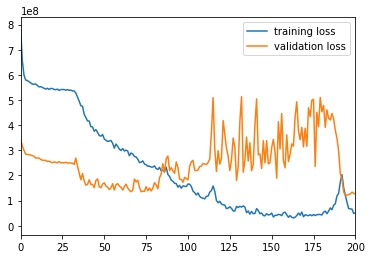

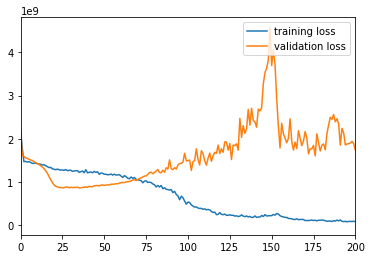

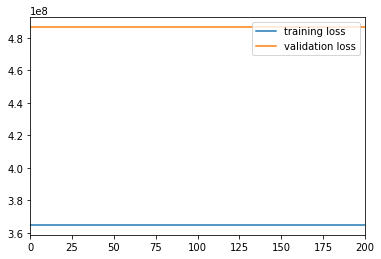

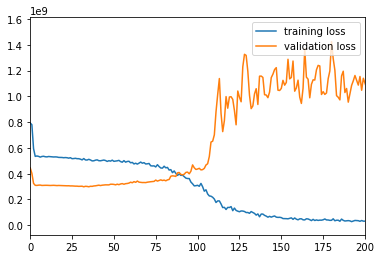

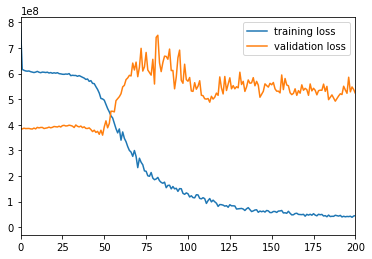

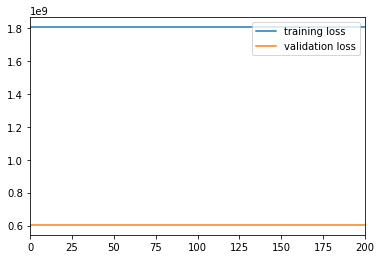

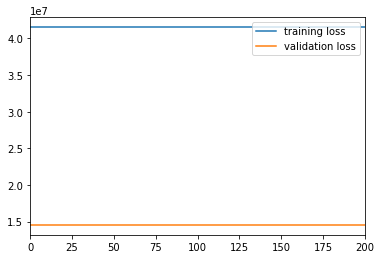

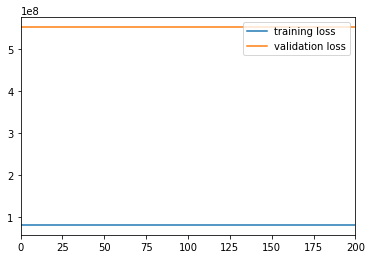

In [17]:
for c in train_loss_all.keys():
    plt.plot(np.arange(epochs),train_loss_all[c])
    plt.plot(np.arange(epochs),val_loss_all[c])
    # plt.ylim((0,0.01))
    plt.xlim((0,200))
    plt.legend(['training loss','validation loss'],loc='upper right')
    plt.savefig(os.path.join(plotsavepath,'loss_seed3_zoom_'+c+'.jpg'))
    plt.show()


In [6]:
# name='c13k20XA_07_dca'
# logsavepath='/mnt/xinyi/pamrats/log/train_gae_starmap/'+name
with open(os.path.join(logsavepath,'val_loss'), 'rb') as output:
    val_loss_all=pickle.load(output)
for c in val_loss_all.keys():
    print(c)
    print(np.argmin(val_loss_all[c]))

0.0
1409
1.0
35
2.0
0
3.0
32
4.0
49
5.0
0
6.0
0
7.0
0


In [6]:
def plotExprs(exprs,exprs2,savename,embedding,embedding2,savepath,savenameAdd='',norm=None):
#     fig, ax = plt.subplots(dpi=400)
    if not exprs is None:
        plt.scatter(embedding[:,0],embedding[:,1],s=5,c=exprs,cmap='Greys',edgecolors='blue',linewidth=0.2,alpha=1,marker='o',norm=norm)
    if not exprs2 is None:
        plt.scatter(embedding2[:,0],embedding2[:,1],s=5,c=exprs2,cmap='Greys',edgecolors='green',linewidth=0.2,alpha=1,marker='^',norm=norm)
    plt.colorbar(orientation='vertical', shrink = 0.5)
    plt.gca().set_aspect('equal', 'datalim')
#     fig.set_figheight(5)
#     fig.set_figwidth(5)
    plt.savefig(os.path.join(savepath,savename+savenameAdd+'.jpg'),dpi=400)
#     plt.show()
    
#     fig.clf()
    plt.close('all')

In [7]:
def plotExprsDiff(exprsPos,exprsNeg,exprs2,savename,embeddingPos,embeddingNeg,embedding2,savepath,savenameAdd='',norm=None):
#     fig, ax = plt.subplots(dpi=400)
    if not exprsPos is None:
        plt.scatter(embeddingPos[:,0],embeddingPos[:,1],s=5,c=exprsPos,cmap='Reds',edgecolors='blue',linewidth=0.2,alpha=1,marker='o',norm=norm)
        plt.colorbar(orientation='vertical', shrink = 0.5)
    if not exprsNeg is None:
        plt.scatter(embeddingNeg[:,0],embeddingNeg[:,1],s=5,c=exprsNeg,cmap=plt.cm.get_cmap('Blues'),edgecolors='blue',linewidth=0.2,alpha=1,marker='o',norm=norm)
        plt.colorbar(orientation='vertical', shrink = 0.5)
    if not exprs2 is None:
        plt.scatter(embedding2[:,0],embedding2[:,1],s=5,c=exprs2,cmap='Greys',edgecolors='green',linewidth=0.2,alpha=1,marker='^',norm=norm)
        plt.colorbar(orientation='vertical', shrink = 0.5)
    plt.gca().set_aspect('equal', 'datalim')
#     fig.set_figheight(5)
#     fig.set_figwidth(5)
    plt.savefig(os.path.join(savepath,savename+savenameAdd+'.jpg'),dpi=1200)
#     plt.show()
    
#     fig.clf()
    plt.close('all')

In [6]:
# lossCE_binary=torch.nn.CrossEntropyLoss(reduction='none')
savenameAdd='_thresh30'
# savenameAdd='_thresh4445'
lossThreshSize=30
def plotLoss(inputNp,labelsNp,coordNp,name,plotsavepath,savenameAdd=''):
    if not os.path.exists(plotsavepath):
        os.mkdir(plotsavepath)
    
    loss_test_all=np.zeros(inputNp.shape[0])
    loss_test_all_binary=np.zeros(inputNp.shape[0])
    loss_test_all_diff=np.zeros(inputNp.shape[0])
    for i in range(inputNp.shape[0]):
        testInput=inputNp[[i]]
        labels=labelsNp[[i]]
        if use_cuda:
            testInput=torch.tensor(testInput).cuda().float()
            labels=torch.tensor(labels).cuda().float()
        pred = model(testInput)
        loss_test_all[i]=lossCE(pred.flatten(),labels).item()
#         if pred[0]*labels[0]>0: 
        if labels[0]>0 and pred[0]>lossThreshSize:
            loss_test_all_binary[i]=0
#         elif pred[0]+labels[0]>0.001: #original
        elif pred[0]>lossThreshSize or labels[0]>0:
            loss_test_all_binary[i]=1
        else:
            loss_test_all_binary[i]=0
        loss_test_all_diff[i]=pred.flatten()[0]-labels[0]
        
    posidx=(labelsNp>0)
    negidx=labelsNp==0
    loss_test_posLoss=np.sum(loss_test_all[posidx])/np.sum(posidx)
    loss_test_negLoss=np.sum(loss_test_all[negidx])/np.sum(negidx)
    print(name+' results',
          'loss positive: {:.4f}'.format(loss_test_posLoss),
         'loss negative: {:.4f}'.format(loss_test_negLoss))
    
    largeridx=np.logical_and(posidx,loss_test_all_diff>=0)
    smalleridx=np.logical_and(posidx,loss_test_all_diff<0)
    if np.sum(largeridx)>0:
        fig, ax = plt.subplots(dpi=400)
        fig.set_figheight(2.5)
        fig.set_figwidth(10)
        plt.xscale('log')
        plt.hist(loss_test_all_diff[largeridx],bins=np.logspace(np.log10(np.min(loss_test_all_diff[largeridx])),np.log10(np.max(loss_test_all_diff[largeridx])),51))
        plt.savefig(os.path.join(plotsavepath,name+'loss'+s+'_diffHist_positiveLarger'+'.jpg'))
        plt.close()
    if np.sum(smalleridx)>0:
        fig, ax = plt.subplots(dpi=400)
        fig.set_figheight(2.5)
        fig.set_figwidth(10)
        plt.xscale('log')
        plt.hist(np.abs(loss_test_all_diff[smalleridx]),bins=np.logspace(np.log10(np.min(np.abs(loss_test_all_diff[smalleridx]))),np.log10(np.max(np.abs(loss_test_all_diff[smalleridx]))),51))
        plt.savefig(os.path.join(plotsavepath,name+'loss'+s+'_diffHist_positiveSmaller'+'.jpg'))
        plt.close()
    fig, ax = plt.subplots(dpi=400)
    fig.set_figheight(2.5)
    fig.set_figwidth(10)
    plt.xscale('log')
    plt.hist(loss_test_all_diff[negidx]+0.1,bins=np.logspace(np.log10(np.min(loss_test_all_diff[negidx]+0.1)),np.log10(np.max(loss_test_all_diff[negidx]+0.1)),51))
    plt.savefig(os.path.join(plotsavepath,name+'loss'+s+'_diffHist_negative'+'.jpg'))
    plt.close()
    
#     plotExprs(loss_test_all[posidx],loss_test_all[negidx]+0.1,name+'loss'+s,coordNp[posidx],coordNp[negidx],plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#     if np.sum(posidx)>0:
#         plotExprs(loss_test_all[posidx],None,name+'loss'+s+'_positive',coordNp[posidx],None,plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#     plotExprs(None,loss_test_all[negidx]+0.1,name+'loss'+s+'_negative',None,coordNp[negidx],plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())

#     if np.sum(posidx)>0:
#         if np.sum(largeridx)>0 and np.sum(smalleridx)>0:
#             plotExprsDiff(loss_test_all_diff[largeridx]+0.1,np.abs(loss_test_all_diff[smalleridx]),loss_test_all_diff[negidx]+0.1,name+'loss'+s+'_diff',coordNp[largeridx],coordNp[smalleridx],coordNp[negidx],plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#             plotExprsDiff(loss_test_all_diff[largeridx]+0.1,np.abs(loss_test_all_diff[smalleridx]),None,name+'loss'+s+'_diff_positive',coordNp[largeridx],coordNp[smalleridx],None,plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#             plotExprsDiff(np.abs(loss_test_all_diff[smalleridx]),loss_test_all_diff[largeridx]+0.1,loss_test_all_diff[negidx]+0.1,name+'loss'+s+'_diff2',coordNp[smalleridx],coordNp[largeridx],coordNp[negidx],plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#             plotExprsDiff(np.abs(loss_test_all_diff[smalleridx]),loss_test_all_diff[largeridx]+0.1,None,name+'loss'+s+'_diff2_positive',coordNp[smalleridx],coordNp[largeridx],None,plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#         elif np.sum(largeridx)>0:
#             plotExprsDiff(loss_test_all_diff[largeridx]+0.1,None,loss_test_all_diff[negidx]+0.1,name+'loss'+s+'_diff',coordNp[largeridx],coordNp[smalleridx],coordNp[negidx],plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#             plotExprsDiff(loss_test_all_diff[largeridx]+0.1,None,None,name+'loss'+s+'_diff_positive',coordNp[largeridx],None,None,plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#         elif np.sum(smalleridx)>0:
#             plotExprsDiff(None,np.abs(loss_test_all_diff[smalleridx]),loss_test_all_diff[negidx]+0.1,name+'loss'+s+'_diff',None,coordNp[smalleridx],coordNp[negidx],plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
#             plotExprsDiff(None,np.abs(loss_test_all_diff[smalleridx]),None,name+'loss'+s+'_diff_positive',None,coordNp[smalleridx],None,plotsavepath,savenameAdd=savenameAdd,norm=matplotlib.colors.LogNorm())
            
            
            
#     loss_test_posLoss_binary=np.sum(loss_test_all_binary[posidx])/np.sum(posidx)
#     loss_test_negLoss_binary=np.sum(loss_test_all_binary[negidx])/np.sum(negidx)
#     print(name+' results',
#           'loss positive binary: {:.4f}'.format(loss_test_posLoss_binary),
#          'loss negative binary: {:.4f}'.format(loss_test_negLoss_binary))
    
#     plotExprs(loss_test_all_binary[posidx],loss_test_all_binary[negidx],name+'loss'+s+'_binary',coordNp[posidx],coordNp[negidx],plotsavepath,savenameAdd=savenameAdd)
#     if np.sum(posidx)>0:
#         plotExprs(loss_test_all_binary[posidx],None,name+'loss'+s+'_positive'+'_binary',coordNp[posidx],None,plotsavepath,savenameAdd=savenameAdd)
#     plotExprs(None,loss_test_all_binary[negidx],name+'loss'+s+'_negative'+'_binary',None,coordNp[negidx],plotsavepath,savenameAdd=savenameAdd)

    
testepochAll={'0.0':1410,'1.0':40,'2.0':0,'3.0':30,'4.0':50,'5.0':0,'6.0':0,'7.0':0}

for s in sampleidx.keys():
    if s in ['disease13','control13','disease8']:
        continue
    print(s)
    if 'disease' in s:
        trainInputAll, valInputAll,testInputAll,trainLabelsAll,valLabelsAll,testLabelsAll,trainCoordAll,valCoordAll,testCoordAll,trainClusterAll,valClusterAll,testClusterAll=loadImage.loadandsplitPlaque_overlap_regrs_cellCluster(gaeclusterlabels[sampleNames==s],gaeCoord[sampleNames==s],minPt,plaqueMaskImg,plaqueSizeFactor,areaThresh,plaqueCentroids[s][['Y','X']].to_numpy().astype(int),plaqueCutoffRadius,sampleidx[s],datadir,diamThresh_mul,overlap,valNodes,testNodes,ifFlip=False,minCutoff=minThresh_mul,seed=seed,returnPos=True)
    if 'control' in s:
        trainInputAll, valInputAll,testInputAll,trainLabelsAll,valLabelsAll,testLabelsAll,trainCoordAll,valCoordAll,testCoordAll,trainClusterAll,valClusterAll,testClusterAll=loadImage.loadandsplit_cellCluster(gaeclusterlabels[sampleNames==s],gaeCoord[sampleNames==s],minPt,sampleidx[s],datadir,diamThresh_mul,overlap,valNodes,testNodes,ifFlip=False,minCutoff=minThresh_mul,seed=seed,clf=True,returnPos=True)

    
    for c in testepochAll.keys():
        print(c)
        testepoch=testepochAll[c]
        # Create model
        if model_str=='alexnet':
            model = modelsCNN.AlexNet(2)
            lossCE=torch.nn.CrossEntropyLoss(torch.tensor([negweight,posweight]).cuda().float())
        if model_str=='alexnet_regrs':
            model = modelsCNN.AlexNet(1,regrs=True)
            lossCE=torch.nn.MSELoss(reduction='none')
        if use_cuda:
            model.cuda()
        
        model.load_state_dict(torch.load(os.path.join(modelsavepath,c,str(testepoch)+'.pt')))
        model.eval()
        plotepoch='epoch'+str(testepoch)
        plotepoch+=savenameAdd
    
    
        cidx=trainClusterAll==float(c)
        trainInputnp=trainInputAll[cidx]
        trainLabelsnp=trainLabelsAll[cidx]
        trainCoordnp=trainCoordAll[cidx]
        vidx=valClusterAll==float(c)
        valInputnp=valInputAll[vidx]
        valLabelsnp=valLabelsAll[vidx]
        valCoordnp=valCoordAll[vidx]
        tidx=testClusterAll==float(c)
        testInputnp=testInputAll[tidx]
        testLabelsnp=testLabelsAll[tidx]
        testCoordnp=testCoordAll[tidx]
        
        plotLoss(testInputnp,testLabelsnp,testCoordnp,'test',os.path.join(plotsavepath,c),plotepoch)
        plotLoss(trainInputnp,trainLabelsnp,trainCoordnp,'train',os.path.join(plotsavepath,c),plotepoch)
        plotLoss(valInputnp,valLabelsnp,valCoordnp,'val',os.path.join(plotsavepath,c),plotepoch)
        plotLoss(np.concatenate((trainInputnp,valInputnp,testInputnp),axis=0),np.concatenate((trainLabelsnp,valLabelsnp,testLabelsnp)),np.concatenate((trainCoordnp,valCoordnp,testCoordnp),axis=0),'all',os.path.join(plotsavepath,c),plotepoch)
    
    trainInputnp, valInputnp, testInputnp, trainLabelsnp,valLabelsnp,testLabelsnp,trainCoordnp,valCoordnp,testCoordnp,trainClusterAll,valClusterAll,testClusterAll=None,None,None,None,None,None,None,None,None,None,None,None

control8
(22452, 19616)
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
no cells
0.0


<ipython-input-6-fa2c4ec8d03a>:32: RuntimeWarning: invalid value encountered in double_scalars
  loss_test_posLoss=np.sum(loss_test_all[posidx])/np.sum(posidx)


test results loss positive: nan loss negative: 40384276.5957
train results loss positive: nan loss negative: 35844238.4532
val results loss positive: nan loss negative: 30057385.5964
all results loss positive: nan loss negative: 36001987.9263
1.0
test results loss positive: nan loss negative: 787417227.6231
train results loss positive: nan loss negative: 594597440.9144
val results loss positive: nan loss negative: 679492245.4138
all results loss positive: nan loss negative: 616361207.9196
2.0
test results loss positive: nan loss negative: 0.0000
train results loss positive: nan loss negative: 0.0000
val results loss positive: nan loss negative: 0.0000
all results loss positive: nan loss negative: 0.0000
3.0
test results loss positive: nan loss negative: 149819348.9924
train results loss positive: nan loss negative: 142649184.0786
val results loss positive: nan loss negative: 145354732.9677
all results loss positive: nan loss negative: 143568495.7946
4.0
test results loss positive: nan 

(array([ 1.,  1.,  1.,  3.,  3.,  6., 10., 14., 24., 37.]),
 array([  10.        ,   15.84893192,   25.11886432,   39.81071706,
          63.09573445,  100.        ,  158.48931925,  251.18864315,
         398.10717055,  630.95734448, 1000.        ]),
 <BarContainer object of 10 artists>)

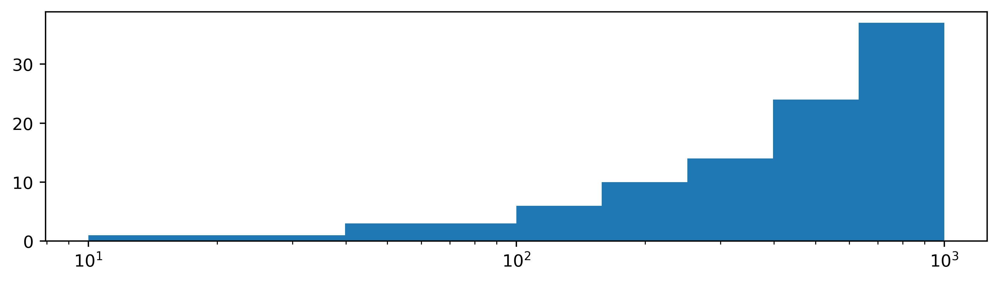

In [7]:
fig, ax = plt.subplots(dpi=400)
fig.set_figheight(2.5)
fig.set_figwidth(10)
plt.xscale('log')
test=(np.arange(100)+1)*10
plt.hist(test,bins=np.logspace(np.log10(np.min(test)),np.log10(np.max(test)),11))

In [7]:
train1,test1,train2,test2=train_test_split(np.arange(20),np.arange(20),test_size=0.5, random_state=3, shuffle=True)
train1

array([ 9, 11, 19, 18, 13,  5,  0,  8,  3, 10])